In [1]:
library(dplyr)
library(pheatmap)
options(stringsAsFactors = FALSE)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [2]:
##load cell pairs
pairs=scan('/Users/marygordon/Documents/YeLab/Lupus/phen_pairs.txt',what=character())
print(pairs)

#load eqtl annotations
eqtls=as.data.frame(read.table('/Users/marygordon/Documents/YeLab/Lupus/eqtl.annotation.txt',header=TRUE,sep='\t'))
#remove any genes without an eQTL in any cell
count_eqtls=as.data.frame(rowSums(eqtls))
count_eqtls$gene=rownames(count_eqtls)
colnames(count_eqtls)=c('count','gene')
filtered_counts=filter(count_eqtls,count!=0)
#head(count_eqtls)
#head(filtered_counts)
eqtls$gene=rownames(eqtls)
filtered_eqtls=subset(eqtls, gene %in% as.character(filtered_counts$gene))
#head(filtered_eqtls)


#dim(eqtls)
#dim(filtered_eqtls)

 [1] "B.cells_CD14+.Monocytes"           "B.cells_CD4.T.cells"              
 [3] "B.cells_CD8.T.cells"               "B.cells_Dendritic.cells"          
 [5] "B.cells_FCGR3A+.Monocytes"         "B.cells_Megakaryocytes"           
 [7] "B.cells_NK.cells"                  "B.cells_PBMC"                     
 [9] "CD14+.Monocytes_CD4.T.cells"       "CD14+.Monocytes_CD8.T.cells"      
[11] "CD14+.Monocytes_Dendritic.cells"   "CD14+.Monocytes_FCGR3A+.Monocytes"
[13] "CD14+.Monocytes_Megakaryocytes"    "CD14+.Monocytes_NK.cells"         
[15] "CD14+.Monocytes_PBMC"              "CD4.T.cells_CD8.T.cells"          
[17] "CD4.T.cells_Dendritic.cells"       "CD4.T.cells_FCGR3A+.Monocytes"    
[19] "CD4.T.cells_Megakaryocytes"        "CD4.T.cells_NK.cells"             
[21] "CD4.T.cells_PBMC"                  "CD8.T.cells_Dendritic.cells"      
[23] "CD8.T.cells_FCGR3A+.Monocytes"     "CD8.T.cells_Megakaryocytes"       
[25] "CD8.T.cells_NK.cells"              "CD8.T.cells_PBMC"                 

In [3]:
gcta_std_full_1=as.data.frame(read.table('',header=TRUE,sep='\t'))
#head(gcta_std_full)

gcta_std_full=as.data.frame(filter(gcta_std_full_1,cell!="cell"))
head(gcta_std_full)
gcta_std_full_1=c()
gcta_std=as.data.frame(cbind((gcta_std_full$cell),(gcta_std_full$gene),(gcta_std_full$Var_V.G._tr1),(gcta_std_full$SE_V.G._tr1),(gcta_std_full$Var_V.G._tr2),(gcta_std_full$SE_V.G._tr2),(gcta_std_full$Var_rG),(gcta_std_full$Var_C.e._tr12),(gcta_std_full$SE_rG)))
#gcta_std=as.data.frame(cbind(as.character(gcta_std_full$cell),as.character(gcta_std_full$gene),as.numeric(gcta_std_full$Var_V.G._tr1),as.numeric(gcta_std_full$SE_V.G._tr1),as.numeric(gcta_std_full$Var_V.G._tr2),as.numeric(gcta_std_full$SE_V.G._tr2),as.numeric(gcta_std_full$Var_rG),as.numeric(gcta_std_full$Var_C.e._tr12)))


gcta_header=c('cell_pair','gene','sg1','se1','sg2','se2','rg','re','rg_se')
colnames(gcta_std)=gcta_header
head(gcta_std)
dim(gcta_std)

cell,gene,Var_V.G._tr1,Var_V.G._tr2,Var_C.G._tr12,Var_V.e._tr1,Var_V.e._tr2,Var_C.e._tr12,Var_Vp_tr1,Var_Vp_tr2,⋯,SE_V.G._tr2,SE_C.G._tr12,SE_V.e._tr1,SE_V.e._tr2,SE_C.e._tr12,SE_Vp_tr1,SE_Vp_tr2,SE_V.G..Vp_tr1,SE_V.G..Vp_tr2,SE_rG
B.cells_CD14+.Monocytes,ABCB10,0.002957,0.000007,-0.000146,0.041115,0.043139,0.008166,0.044072,0.043146,⋯,0.002582,0.002264,0.006238,0.006274,0.004502,0.005859,0.005690,0.085747,0.059842,182.491092
B.cells_CD14+.Monocytes,ABCD3,0.000698,0.001130,0.000888,0.073929,0.031762,0.003032,0.074627,0.032892,⋯,0.002709,0.002737,0.011220,0.004926,0.005273,0.009843,0.004339,0.072138,0.082121,4.336634
B.cells_CD14+.Monocytes,ABL2,0.000074,0.000066,-0.000070,0.052068,0.047185,0.009747,0.052142,0.047251,⋯,0.002058,0.001551,0.007261,0.006579,0.004980,0.006877,0.006231,0.043568,0.043547,36.183240
B.cells_CD14+.Monocytes,ACADM,0.000000,0.000000,0.000000,0.091671,0.044968,0.037926,0.091671,0.044968,⋯,0.001452,0.001702,0.012572,0.006167,0.007231,0.012099,0.005935,0.032281,0.032282,37610.007114
B.cells_CD14+.Monocytes,ACAP3,0.000907,0.002277,0.001437,0.072807,0.030653,-0.003403,0.073714,0.032930,⋯,0.002779,0.002443,0.010505,0.004659,0.004952,0.009722,0.004366,0.055814,0.082950,2.412680
B.cells_CD14+.Monocytes,ACBD3,0.006643,0.015793,0.001175,0.117061,0.045993,0.044673,0.123703,0.061787,⋯,0.008542,0.007283,0.018080,0.007887,0.009732,0.016352,0.008765,0.084632,0.120675,0.655568


cell_pair,gene,sg1,se1,sg2,se2,rg,re,rg_se
B.cells_CD14+.Monocytes,ABCB10,0.002957,0.003849,7e-06,0.002582,-1,0.008166,182.491092
B.cells_CD14+.Monocytes,ABCD3,0.000698,0.005383,0.00113,0.002709,1,0.003032,4.336634
B.cells_CD14+.Monocytes,ABL2,7.4e-05,0.002272,6.6e-05,0.002058,-1,0.009747,36.18324
B.cells_CD14+.Monocytes,ACADM,0,0.002959,0,0.001452,-1,0.037926,37610.007114
B.cells_CD14+.Monocytes,ACAP3,0.000907,0.004114,0.002277,0.002779,1,-0.003403,2.41268
B.cells_CD14+.Monocytes,ACBD3,0.006643,0.010566,0.015793,0.008542,0.114694,0.044673,0.655568


[1] 272227      9

In [4]:
#filter for one celltype
cell_type_filter<-function(std_df,celltype){
    f_std_df=filter(std_df,cell_pair==celltype)
    #head(f_std_df)
    
    return(f_std_df) 
}


In [5]:
#print simple stats of a vector
print_stats<-function(vect,label){
    print(label)
    print(c('min',min(as.numeric(vect))))
    print(c('max',max(as.numeric(vect))))
    print(c('mean',mean(as.numeric(vect))))
    print(c('median',median(as.numeric(vect))))
    print(c('var',var(as.numeric(vect))))
    print(c('in 0,1 range', sum(as.numeric(vect) >= 0 & as.numeric(vect)<=1), 'of',(length(as.numeric(vect)))))
    
}

In [6]:
#merge
merge_eqtl_annots<-function(std_df, eqtl_annot){
    merged=merge(std_df,eqtl_annot,by="gene")
    return(merged)
}


In [7]:
#merge
merge_eqtl_annots<-function(std_df, eqtl_annot){
    merged=merge(std_df,eqtl_annot,by="gene")
    return(merged)
}


In [8]:
#plot scatter plots and histograms
plot_scatter_hist<-function(df, title){
    #print out some stats to start
    all_rG_rE=as.numeric(df$rg)+as.numeric(df$re)
    print_stats(df$rg,"rG info")
    print_stats(df$re,"rE info")
    print_stats(all_rG_rE,"summary stats rG+rE")
    
    #plot overall 1)rG vs rE scatter 2)hist rG+rE 3)variance weighted of 1 and 2
    #rG vs rE scatter
    print(plot(df$rg, df$re, xlab="rG",ylab="rE",main=paste(title,cor(as.numeric(df$rg),as.numeric(df$re)))))
    
    #hist rG+rE
    hist(all_rG_rE,breaks=10000,main=paste(title))

}

In [9]:
#filter output file by standard errors for trait 1 and trait 2
filter_std_err<-function(df,se_filter){
    tmp1=as.data.frame(filter(df,se1<se_filter))
    tmp2=as.data.frame(filter(tmp1,se2<se_filter))
    return(tmp2)
}


In [10]:
#filter gcta output rg SE
filter_std_err_rg<-function(df,se_filter){
    tmp1=as.data.frame(filter(df,rg_se<se_filter))
    
    return(tmp1)
}


In [11]:
#for each pair plot 1)rG vs rE scatter 2)hist rG+rE 3)variance weighted of 1 and 2
plot_cell_cell_scatter_hist<-function(df,se_filt,cell){
    avg_rG=c()
    avg_rG_w=c()
    avg_rE=c()
    avg_rE_w=c()
    var_rG=c()
    var_rE=c()
    avg_rG_FW=c()
    avg_rE_FW=c()
    
    
    df_tmp=filter_std_err(as.data.frame(filter(df,cell_pair==as.character(cell))),se_filt)
    print(head(df_tmp))
    plot_scatter_hist(df_tmp,paste(cell,"rG vs rE"))
    avg_rG=mean(as.numeric(df_tmp$rg))
    #avg_rG_w=c(avg_rG_w,median(as.numeric(inv_tmp$rg)))
    avg_rE=mean(as.numeric(df_tmp$re))
    #avg_rE_w=c(avg_rE_w,median(as.numeric(inv_tmp$re)))
    var_rG=var(as.numeric(df_tmp$rg))
    var_rE=var(as.numeric(df_tmp$re))
    all_avgs=as.data.frame((cbind(cell,avg_rG,var_rG,avg_rE,var_rE,(as.numeric(avg_rG)+as.numeric(avg_rE)))))
    
   
    return(all_avgs)
}


   gene               cell_pair      sg1      se1      sg2      se2       rg
1  A1BG B.cells_CD14+.Monocytes  0.01517 0.009632 0.028167 0.016146  0.75935
2 AAED1 B.cells_CD14+.Monocytes 0.007936 0.010167 0.001736 0.002607 0.786901
3 AAGAB B.cells_CD14+.Monocytes 0.003933 0.004815 0.012858 0.006287 0.773954
4 AASDH B.cells_CD14+.Monocytes 0.000191 0.004039 0.002972 0.003821       -1
5  ABAT B.cells_CD14+.Monocytes 0.010254 0.007361   0.0072 0.006157  0.92917
6 ABCA1 B.cells_CD14+.Monocytes 0.013921 0.011571 0.002287   0.0099        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.041462  0.212675               0           1                 1
2 0.034356  0.520903               0           0                 0
3 0.002871  0.476399               0           0                 0
4 0.016548 12.084689               0           0                 1
5 0.005954  0.382239               0           0                 1
6 0.028655   1.78687               0           0           

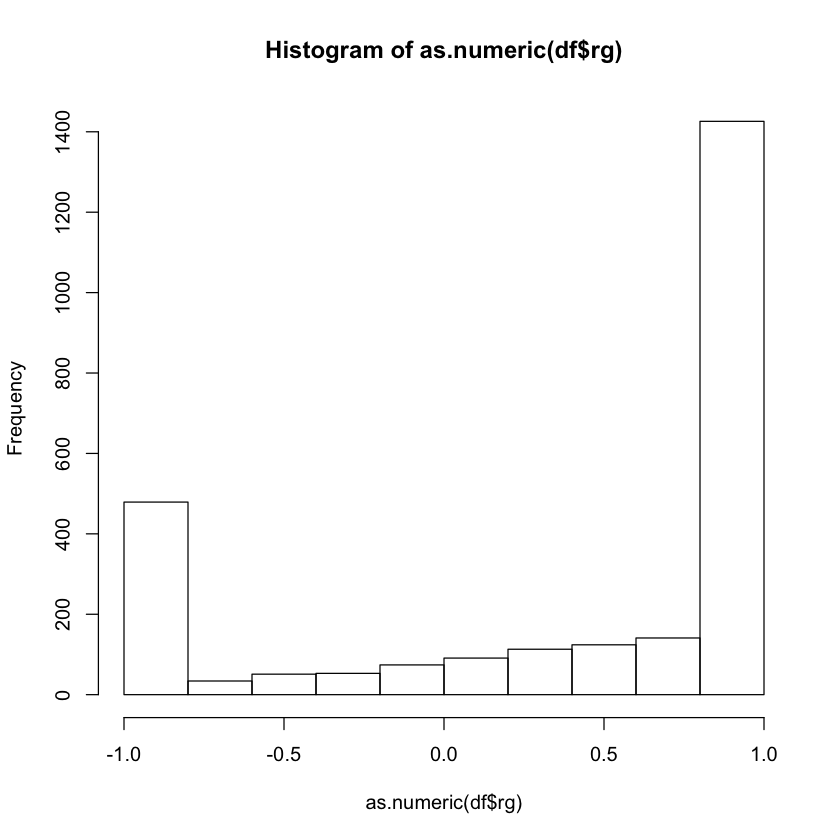

NULL


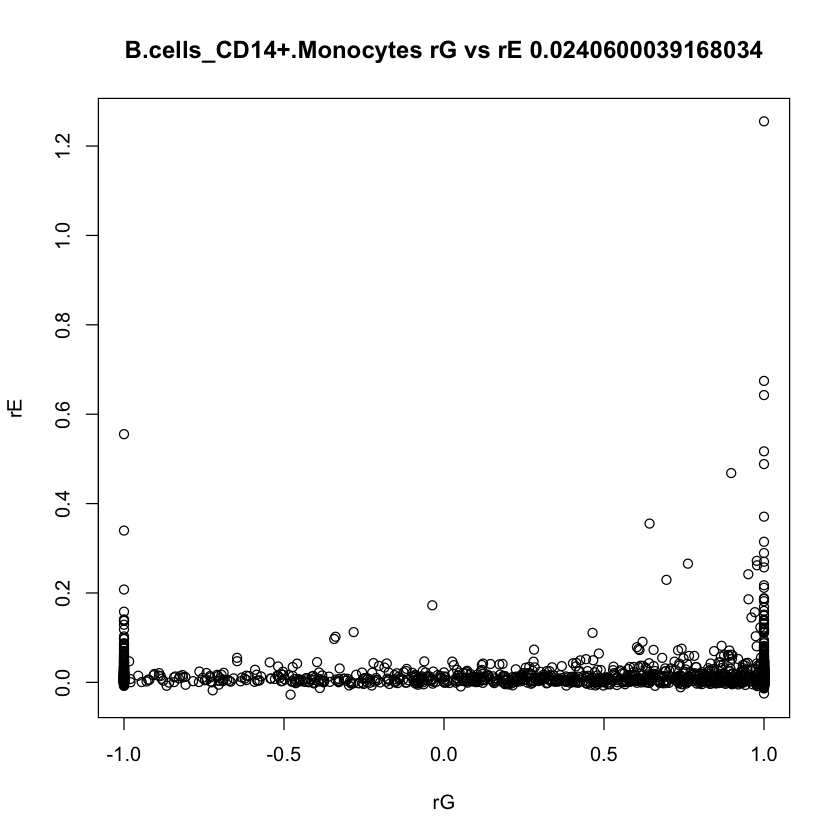

cell,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.411585362048894,0.610182900738897,0.016908299185099,0.00214383351745199,0.428493661233993


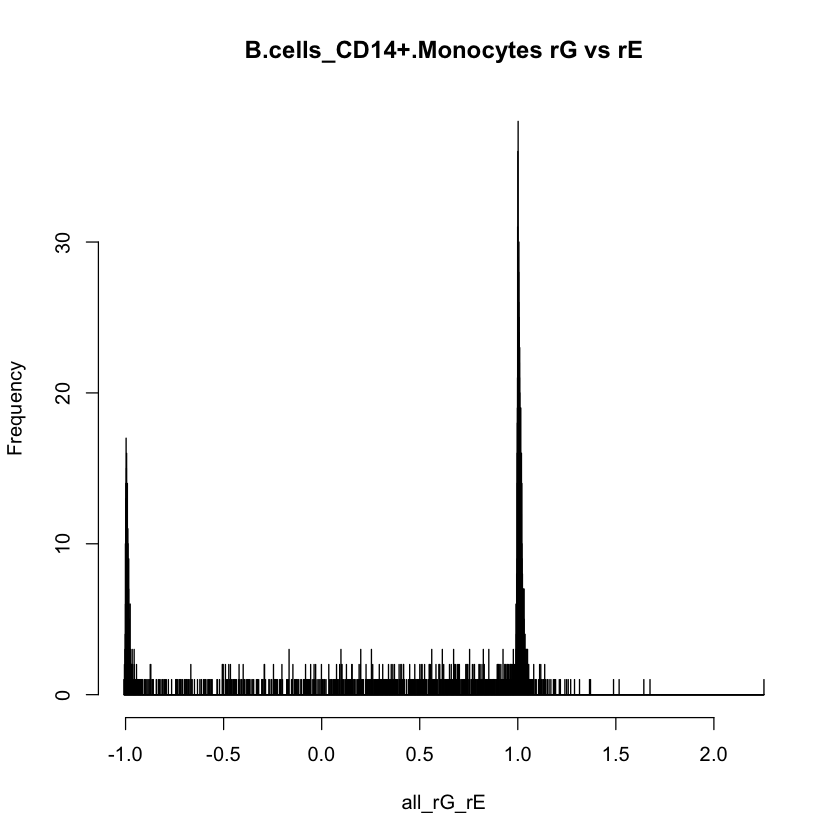

In [12]:
se=2
cell="B.cells_CD14+.Monocytes"
outdf=cell_type_filter(gcta_std,cell)
df_eqtls=merge_eqtl_annots(outdf,filtered_eqtls)
df=filter_std_err_rg(df_eqtls,se)
hist(as.numeric(df$rg))
temp_gcta_outs=plot_cell_cell_scatter_hist(df,se,cell)
head(temp_gcta_outs)

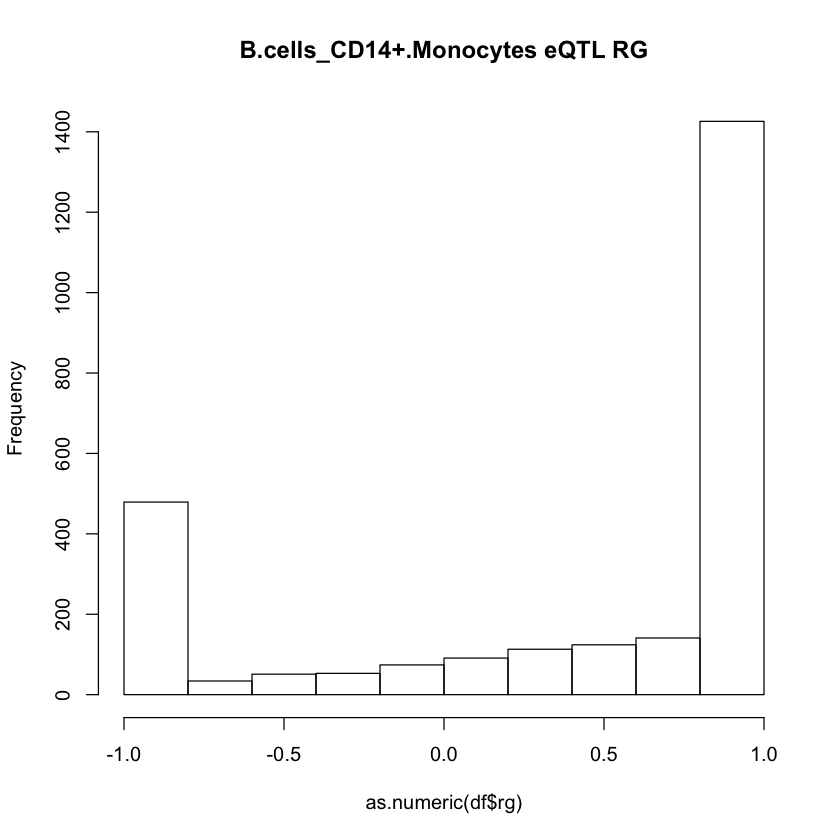

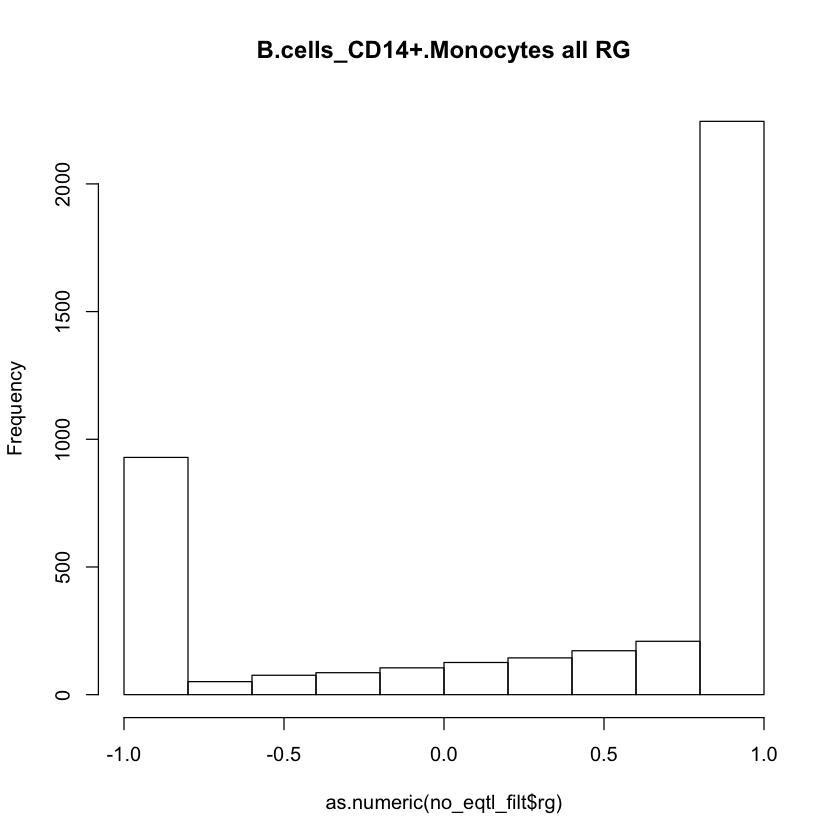

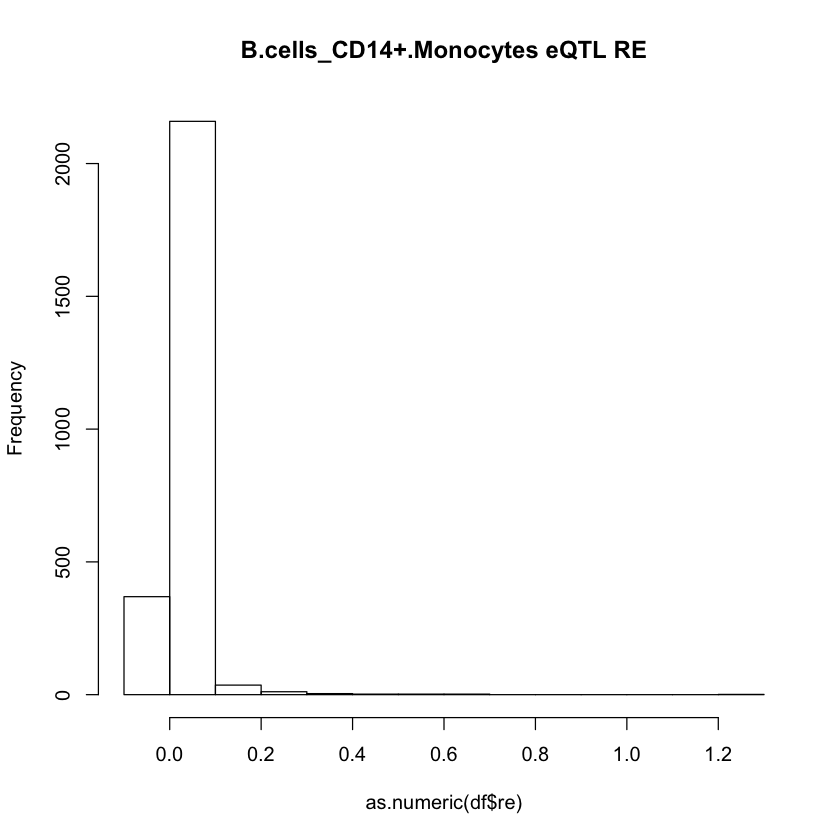

   gene               cell_pair      sg1      se1      sg2      se2       rg
1  A1BG B.cells_CD14+.Monocytes  0.01517 0.009632 0.028167 0.016146  0.75935
2 AAED1 B.cells_CD14+.Monocytes 0.007936 0.010167 0.001736 0.002607 0.786901
3 AAGAB B.cells_CD14+.Monocytes 0.003933 0.004815 0.012858 0.006287 0.773954
4 AASDH B.cells_CD14+.Monocytes 0.000191 0.004039 0.002972 0.003821       -1
5  ABAT B.cells_CD14+.Monocytes 0.010254 0.007361   0.0072 0.006157  0.92917
6 ABCA1 B.cells_CD14+.Monocytes 0.013921 0.011571 0.002287   0.0099        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.041462  0.212675               0           1                 1
2 0.034356  0.520903               0           0                 0
3 0.002871  0.476399               0           0                 0
4 0.016548 12.084689               0           0                 1
5 0.005954  0.382239               0           0                 1
6 0.028655   1.78687               0           0           

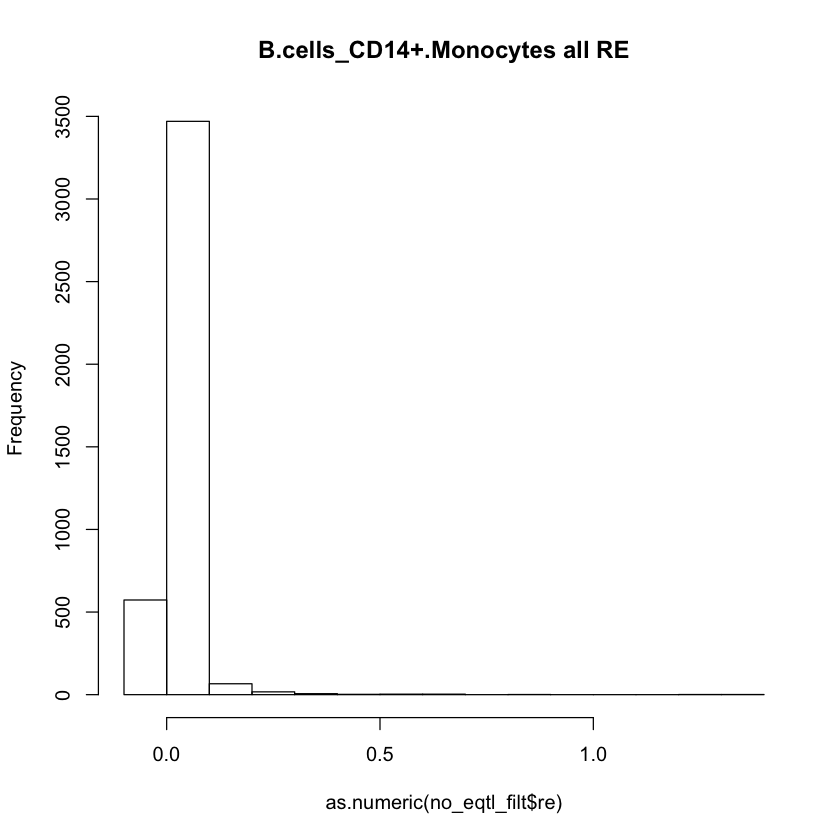

NULL


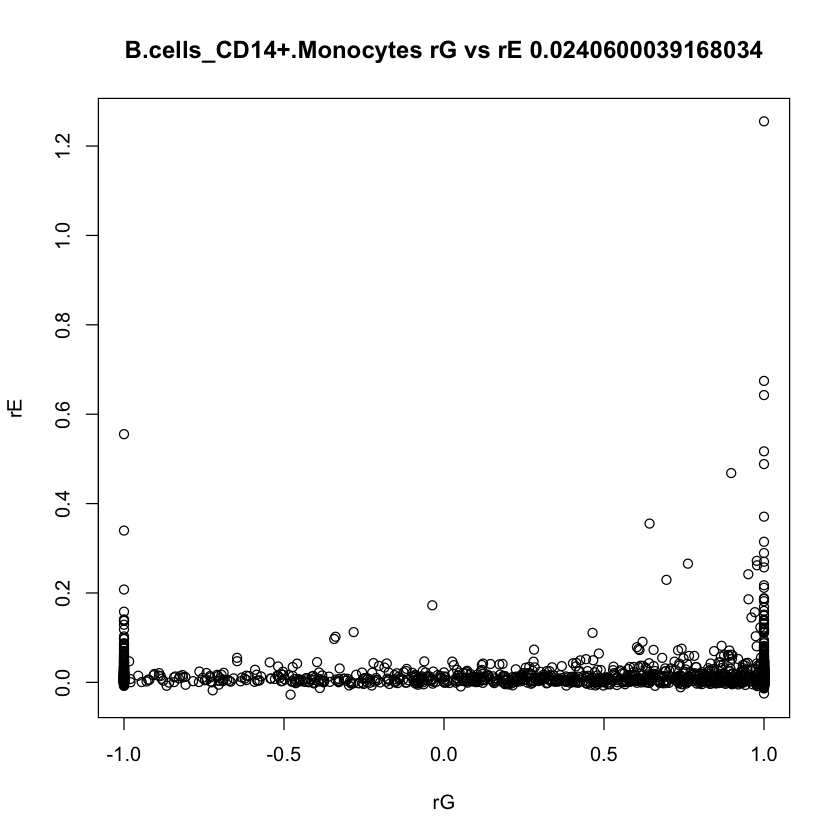

                cell_pair     gene      sg1      se1      sg2      se2
1 B.cells_CD14+.Monocytes   ABCB10 0.002957 0.003849    7e-06 0.002582
2 B.cells_CD14+.Monocytes    ACBD3 0.006643 0.010566 0.015793 0.008542
3 B.cells_CD14+.Monocytes   ADAM15 0.000972 0.002715 0.005964 0.004883
4 B.cells_CD14+.Monocytes ADAMTSL4  0.00091 0.001027 0.001875 0.002663
5 B.cells_CD14+.Monocytes     ADAR 0.018578 0.013146 0.009543 0.007731
6 B.cells_CD14+.Monocytes     AGO3 0.001438 0.002894 0.000983 0.001575
         rg        re      rg_se
1        -1  0.008166 182.491092
2  0.114694  0.044673   0.655568
3 -0.338779  0.005994   1.167679
4        -1 -0.001432   0.588608
5  0.865046  0.057786   0.164612
6         1   0.00554   0.860126
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.356160905939394"
[1] "median"   "0.935062"
[1] "var"              "0.67808661161935"
[1] "in 0,1 range" "2883"         "of"           "4125"        
[1] "rE info"
[1] "min"       "-0.027531"
[1] "max

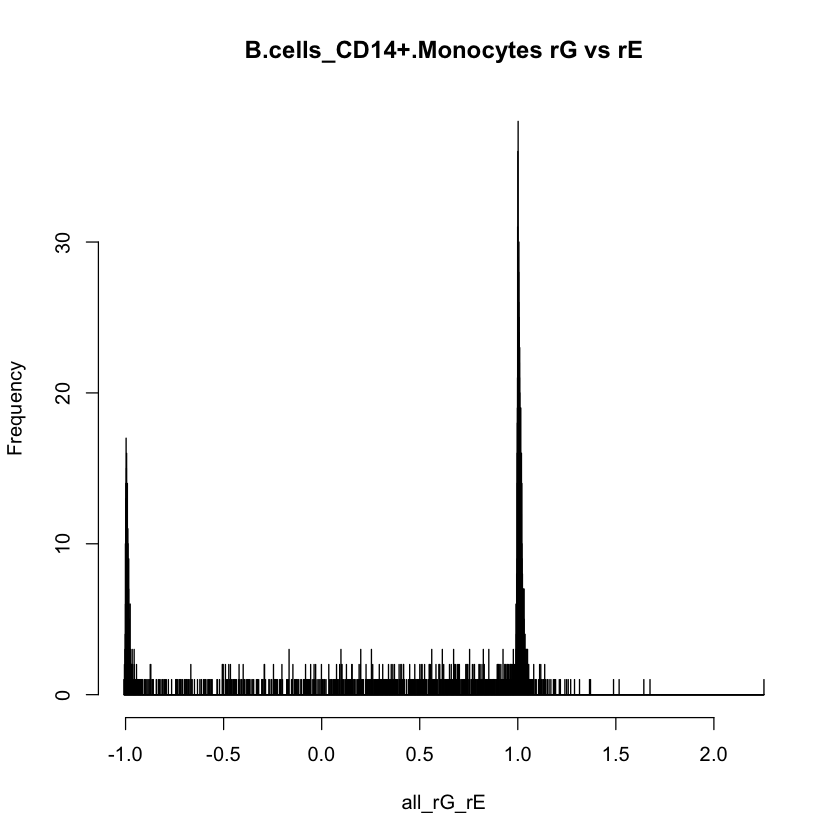

NULL


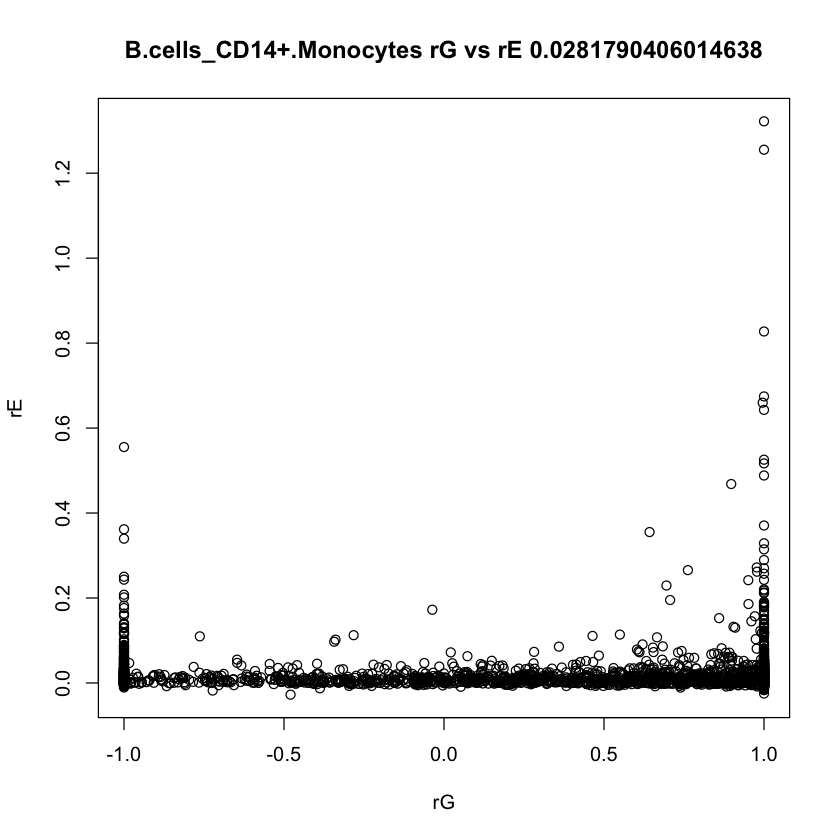

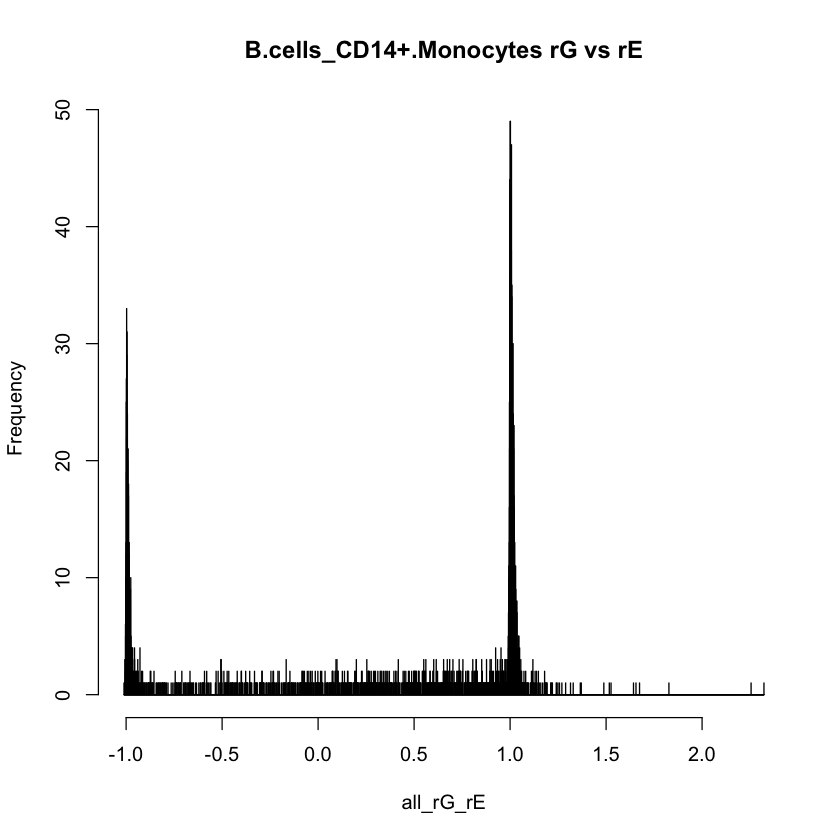

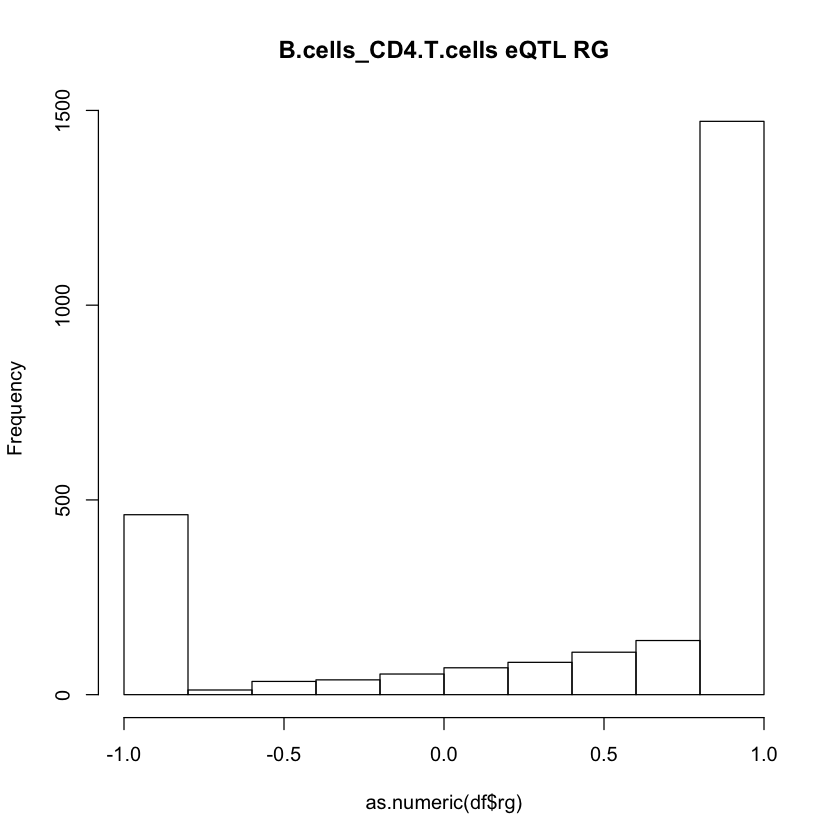

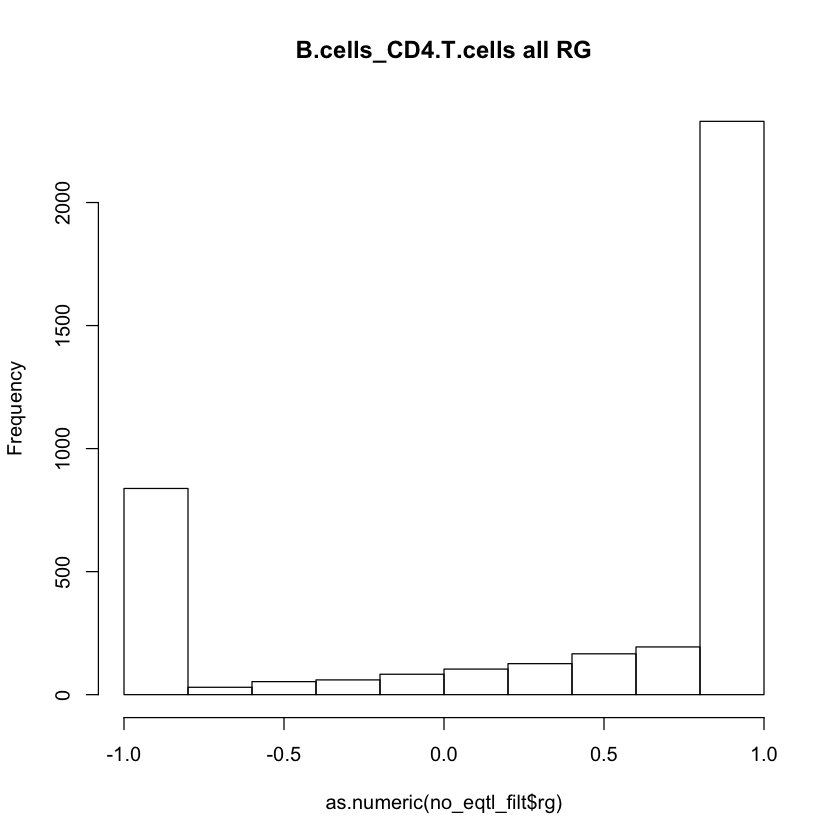

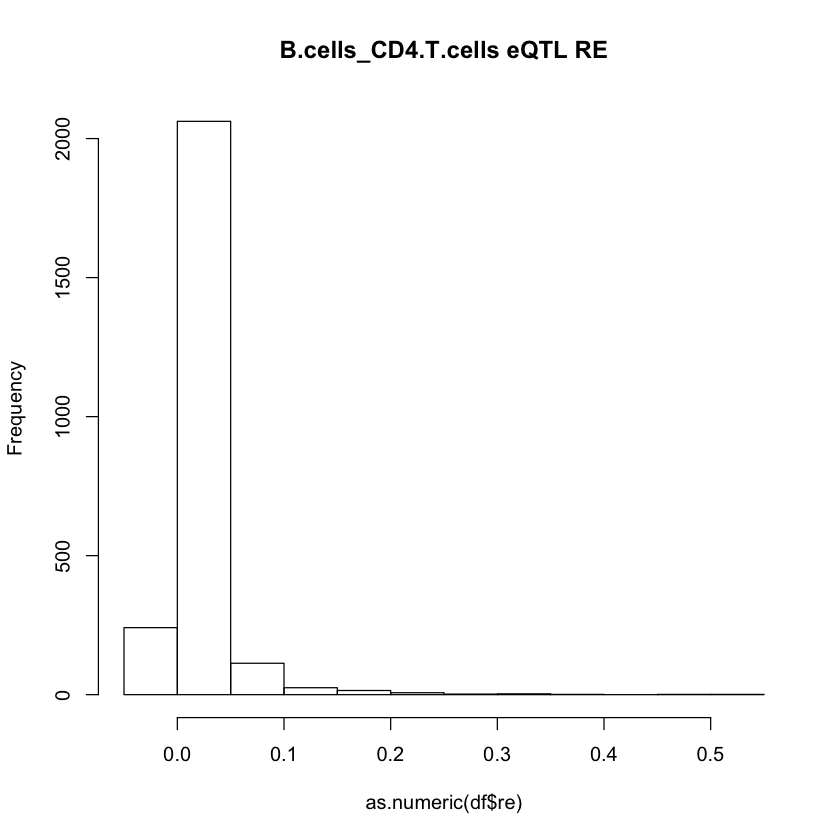

     gene           cell_pair      sg1      se1      sg2      se2       rg
1    A1BG B.cells_CD4.T.cells 0.016311 0.010072 0.001598 0.003596 0.603306
2 A2M-AS1 B.cells_CD4.T.cells 0.000274 0.001047 0.052791 0.026402        1
3   AAED1 B.cells_CD4.T.cells 0.007212 0.009602 0.004606 0.005705        1
4   AAGAB B.cells_CD4.T.cells 0.005017  0.00525 0.003337 0.003344        1
5    AATF B.cells_CD4.T.cells 0.003747 0.004596 0.002185 0.002133 0.354125
6    ABAT B.cells_CD4.T.cells  0.00944 0.007304  8.4e-05 0.002188        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.021075  0.745422               0           1                 1
2 0.013541  1.560924               0           1                 0
3 0.040091  0.388019               0           0                 0
4  0.00202  0.538612               0           0                 0
5 0.000523  0.752856               1           0                 0
6 0.005594 12.513827               0           0                 1
  Mega

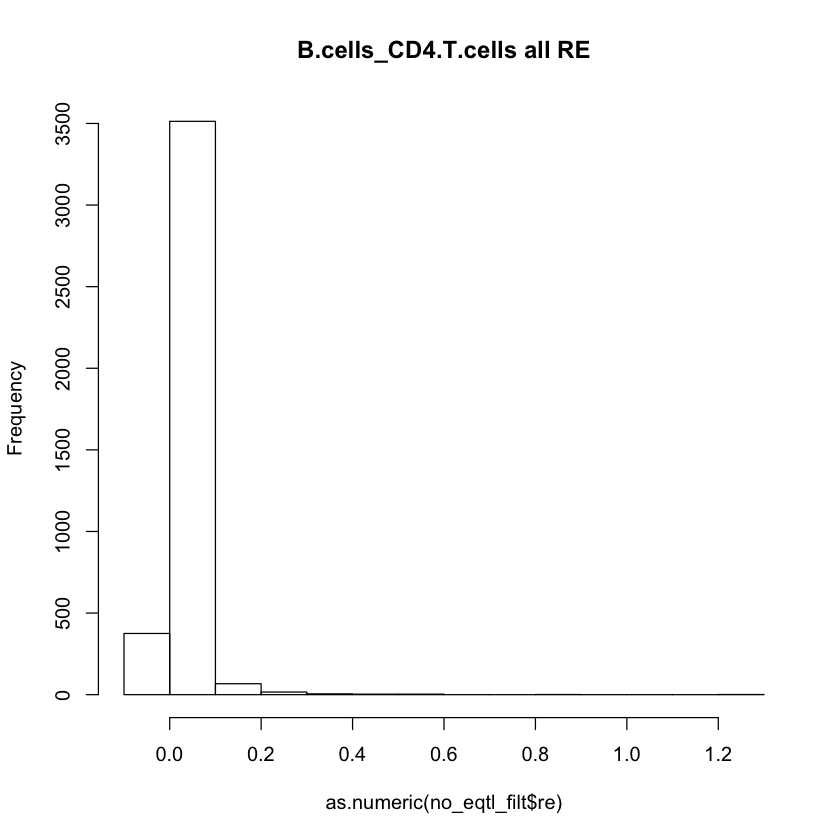

NULL


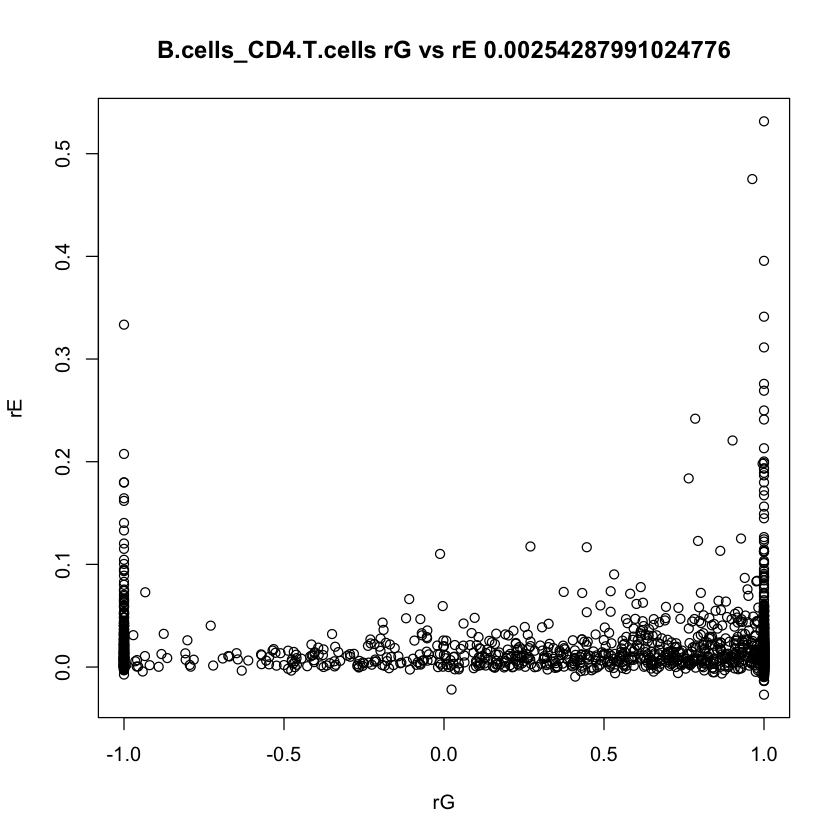

            cell_pair   gene      sg1      se1      sg2      se2        rg
1 B.cells_CD4.T.cells ABCB10 0.003178  0.00391 0.001242 0.003007         1
2 B.cells_CD4.T.cells  ABCD3 0.000194  0.00514 0.000287  0.00245         1
3 B.cells_CD4.T.cells  ACADM 0.000167 0.003091 0.000212  0.00132        -1
4 B.cells_CD4.T.cells   ACP6 0.000391 0.001271 0.001231 0.002261         1
5 B.cells_CD4.T.cells ADAM15 0.000852 0.002631 0.004436 0.004306 -0.366351
6 B.cells_CD4.T.cells   ADAR 0.021729 0.014071 0.005846 0.005266  0.865639
        re     rg_se
1 0.003695  1.249556
2 0.009614  14.22674
3 0.030512 16.860578
4 0.001274  1.882731
5 0.001511   1.28598
6 0.055443  0.151699
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.420126084173387"
[1] "median" "1"     
[1] "var"               "0.653295803336755"
[1] "in 0,1 range" "2912"         "of"           "3968"        
[1] "rE info"
[1] "min"       "-0.026904"
[1] "max"     "1.28334"
[1] "mean"               "0.01996771925403

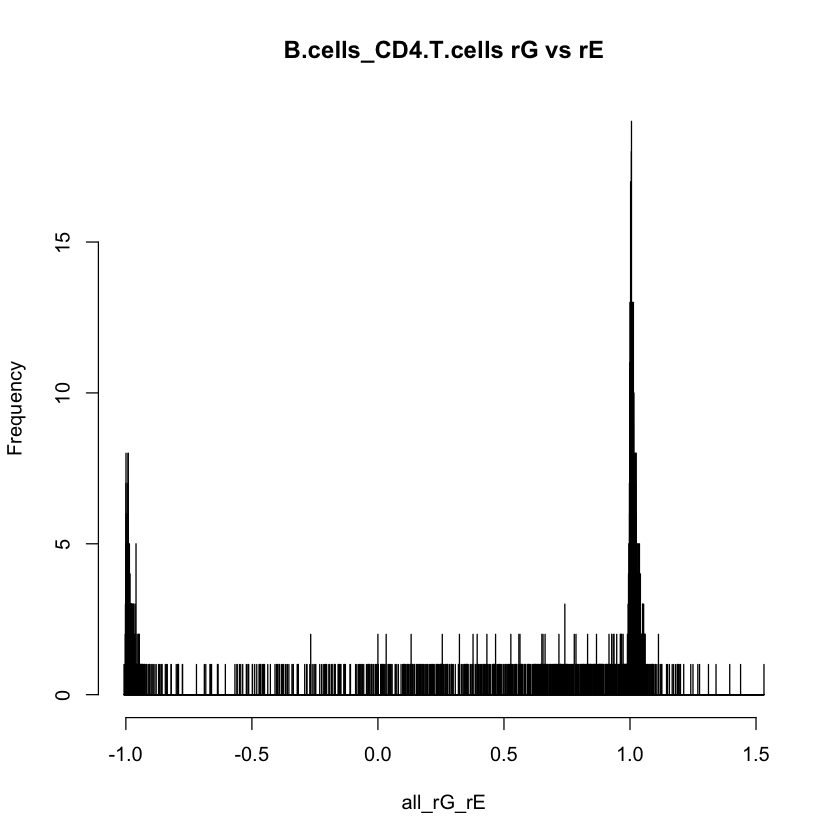

NULL


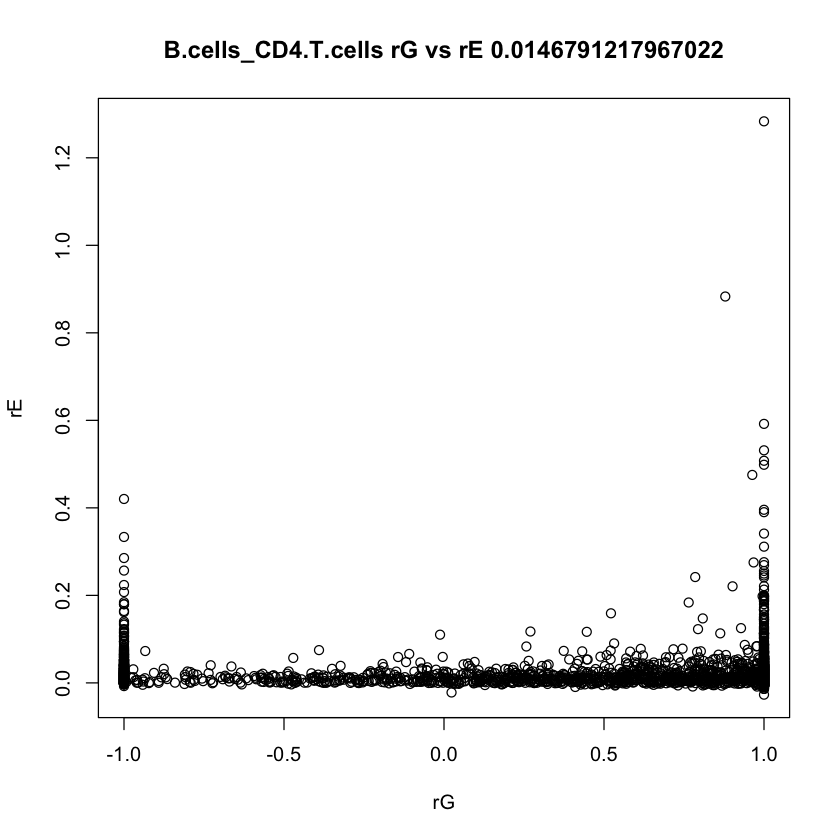

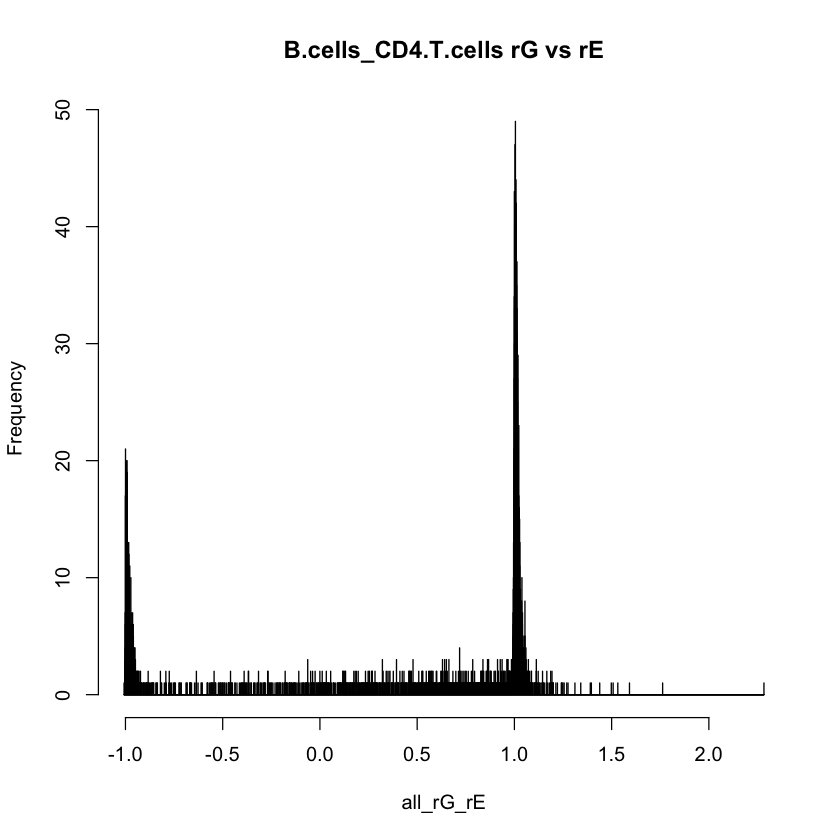

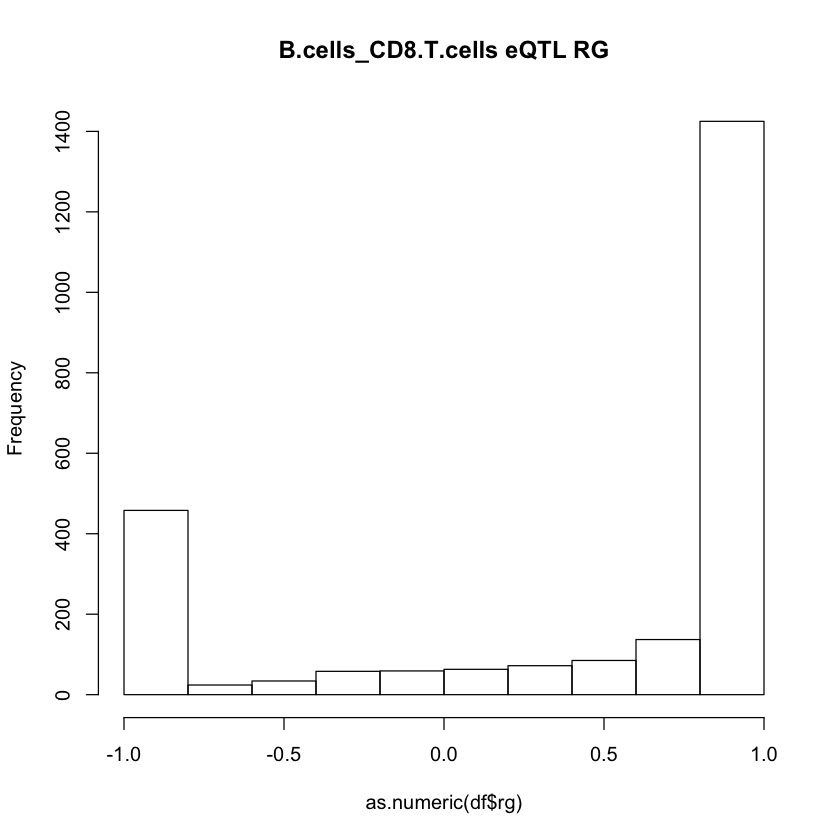

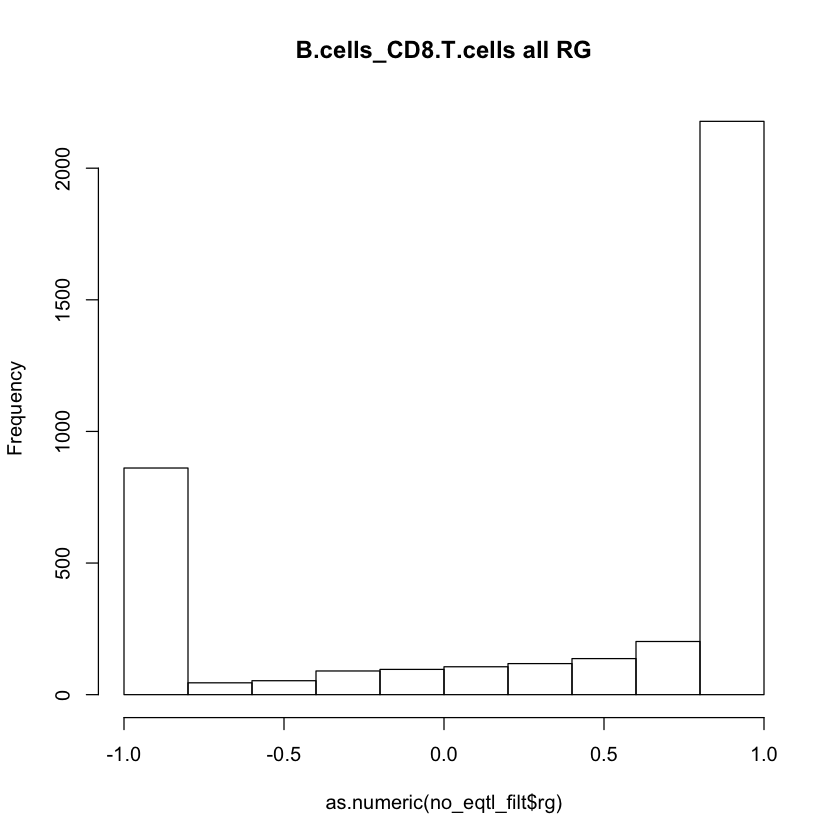

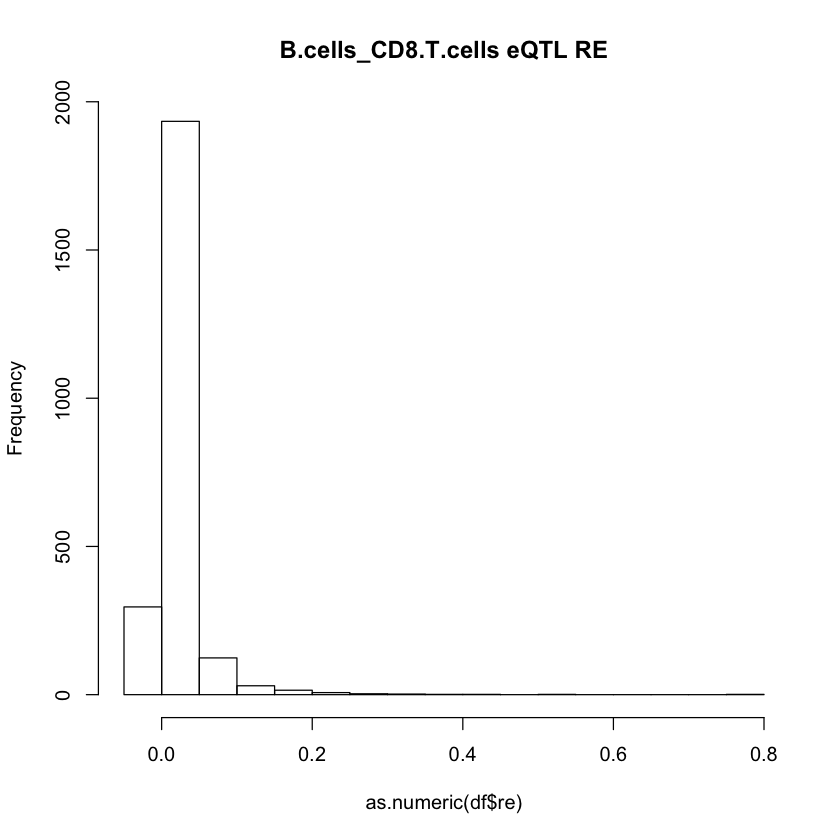

   gene           cell_pair      sg1      se1      sg2      se2       rg
1 AAGAB B.cells_CD8.T.cells  0.00502 0.005298 0.001497 0.003991        1
2  AATF B.cells_CD8.T.cells 0.002475 0.004062 0.000773 0.002672        1
3  ABAT B.cells_CD8.T.cells 0.009965 0.007428        0 0.002763       -1
4 ABCA1 B.cells_CD8.T.cells 0.016321  0.01247 0.000578 0.000897 0.298506
5 ABCA2 B.cells_CD8.T.cells  2.2e-05 0.001511  1.9e-05 0.003305       -1
6 ABCB8 B.cells_CD8.T.cells 0.006407 0.008367 0.002701 0.004241 0.231999
        re        rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  -0.0016     1.405213               0           0                 0
2 0.002191      1.95789               1           0                 0
3 0.006977 14868.578102               0           0                 1
4  0.00234     0.752061               0           0                 0
5 0.003232   129.333021               0           0                 0
6 0.010198     0.968545               0           0                 1

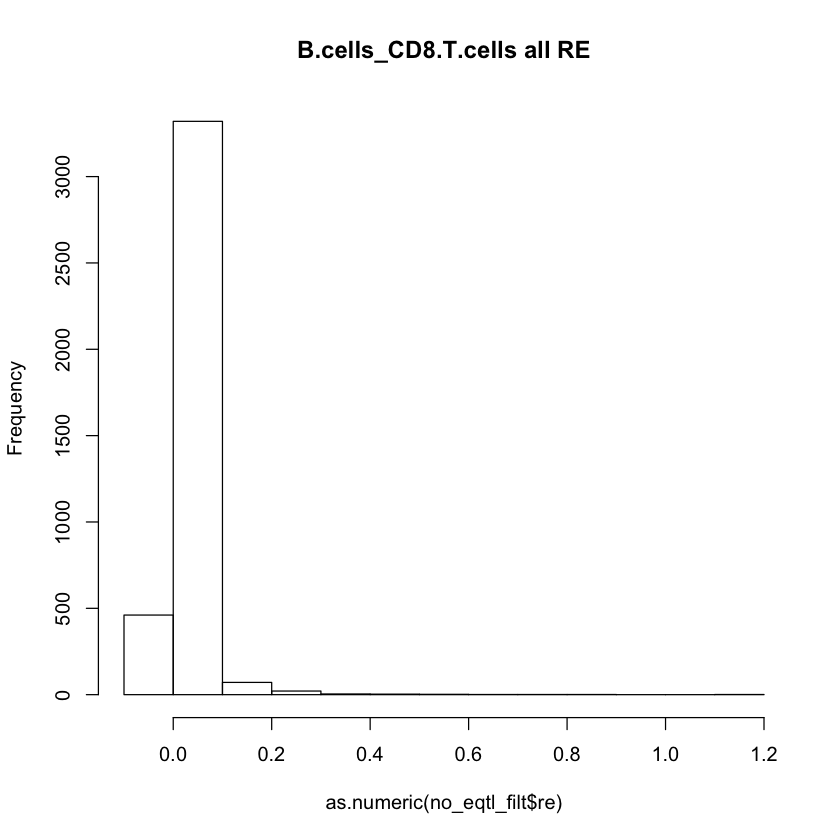

NULL


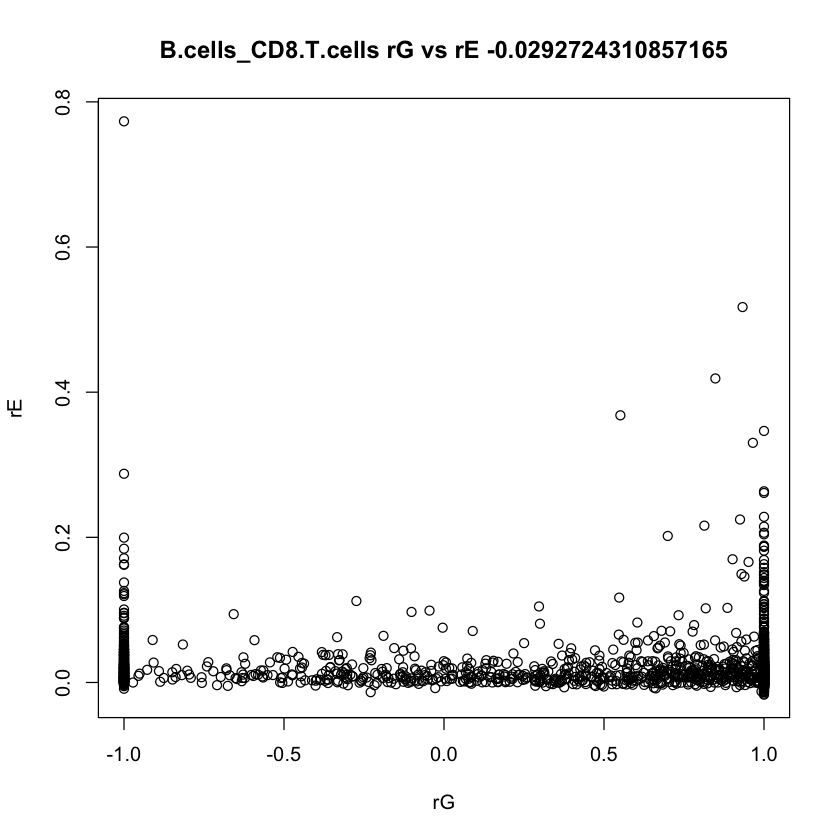

            cell_pair     gene      sg1      se1      sg2      se2       rg
1 B.cells_CD8.T.cells    ACBD3 0.007027 0.010716 0.003738 0.006644 0.465512
2 B.cells_CD8.T.cells    ACBD6 0.001937 0.003681 0.002263 0.003586        1
3 B.cells_CD8.T.cells   ADAM15 0.000941 0.002643 0.007521  0.00493 0.650574
4 B.cells_CD8.T.cells ADAMTSL4 0.000513 0.000793 0.000128 0.000322       -1
5 B.cells_CD8.T.cells     ADAR 0.020395 0.013535  0.00545 0.005106  0.39749
6 B.cells_CD8.T.cells     AIM2 0.024755 0.029867 0.014487 0.008242        1
        re    rg_se
1 0.032364 0.966949
2 0.004297 1.114052
3  0.00893 0.964095
4  0.00052 1.401044
5 0.047106 0.442865
6 0.011177 0.405118
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.376275606578607"
[1] "median" "1"     
[1] "var"               "0.679270453802946"
[1] "in 0,1 range" "2723"         "of"           "3861"        
[1] "rE info"
[1] "min"       "-0.016794"
[1] "max"      "1.155314"
[1] "mean"               "0.020309145558

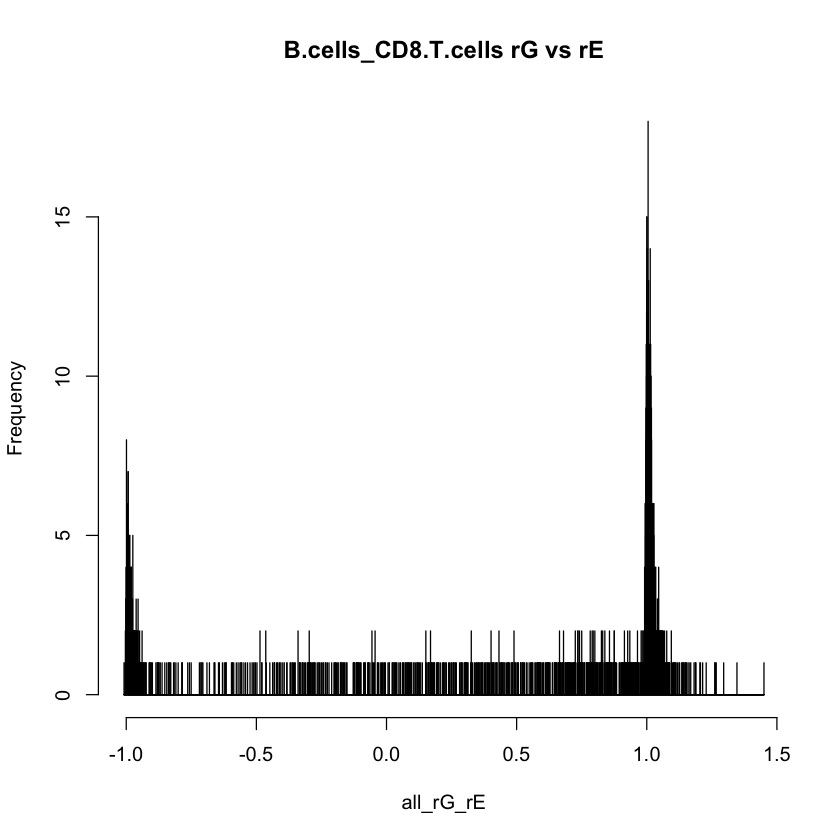

NULL


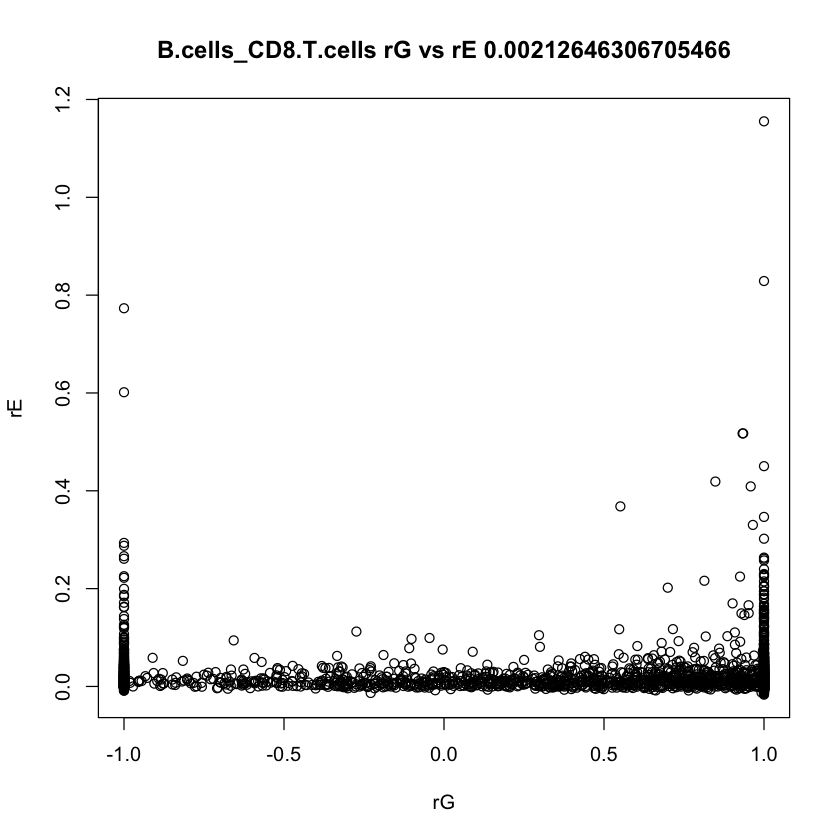

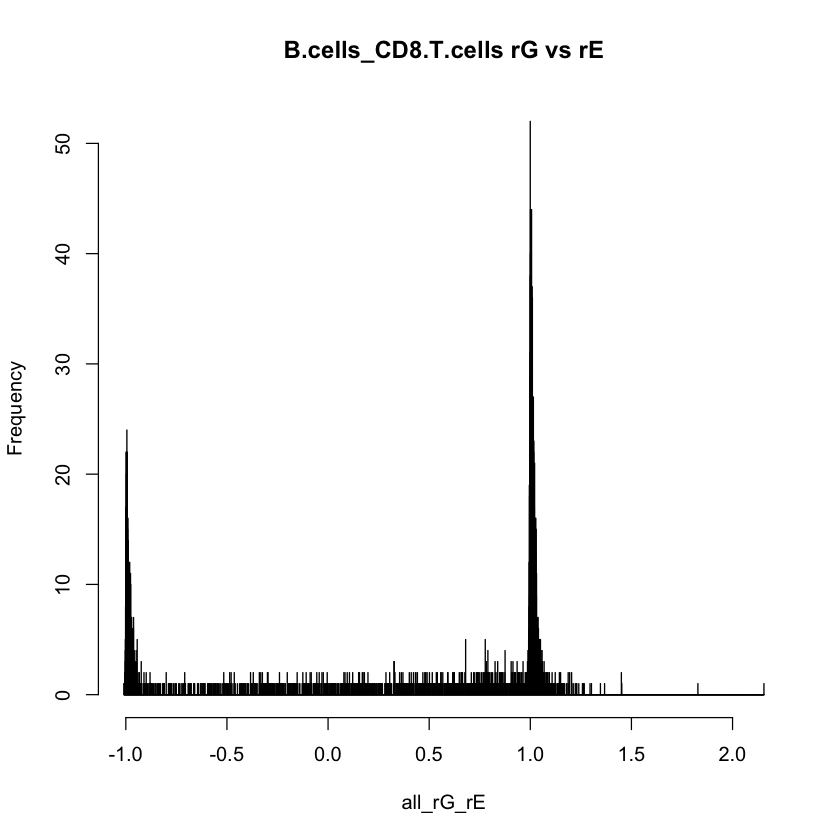

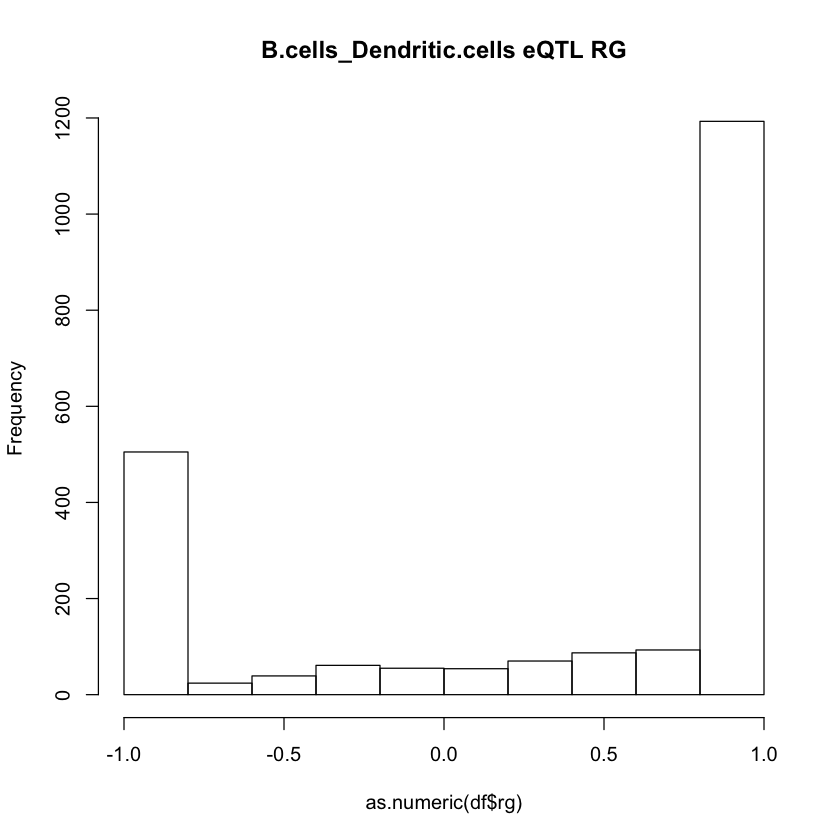

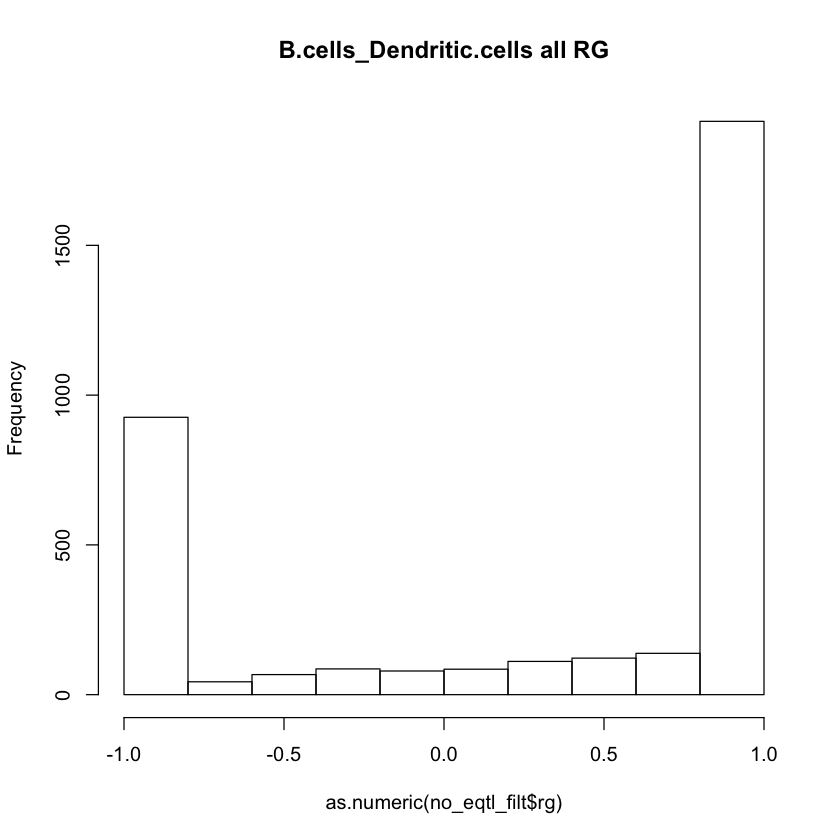

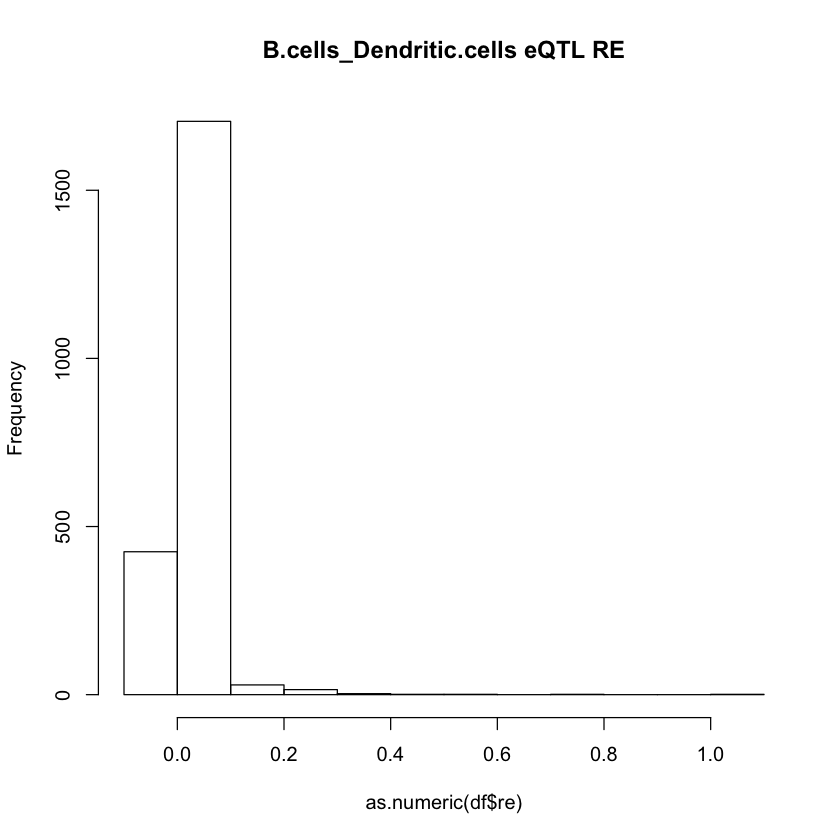

     gene               cell_pair      sg1      se1      sg2      se2     rg
1    A1BG B.cells_Dendritic.cells 0.016484 0.010144   0.0178 0.013303 0.4935
2 A2M-AS1 B.cells_Dendritic.cells 0.000423 0.001123 0.003339 0.002708     -1
3   AAED1 B.cells_Dendritic.cells 0.013469 0.012078 0.007803 0.007523      1
4    AATF B.cells_Dendritic.cells 0.004642 0.004806 0.003438 0.004628      1
5    ABAT B.cells_Dendritic.cells 0.010106 0.007219 0.001425 0.002057      1
6   ABCB8 B.cells_Dendritic.cells 0.007109 0.008332 0.007436 0.006675      1
         re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.025938 0.385291               0           1                 1
2  0.006229 1.555012               0           1                 0
3  0.013623 0.348516               0           0                 0
4 -0.003342 0.805435               1           0                 0
5  -0.00373  0.77781               0           0                 1
6   0.00768 0.525792               0           0           

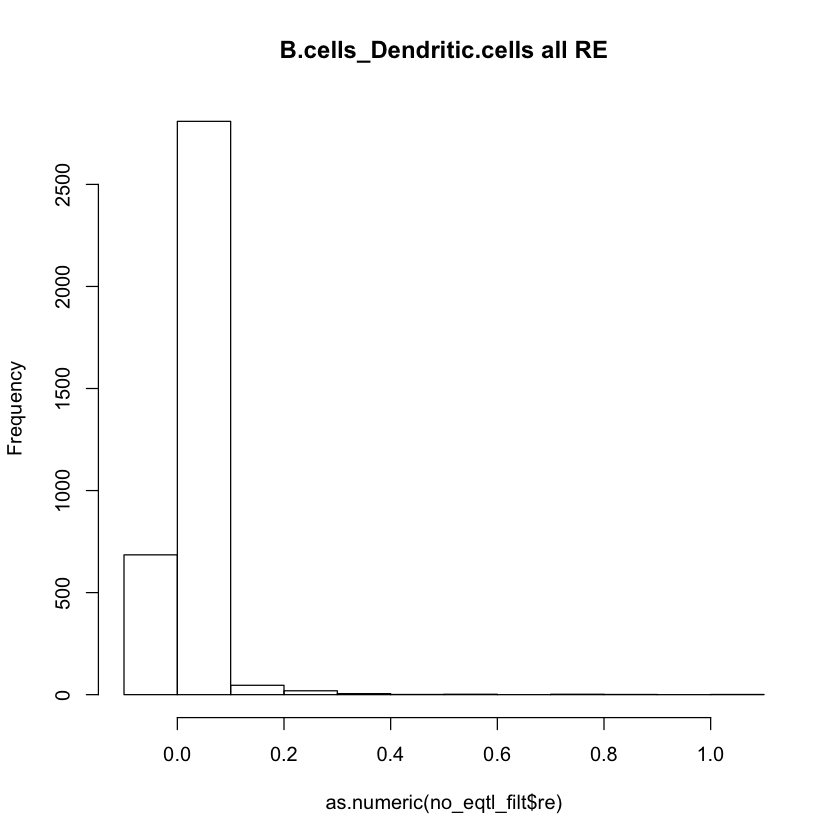

NULL


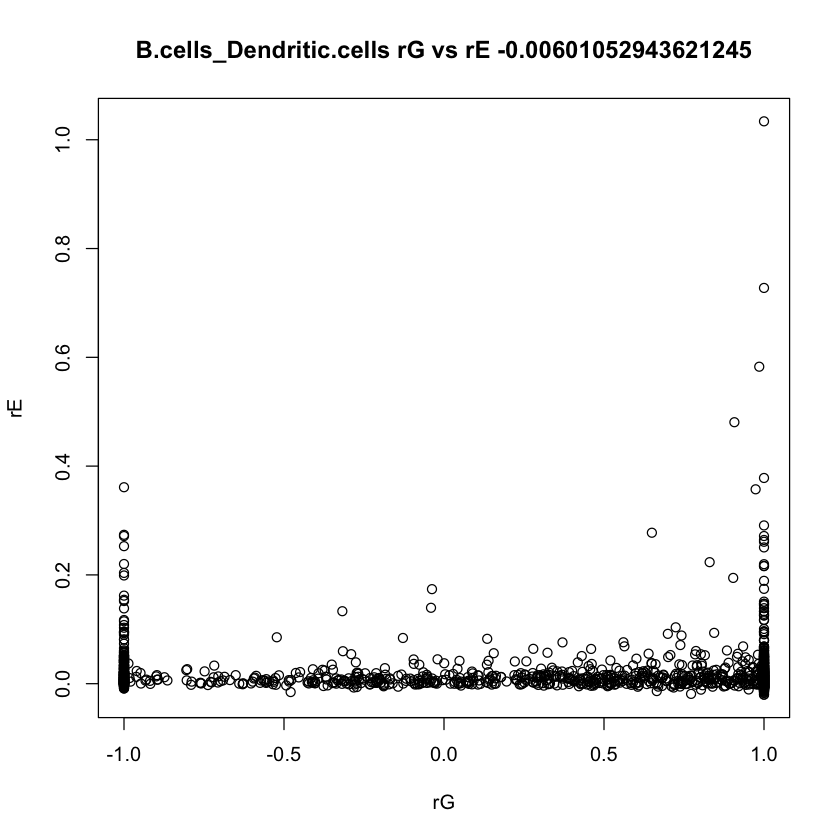

                cell_pair    gene      sg1      se1      sg2      se2       rg
1 B.cells_Dendritic.cells  ADAM15 0.000378 0.002277 0.000127 0.002867       -1
2 B.cells_Dendritic.cells    ADAR  0.01934 0.013375 0.019087 0.014708 0.563781
3 B.cells_Dendritic.cells ADIPOR1 0.001573  0.00445 0.003301 0.006325        1
4 B.cells_Dendritic.cells ADPRHL2 0.001693 0.003891  0.00654 0.006819       -1
5 B.cells_Dendritic.cells     AGL 0.001674 0.004176 0.007318 0.005869       -1
6 B.cells_Dendritic.cells  AHCYL1 0.000385 0.005049 0.000457 0.004834       -1
        re     rg_se
1  0.00132 13.650259
2 0.068654  0.338964
3 0.010997  1.523531
4 0.000149  0.949207
5 0.007526  1.285351
6 0.017528 14.010249
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.305501136363636"
[1] "median"    "0.9522215"
[1] "var"               "0.735063500347253"
[1] "in 0,1 range" "2358"         "of"           "3542"        
[1] "rE info"
[1] "min"       "-0.026656"
[1] "max"      "1.033857"
[1] "m

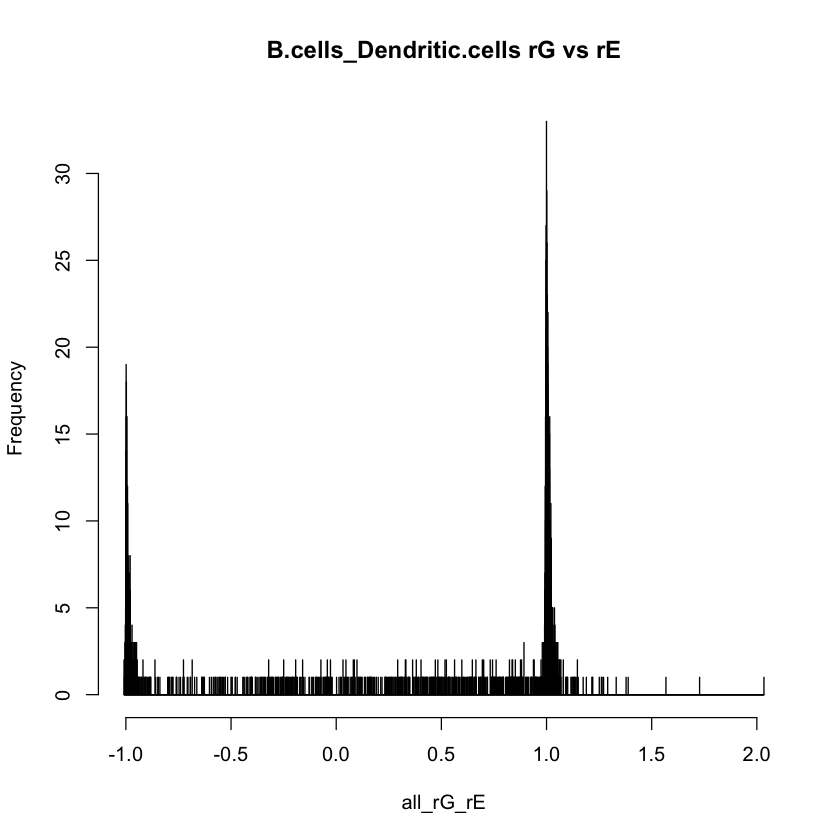

NULL


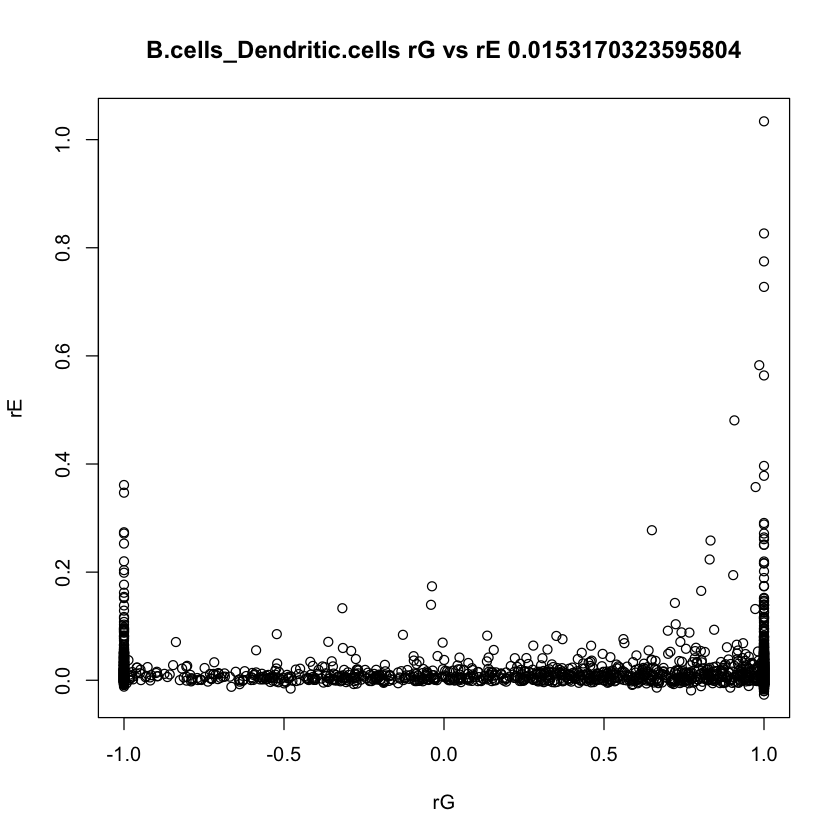

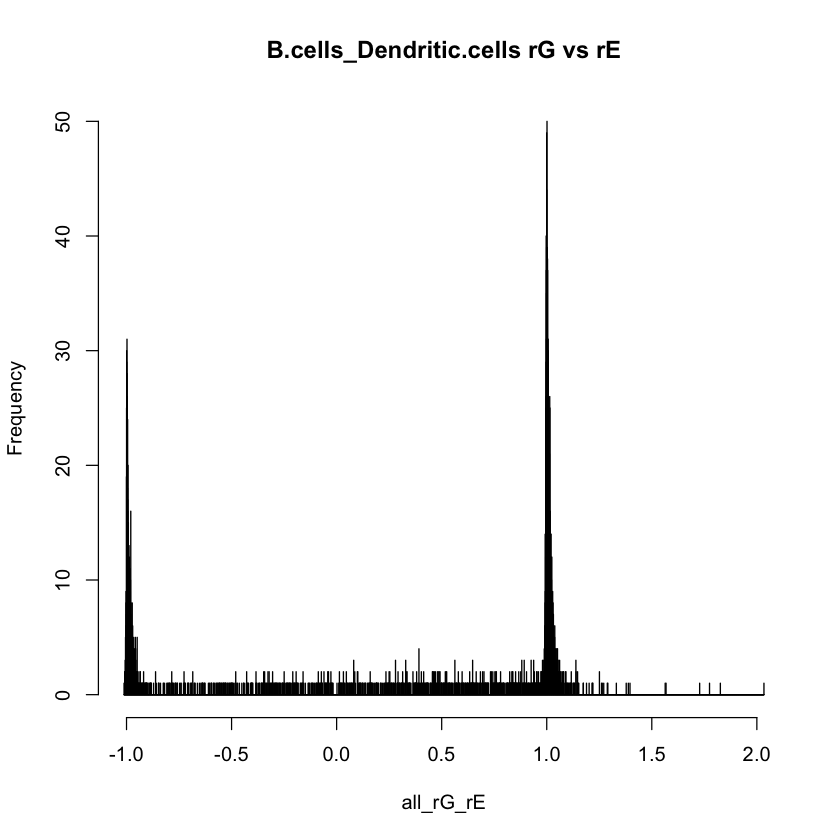

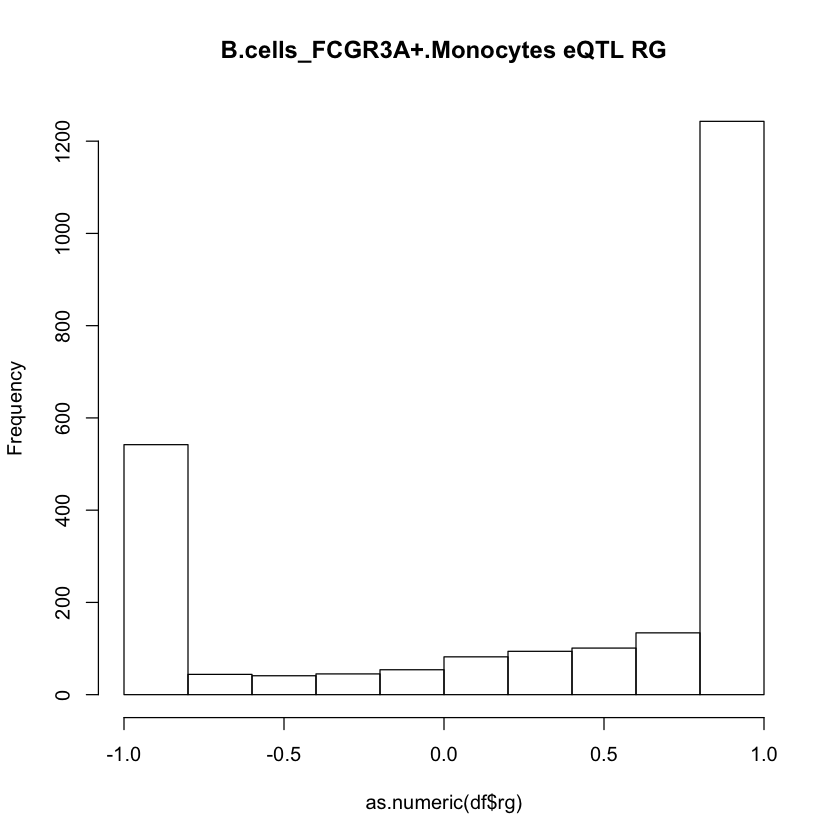

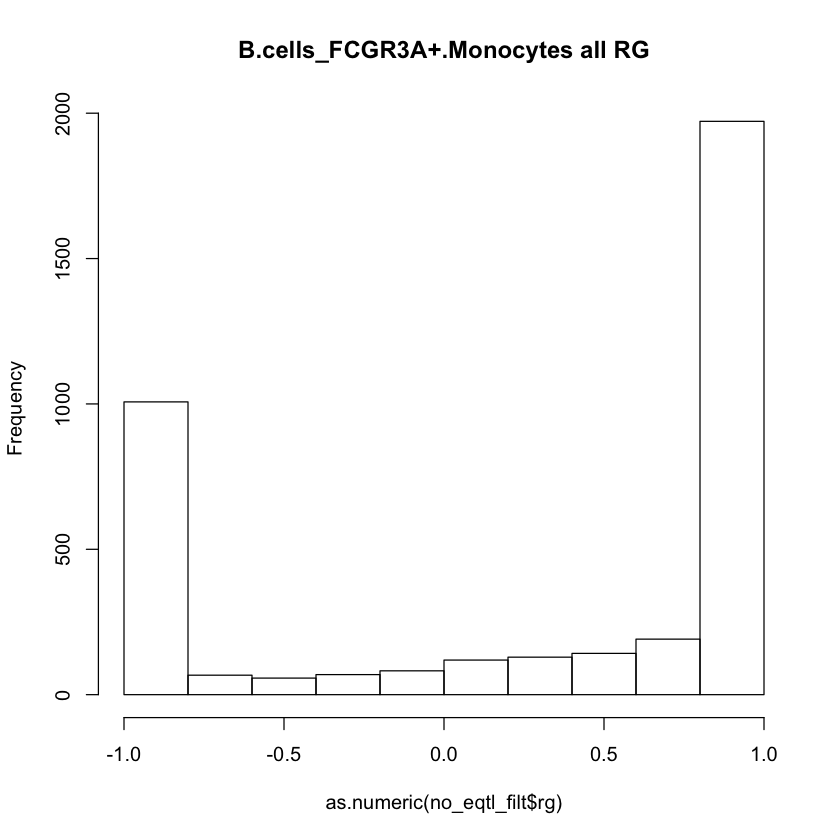

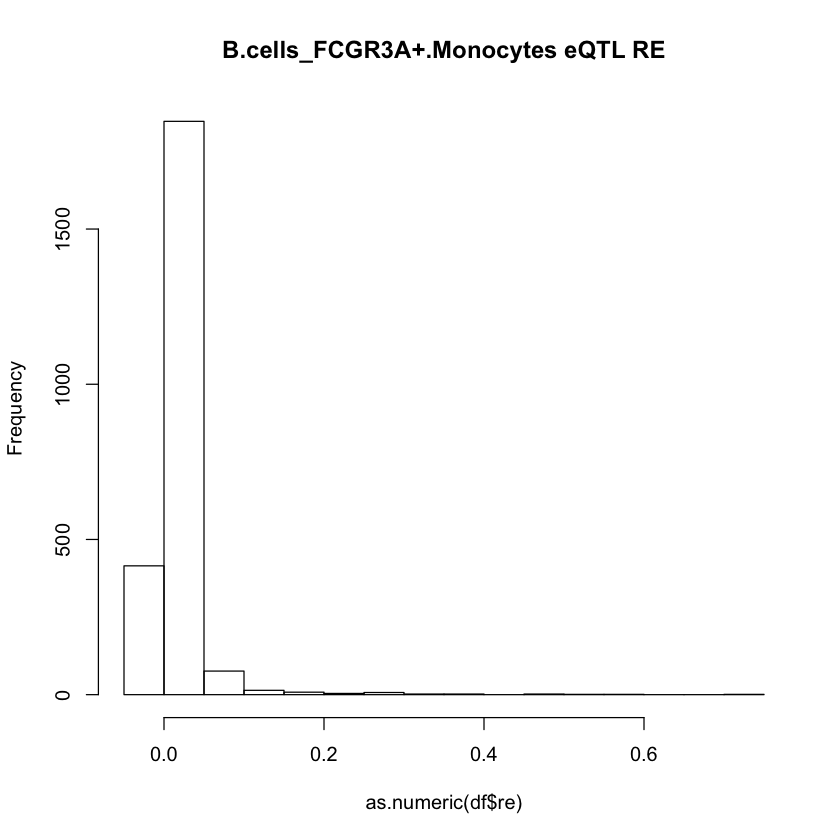

   gene                 cell_pair      sg1      se1      sg2      se2        rg
1  A1BG B.cells_FCGR3A+.Monocytes 0.016439 0.010128 0.017877 0.013801  0.656312
2 AAED1 B.cells_FCGR3A+.Monocytes 0.007226 0.009801 0.005012  0.00566  0.031107
3  ABAT B.cells_FCGR3A+.Monocytes 0.008957 0.007058 0.001321 0.004159         1
4 ABCA7 B.cells_FCGR3A+.Monocytes 0.008465 0.009334 0.011451 0.009488 -0.621753
5 ABCB4 B.cells_FCGR3A+.Monocytes 0.006065 0.009132  8.5e-05 0.000143         1
6 ABCB8 B.cells_FCGR3A+.Monocytes 0.004633 0.007547 0.001002 0.002892        -1
         re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.039253 0.312954               0           1                 1
2  0.034324 0.886989               0           0                 0
3  0.003809 1.475648               0           0                 1
4  0.002658 0.653288               0           0                 1
5 -0.004124  1.22681               0           0                 0
6  0.001772 1.814966               0  

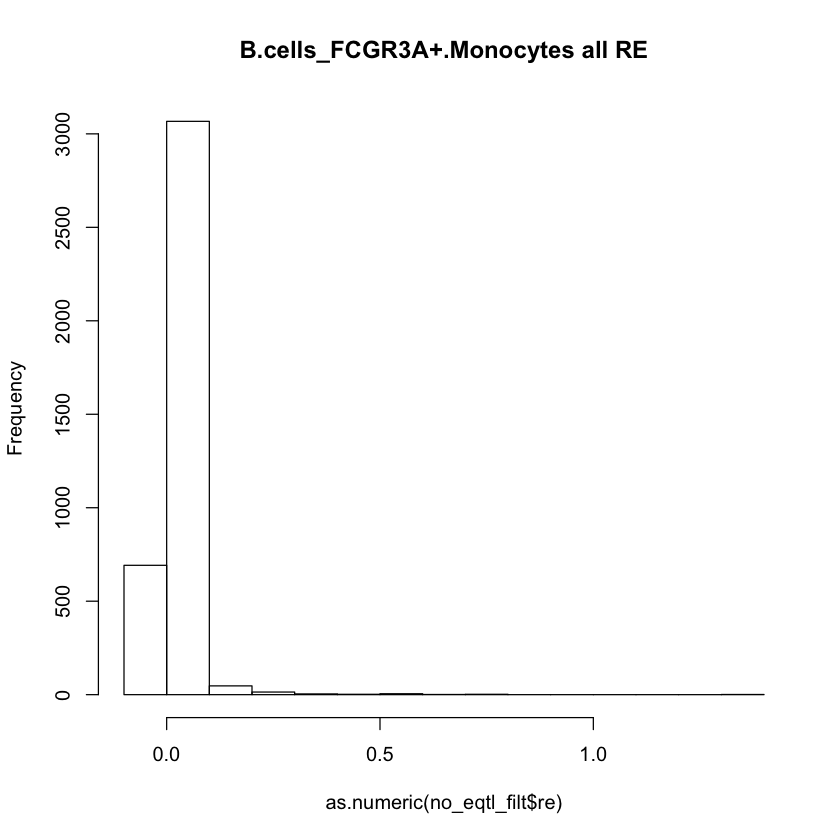

NULL


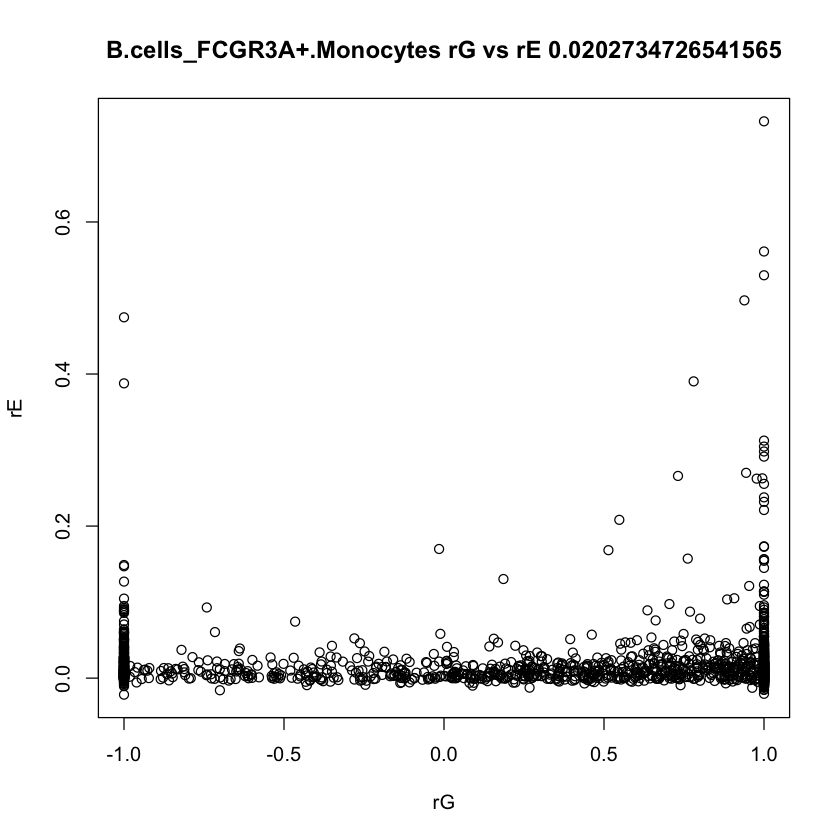

                  cell_pair  gene      sg1      se1      sg2      se2        rg
1 B.cells_FCGR3A+.Monocytes ACBD3 0.009557 0.011493 0.006825 0.007939 -0.316971
2 B.cells_FCGR3A+.Monocytes ACBD6 0.001201 0.003383    1e-05  0.00298        -1
3 B.cells_FCGR3A+.Monocytes  ACP6  4.7e-05  0.00107  8.3e-05 0.000257        -1
4 B.cells_FCGR3A+.Monocytes  ADAR 0.018984 0.013277 0.007465 0.006775  0.787929
5 B.cells_FCGR3A+.Monocytes  AGO3 0.001322 0.002869 0.000825 0.002312         1
6 B.cells_FCGR3A+.Monocytes   AK2  0.00304 0.004942 0.005679 0.005825         1
        re      rg_se
1 0.039982   0.971981
2 0.002768 151.066784
3 0.000275  12.451855
4 0.050804   0.247102
5 0.007583   1.399164
6 0.017554   0.585117
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.289982002105817"
[1] "median"   "0.874651"
[1] "var"               "0.732479342225217"
[1] "in 0,1 range" "2534"         "of"           "3799"        
[1] "rE info"
[1] "min"       "-0.021738"
[1] "max"      "1.35

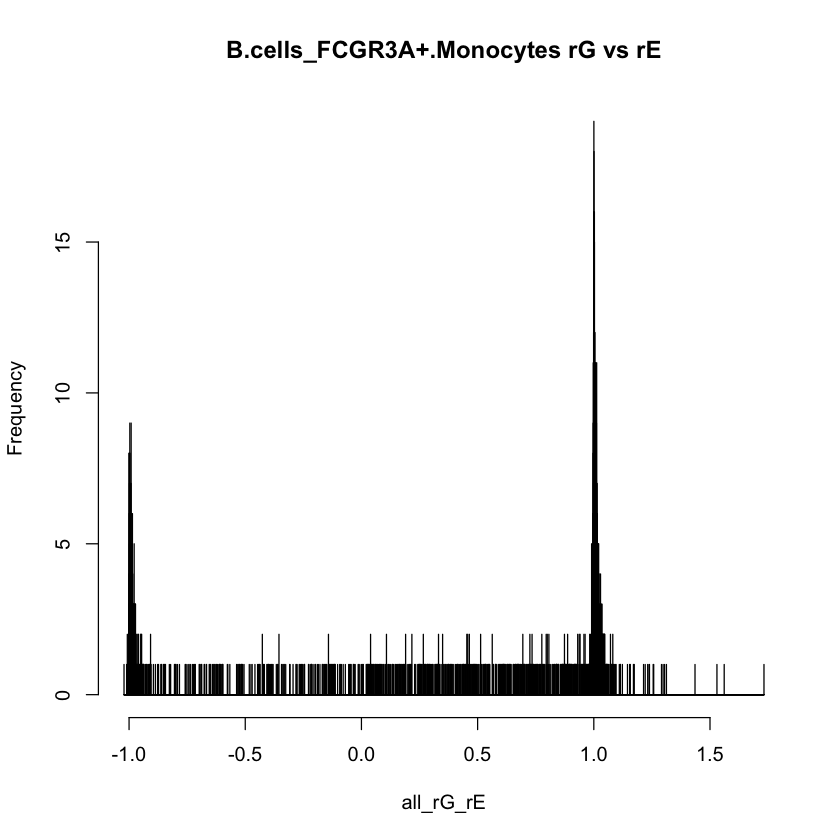

NULL


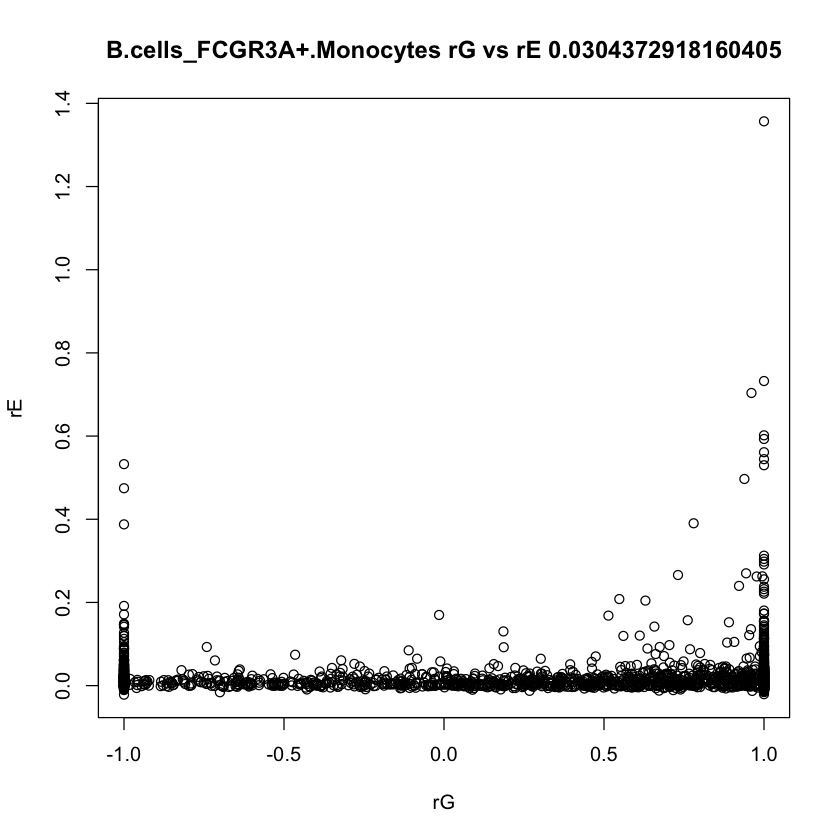

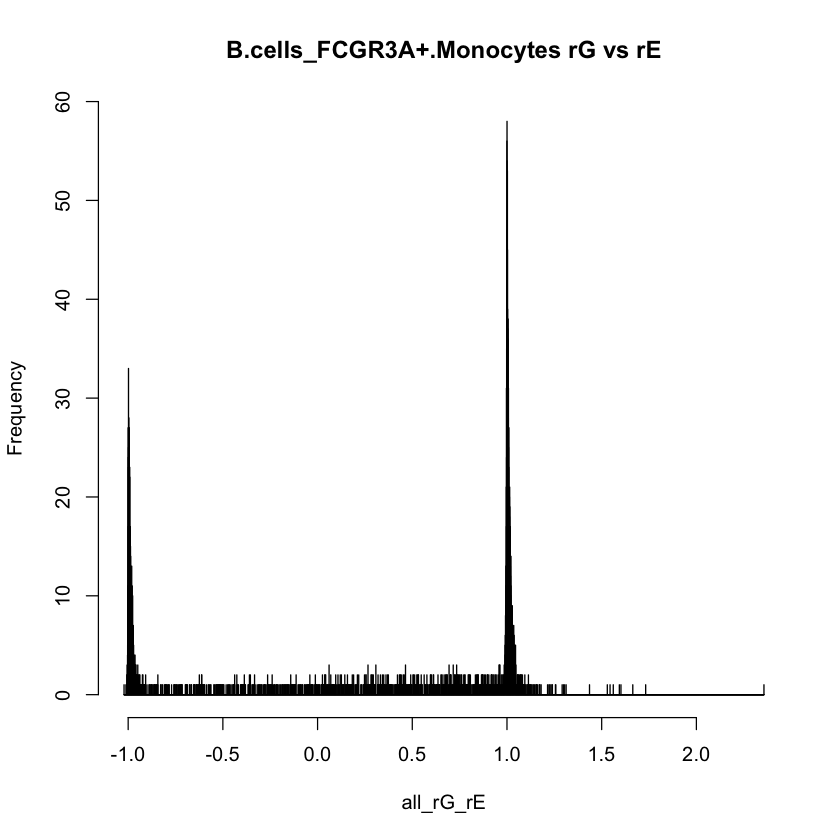

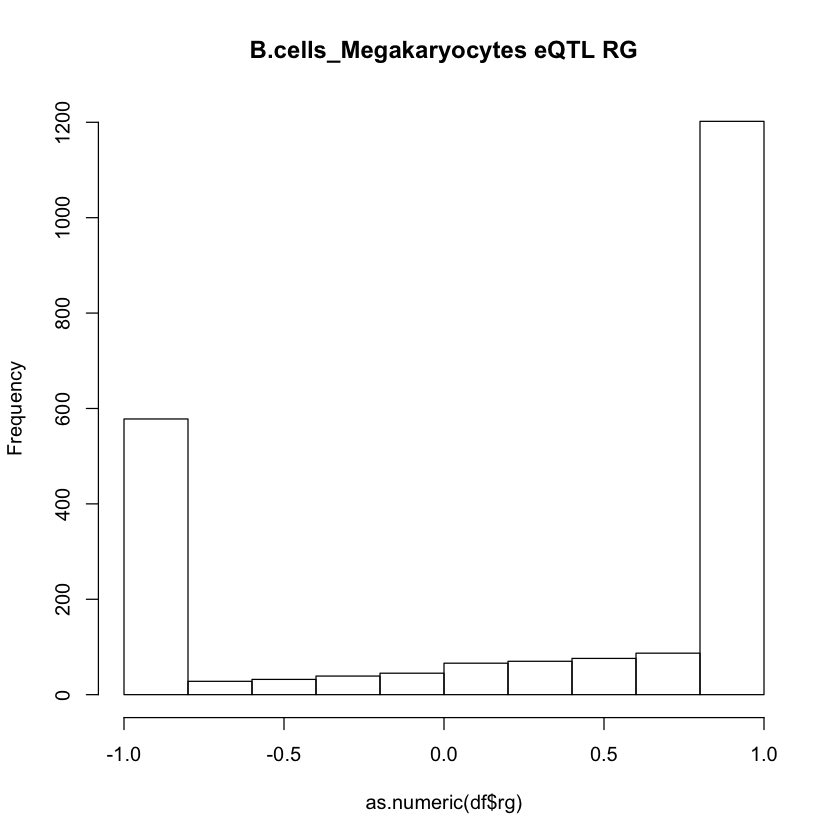

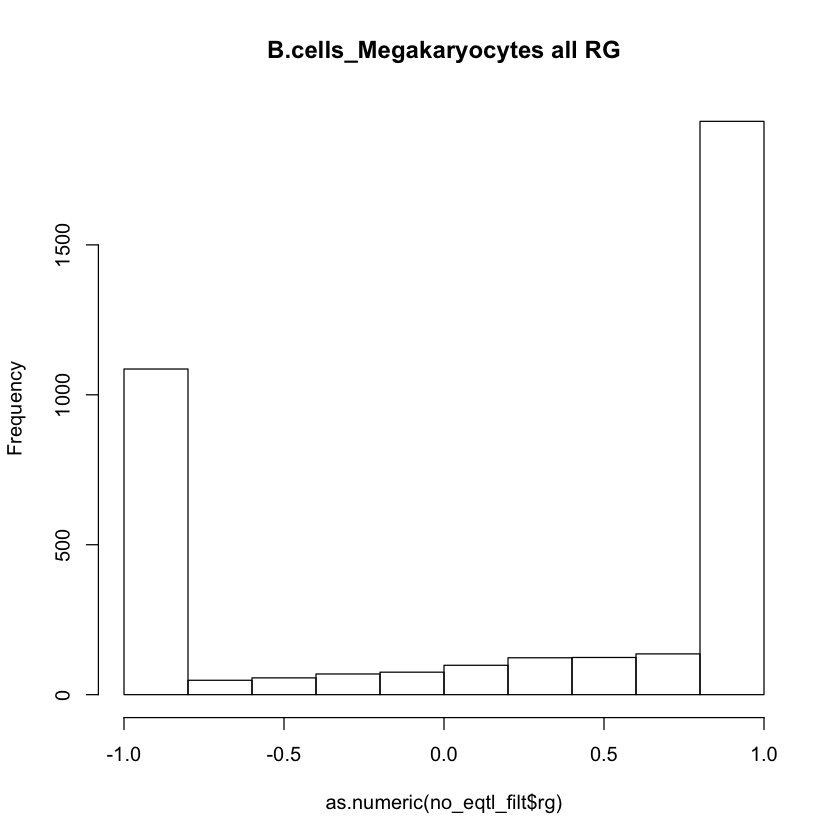

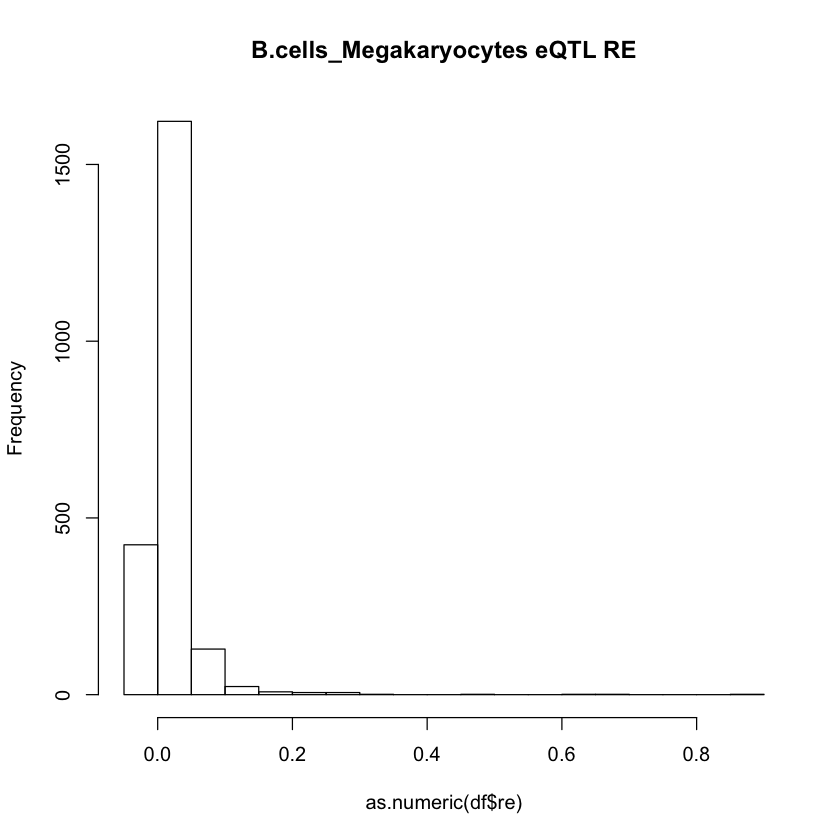

     gene              cell_pair      sg1      se1      sg2      se2       rg
1    A1BG B.cells_Megakaryocytes 0.016519 0.010158 0.003141 0.007085 0.980154
2 A2M-AS1 B.cells_Megakaryocytes        0 0.000924        0 0.003427        1
3   AAED1 B.cells_Megakaryocytes 0.010999 0.011342 0.010062 0.010731 -0.41014
4   AAGAB B.cells_Megakaryocytes 0.005803 0.005696  0.00651 0.008276 0.558741
5    AATF B.cells_Megakaryocytes 0.003116 0.004356 0.000264 0.006683       -1
6    ABAT B.cells_Megakaryocytes 0.009212 0.007191 0.015204 0.010217 0.431829
         re         rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.021976      0.837819               0           1                 1
2  0.003899 113213.842951               0           1                 0
3   0.03718      0.788261               0           0                 0
4   0.00261      0.728524               0           0                 0
5  0.004427     13.173782               1           0                 0
6 -0.003927      0.499

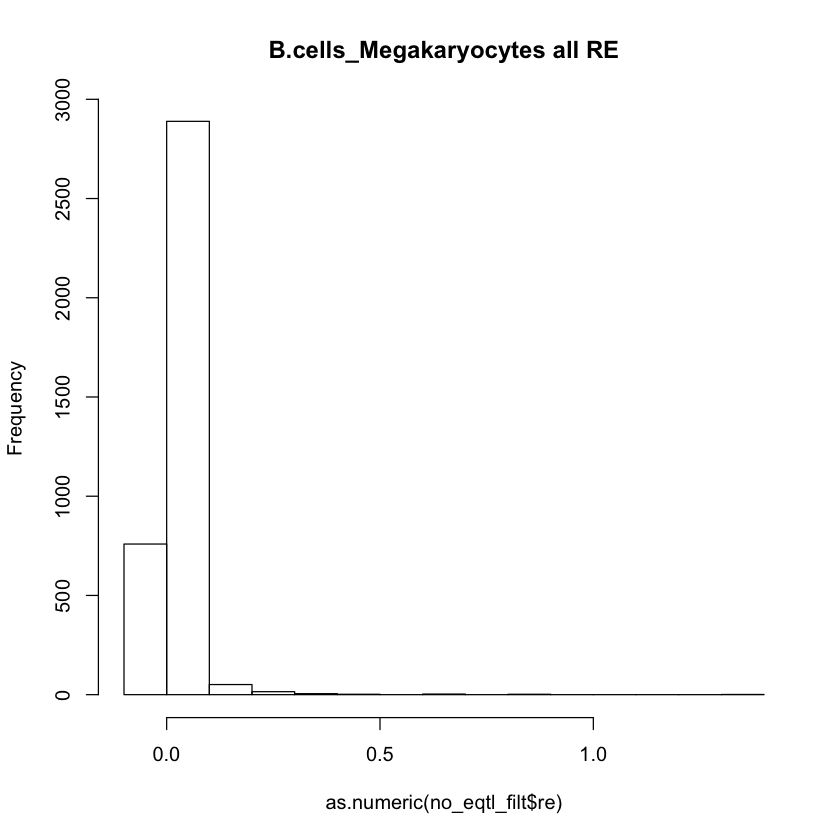

NULL


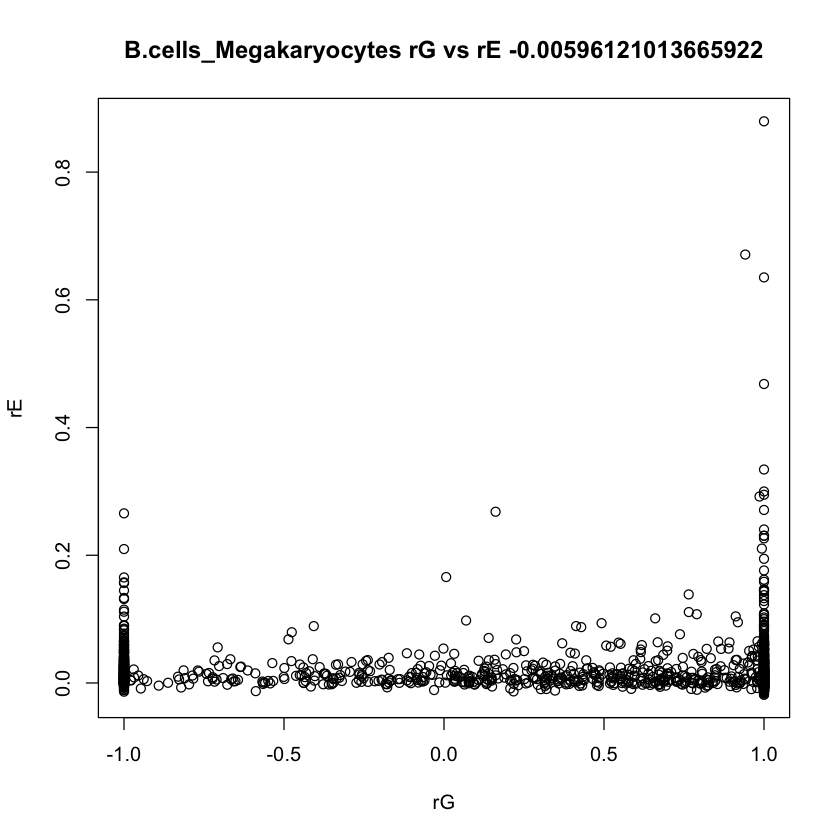

               cell_pair     gene      sg1      se1      sg2      se2       rg
1 B.cells_Megakaryocytes    ABCD3 0.001376 0.005635 0.010442 0.008424        1
2 B.cells_Megakaryocytes    ACAP3 0.001468 0.004482 0.004086 0.006713        1
3 B.cells_Megakaryocytes    ACBD3 0.004922 0.009669 0.006488 0.009194 -0.92212
4 B.cells_Megakaryocytes    ACBD6  0.00175 0.003608 0.017182  0.01329  0.56174
5 B.cells_Megakaryocytes   ADAM15 0.000218 0.002141 0.000161 0.003414       -1
6 B.cells_Megakaryocytes ADAMTSL4 0.000468 0.000762 0.001164 0.002407 0.954841
         re    rg_se
1  0.005284 1.937418
2  0.008803 1.559325
3  0.039669 1.662984
4 -0.000136 0.912157
5  0.002381 15.09684
6 -0.001621 1.235571
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"             "0.25106483934338"
[1] "median"  "0.87698"
[1] "var"               "0.775119816540684"
[1] "in 0,1 range" "2388"         "of"           "3716"        
[1] "rE info"
[1] "min"       "-0.021244"
[1] "max"      "1.379873"
[1] "mean"  

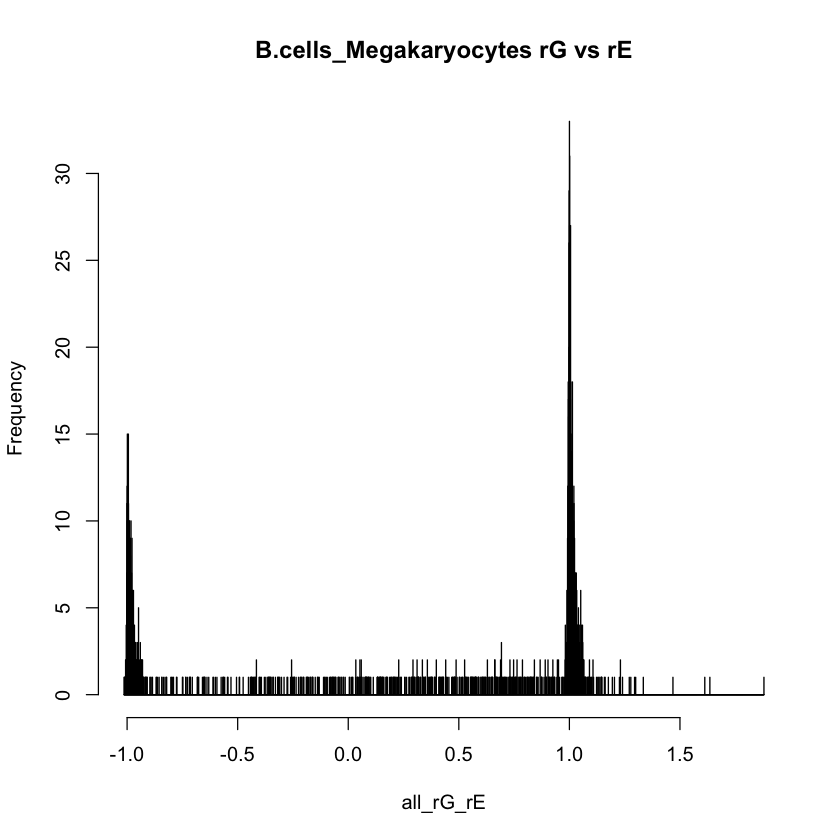

NULL


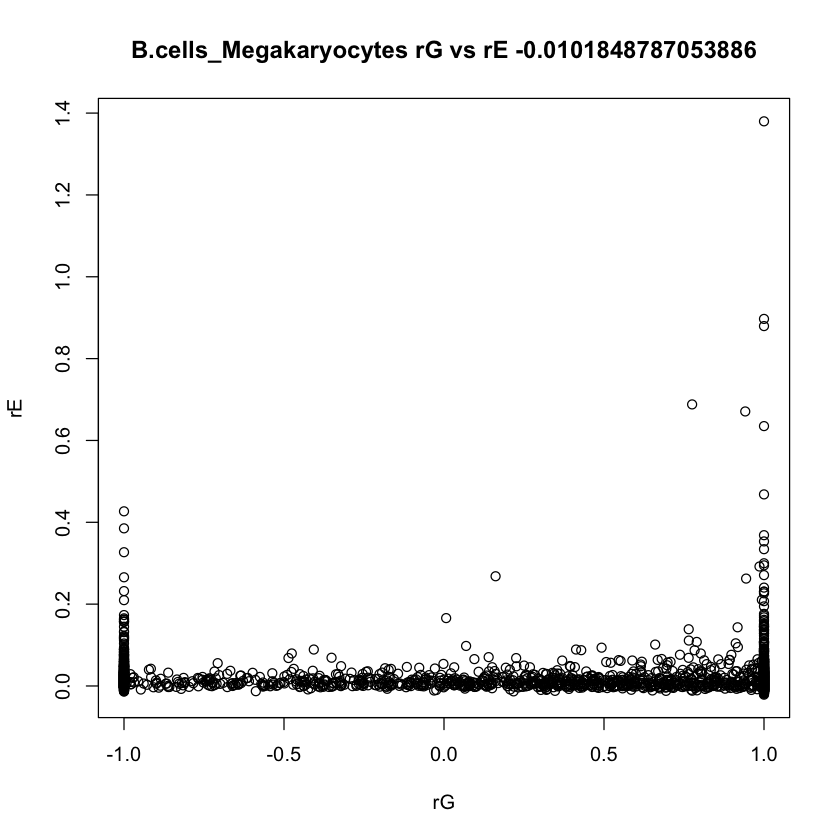

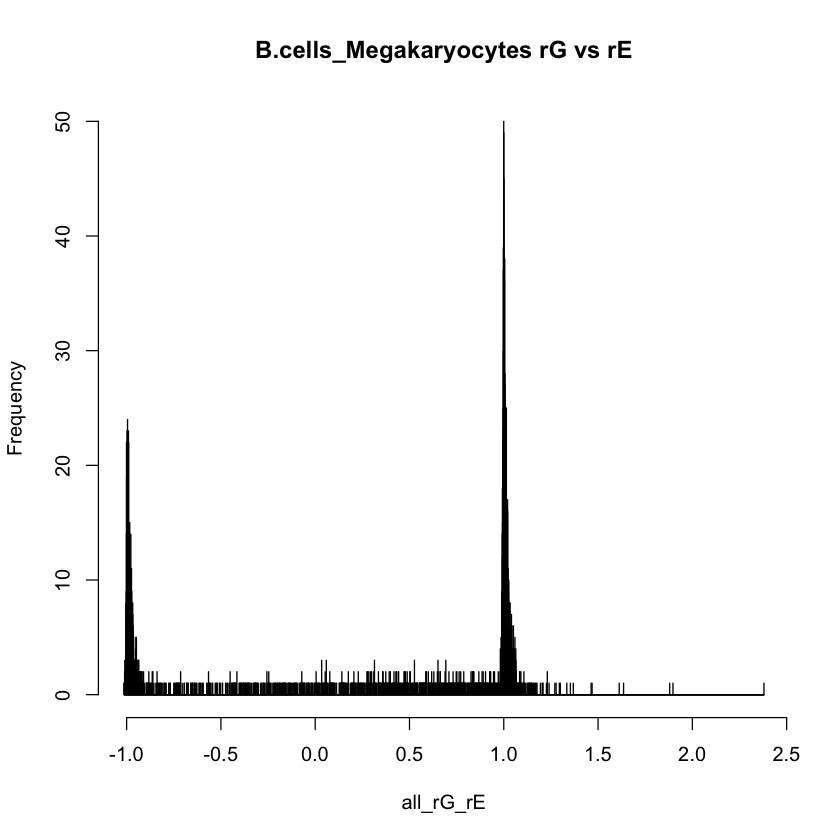

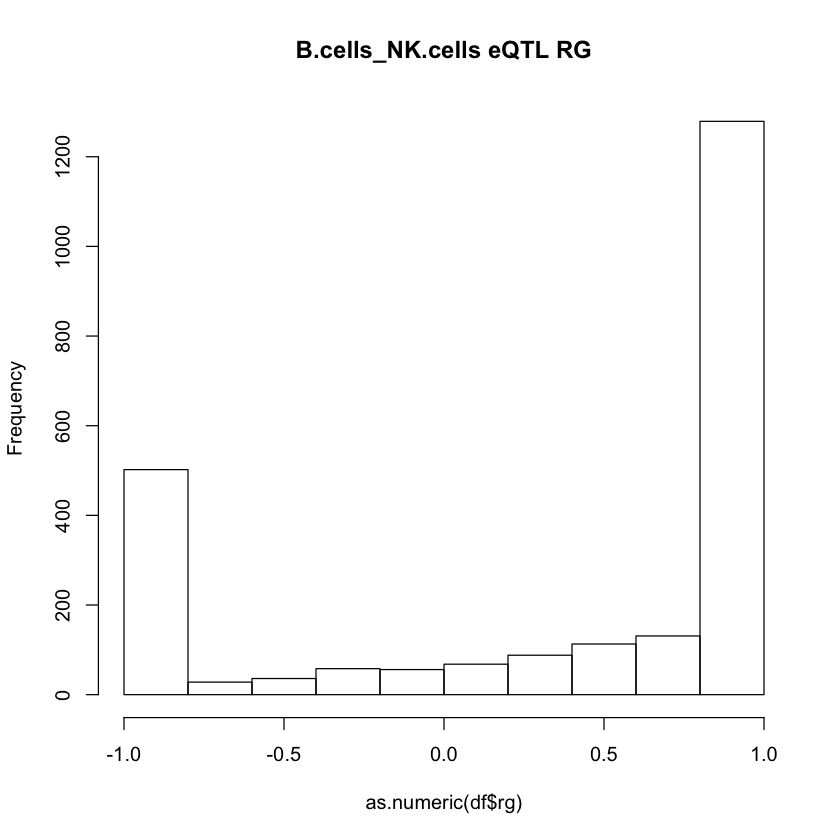

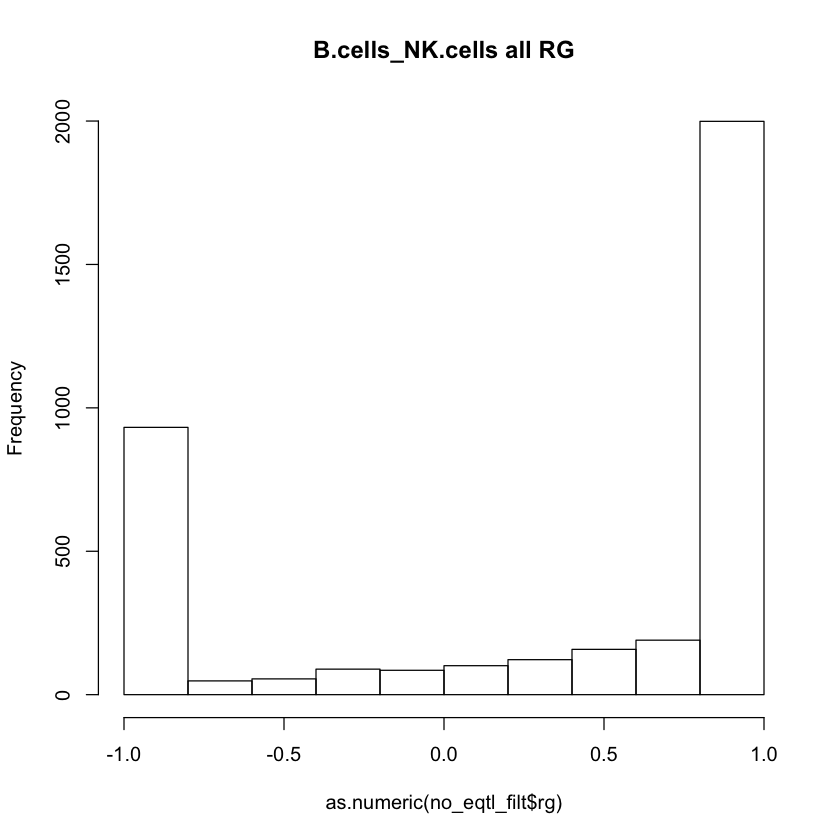

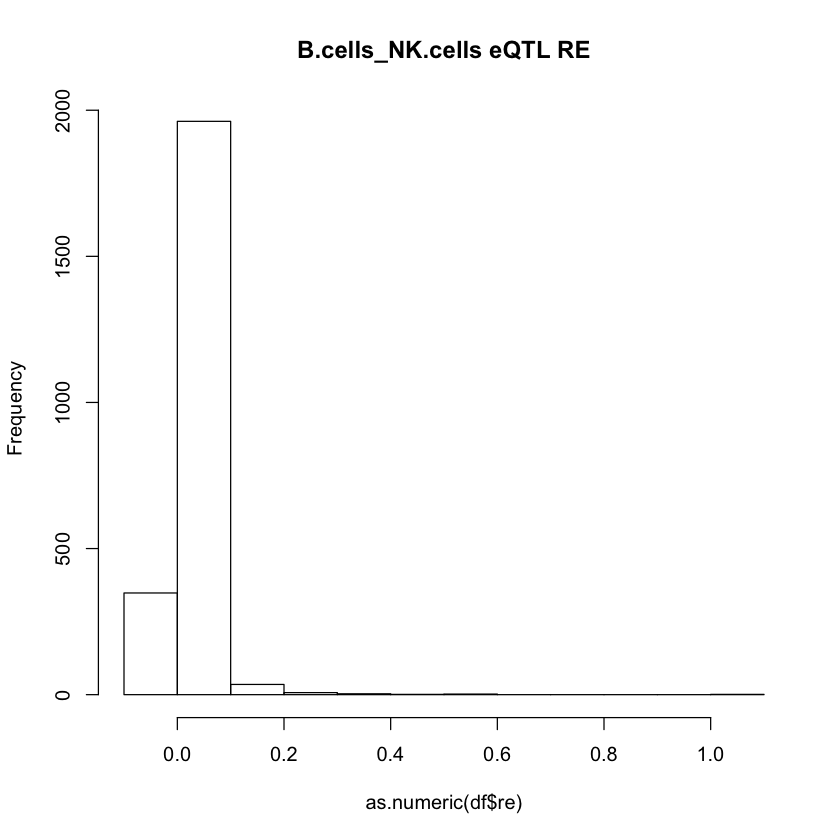

    gene        cell_pair      sg1      se1      sg2      se2       rg
1   A1BG B.cells_NK.cells 0.016708 0.010208 0.005169 0.008398 0.022438
2   ABAT B.cells_NK.cells 0.009167 0.007086 0.001084  0.00267        1
3  ABCA1 B.cells_NK.cells 0.017117 0.012635 0.000363 0.000486 0.703141
4  ABCA2 B.cells_NK.cells 0.001037 0.002016 0.006324 0.005851        1
5  ABCA7 B.cells_NK.cells 0.006479 0.008951 0.003732 0.006192 0.265786
6 ABCB10 B.cells_NK.cells 0.002145 0.003478 0.001901 0.002751       -1
         re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.013341 0.716634               0           1                 1
2  0.000345 1.210611               0           0                 1
3  0.002179 0.595168               0           0                 0
4 -0.000397 0.933246               0           0                 0
5  0.004544 1.042643               0           0                 1
6  0.003672 1.187316               0           0                 0
  Megakaryocytes CD4.T.cells NK.ce

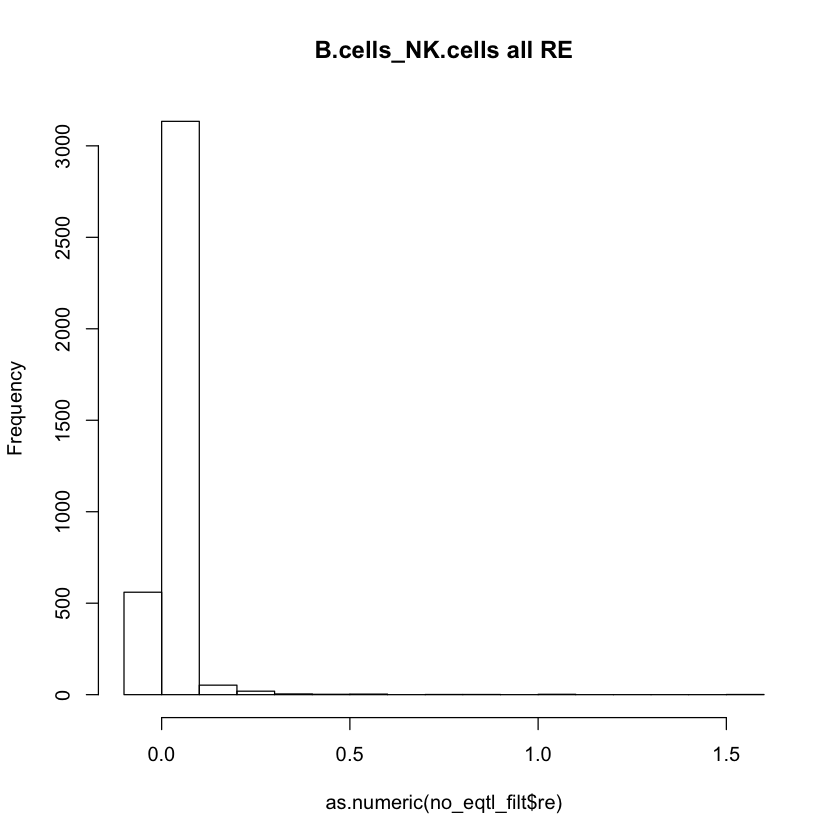

NULL


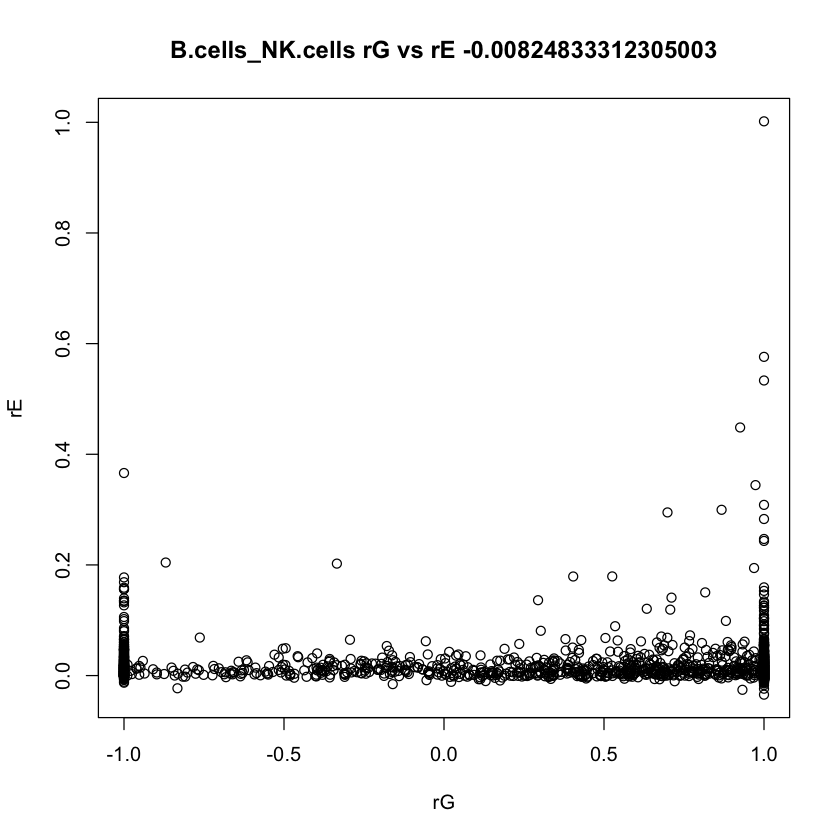

         cell_pair   gene      sg1      se1      sg2      se2       rg       re
1 B.cells_NK.cells ABCB10 0.002145 0.003478 0.001901 0.002751       -1 0.003672
2 B.cells_NK.cells  ACADM 0.000134 0.003053 0.004485 0.005522       -1 0.046429
3 B.cells_NK.cells   ADAR 0.018951 0.013269 0.012627 0.009382 0.687826 0.054687
4 B.cells_NK.cells   ADSS 0.000799 0.007448  0.00071 0.007037       -1 0.060046
5 B.cells_NK.cells  AGMAT 0.001883 0.003176 0.000693 0.001073       -1 0.002428
6 B.cells_NK.cells AHCYL1 0.000298 0.004999 0.000498 0.003401       -1  0.00731
      rg_se
1  1.187316
2 13.261499
3  0.271232
4 14.249958
5  1.111958
6 12.499133
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.328778939807384"
[1] "median"    "0.9321495"
[1] "var"               "0.707504256806689"
[1] "in 0,1 range" "2554"         "of"           "3738"        
[1] "rE info"
[1] "min"       "-0.040615"
[1] "max"      "1.599545"
[1] "mean"               "0.0181304882289995"
[1] "median"    

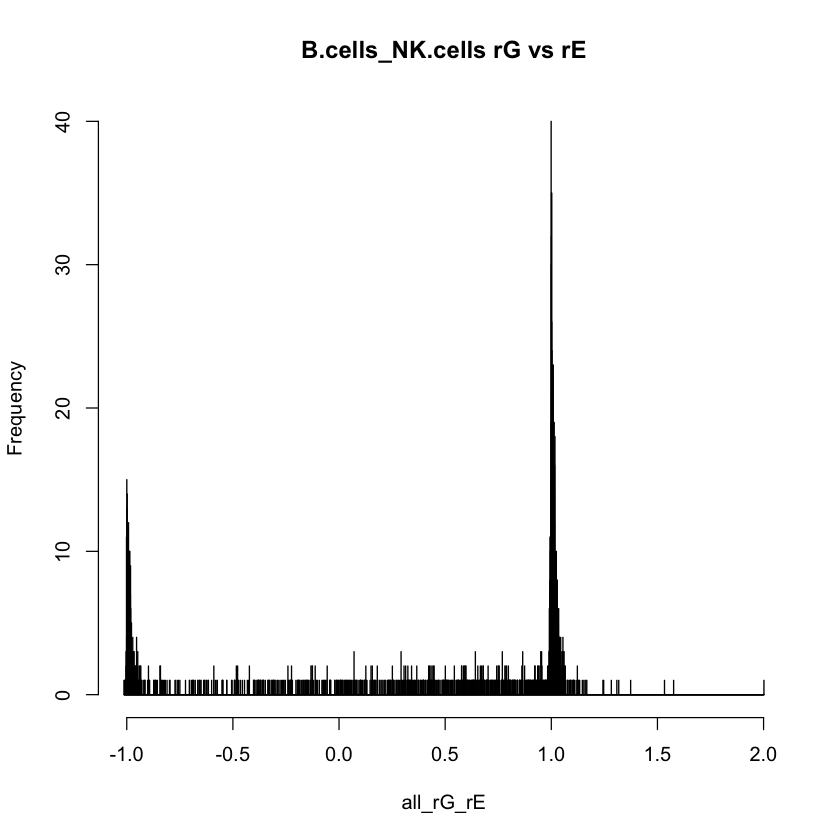

NULL


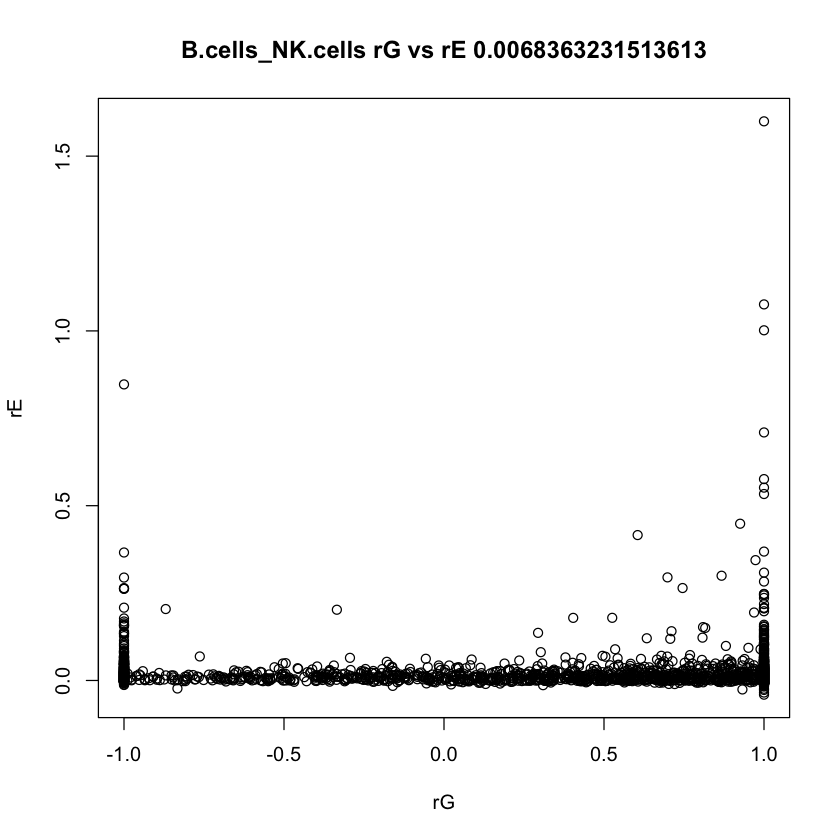

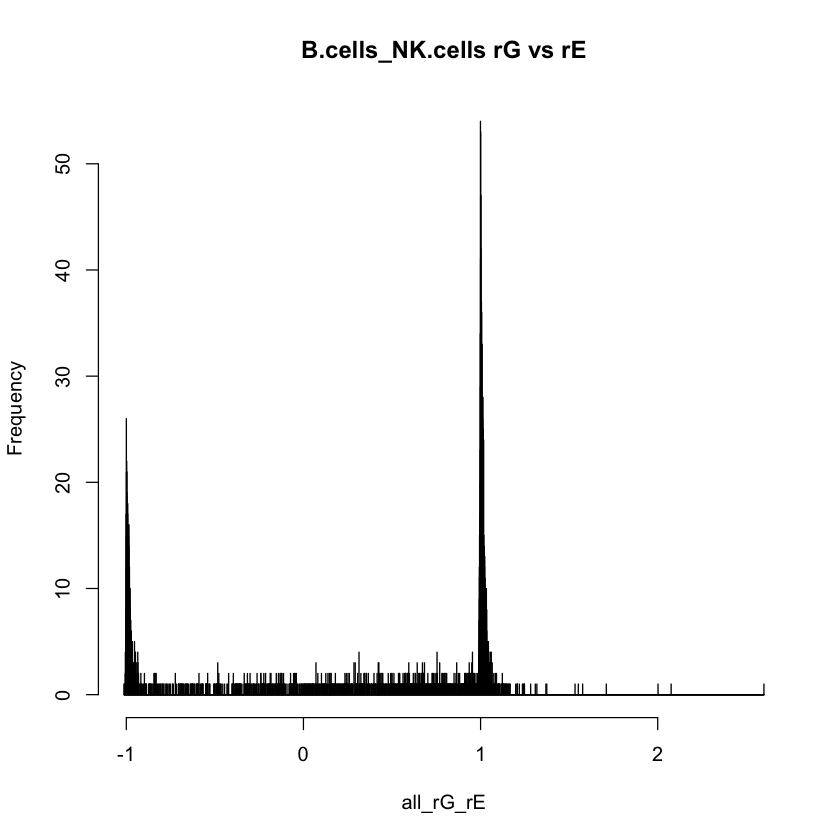

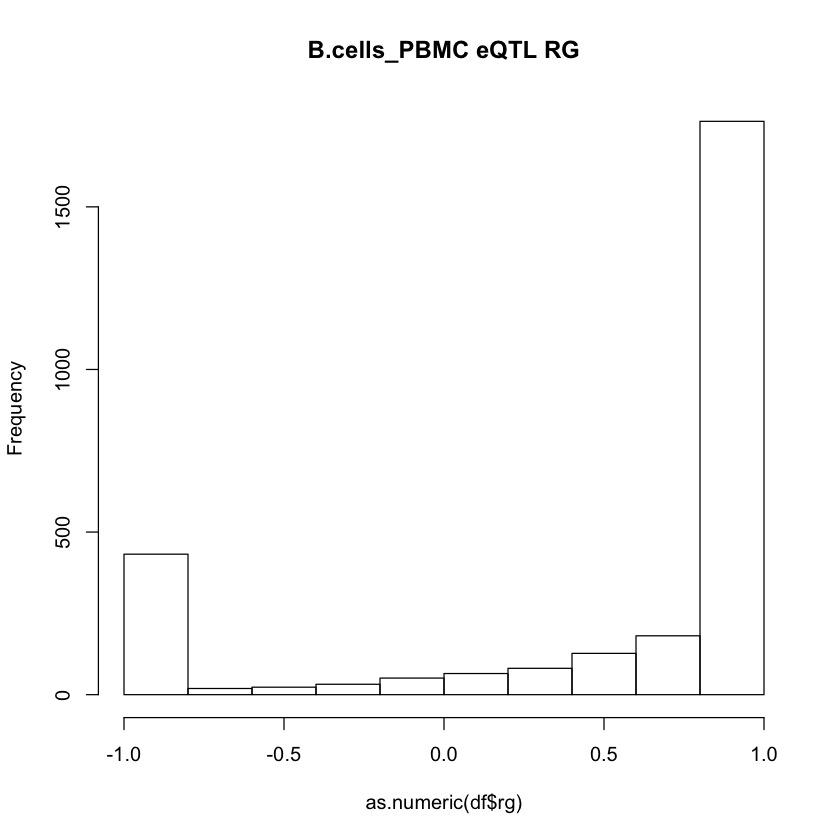

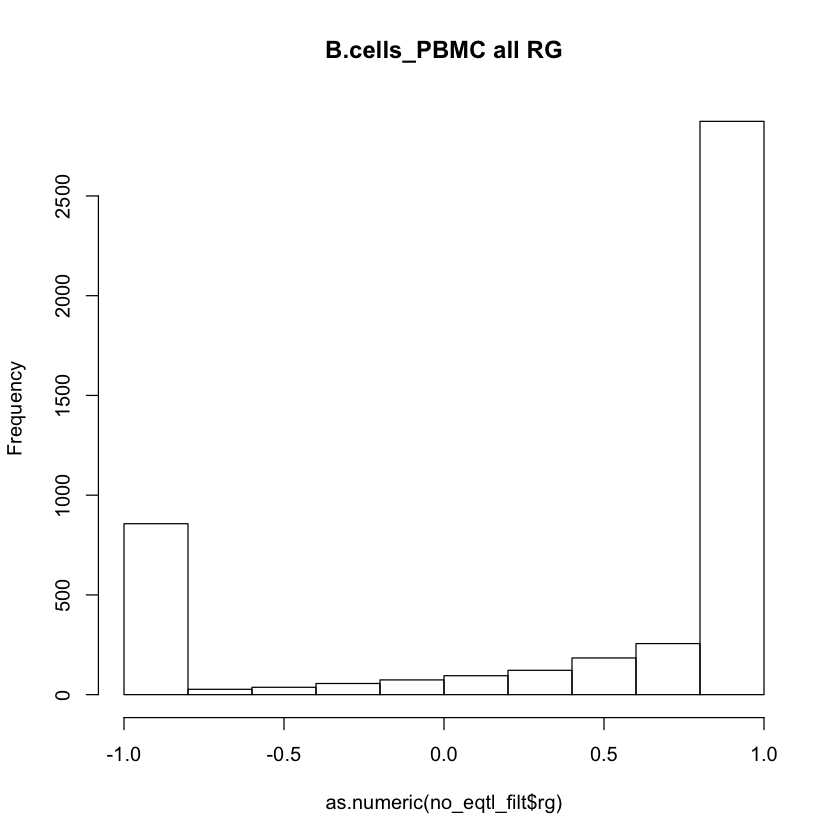

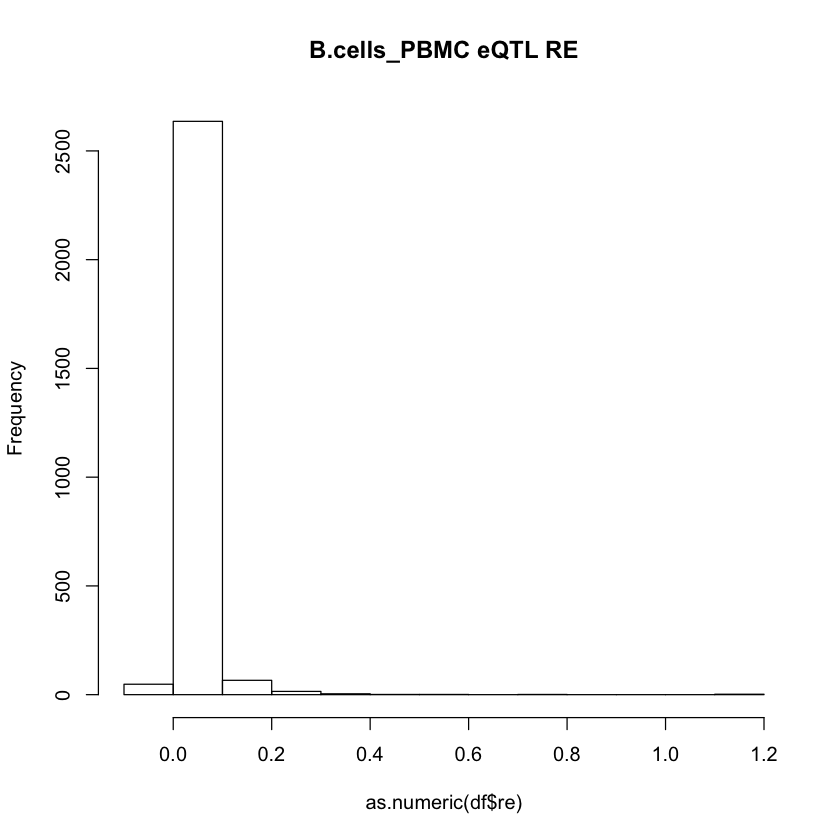

   gene    cell_pair      sg1      se1      sg2      se2       rg       re
1  A1BG B.cells_PBMC 0.016638  0.01015 0.010545 0.007193 0.886465 0.032519
2 AAED1 B.cells_PBMC 0.008316 0.010357 0.001394 0.002515        1 0.048605
3  AATF B.cells_PBMC 0.003691 0.004559  0.00037 0.000711        1 0.005834
4  ABAT B.cells_PBMC 0.010625 0.007445 0.010503 0.006512 0.936845 0.015702
5 ABCA1 B.cells_PBMC 0.013082 0.011261 0.002869 0.009574        1 0.040565
6 ABCA7 B.cells_PBMC 0.005856  0.00845 0.009337 0.005907 0.790088  0.00864
     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes Megakaryocytes
1 0.162072               0           1                 1              0
2 0.291012               0           0                 0              0
3 0.791818               1           0                 0              0
4  0.20948               0           0                 1              0
5 1.218656               0           0                 0              0
6 0.563552               0           0     

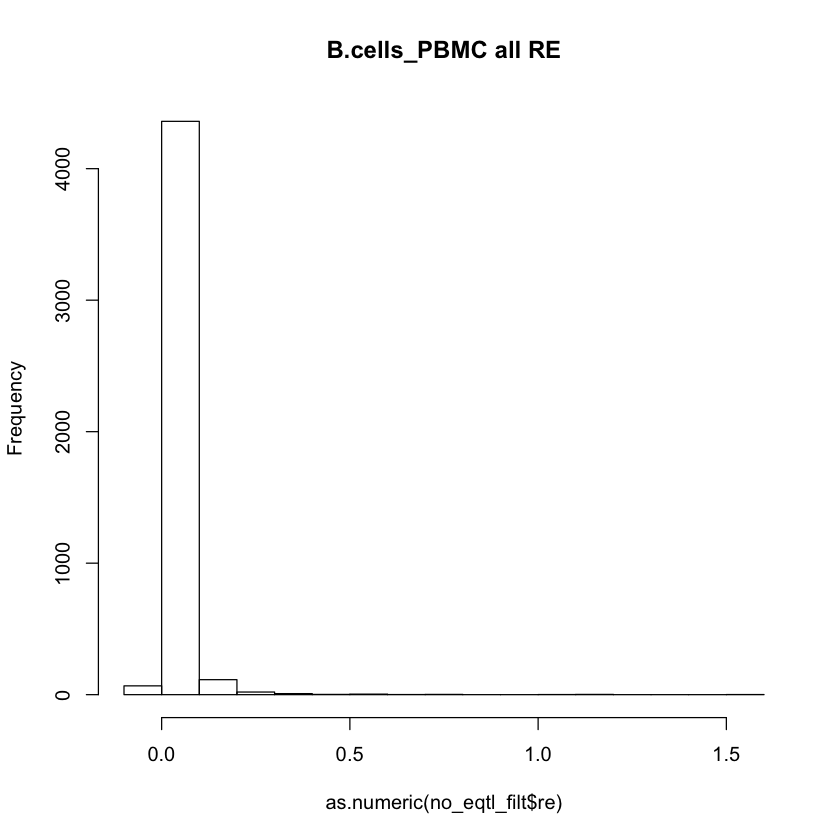

NULL


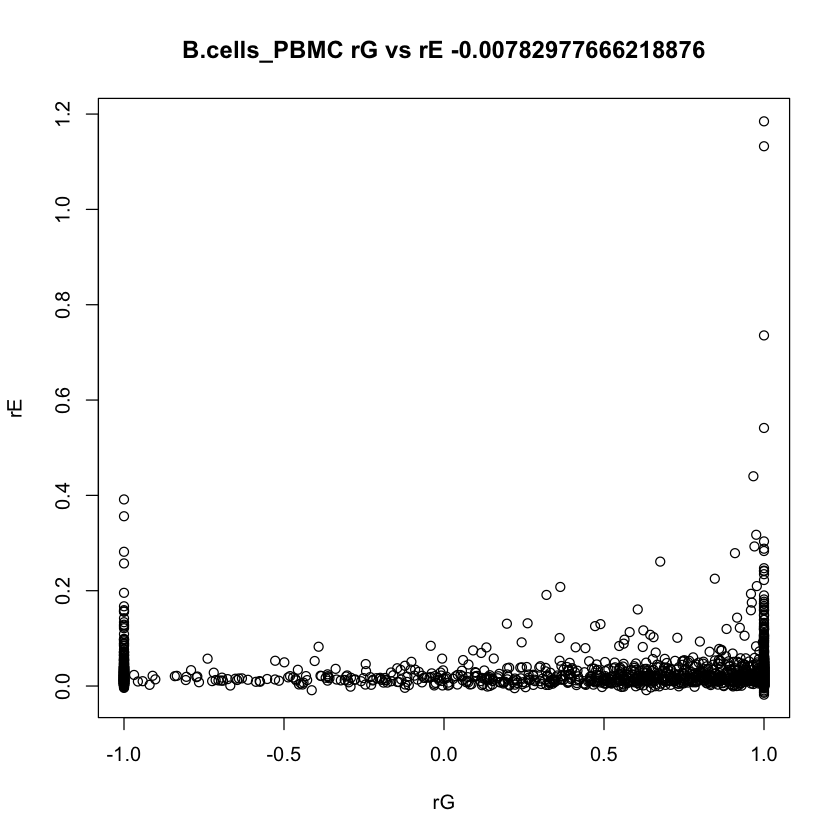

     cell_pair    gene      sg1      se1      sg2      se2        rg       re
1 B.cells_PBMC   ACBD3  0.00699 0.010508 0.003846 0.004765 -0.170997 0.057753
2 B.cells_PBMC    ADAR 0.025222 0.014951 0.005796 0.004888  0.751463 0.054123
3 B.cells_PBMC ADIPOR1 0.000261 0.003739  4.1e-05 0.001452         1 0.010068
4 B.cells_PBMC   AGMAT  0.00131 0.003002 0.000176 0.004719        -1 0.007085
5 B.cells_PBMC    AGO3 0.001849 0.003092 0.001094 0.001119         1  0.01085
6 B.cells_PBMC    AGO4 0.000431 0.001459 0.003607 0.004195        -1 0.018181
      rg_se
1  1.229171
2  0.199409
3 18.016565
4 14.486489
5  0.409514
6  1.741307
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.491473206314405"
[1] "median" "1"     
[1] "var"               "0.605538506555129"
[1] "in 0,1 range" "3520"         "of"           "4561"        
[1] "rE info"
[1] "min"       "-0.018119"
[1] "max"      "1.566103"
[1] "mean"              "0.027772231966674"
[1] "median"   "0.017435"
[1] "var"   

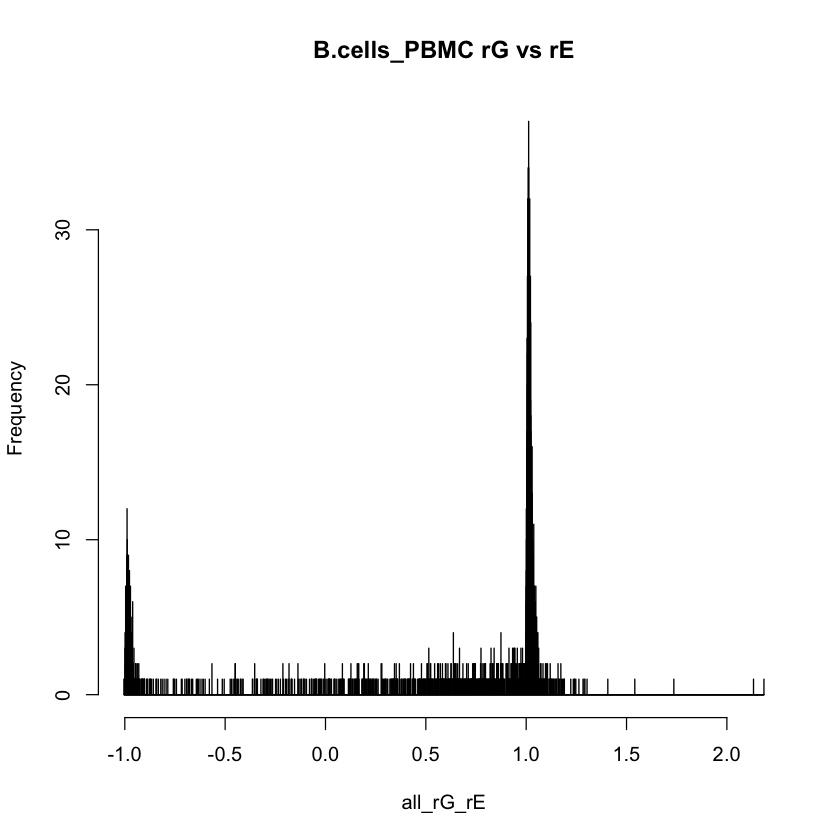

NULL


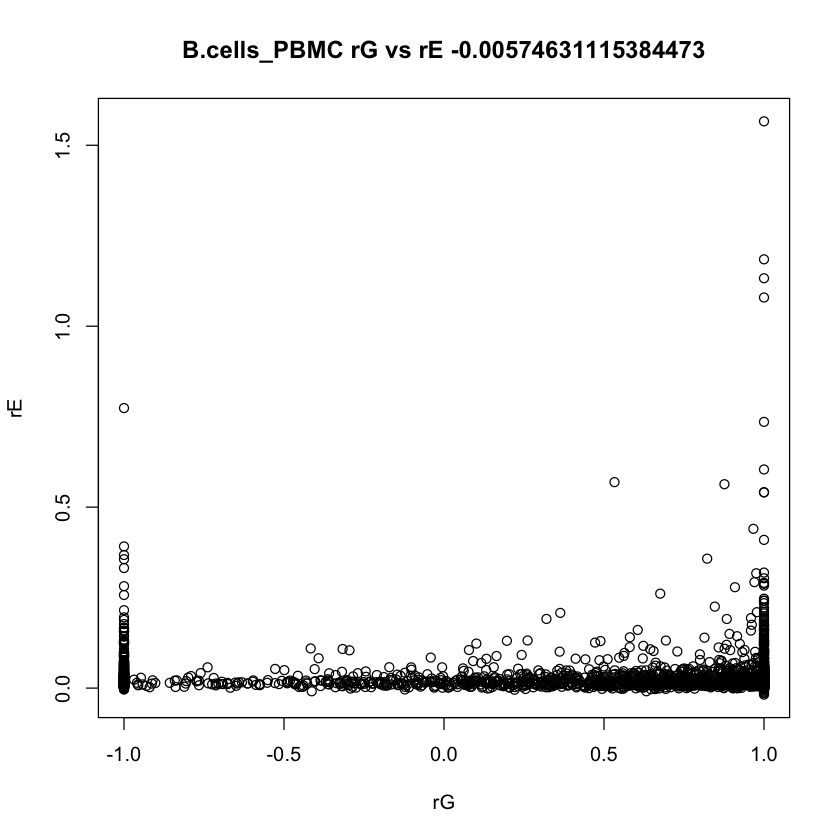

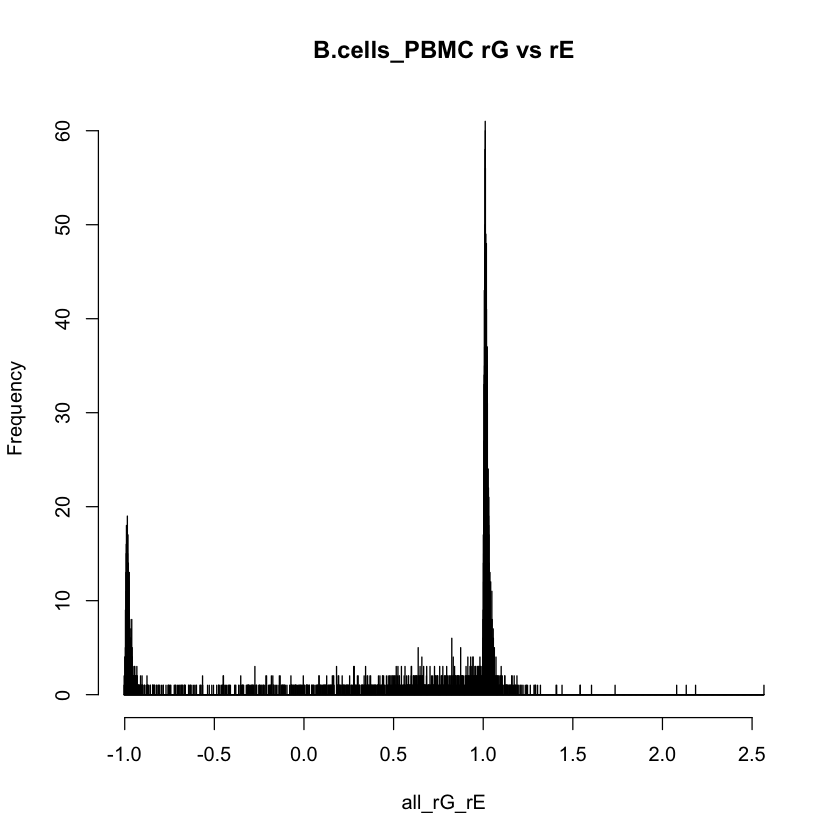

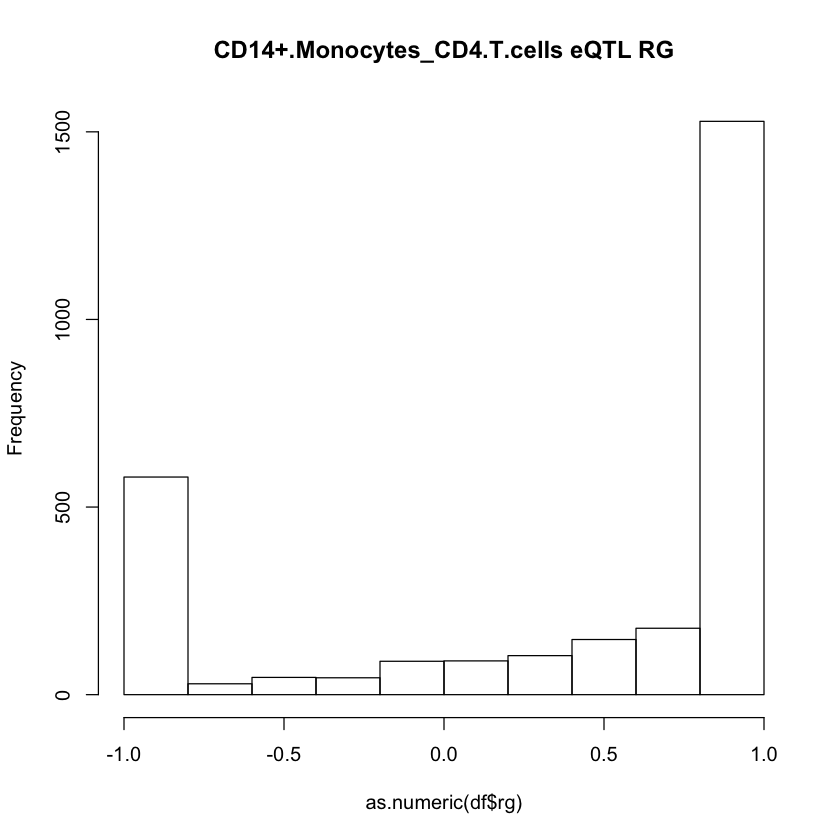

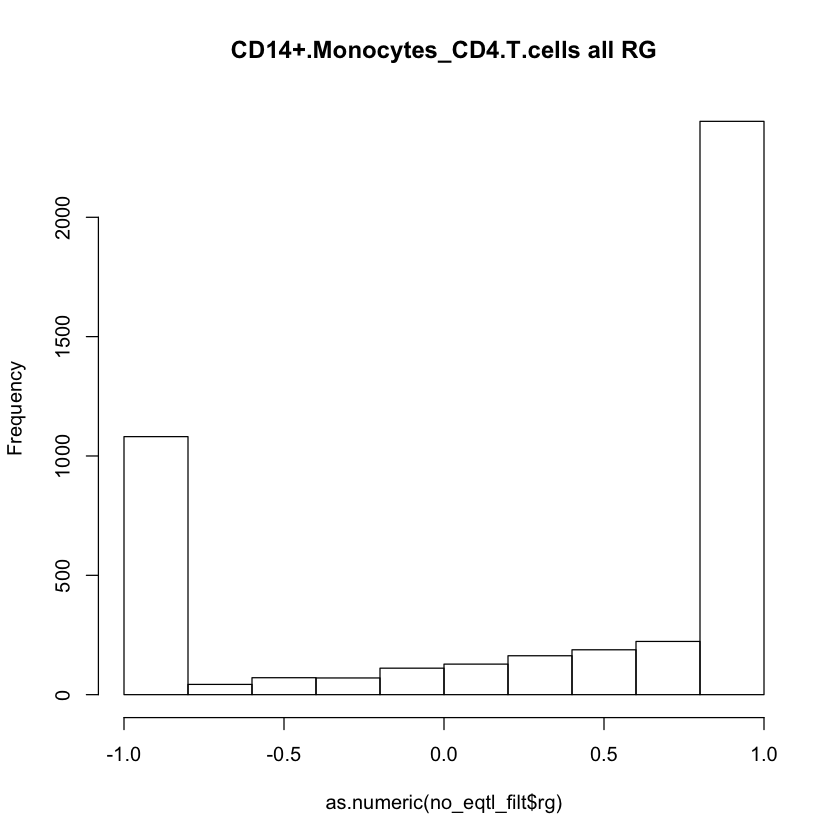

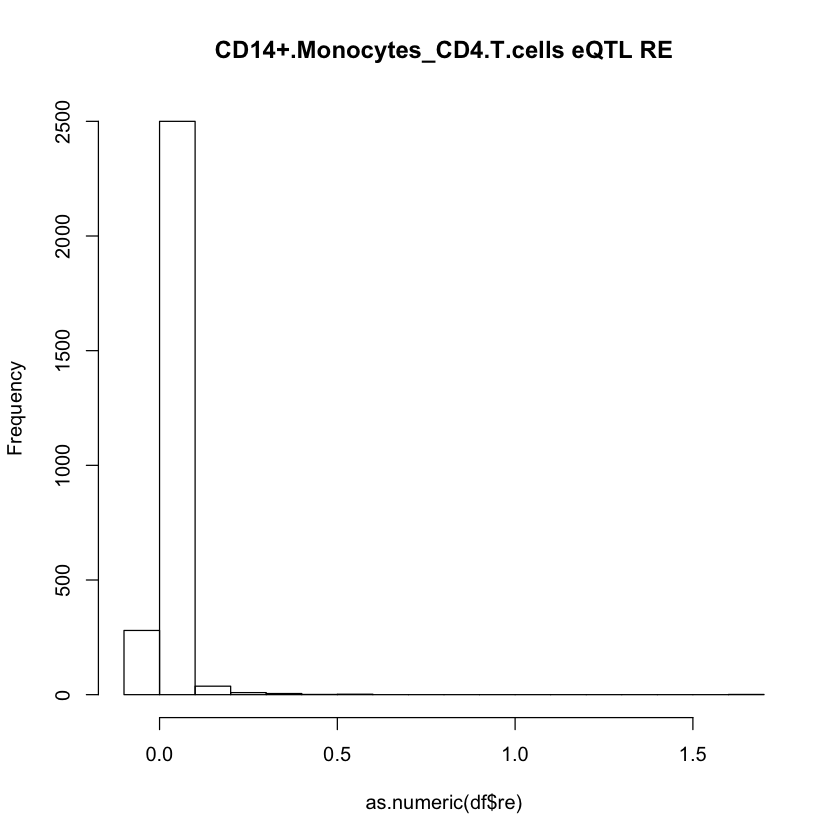

     gene                   cell_pair      sg1      se1      sg2      se2
1    A1BG CD14+.Monocytes_CD4.T.cells 0.024952 0.014976 0.001374 0.003502
2 A2M-AS1 CD14+.Monocytes_CD4.T.cells 0.003813 0.003709 0.048626 0.024989
3   AAED1 CD14+.Monocytes_CD4.T.cells 0.001813 0.002659 0.004206 0.005597
4   AAGAB CD14+.Monocytes_CD4.T.cells 0.012599  0.00609 0.003247 0.003148
5   AAMDC CD14+.Monocytes_CD4.T.cells 0.003931  0.00345 0.002836 0.002474
6    ABAT CD14+.Monocytes_CD4.T.cells 0.008463  0.00662 0.000694 0.002447
         rg       re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.537354 0.035517 0.761466               0           1                 1
2         1 0.009615 0.306256               0           1                 0
3  0.423475 0.014054 0.850955               0           0                 0
4         1 0.000626 0.341404               0           0                 0
5 -0.342576 0.012944 0.649761               0           0                 0
6         1    0.001 1.717

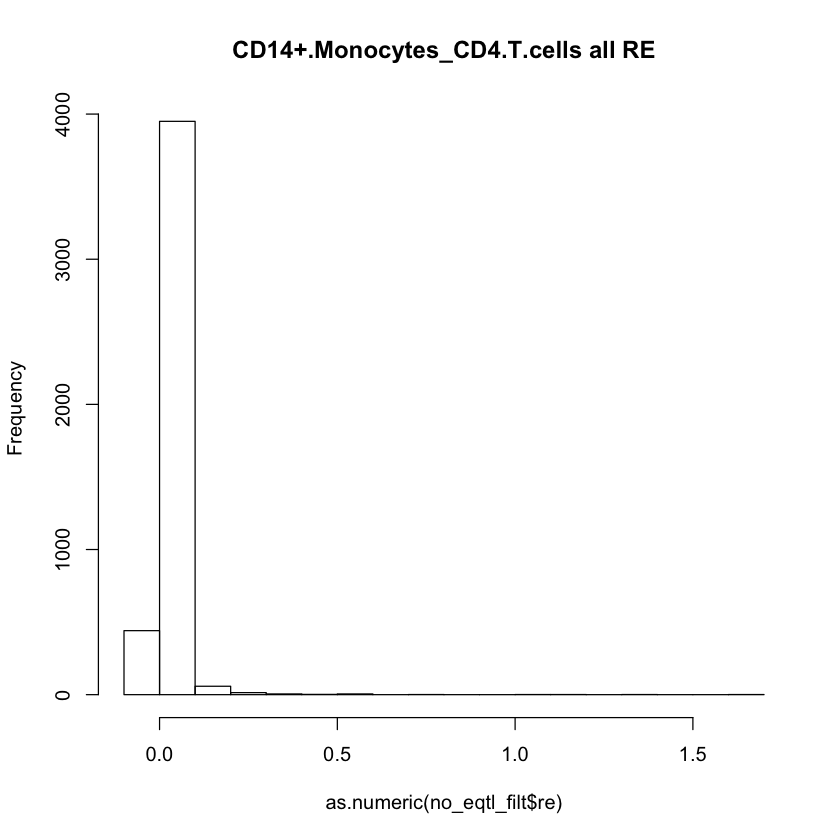

NULL


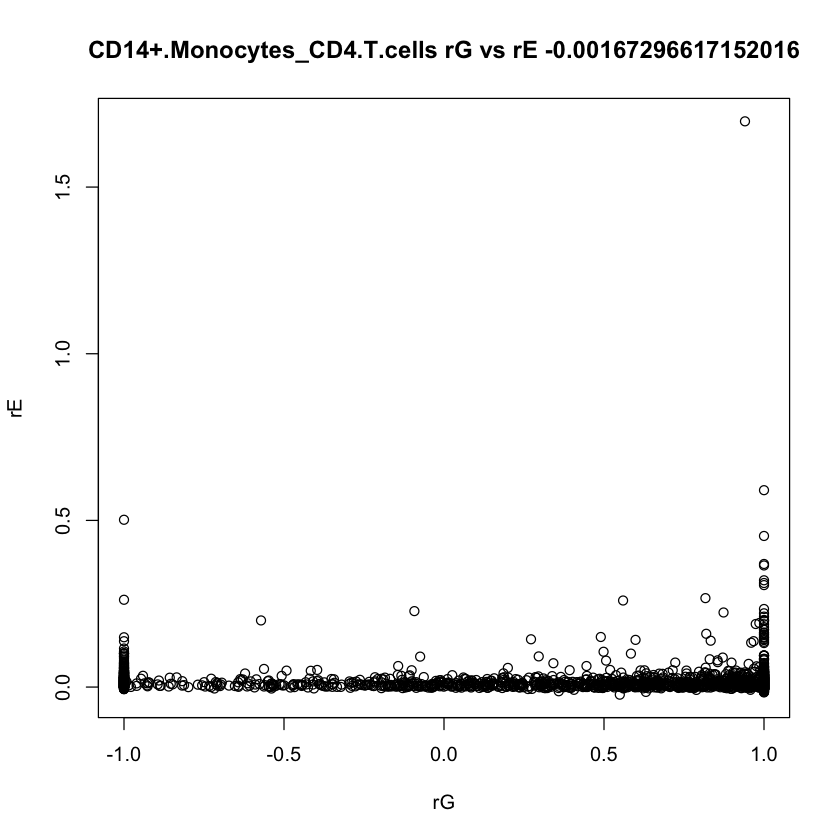

                    cell_pair    gene      sg1      se1      sg2      se2
1 CD14+.Monocytes_CD4.T.cells   ABCD3 0.004809 0.004052 0.000536 0.002589
2 CD14+.Monocytes_CD4.T.cells   ACAP3 0.002313  0.00279 0.001645 0.002669
3 CD14+.Monocytes_CD4.T.cells   ACBD3 0.013864 0.008124 0.000845 0.003965
4 CD14+.Monocytes_CD4.T.cells  ADAM15 0.005551 0.004631 0.002871 0.003309
5 CD14+.Monocytes_CD4.T.cells    ADAR 0.008965 0.007561 0.005308 0.005087
6 CD14+.Monocytes_CD4.T.cells ADIPOR1        0 0.001347        0 0.002919
        rg       re         rg_se
1 0.773978 0.005177      1.869947
2       -1 0.009942      1.138802
3        1  0.03007      1.690631
4        1 0.009564      0.317058
5 0.925057 0.041952      0.157176
6       -1 0.009686 129993.638267
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.335977984336541"
[1] "median"   "0.900115"
[1] "var"               "0.699847196544332"
[1] "in 0,1 range" "3094"         "of"           "4469"        
[1] "rE info"
[1] "m

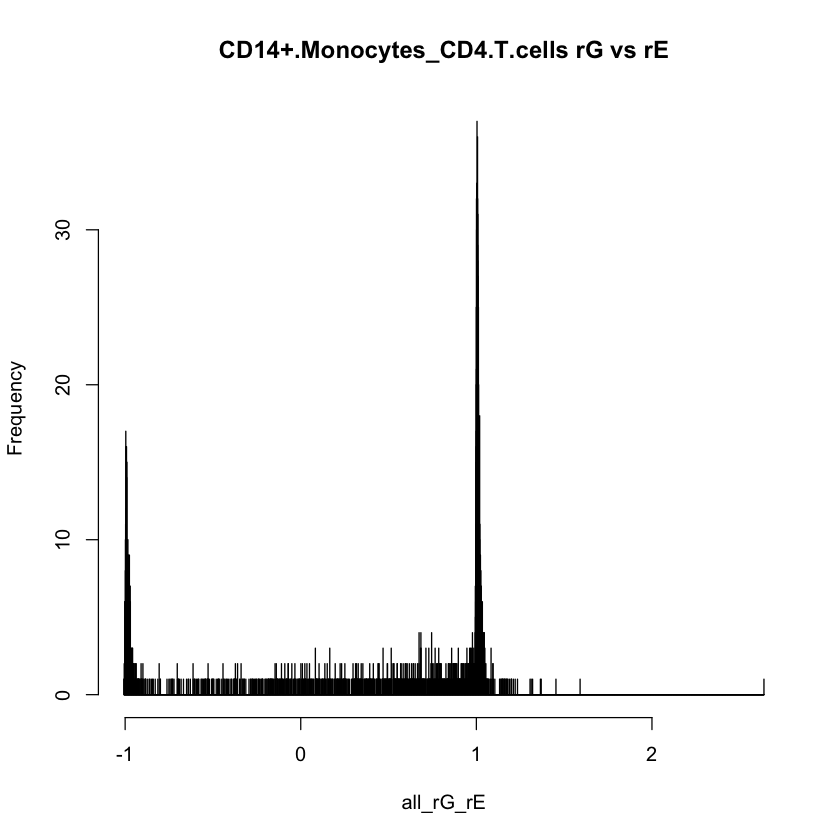

NULL


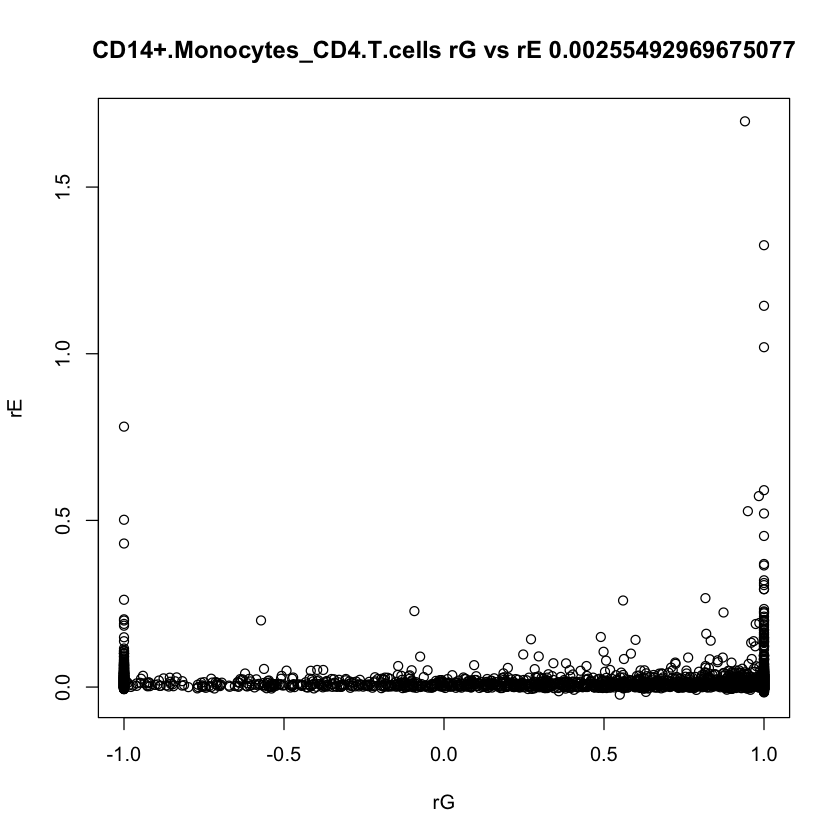

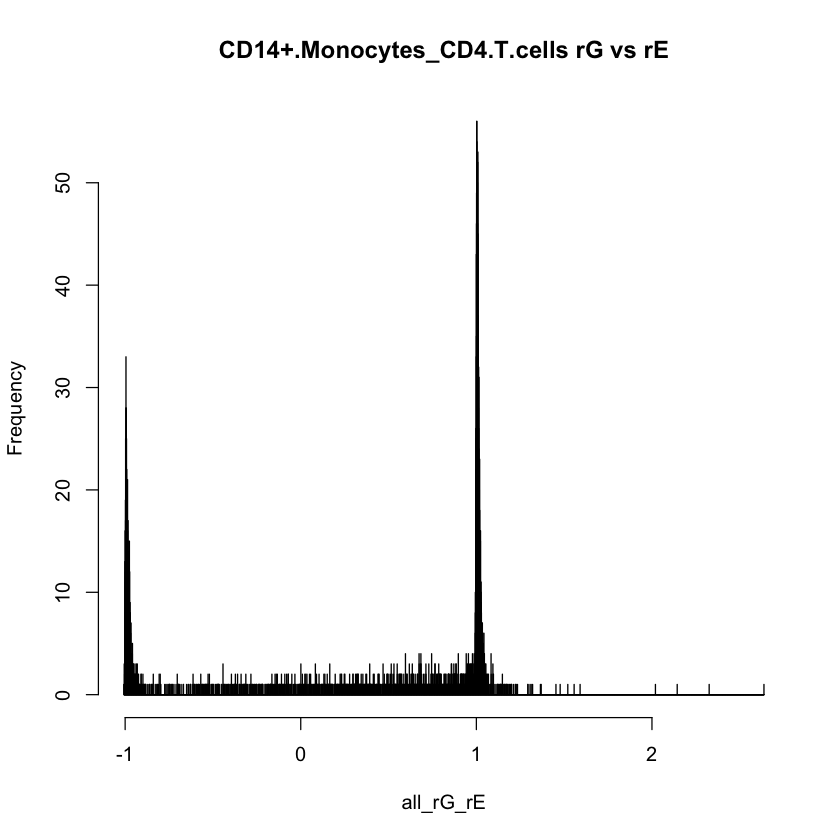

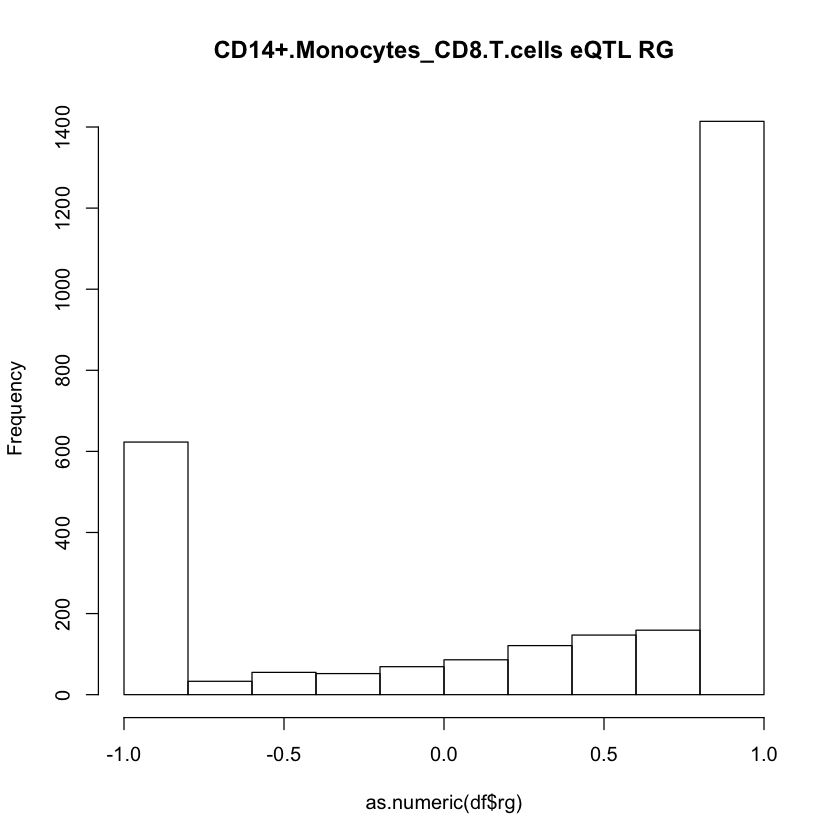

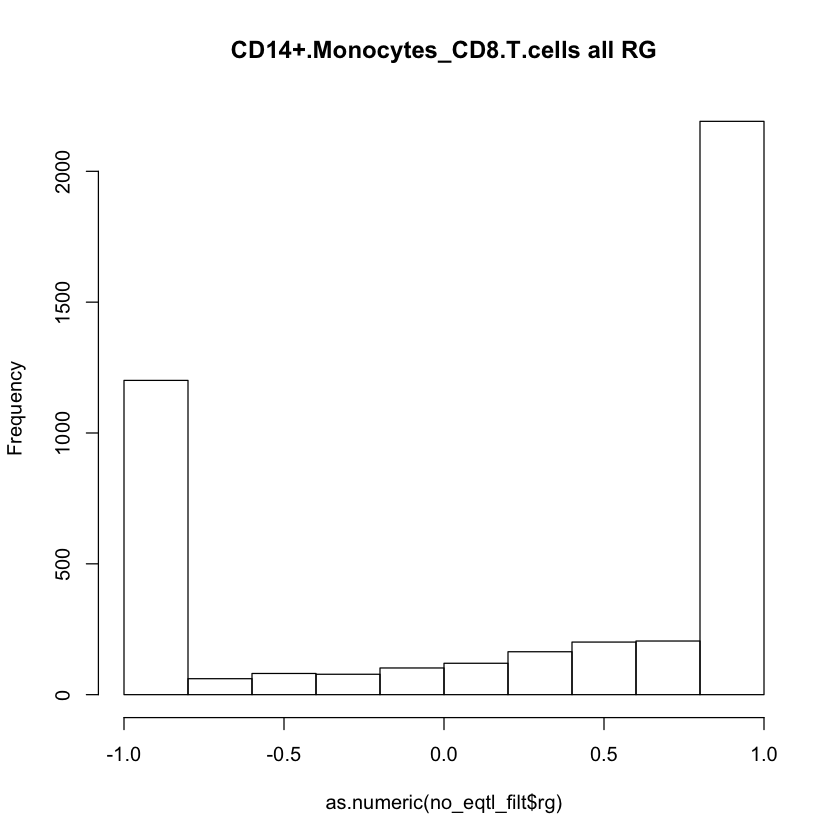

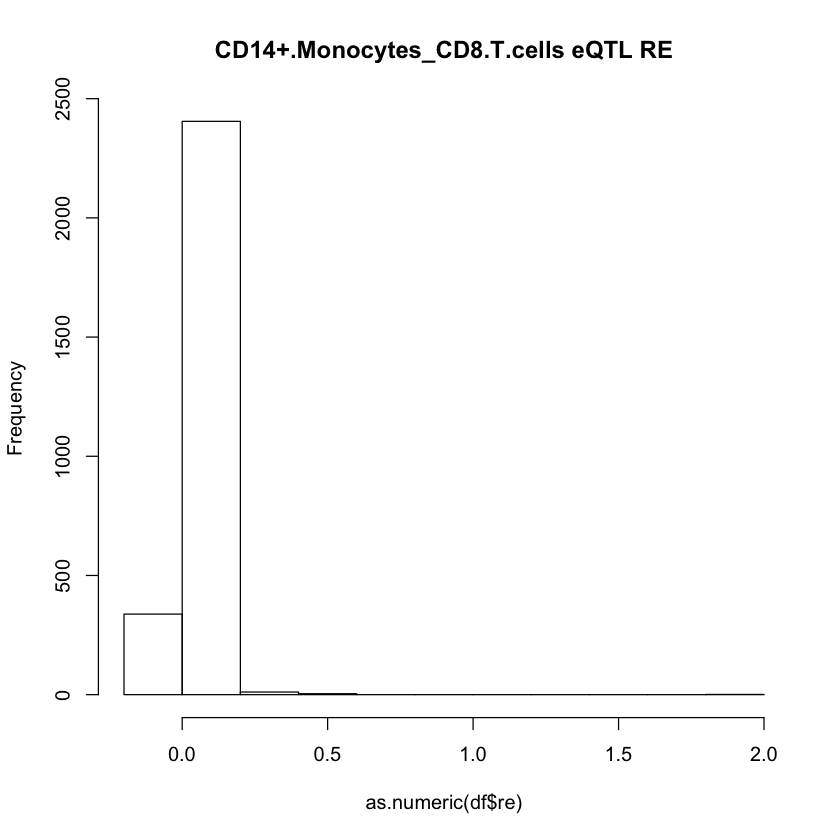

     gene                   cell_pair      sg1      se1      sg2      se2
1 A2M-AS1 CD14+.Monocytes_CD8.T.cells 0.001997 0.003077 0.039404 0.022352
2   AAGAB CD14+.Monocytes_CD8.T.cells  0.01284 0.006197 0.001741 0.003962
3    AATF CD14+.Monocytes_CD8.T.cells        0 0.000725        0 0.002265
4  ABHD11 CD14+.Monocytes_CD8.T.cells 0.012761 0.006998 0.001914 0.003843
5 ABHD17A CD14+.Monocytes_CD8.T.cells  6.5e-05 0.001888 0.012639 0.008107
6   ABHD2 CD14+.Monocytes_CD8.T.cells 0.009138 0.006167 0.001418  0.00378
        rg       re         rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1        1  0.02194      0.497171               0           1                 0
2        1  0.00103      0.971192               0           0                 0
3       -1 0.006965 167973.310495               1           0                 0
4        1 0.010224      0.746699               0           0                 1
5       -1 0.009338     15.219873               0           0                 0
6 

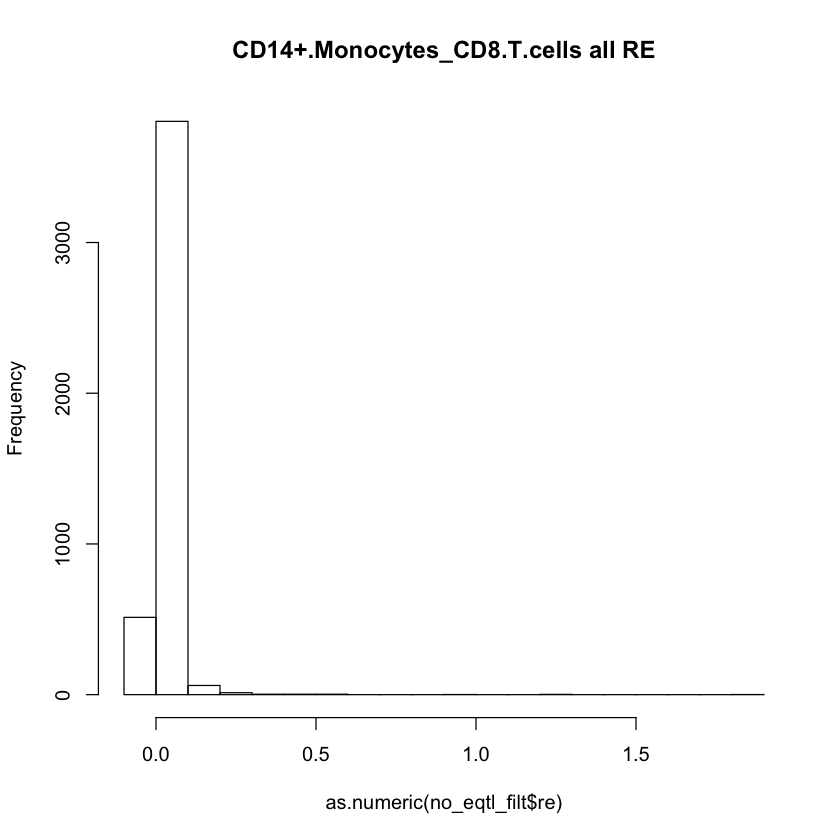

NULL


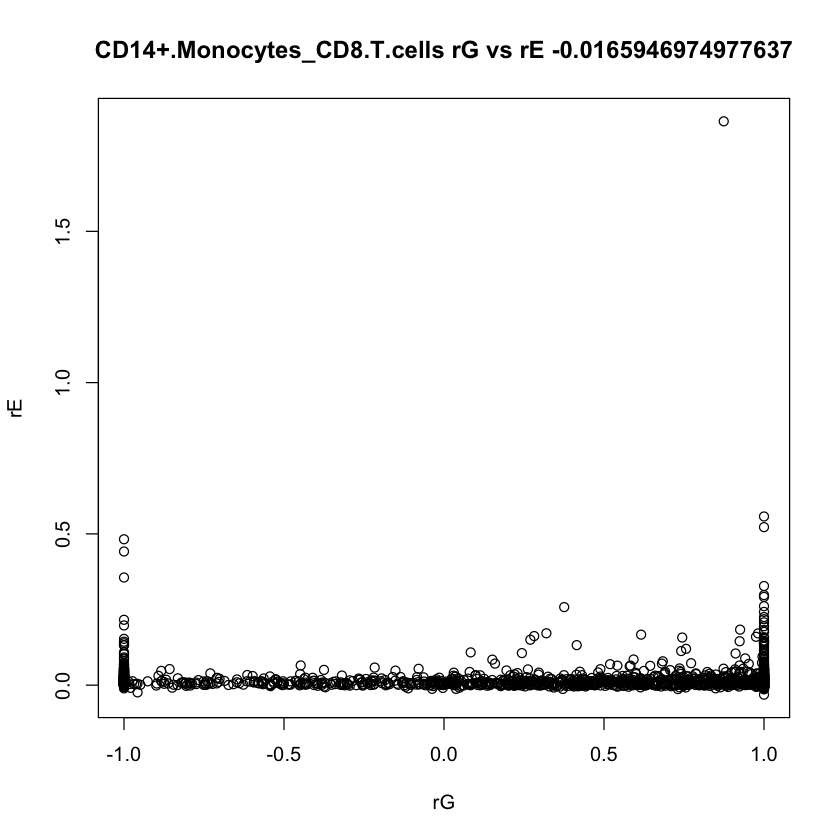

                    cell_pair     gene      sg1      se1      sg2      se2
1 CD14+.Monocytes_CD8.T.cells    ACAP3 0.003037 0.003219 0.002249 0.004093
2 CD14+.Monocytes_CD8.T.cells    ACBD3 0.016725 0.009001 0.007532  0.00768
3 CD14+.Monocytes_CD8.T.cells   ADAM15 0.005572 0.004609 0.006904  0.00464
4 CD14+.Monocytes_CD8.T.cells ADAMTSL4 0.001977 0.002759 0.000262 0.000405
5 CD14+.Monocytes_CD8.T.cells     ADAR  0.00856 0.007401 0.005859 0.005247
6 CD14+.Monocytes_CD8.T.cells  ADIPOR1        0 0.001347        0 0.003054
         rg        re         rg_se
1 -0.357427  0.003307      1.002952
2  0.910966  0.021117       0.30307
3  0.701824  0.003412      0.380917
4         1 -0.000942      0.844369
5   0.84926  0.035146      0.240667
6        -1  0.010342 135158.372097
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"             "0.26533160762383"
[1] "median"   "0.795079"
[1] "var"              "0.74041684352216"
[1] "in 0,1 range" "2868"         "of"           "4381"        
[1]

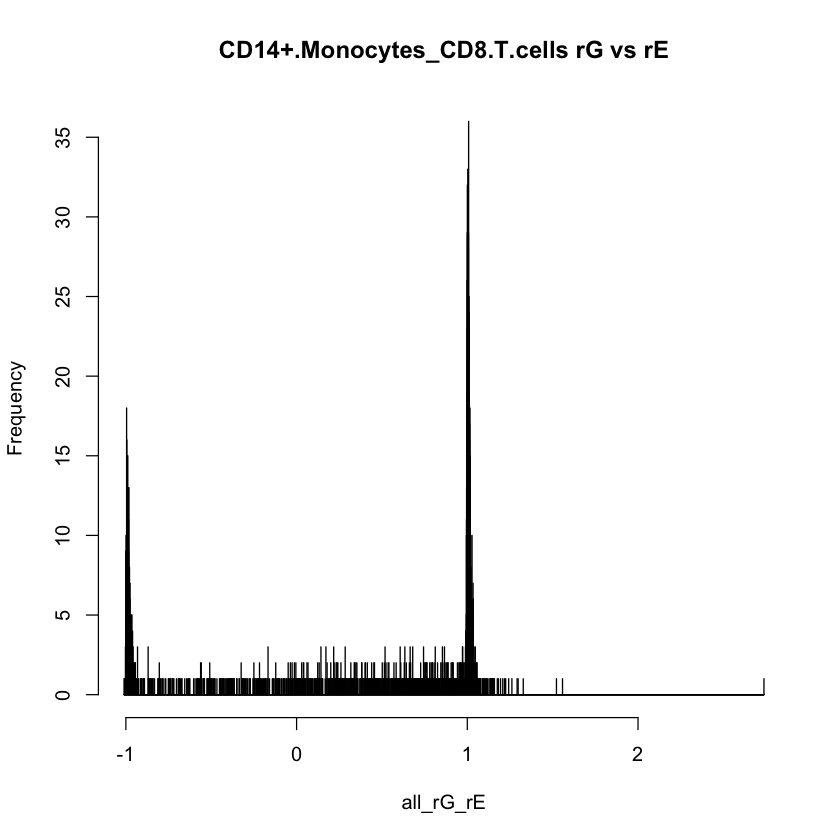

NULL


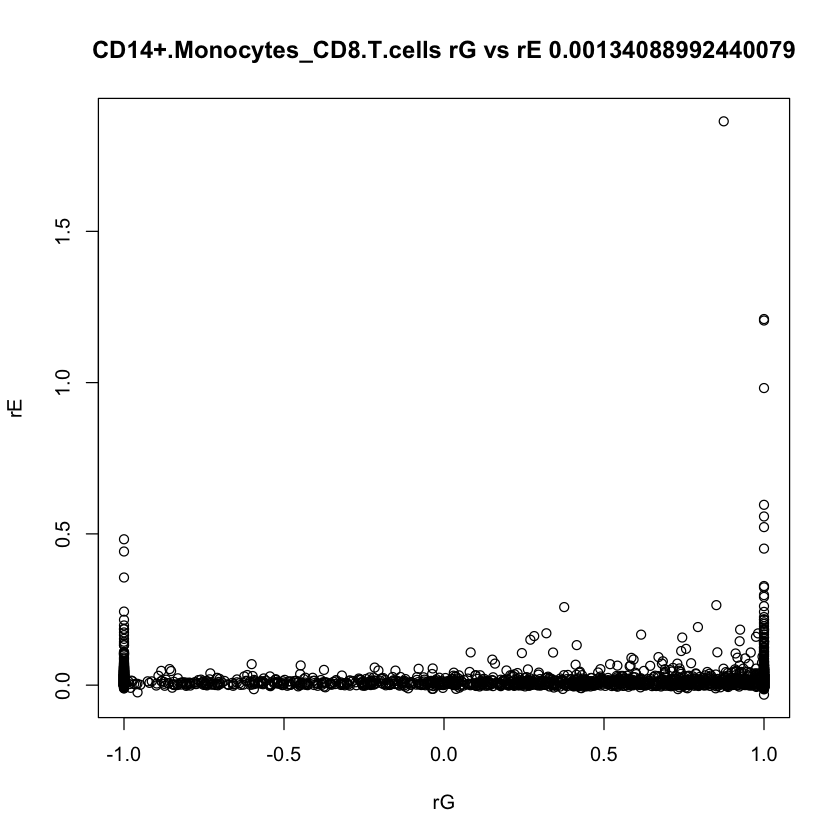

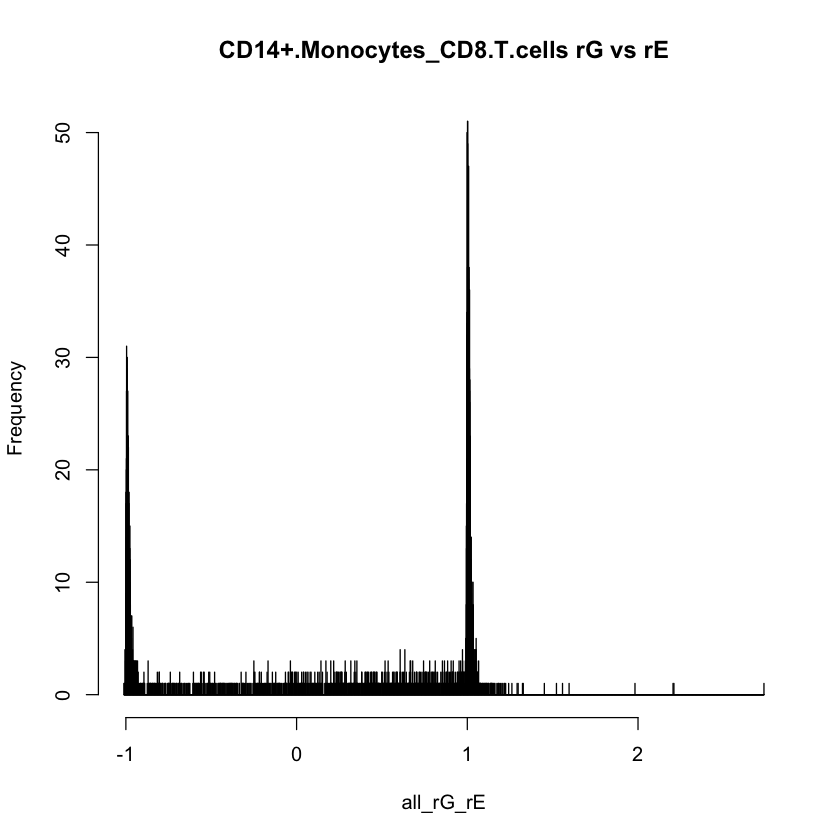

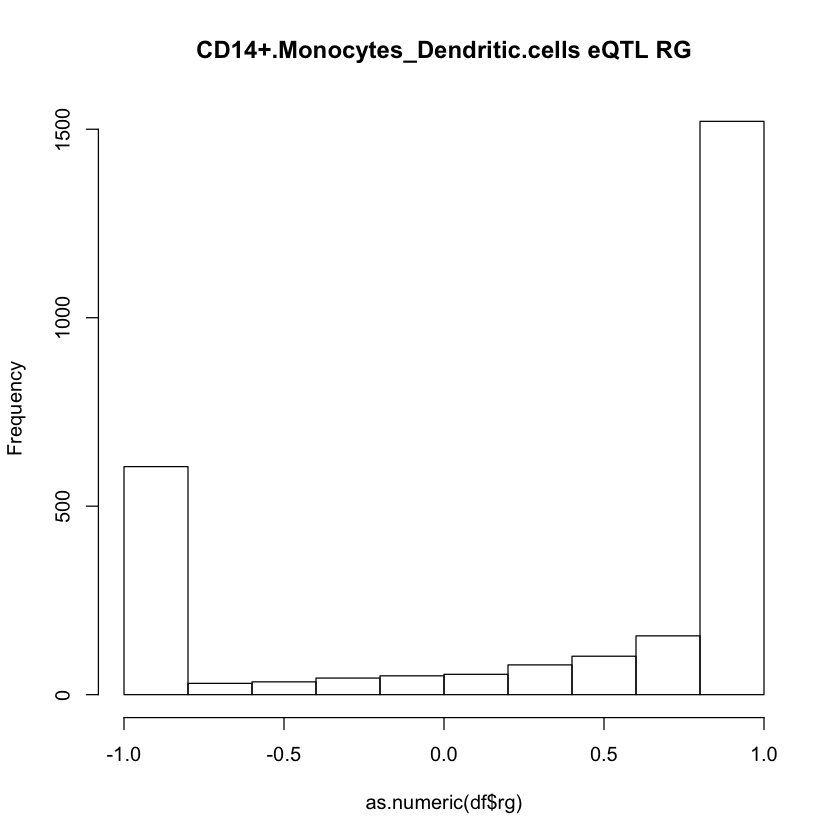

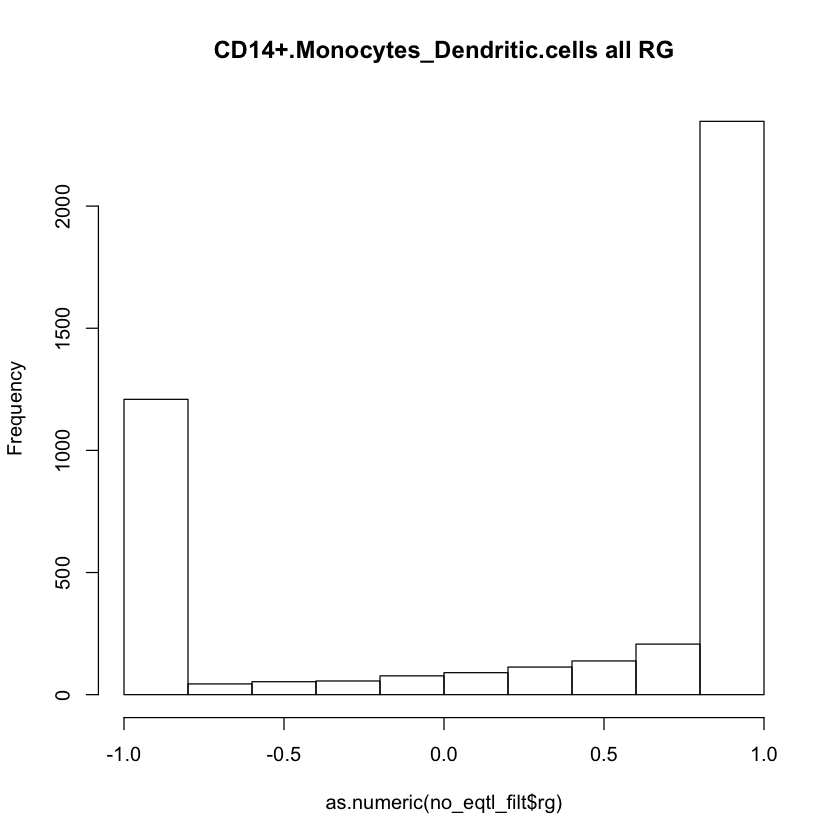

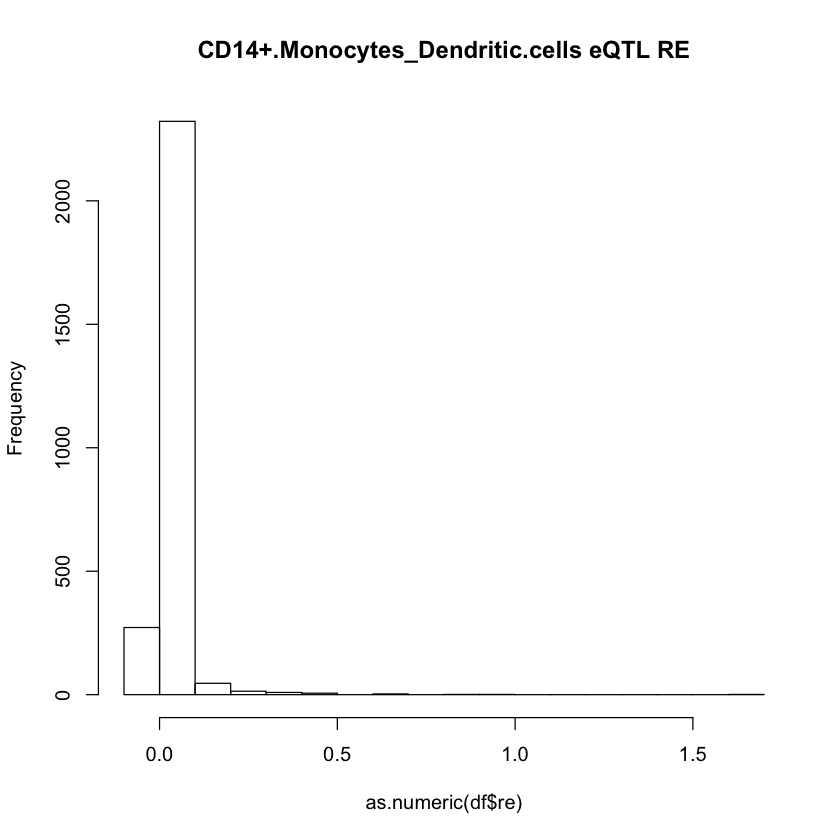

     gene                       cell_pair      sg1      se1      sg2      se2
1    A1BG CD14+.Monocytes_Dendritic.cells 0.026684 0.015687 0.014428 0.011986
2 A2M-AS1 CD14+.Monocytes_Dendritic.cells 0.002747 0.003544 0.004079 0.003092
3   AAED1 CD14+.Monocytes_Dendritic.cells 0.002573  0.00297 0.002649 0.005148
4    ABAT CD14+.Monocytes_Dendritic.cells 0.008107 0.006582 0.000388 0.001696
5   ABCA7 CD14+.Monocytes_Dendritic.cells 0.012378 0.008429  2.5e-05 0.005047
6   ABCC3 CD14+.Monocytes_Dendritic.cells 0.053206 0.020915 0.002461 0.002355
        rg        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.63561  0.040559  0.338105               0           1                 1
2 0.270712    0.0045  0.669087               0           1                 0
3        1  0.003215  0.897578               0           0                 0
4        1  0.005775  1.925927               0           0                 1
5        1  0.010981 100.93137               0           0           

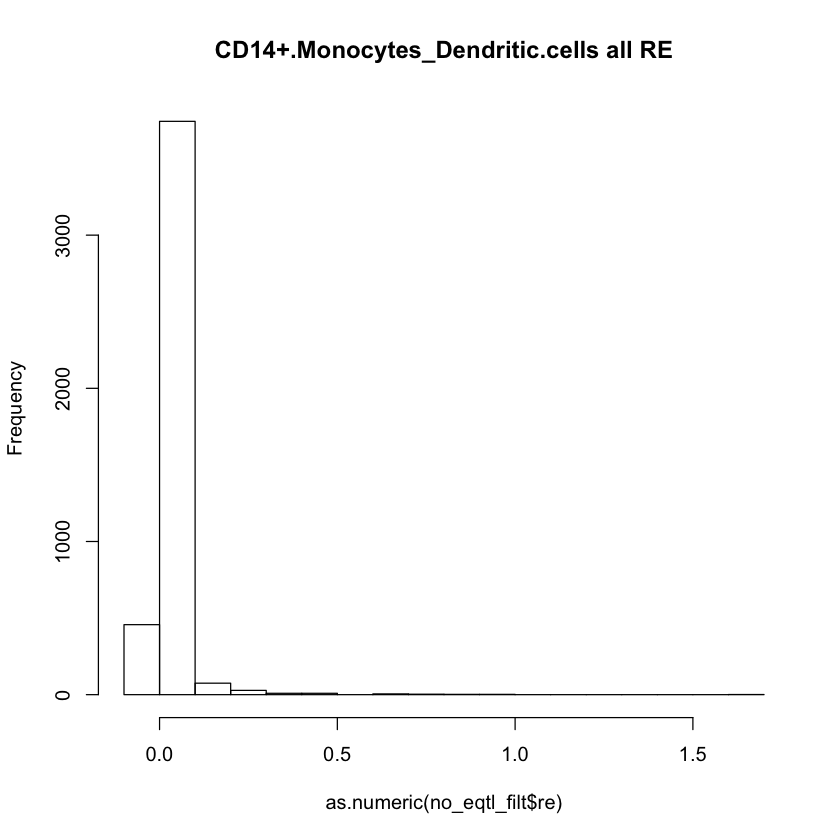

NULL


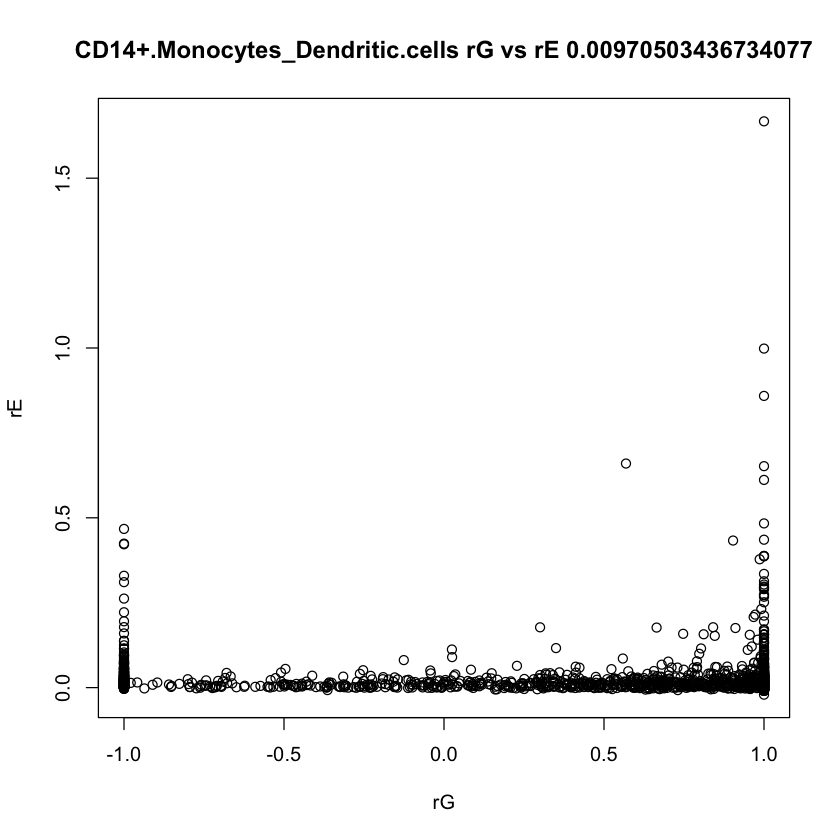

                        cell_pair   gene      sg1      se1      sg2      se2
1 CD14+.Monocytes_Dendritic.cells  ABCD3 0.004652  0.00386 0.005171 0.004678
2 CD14+.Monocytes_Dendritic.cells  ACAP3 0.003239 0.003291 0.000996 0.003167
3 CD14+.Monocytes_Dendritic.cells  ACBD3 0.013379 0.008002  0.00284 0.004657
4 CD14+.Monocytes_Dendritic.cells ADAM15  0.00493 0.004464 0.000792 0.003295
5 CD14+.Monocytes_Dendritic.cells   ADAR  0.00856 0.007286 0.019885 0.014926
6 CD14+.Monocytes_Dendritic.cells  ADCK3 0.000161  0.00163  0.00019 0.002709
         rg        re     rg_se
1         1 -0.002584  0.519136
2 -0.703393  0.000813  1.435766
3         1  0.012864  0.590879
4         1  0.017966  1.526465
5         1  0.061041  0.104243
6         1 -0.000651 11.596212
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.298248927909133"
[1] "median"    "0.9442285"
[1] "var"               "0.763924489600775"
[1] "in 0,1 range" "2881"         "of"           "4314"        
[1] "rE inf

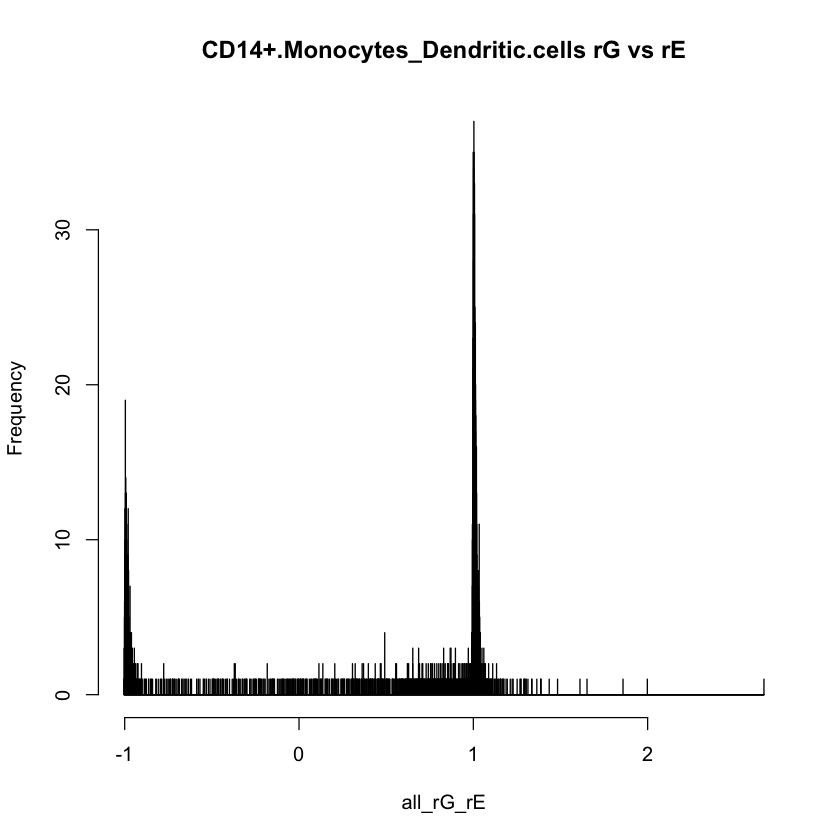

NULL


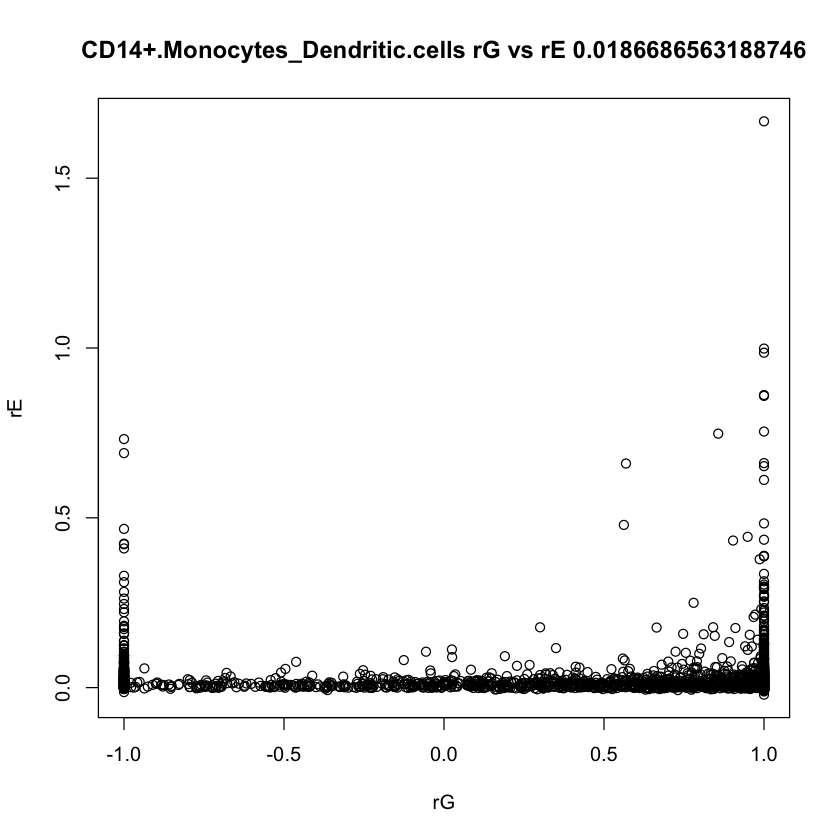

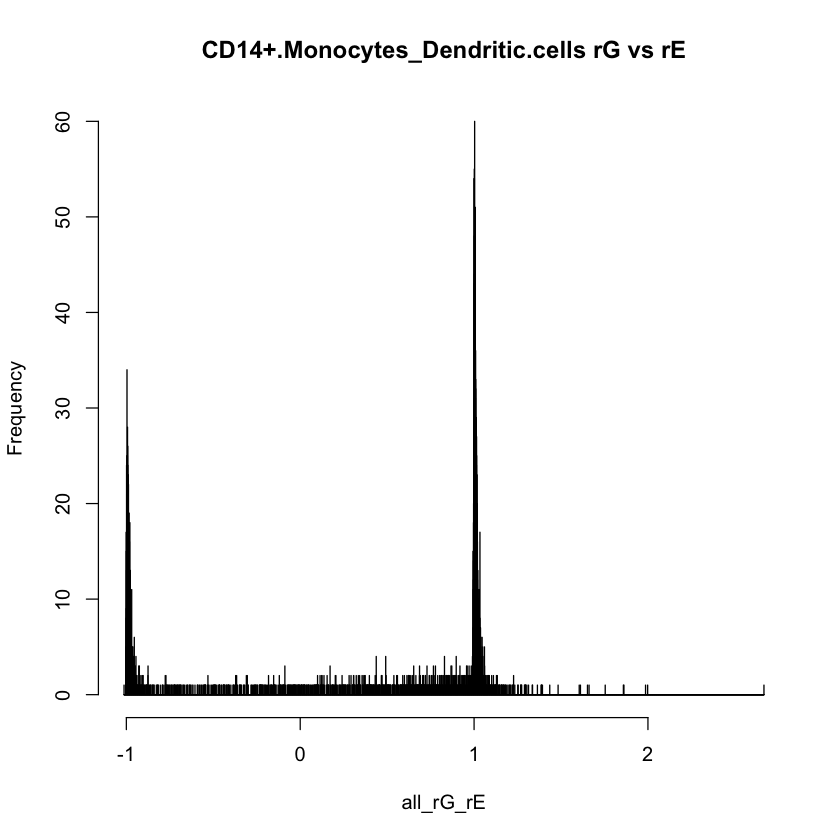

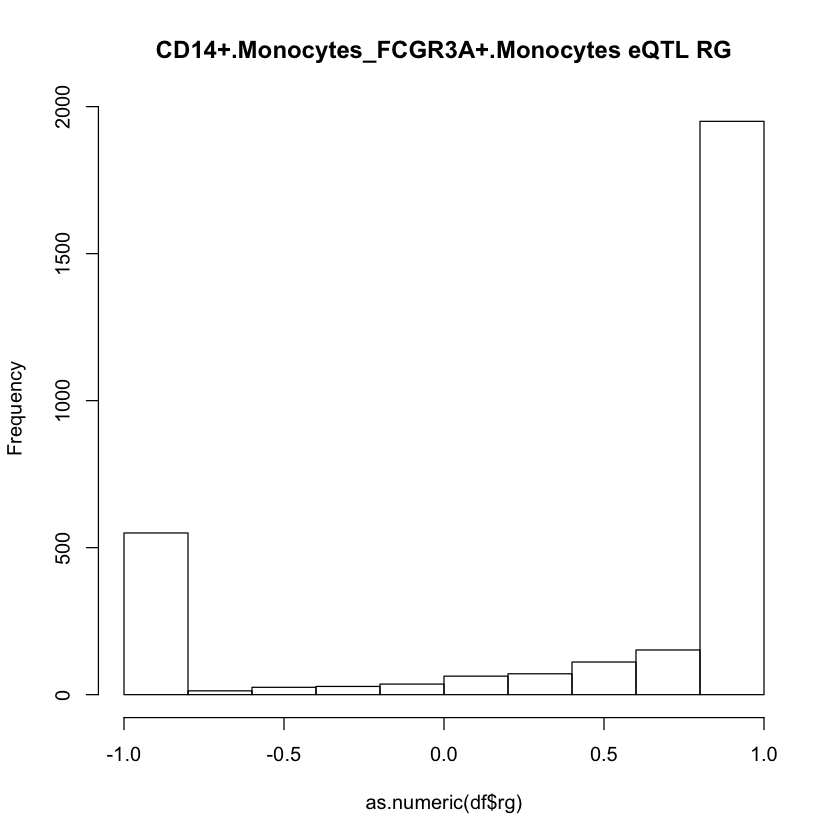

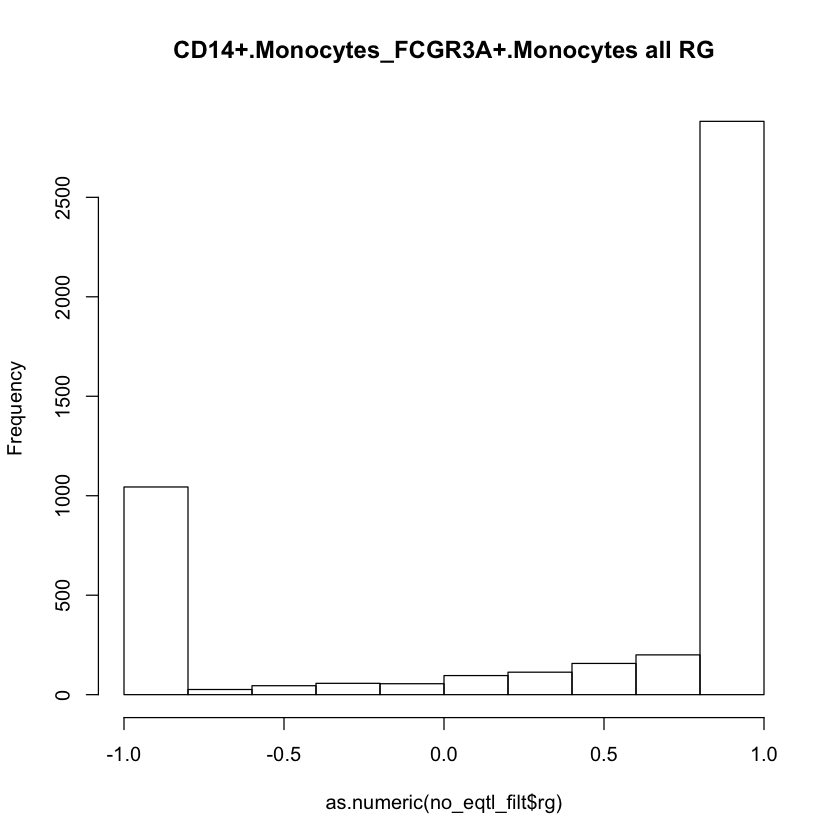

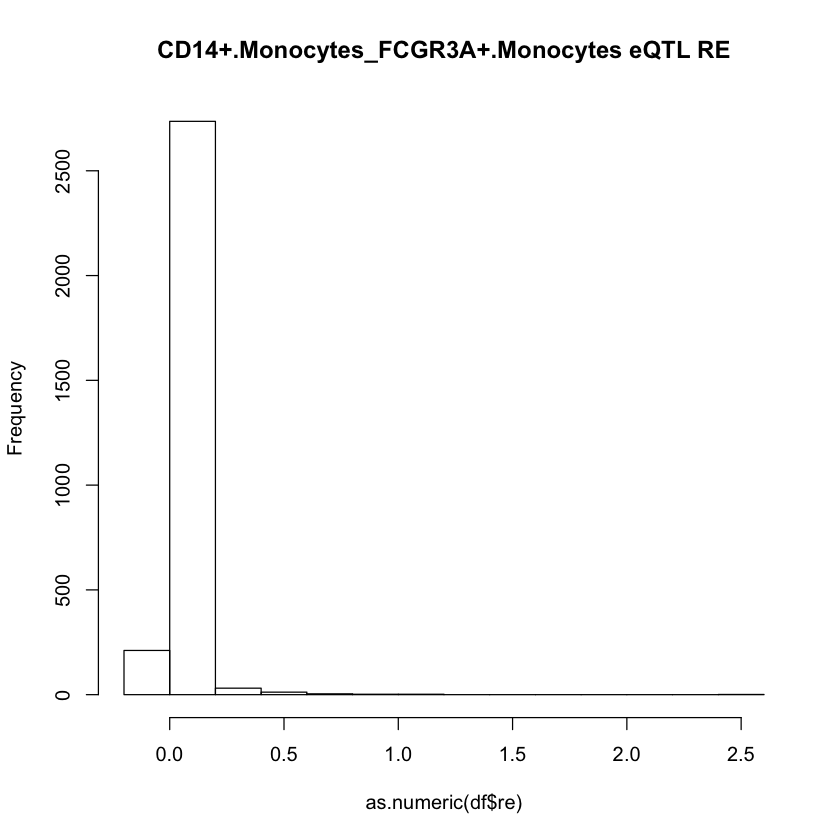

     gene                         cell_pair      sg1      se1      sg2      se2
1    A1BG CD14+.Monocytes_FCGR3A+.Monocytes 0.027213 0.015854  0.01622 0.012944
2 A2M-AS1 CD14+.Monocytes_FCGR3A+.Monocytes  0.00278 0.003561  3.1e-05 0.001246
3   AAED1 CD14+.Monocytes_FCGR3A+.Monocytes 0.001541 0.002474 0.005219 0.005612
4   AAGAB CD14+.Monocytes_FCGR3A+.Monocytes 0.011971 0.006013 0.003964 0.004719
5   AAMDC CD14+.Monocytes_FCGR3A+.Monocytes   0.0032 0.003097 0.003495 0.003665
6   AASDH CD14+.Monocytes_FCGR3A+.Monocytes 0.003417 0.004083 0.002218 0.004329
         rg       re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.906878 0.073322  0.143098               0           1                 1
2         1 0.004445 19.331574               0           1                 0
3 -0.212216 0.028276  1.090098               0           0                 0
4         1 0.007427   0.38867               0           0                 0
5         1 0.011236  0.321802               0         

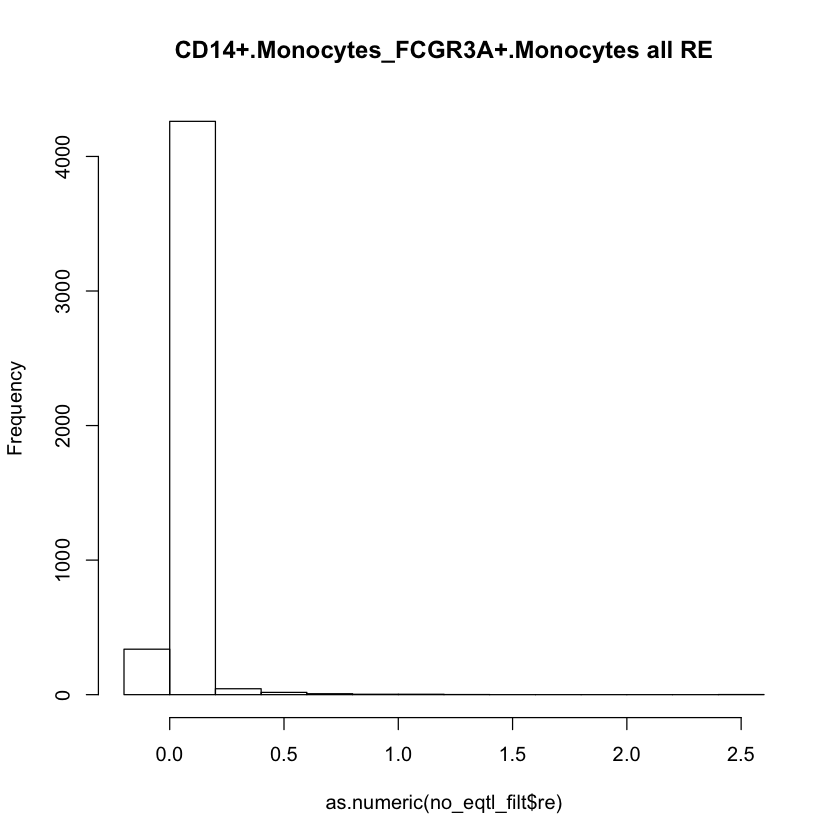

NULL


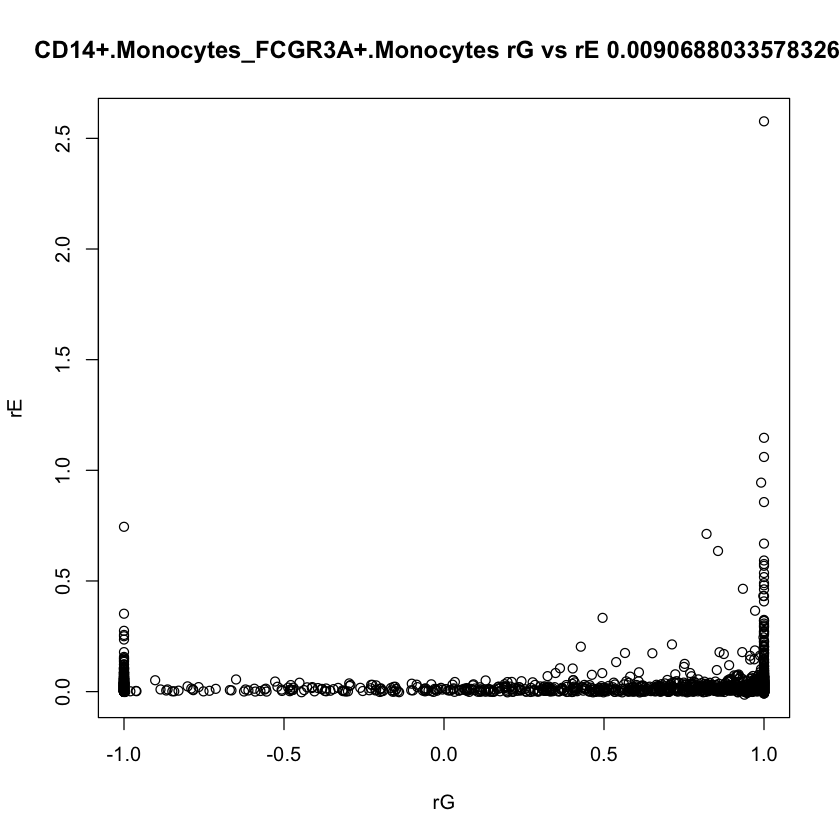

                          cell_pair   gene      sg1      se1      sg2      se2
1 CD14+.Monocytes_FCGR3A+.Monocytes ABCB10        0 0.002578        0 0.003598
2 CD14+.Monocytes_FCGR3A+.Monocytes  ABCD3 0.004969   0.0041  0.00122  0.00375
3 CD14+.Monocytes_FCGR3A+.Monocytes  ACADM 0.002854 0.003195 0.006578 0.005993
4 CD14+.Monocytes_FCGR3A+.Monocytes  ACAP3 0.003251   0.0032 0.002543 0.003049
5 CD14+.Monocytes_FCGR3A+.Monocytes  ACBD3 0.015827  0.00877 0.007693 0.007914
6 CD14+.Monocytes_FCGR3A+.Monocytes ADAM15 0.005539 0.004746 0.003345 0.004536
        rg       re        rg_se
1       -1 0.024831 106111.62236
2 0.418663 0.005491     1.123382
3        1 0.023558      0.24316
4        1  0.00265      0.53372
5        1 0.029329     0.241044
6  0.71173 0.018049     0.498831
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.430981084352865"
[1] "median" "1"     
[1] "var"               "0.678410519997181"
[1] "in 0,1 range" "3440"         "of"           "4659"     

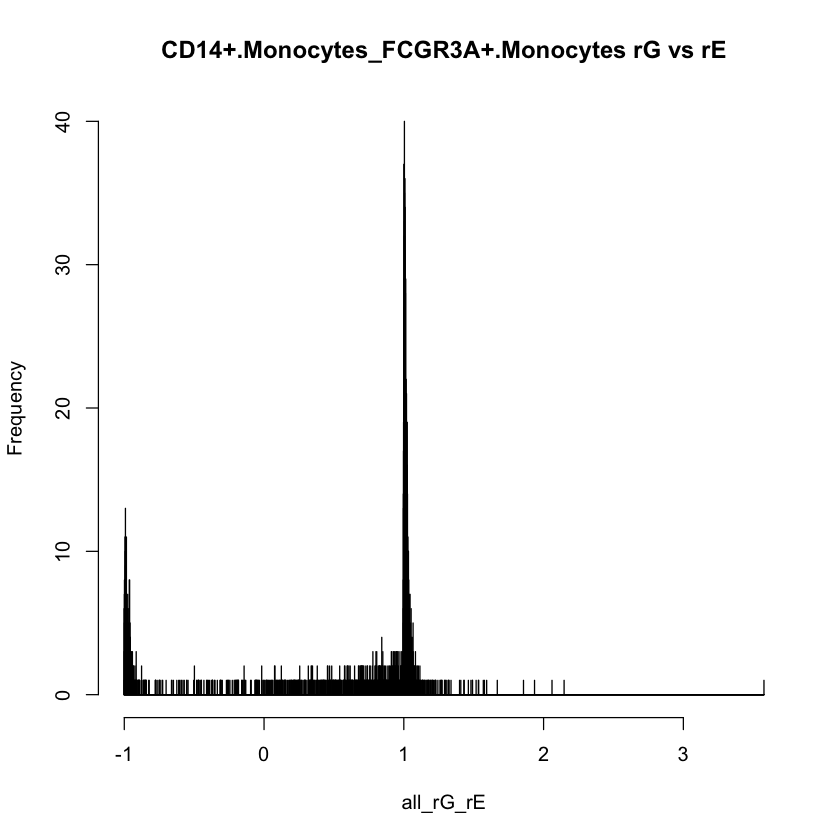

NULL


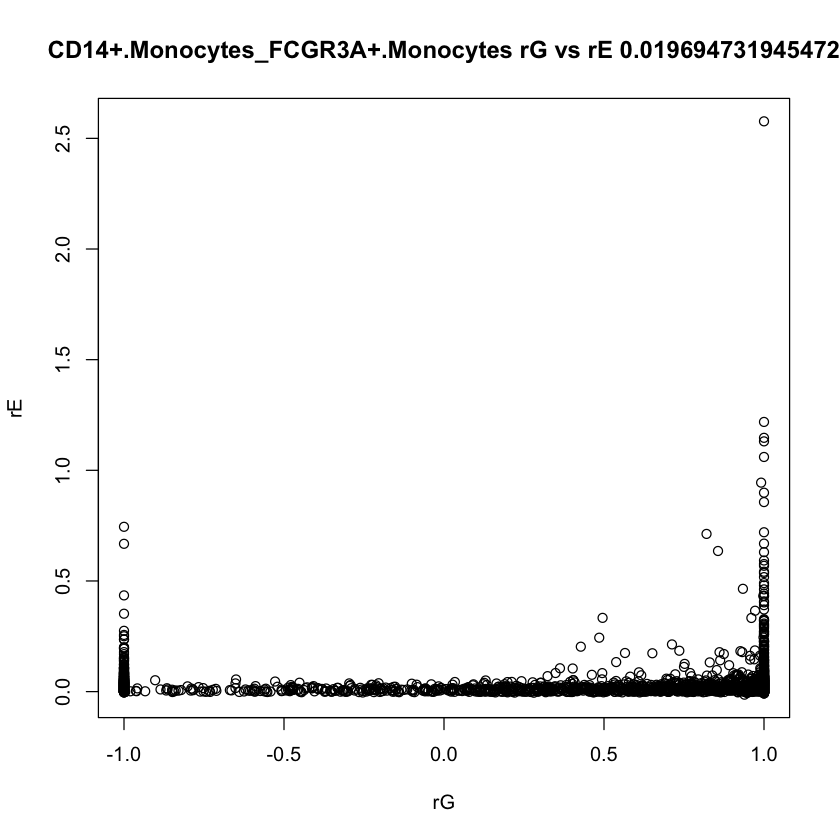

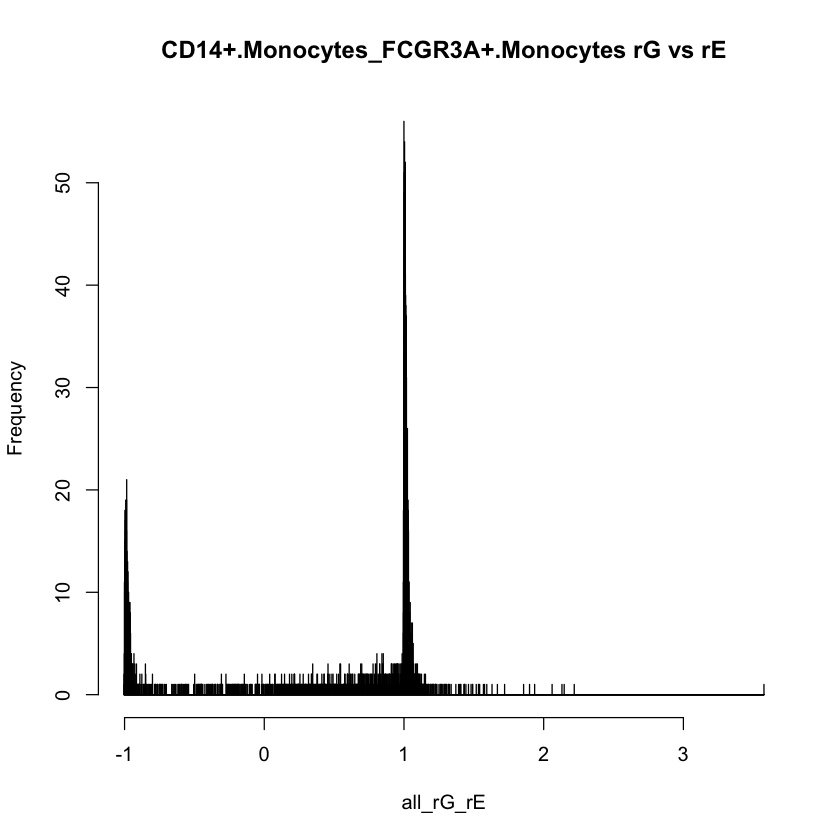

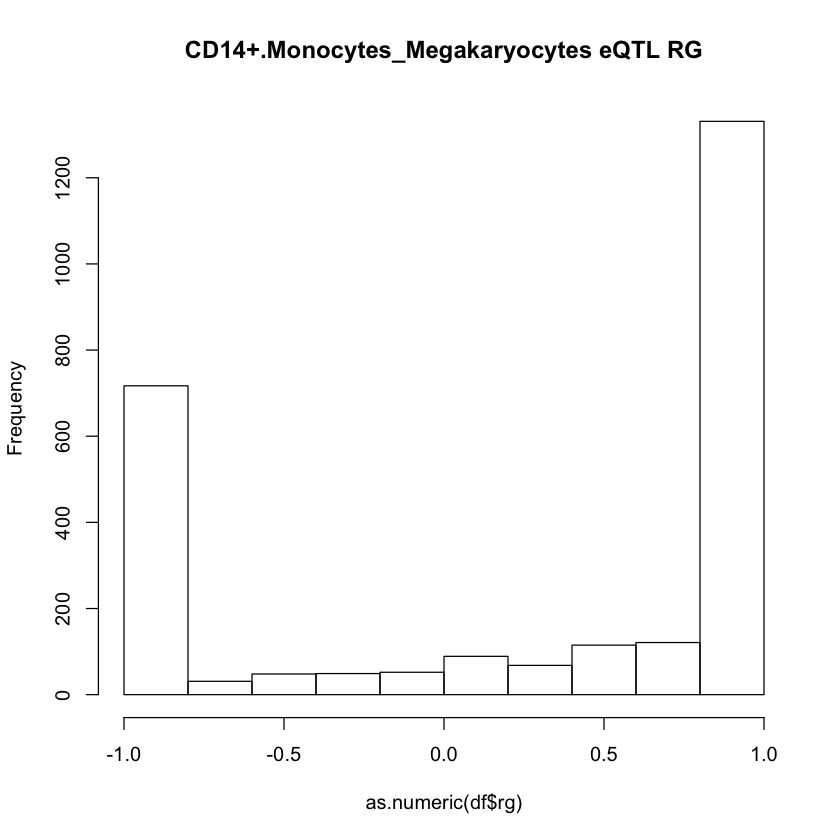

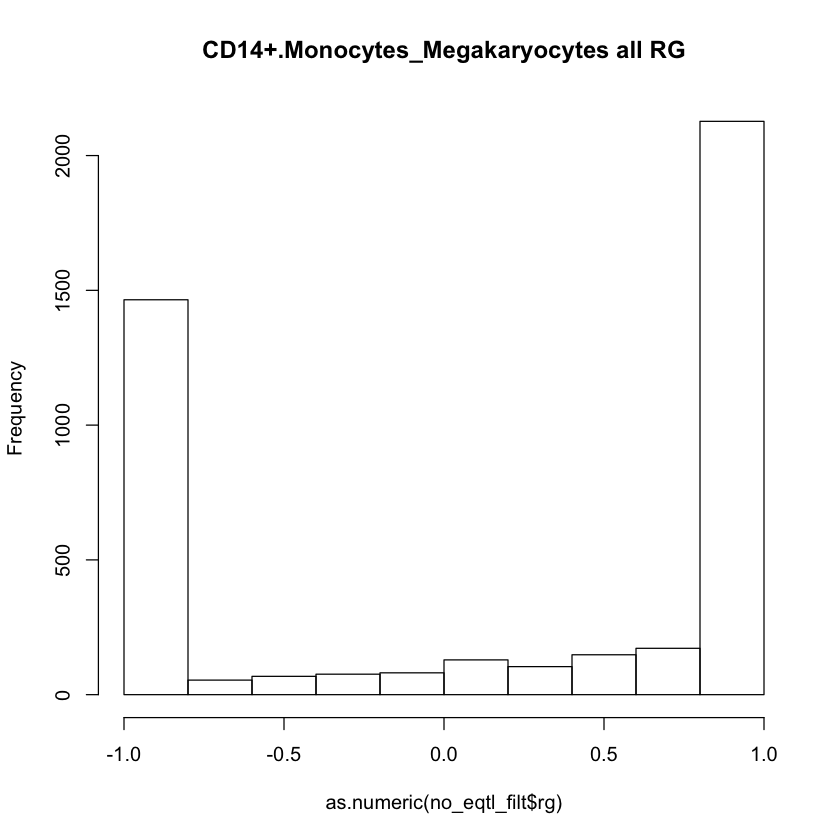

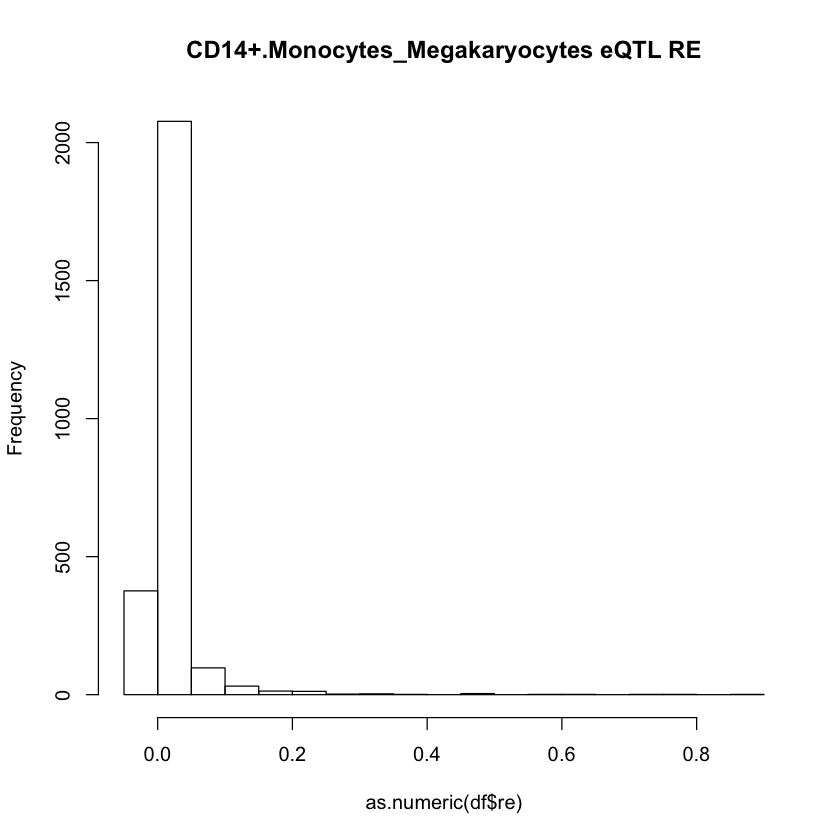

   gene                      cell_pair      sg1      se1      sg2      se2
1  A1BG CD14+.Monocytes_Megakaryocytes 0.024193 0.014748 0.003439 0.007287
2 AAED1 CD14+.Monocytes_Megakaryocytes  0.00173 0.002555 0.007696 0.009614
3 AAGAB CD14+.Monocytes_Megakaryocytes 0.014785 0.006764 0.009895 0.009584
4  ABAT CD14+.Monocytes_Megakaryocytes 0.009248 0.006899 0.018801  0.01113
5 ABCA7 CD14+.Monocytes_Megakaryocytes 0.012742 0.008217 0.025909 0.017997
6 ABCB4 CD14+.Monocytes_Megakaryocytes 0.001275 0.001048 0.012769 0.007293
         rg        re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1         1  0.047398 0.677312               0           1                 1
2 -0.564593  0.020328 1.070608               0           0                 0
3 -0.182467  0.005383 0.482369               0           0                 0
4 -0.098859  0.006815 0.475244               0           0                 1
5  0.905027  0.000849 0.341679               0           0                 1
6  0.975491 -

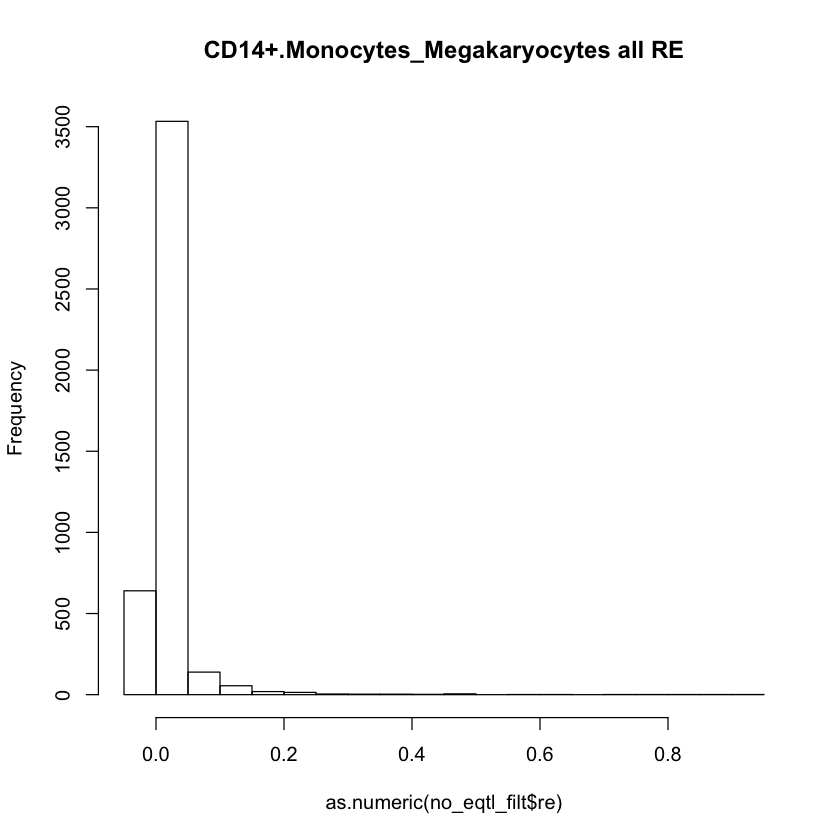

NULL


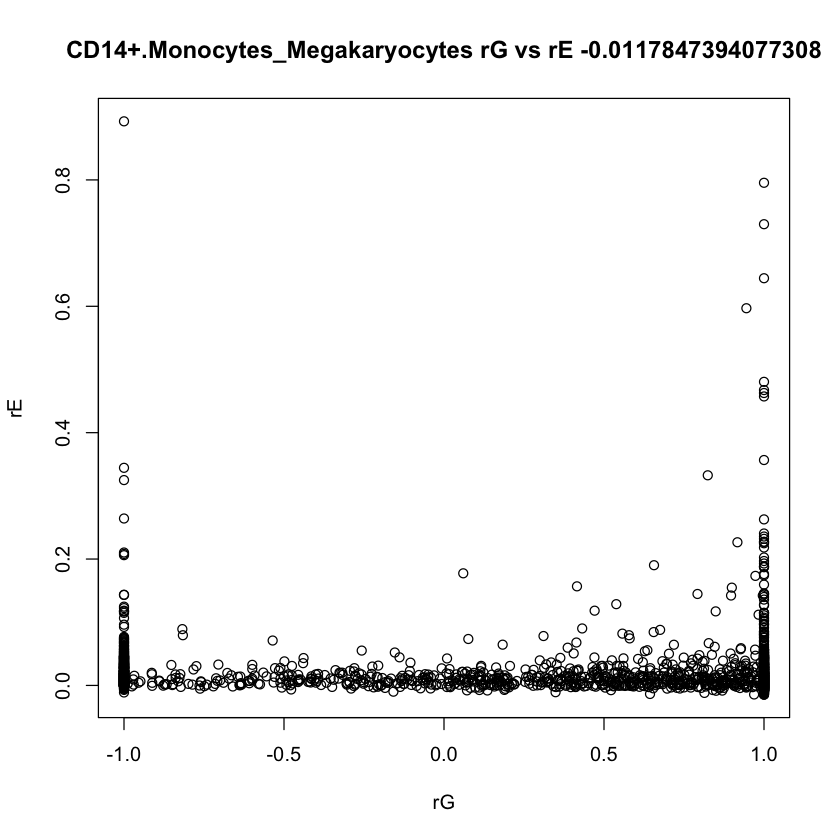

                       cell_pair     gene      sg1      se1      sg2      se2
1 CD14+.Monocytes_Megakaryocytes    ABCD3 0.004871 0.004068 0.012001 0.009041
2 CD14+.Monocytes_Megakaryocytes    ACAP3  0.00475 0.003699 0.007285 0.007661
3 CD14+.Monocytes_Megakaryocytes    ACBD6  0.00059 0.002368 0.014328 0.012219
4 CD14+.Monocytes_Megakaryocytes    ACOT7  0.00373 0.003086 0.000173 0.006002
5 CD14+.Monocytes_Megakaryocytes ADAMTSL4 0.001312 0.002351  0.00115   0.0024
6 CD14+.Monocytes_Megakaryocytes     ADAR 0.009257  0.00766 0.011121 0.012442
        rg        re     rg_se
1 0.176004  0.000111  0.555838
2        1 -0.005943  0.497579
3        1  0.011174   1.74283
4        1  0.006631 16.843912
5       -1   0.00637  1.416303
6        1  0.055386  0.220035
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.177964964487672"
[1] "median"   "0.712669"
[1] "var"               "0.812081763354505"
[1] "in 0,1 range" "2678"         "of"           "4421"        
[1] "rE info"

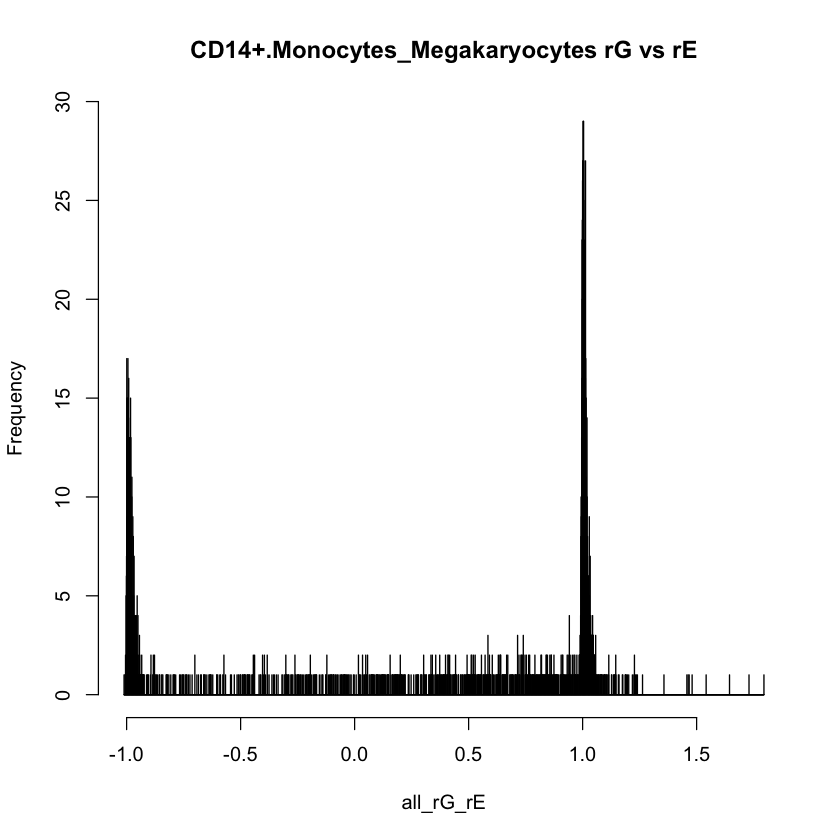

NULL


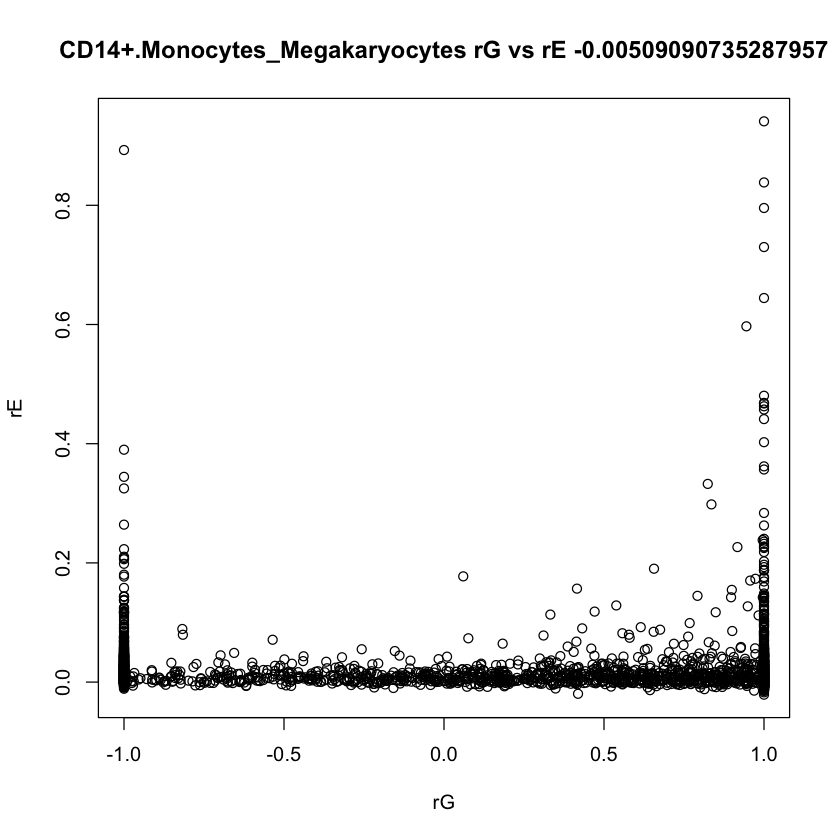

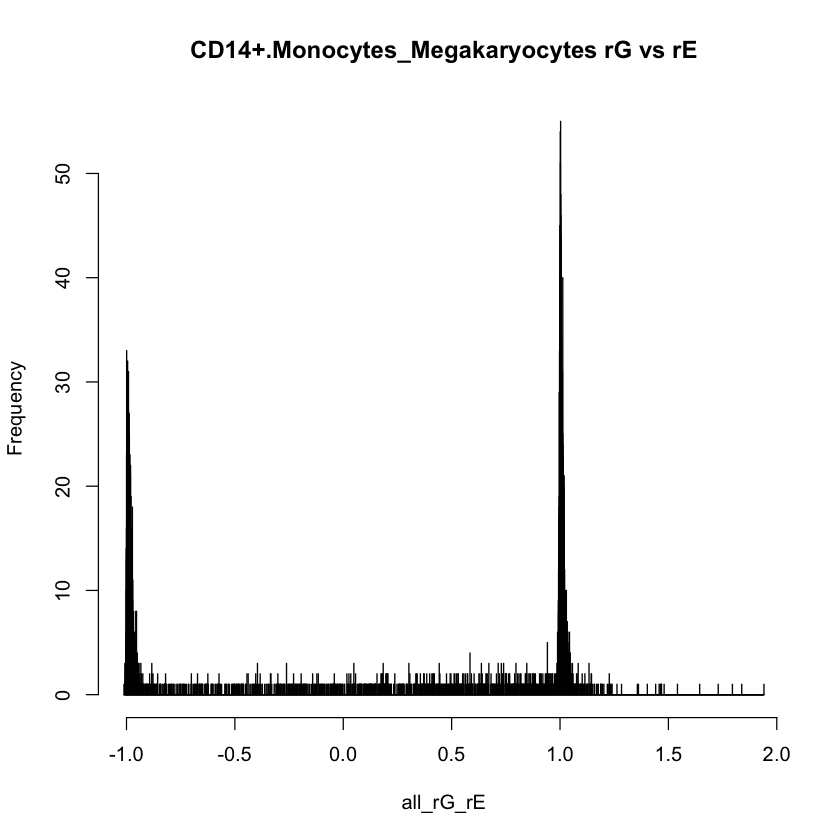

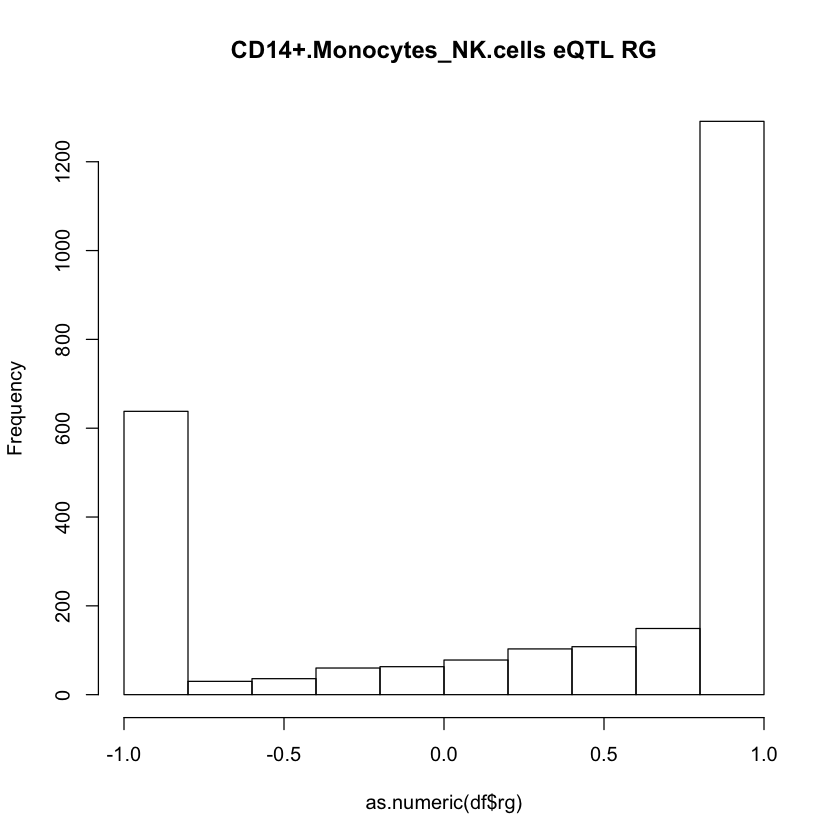

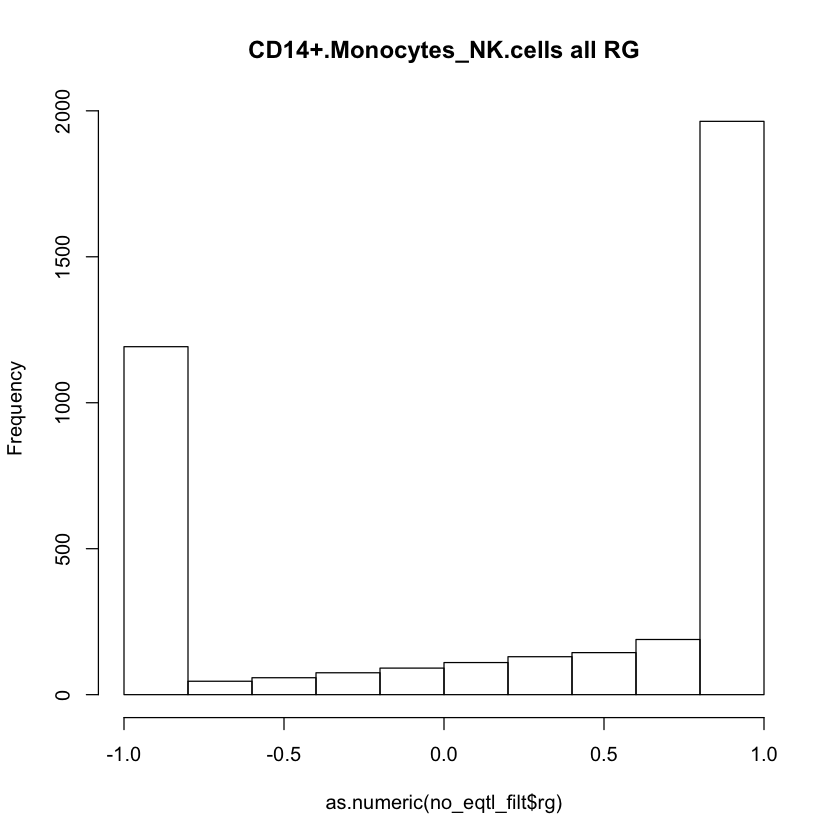

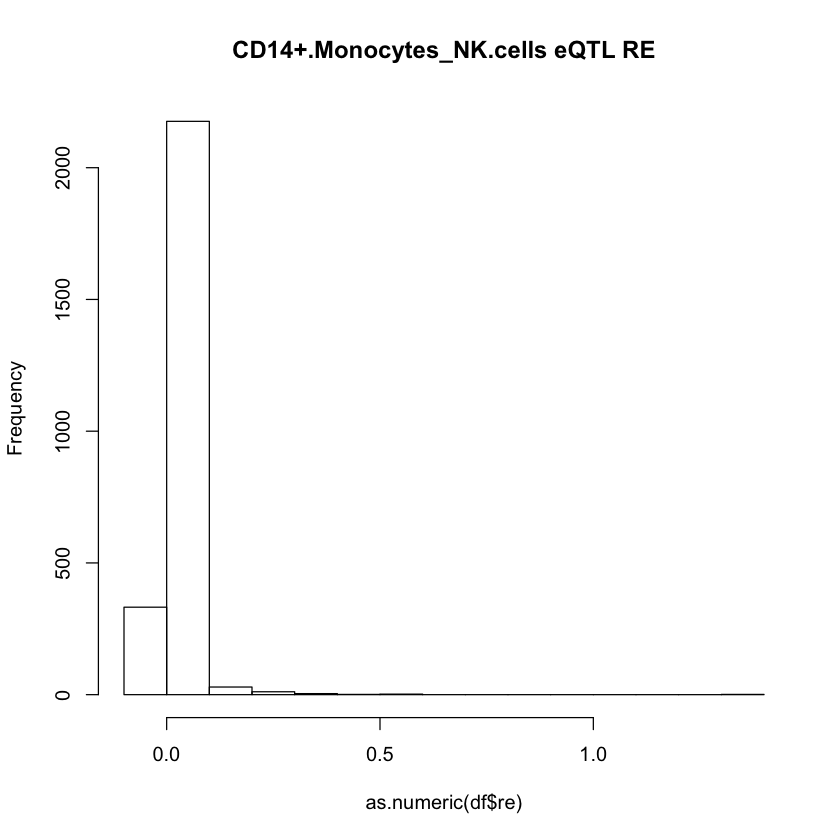

     gene                cell_pair      sg1      se1      sg2      se2 rg
1    A1BG CD14+.Monocytes_NK.cells 0.026439 0.015589 0.003505 0.007321  1
2 A2M-AS1 CD14+.Monocytes_NK.cells   0.0025 0.003303 0.044632  0.02804  1
3   AAGAB CD14+.Monocytes_NK.cells 0.011853  0.00591 0.002296 0.003214  1
4   AAMDC CD14+.Monocytes_NK.cells 0.003513 0.003227 0.001165 0.002588 -1
5    AATF CD14+.Monocytes_NK.cells        0 0.000725        0 0.003277 -1
6   ABCA7 CD14+.Monocytes_NK.cells 0.011677 0.008181 0.004114  0.00594  1
        re        rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.037527     0.715888               0           1                 1
2 0.028525     0.394132               0           1                 0
3 -0.00149     0.575714               0           0                 0
4 0.008275     1.141416               0           0                 0
5 0.002294 186374.14324               1           0                 0
6 0.005195      0.59859               0           0           

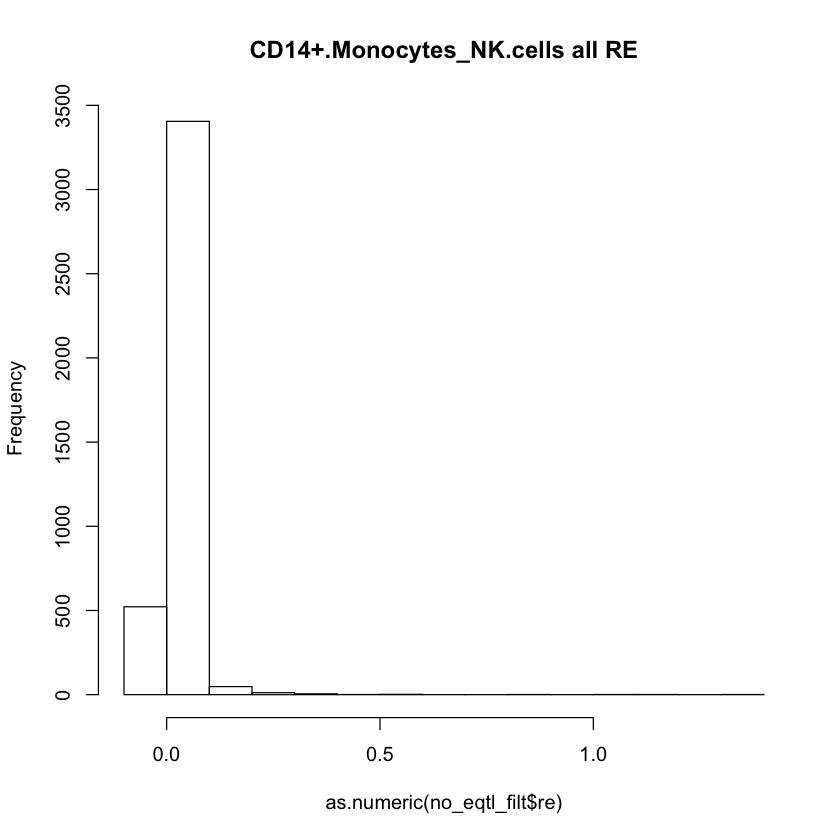

NULL


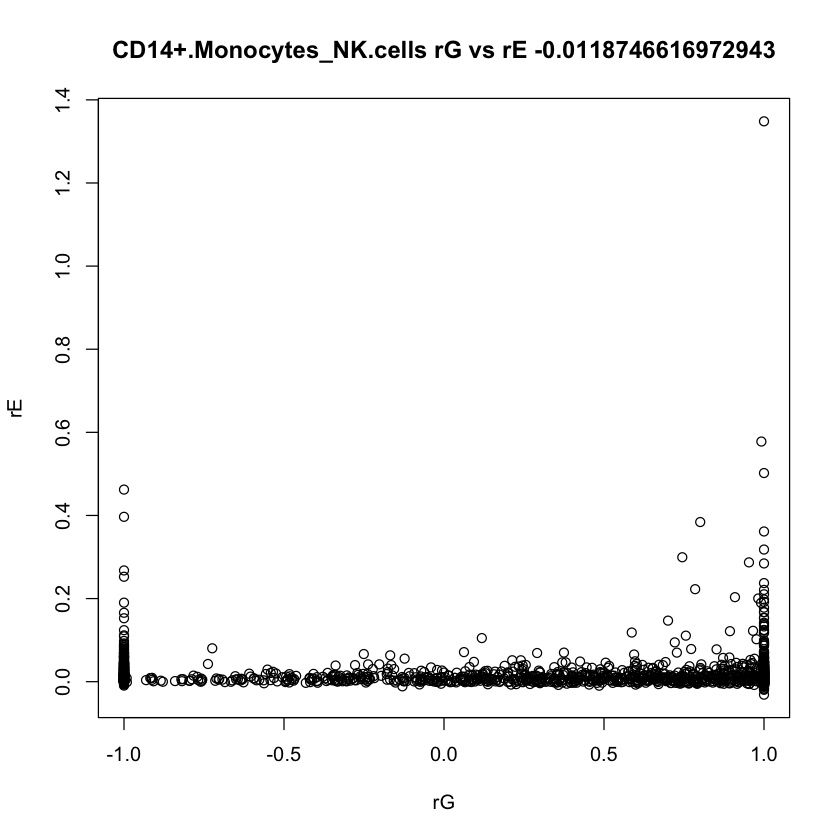

                 cell_pair   gene      sg1      se1      sg2      se2      rg
1 CD14+.Monocytes_NK.cells   ABI2 0.001668 0.002395 0.004684 0.005355       1
2 CD14+.Monocytes_NK.cells   ACP1  1.2e-05 0.000661  1.2e-05 0.002124      -1
3 CD14+.Monocytes_NK.cells  ACTR3 0.000974 0.002725 0.001999 0.005237       1
4 CD14+.Monocytes_NK.cells ACVR1C    3e-06 0.000794 0.000193 0.000175      -1
5 CD14+.Monocytes_NK.cells ACVR2A 0.002453 0.004035 0.010032 0.006155 0.13932
6 CD14+.Monocytes_NK.cells   AFF3 0.005357 0.004384 0.001253 0.002698       1
        re      rg_se
1 0.018192   0.387614
2 0.006197 139.792892
3  0.04612    0.62201
4 0.001451 151.205481
5 0.003822   0.722981
6 0.001963   0.984921
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.229587454362078"
[1] "median"    "0.7649115"
[1] "var"               "0.772171626107302"
[1] "in 0,1 range" "2518"         "of"           "3966"        
[1] "rE info"
[1] "min"       "-0.031222"
[1] "max"      "1.348336"
[1] "m

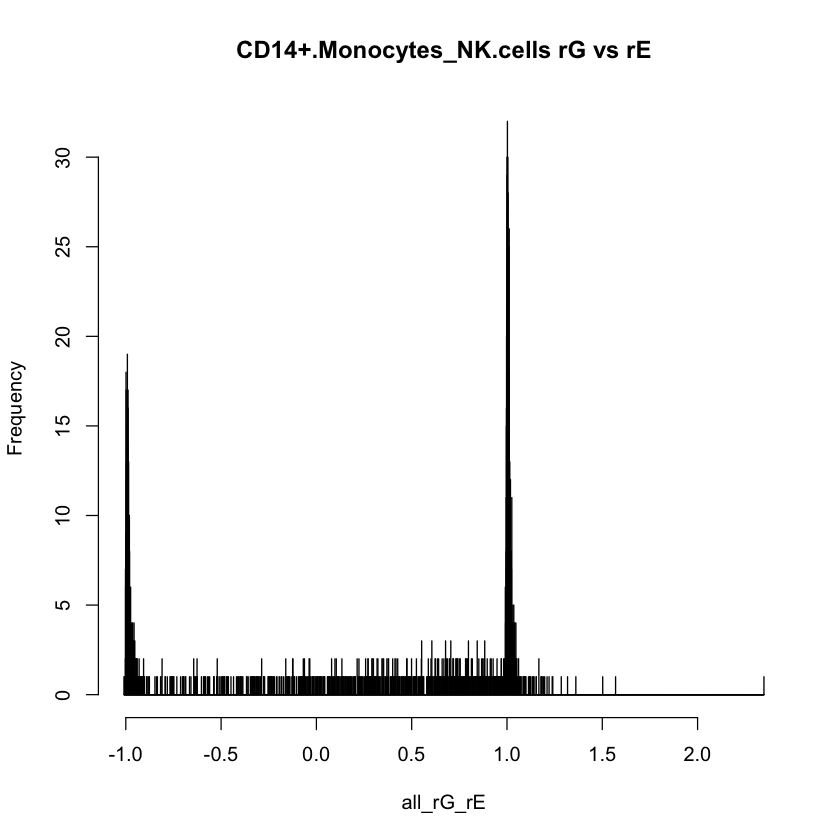

NULL


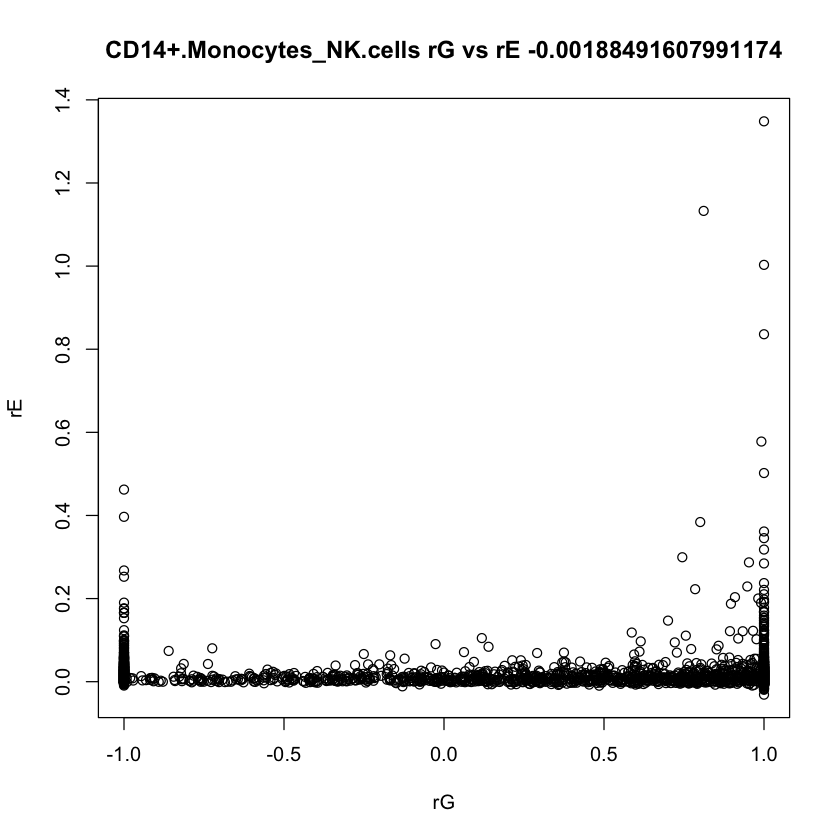

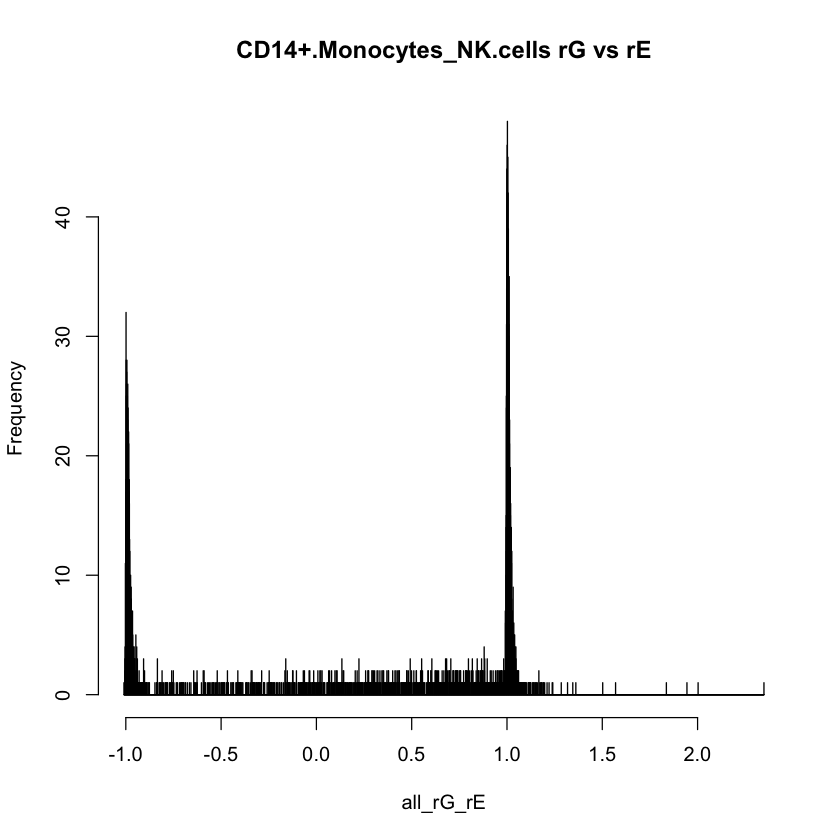

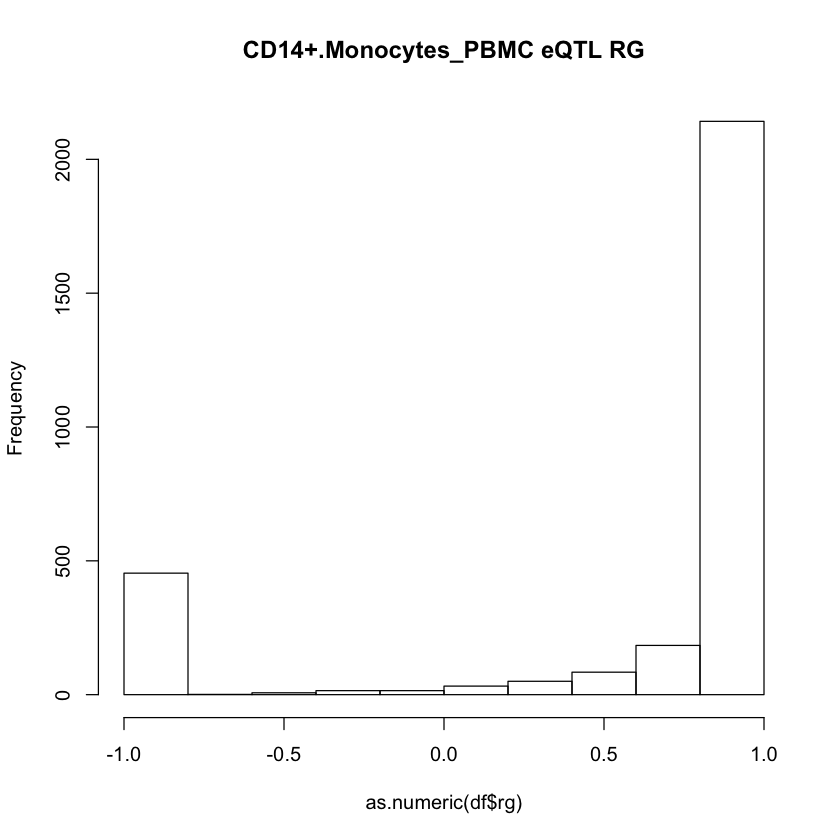

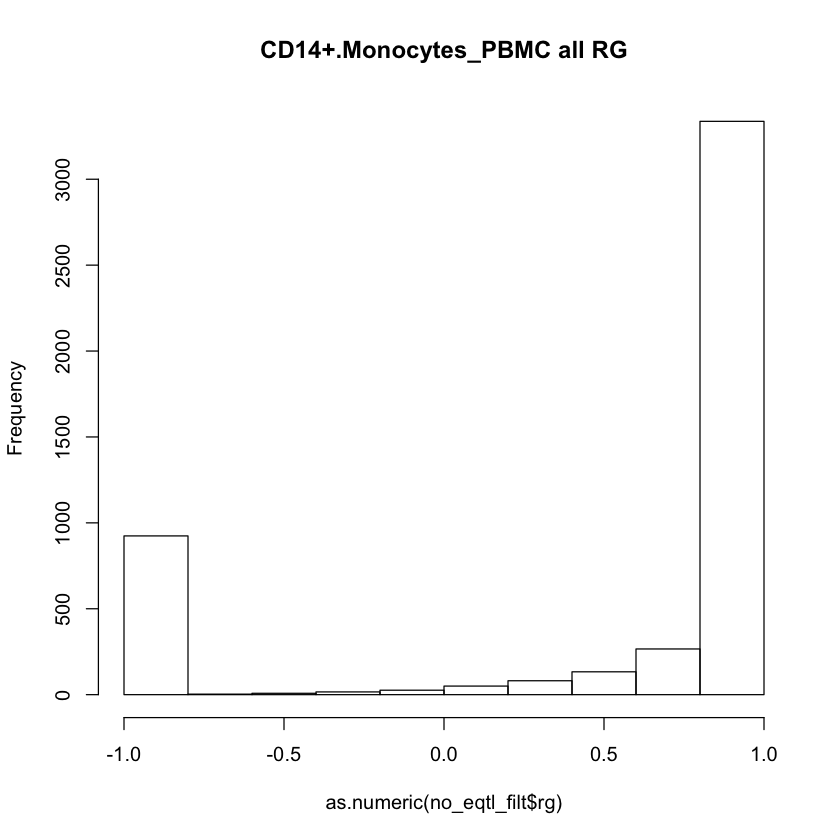

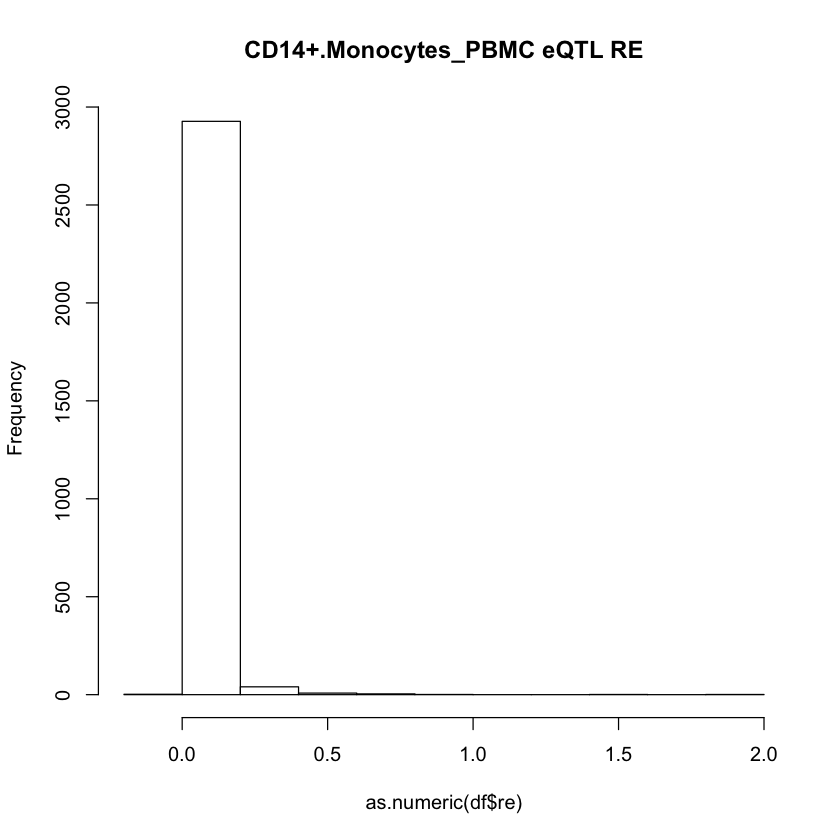

     gene            cell_pair      sg1      se1      sg2      se2 rg       re
1    A1BG CD14+.Monocytes_PBMC  0.02278 0.014125 0.005276 0.005024  1 0.065615
2 A2M-AS1 CD14+.Monocytes_PBMC 0.002609 0.003356  0.03632   0.0238  1 0.046123
3   AAED1 CD14+.Monocytes_PBMC 0.001846 0.002677 0.001178 0.002408  1  0.02714
4   AAGAB CD14+.Monocytes_PBMC 0.012053  0.00601 0.006287 0.003263  1 0.011859
5   AAMDC CD14+.Monocytes_PBMC 0.004269 0.003561 0.000327 0.001157  1 0.024207
6    ABAT CD14+.Monocytes_PBMC 0.009082 0.006643 0.012351 0.007024  1 0.029472
     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes Megakaryocytes
1 0.078293               0           1                 1              0
2 0.275687               0           1                 0              0
3 0.314158               0           0                 0              0
4 0.059159               0           0                 0              0
5 0.901628               0           0                 0              0
6 0.073642     

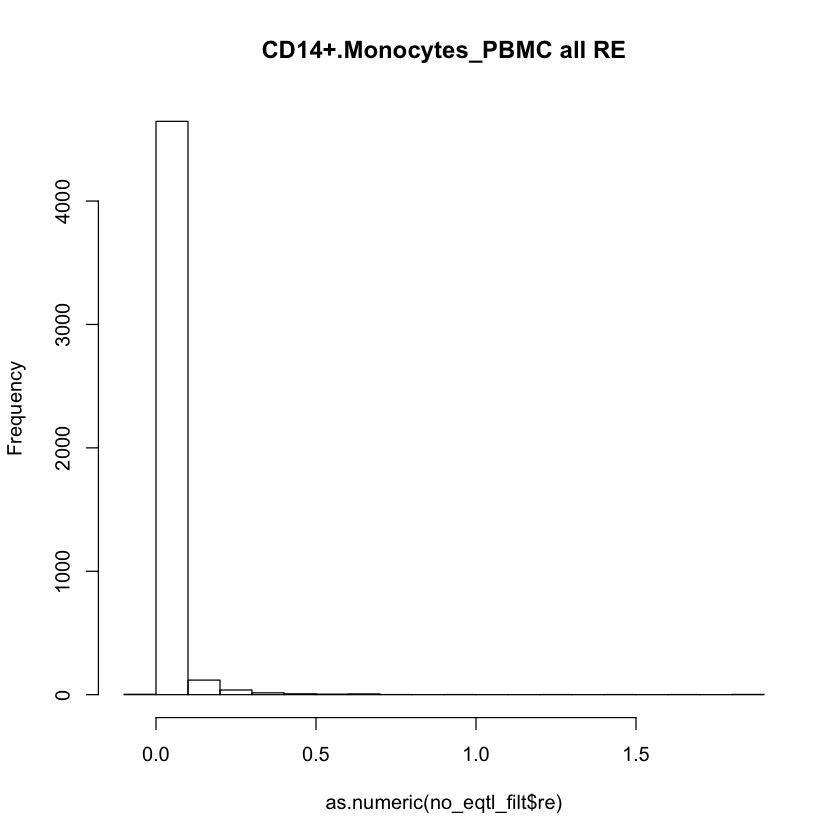

NULL


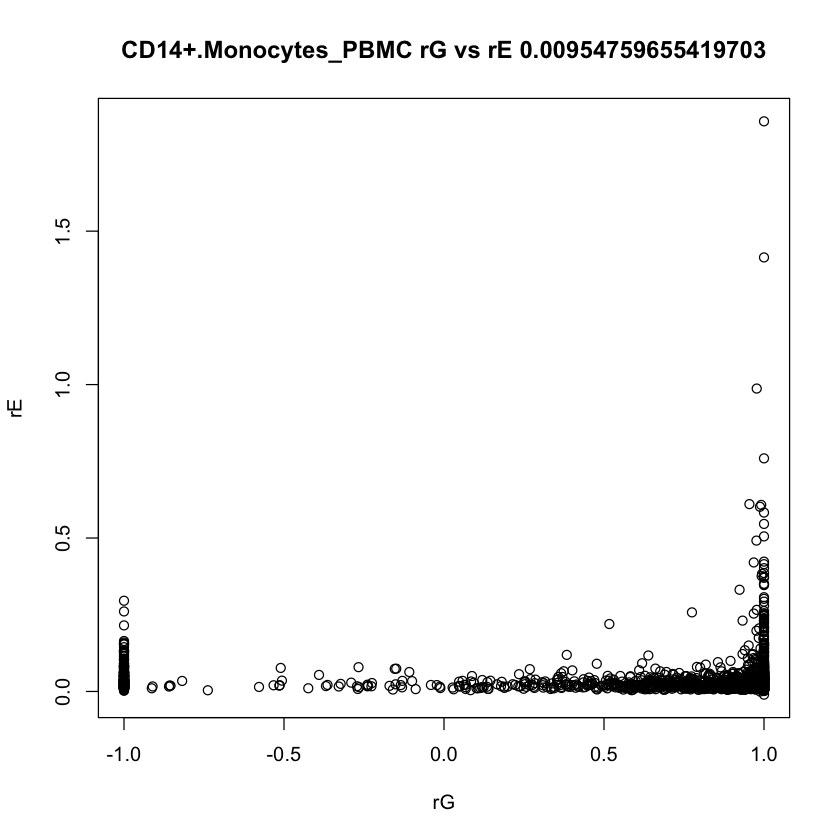

             cell_pair   gene      sg1      se1      sg2      se2       rg
1 CD14+.Monocytes_PBMC   AAMP 0.001298 0.002857 0.001154 0.002092 0.407714
2 CD14+.Monocytes_PBMC   ABI2 0.001682 0.002494  0.00025 0.001275        1
3 CD14+.Monocytes_PBMC  ACTR2 0.000614 0.002544 0.002088 0.003335        1
4 CD14+.Monocytes_PBMC  ACTR3 0.002415 0.003275 0.005396 0.004349        1
5 CD14+.Monocytes_PBMC ACVR2A 0.002506 0.004008 0.005813 0.005335 0.800051
6 CD14+.Monocytes_PBMC ADAM17 0.002743 0.003458 0.002054 0.002724 0.770845
        re    rg_se
1 0.034826 1.087035
2 0.024125 1.395028
3 0.028159  0.81171
4 0.038266 0.117741
5 0.035801 0.411197
6 0.018271  0.49417
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.543529156198347"
[1] "median" "1"     
[1] "var"               "0.601148411735513"
[1] "in 0,1 range" "3863"         "of"           "4840"        
[1] "rE info"
[1] "min"       "-0.010454"
[1] "max"     "1.89634"
[1] "mean"               "0.0348570502066116"
[1]

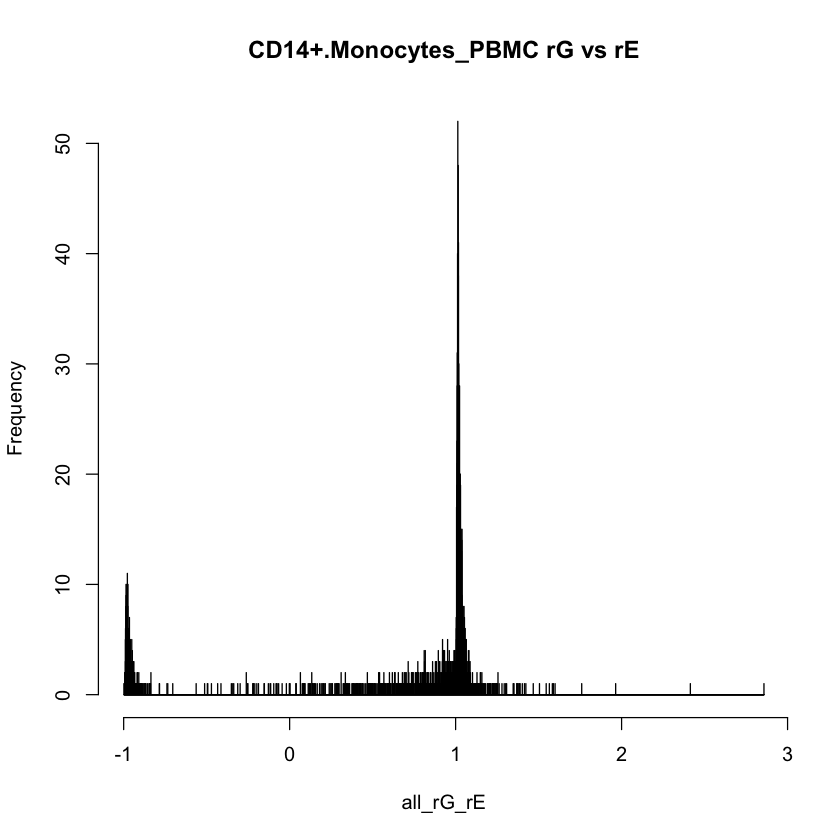

NULL


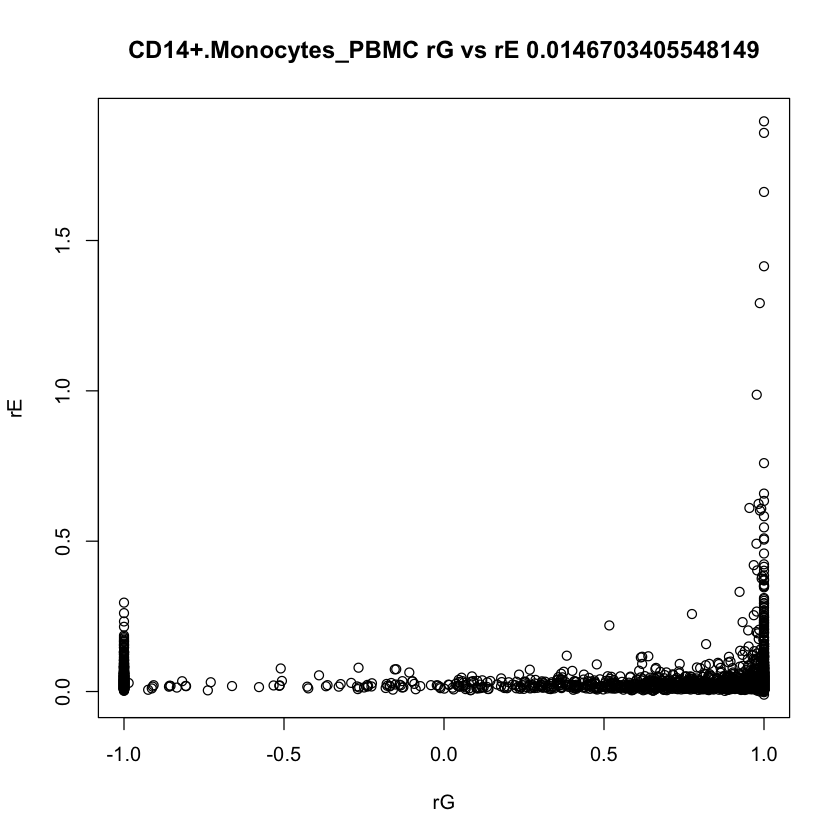

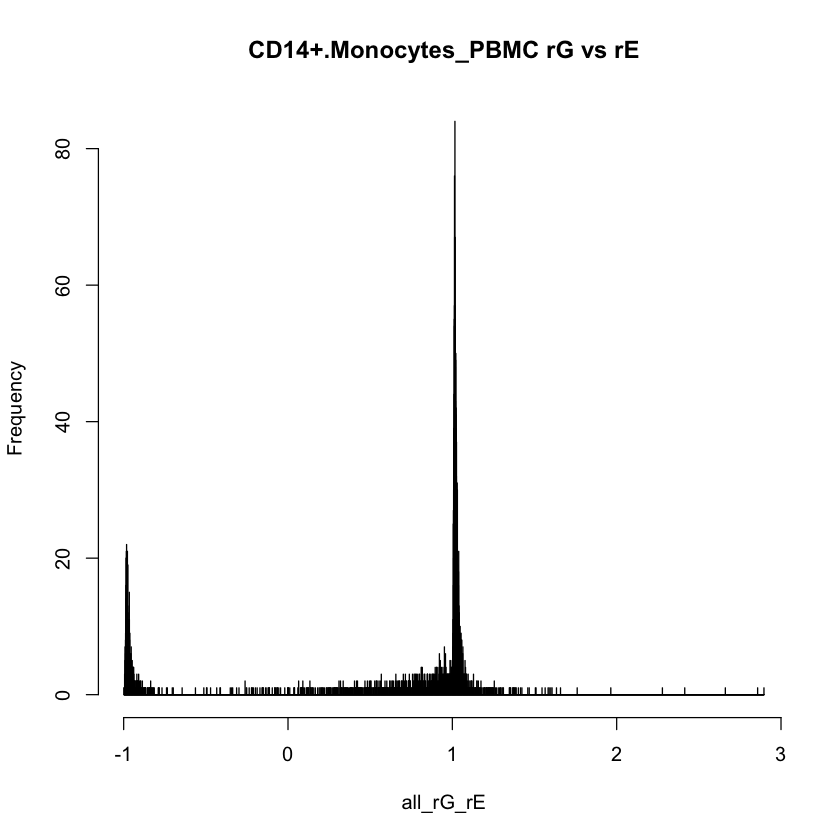

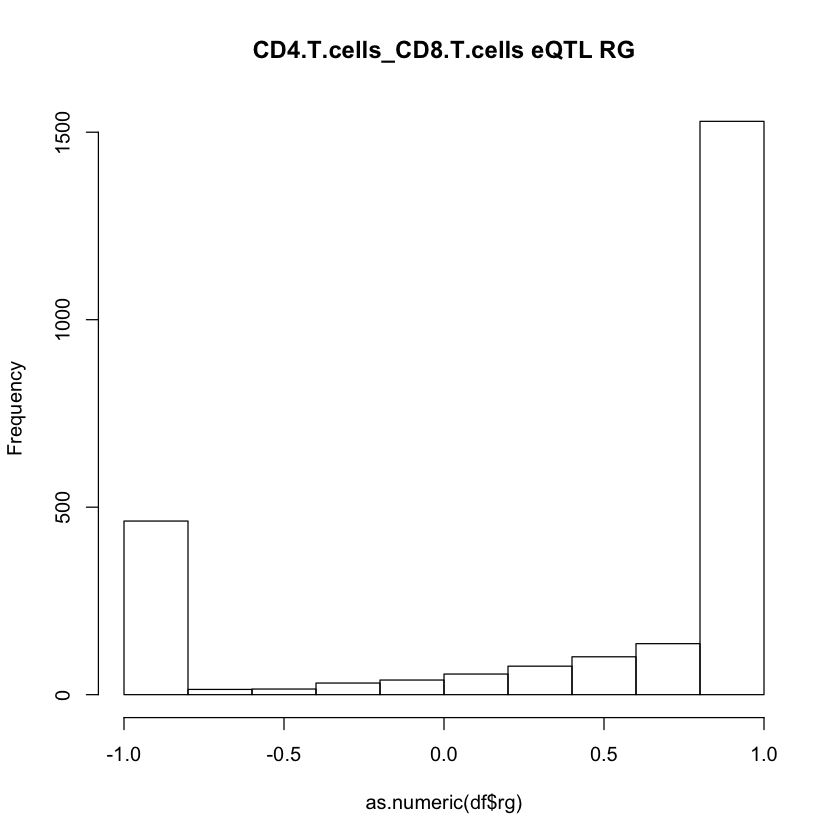

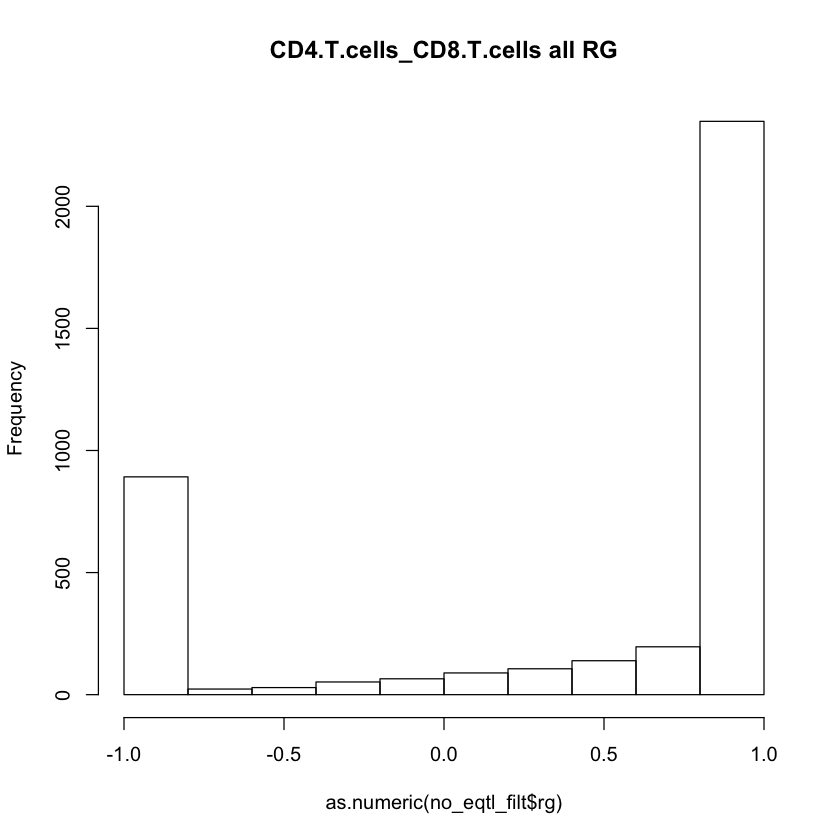

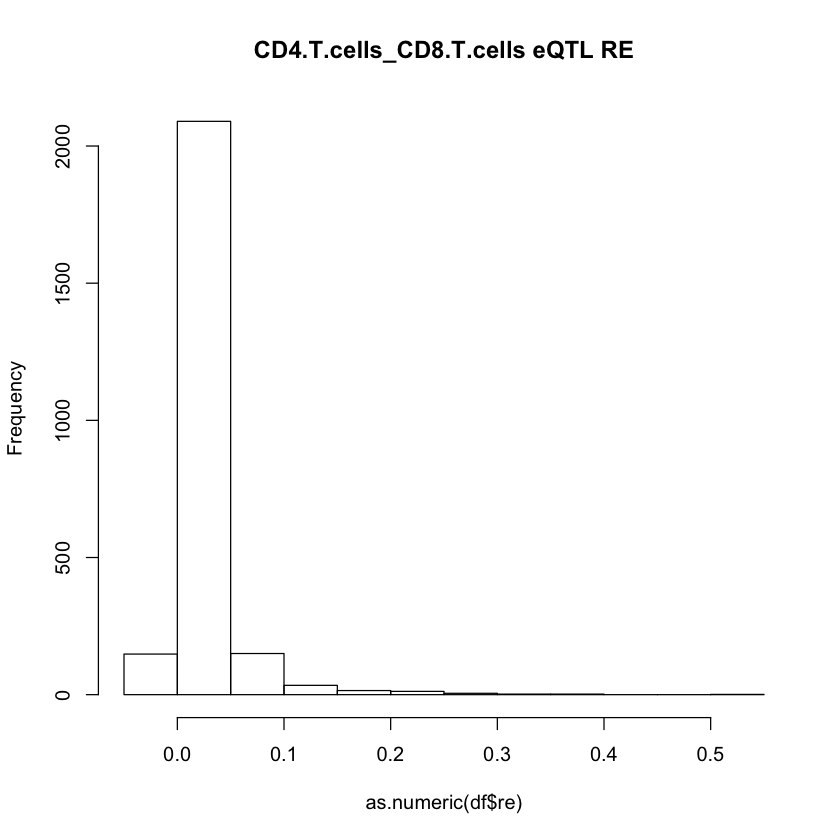

     gene               cell_pair      sg1      se1      sg2      se2       rg
1    A1BG CD4.T.cells_CD8.T.cells 0.000709 0.003165 0.000364 0.006255       -1
2 A2M-AS1 CD4.T.cells_CD8.T.cells 0.047817 0.024936 0.041925  0.02292 0.706217
3   AAGAB CD4.T.cells_CD8.T.cells 0.003475 0.003452 0.000985 0.003751        1
4   ABCA7 CD4.T.cells_CD8.T.cells 0.007292 0.006277 0.000224 0.006326       -1
5   ABCB8 CD4.T.cells_CD8.T.cells 0.003266 0.004024 0.001491 0.003661       -1
6  ABHD12 CD4.T.cells_CD8.T.cells 0.000102 0.001016  6.3e-05 0.001434        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.039765 13.812643               0           1                 1
2 0.041995  0.228407               0           1                 0
3 0.009398  1.599604               0           0                 0
4 0.010413 14.790718               0           0                 1
5 0.008026  1.613922               0           0                 1
6 0.011017 11.827061               0         

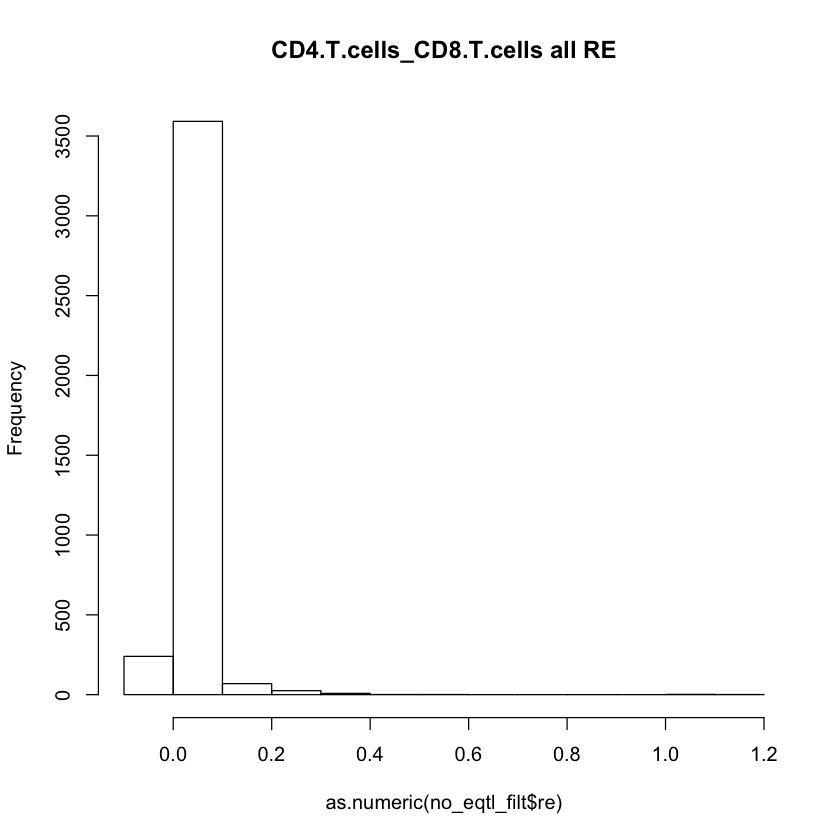

NULL


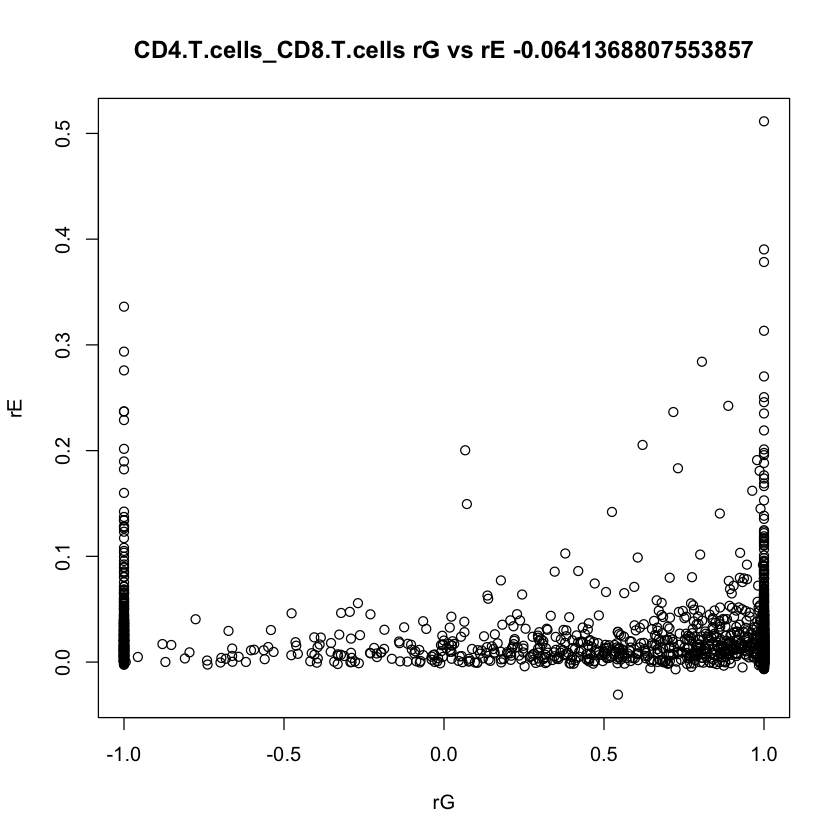

                cell_pair   gene      sg1      se1      sg2      se2 rg
1 CD4.T.cells_CD8.T.cells   AAMP 0.000106 0.001917 0.002099 0.003495 -1
2 CD4.T.cells_CD8.T.cells   ABI2 0.000135 0.001387 0.000248 0.001861 -1
3 CD4.T.cells_CD8.T.cells   ACP1  2.6e-05 0.000866 0.000104 0.001759  1
4 CD4.T.cells_CD8.T.cells  ACSL3        0 0.001666        0 0.003422 -1
5 CD4.T.cells_CD8.T.cells  ACTR3 0.009438  0.00688 0.009136 0.008221  1
6 CD4.T.cells_CD8.T.cells ACVR1C  0.01111  0.00857  7.7e-05 0.002219  1
        re         rg_se
1  0.01499     10.488125
2 0.013327     10.146789
3 0.009978     15.468133
4 0.006979 121476.760001
5  0.04617      0.107004
6 0.010153     13.626276
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.416398094435937"
[1] "median" "1"     
[1] "var"               "0.679141477560855"
[1] "in 0,1 range" "2869"         "of"           "3918"        
[1] "rE info"
[1] "min"       "-0.030817"
[1] "max"      "1.144035"
[1] "mean"               "0.02357

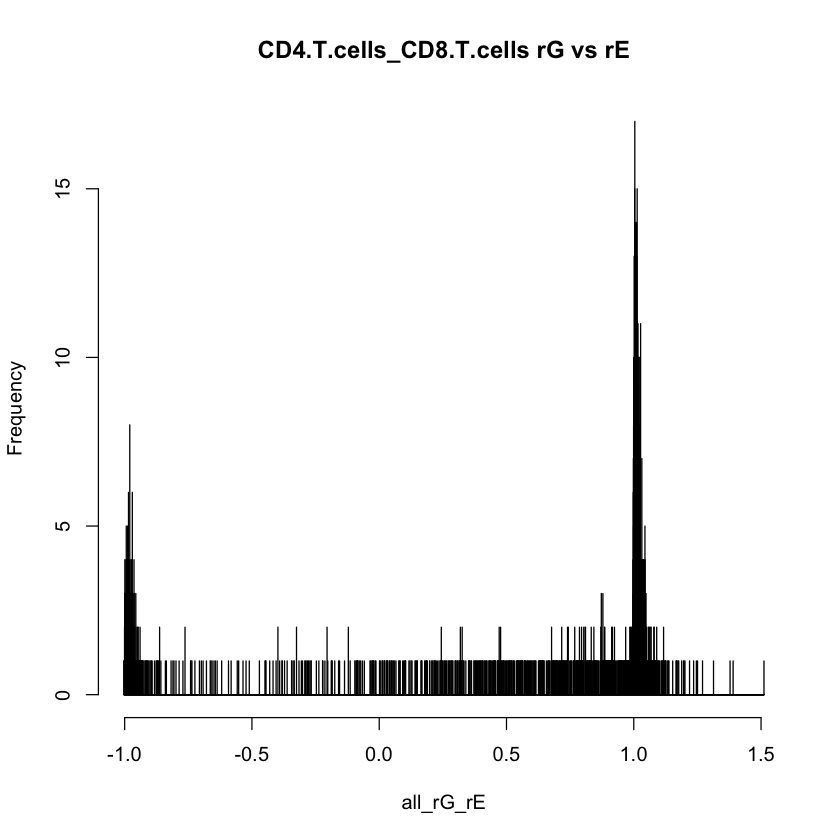

NULL


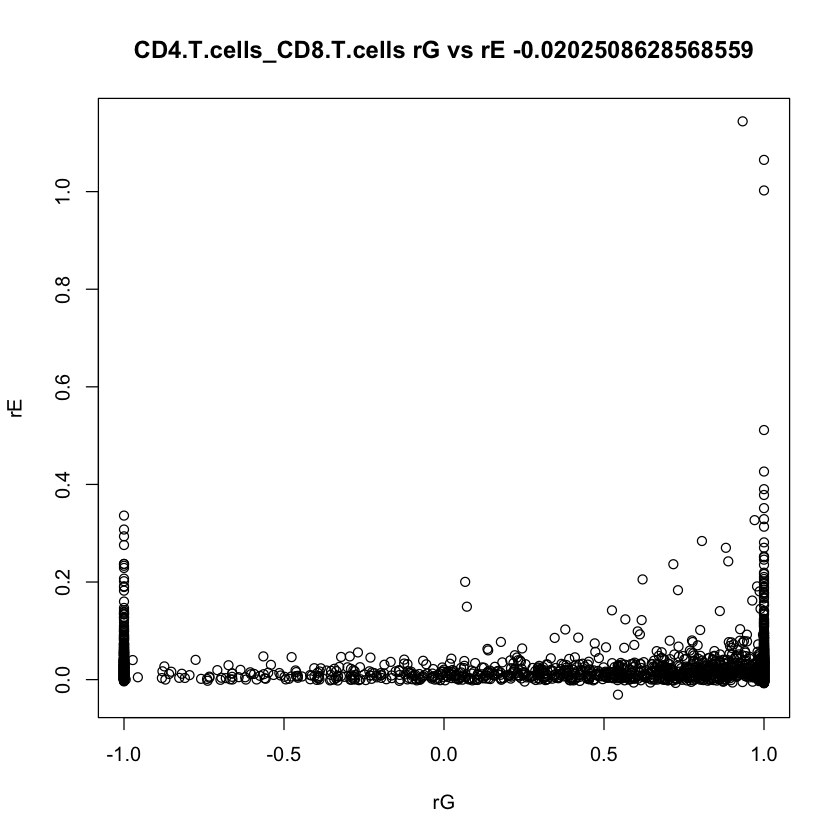

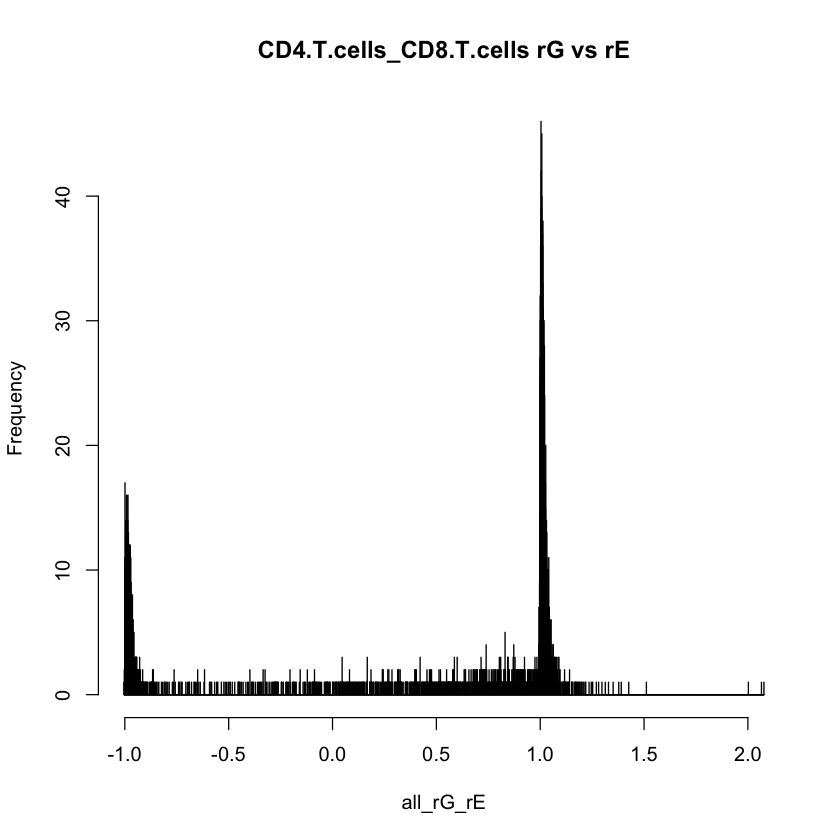

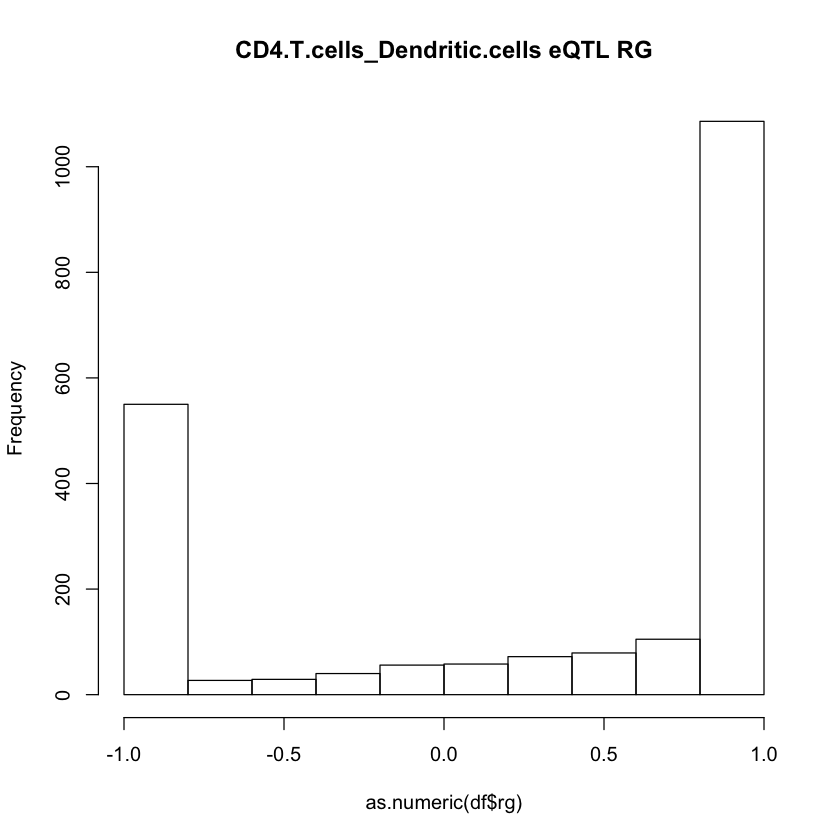

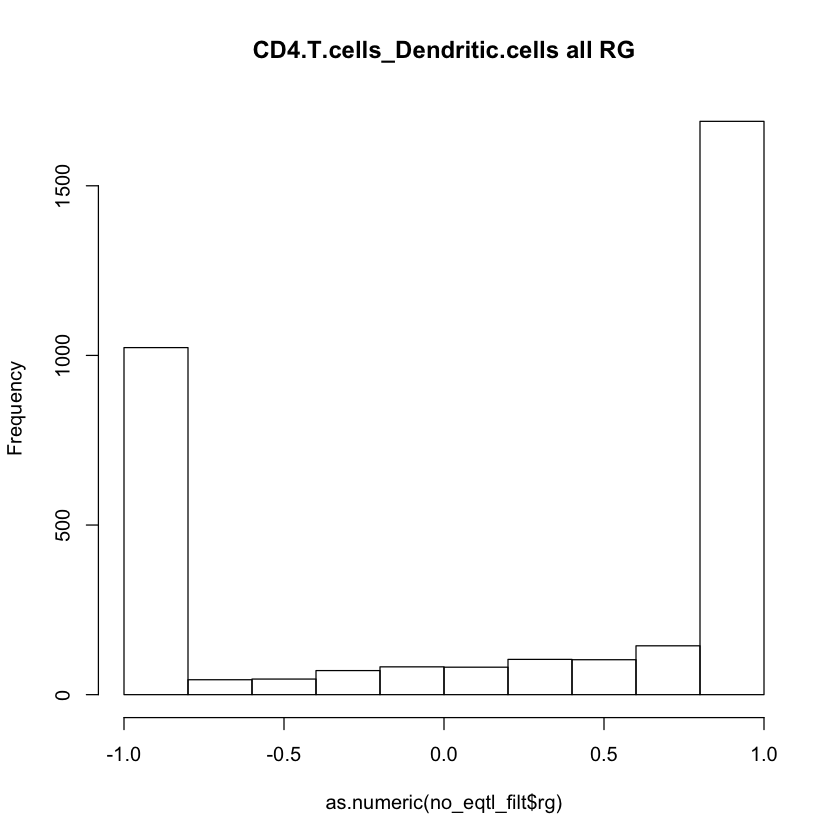

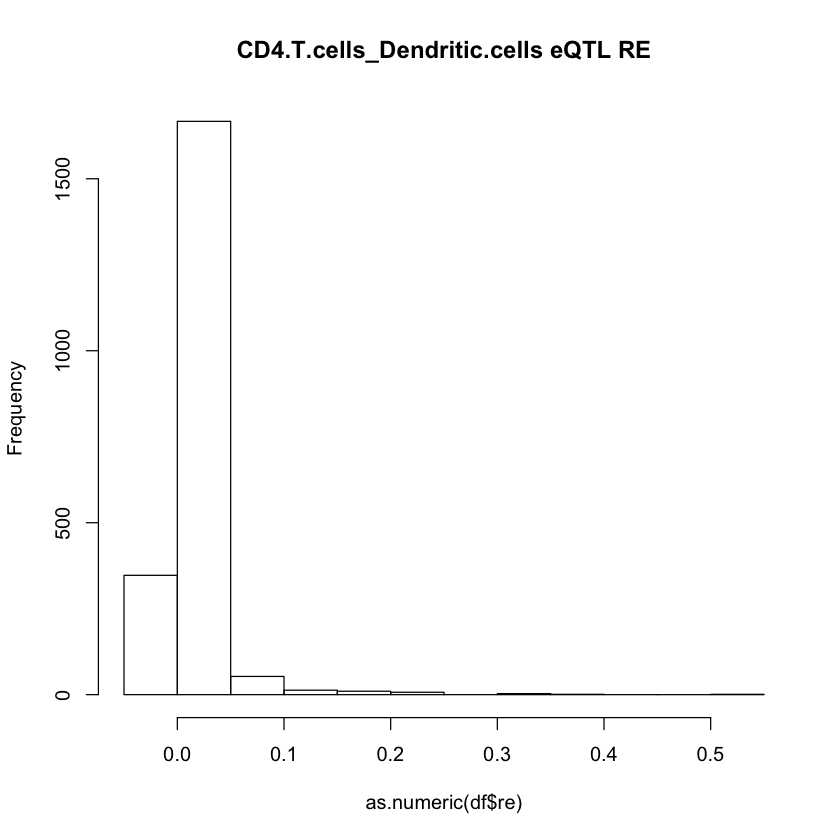

     gene                   cell_pair      sg1      se1      sg2      se2
1    A1BG CD4.T.cells_Dendritic.cells 0.000957 0.003233 0.017743 0.013056
2 A2M-AS1 CD4.T.cells_Dendritic.cells 0.054016 0.026771 0.004111   0.0031
3    AAAS CD4.T.cells_Dendritic.cells 0.001857 0.002842 0.000114 0.003594
4   AAED1 CD4.T.cells_Dendritic.cells 0.004775 0.005816 0.001892 0.004771
5    AATF CD4.T.cells_Dendritic.cells 0.002025 0.002082 0.001698 0.004075
6   ABCA7 CD4.T.cells_Dendritic.cells 0.004359 0.005298 0.001855 0.005969
        rg        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1       -1  0.020385  1.815654               0           1                 1
2  0.32838  0.017102  0.390295               0           1                 0
3        1  0.006926 15.213883               0           0                 1
4        1   0.01445  1.043095               0           0                 0
5 0.226601  -0.00121   1.13534               1           0                 0
6        1 -0.005078

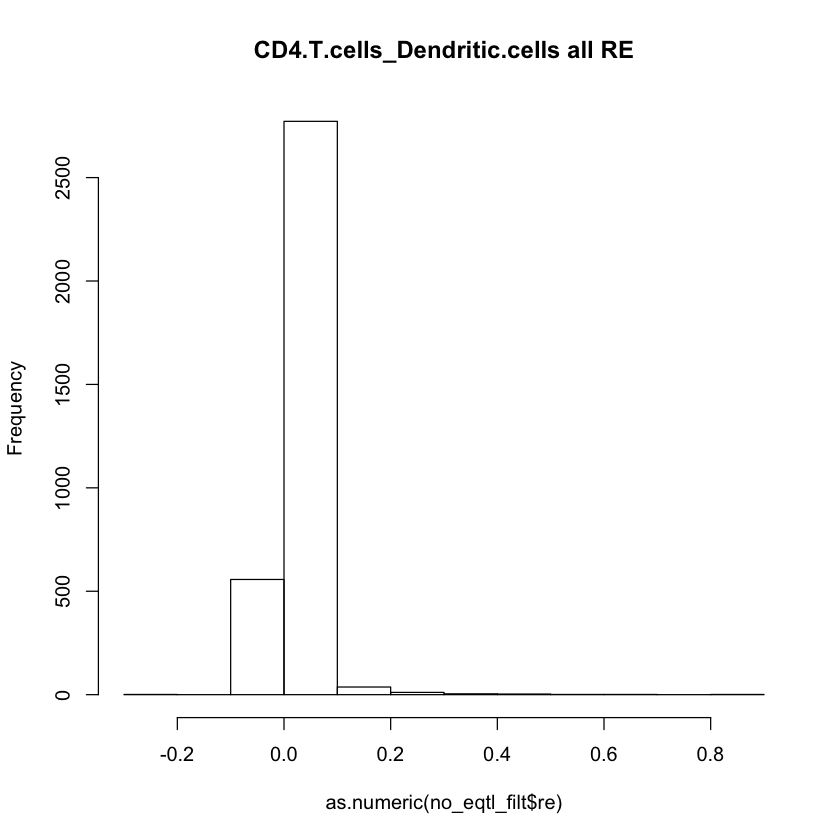

NULL


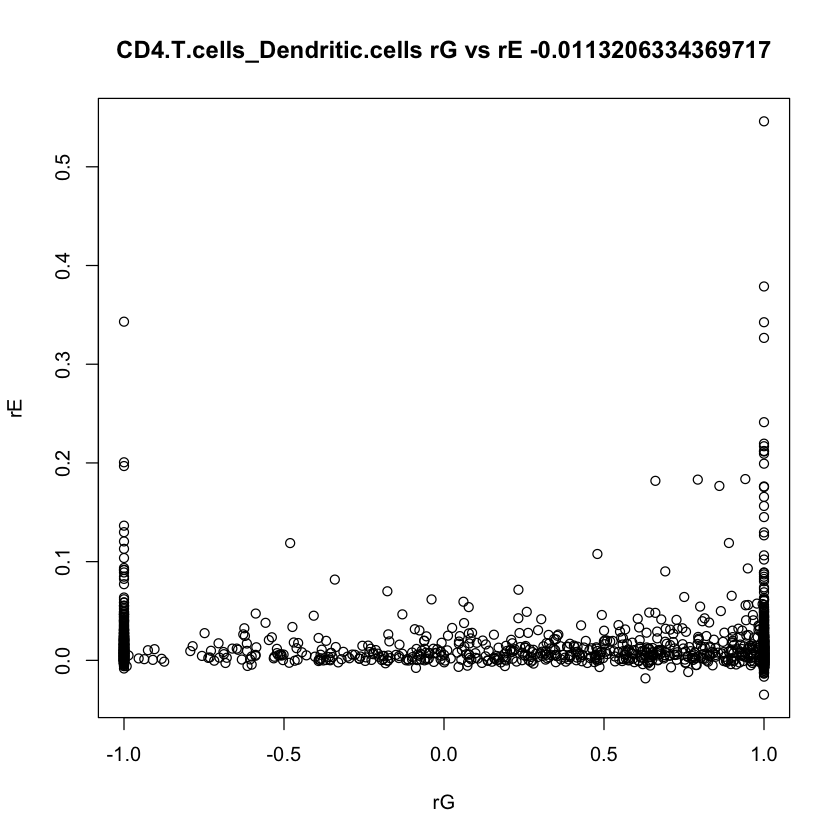

                    cell_pair     gene      sg1      se1      sg2      se2
1 CD4.T.cells_Dendritic.cells     ACP1        0  0.00085 0.000232 0.001848
2 CD4.T.cells_Dendritic.cells    ACYP2 0.018991 0.008424 0.010321 0.006773
3 CD4.T.cells_Dendritic.cells     ADI1 0.016652 0.009165 0.010656 0.008025
4 CD4.T.cells_Dendritic.cells    AGBL5 0.002422 0.002179  0.00123 0.001683
5 CD4.T.cells_Dendritic.cells   ATAD2B  0.00495 0.003746 0.004942 0.006104
6 CD4.T.cells_Dendritic.cells ATP6V1E2 0.001272 0.003294 0.007252 0.005329
        rg        re       rg_se
1        1  0.003369 1676.642164
2 0.828529  0.004304    0.215368
3        1  0.013395    0.206259
4        1 -0.001929    0.516142
5        1  0.000124    0.442096
6       -1  0.016222    1.512462
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.224885846222222"
[1] "median"   "0.793097"
[1] "var"               "0.784439776119237"
[1] "in 0,1 range" "2113"         "of"           "3375"        
[1] "rE info"
[1] "m

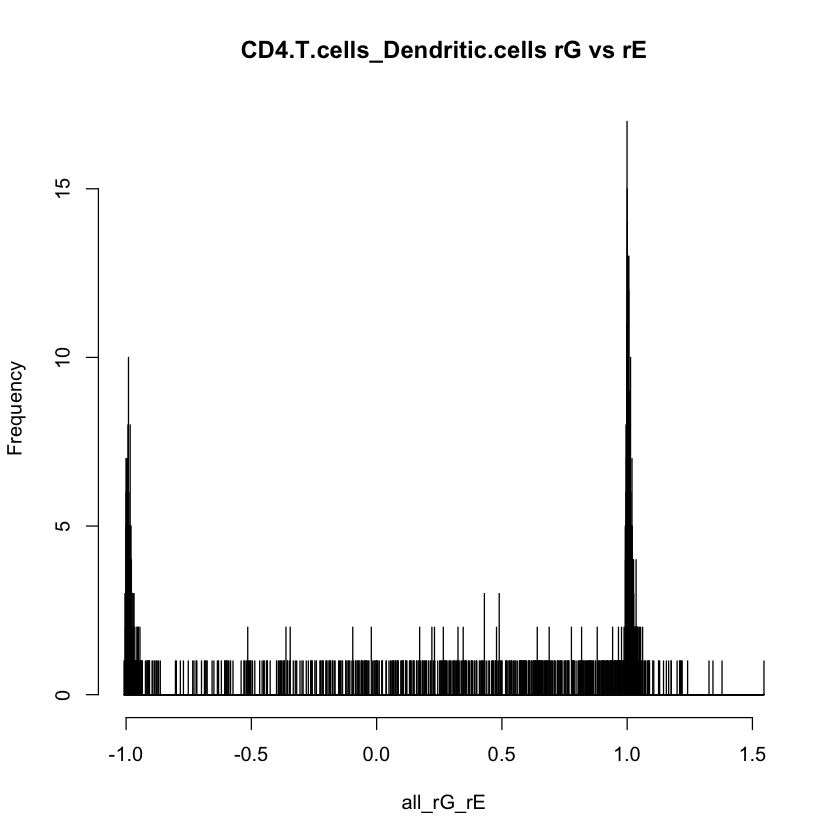

NULL


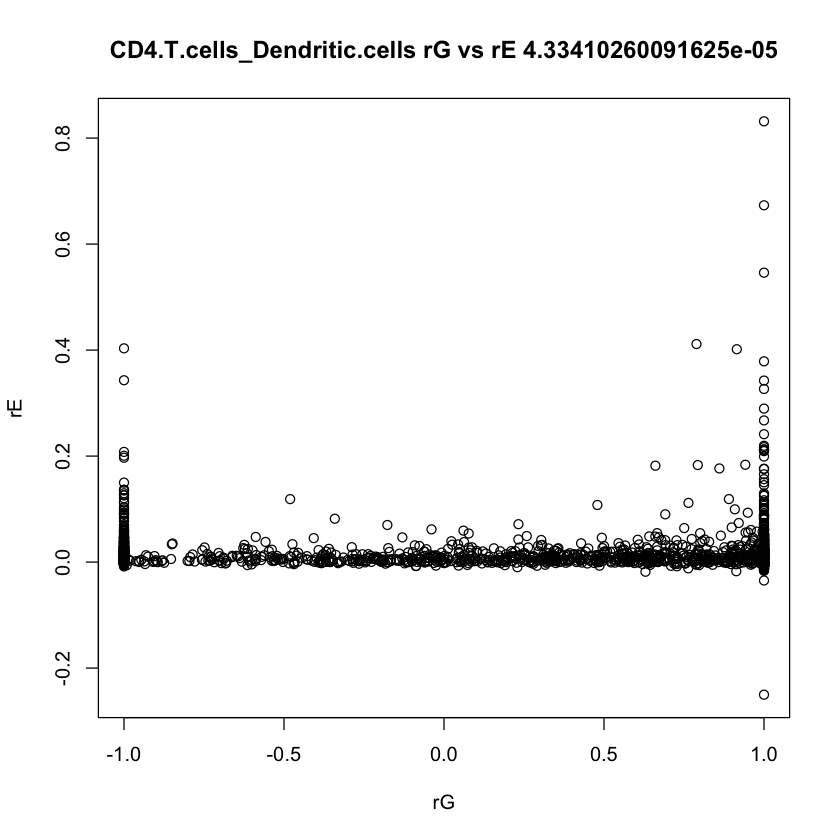

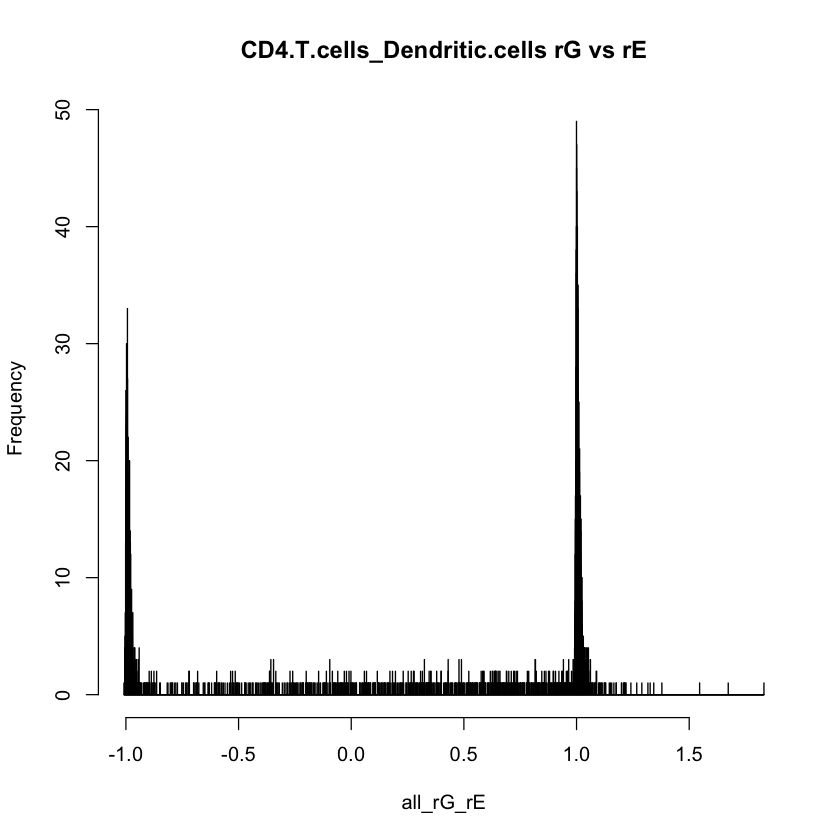

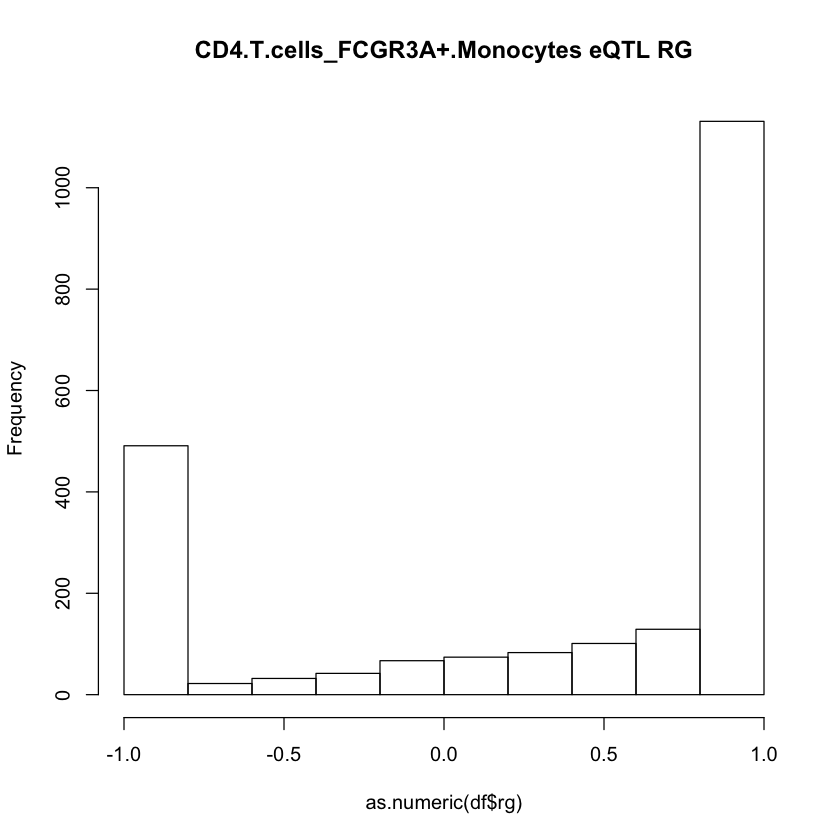

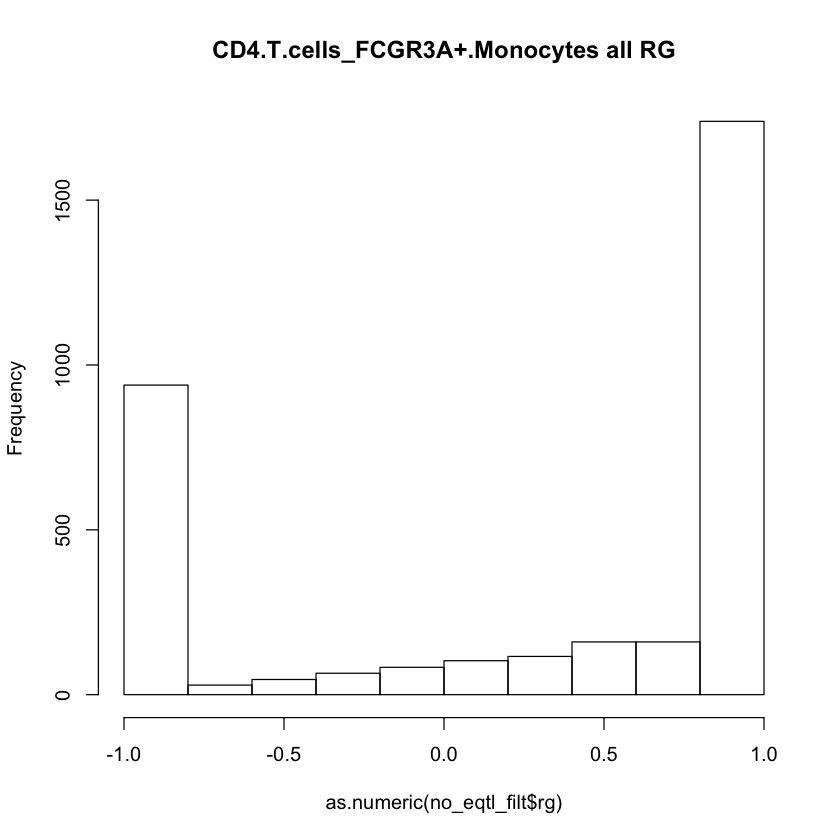

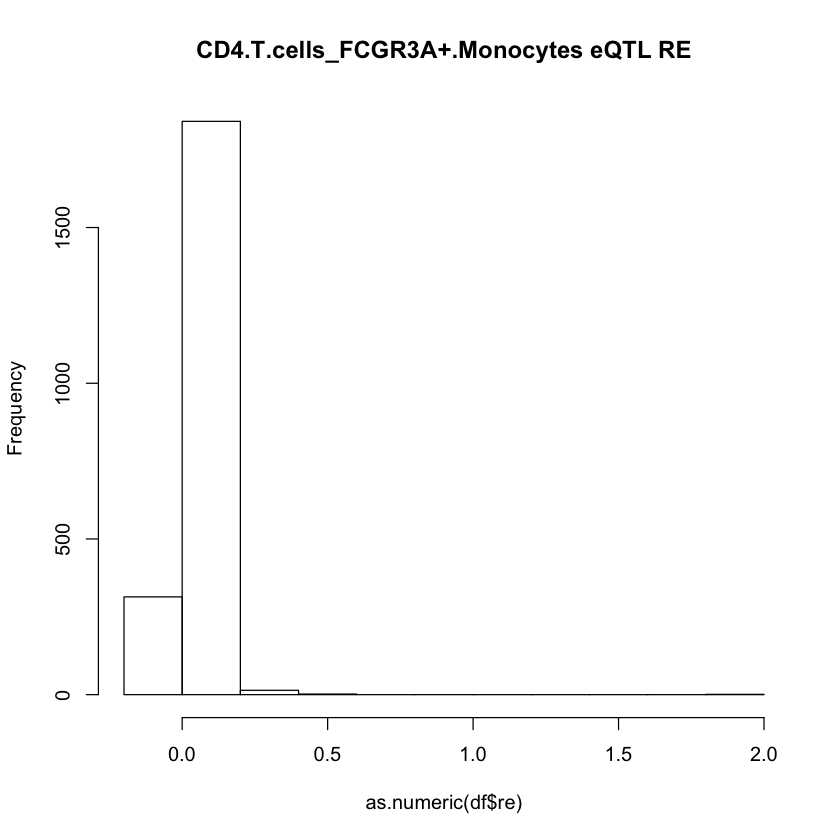

     gene                     cell_pair      sg1      se1      sg2      se2
1    A1BG CD4.T.cells_FCGR3A+.Monocytes 0.001081 0.003382 0.015356 0.012909
2 A2M-AS1 CD4.T.cells_FCGR3A+.Monocytes 0.051566 0.025924 0.000419 0.001416
3    AAAS CD4.T.cells_FCGR3A+.Monocytes 0.001926  0.00283 0.001258 0.002984
4   AAED1 CD4.T.cells_FCGR3A+.Monocytes 0.005418 0.006134 0.006506 0.006328
5   AAGAB CD4.T.cells_FCGR3A+.Monocytes 0.003606 0.003437 0.004627 0.005069
6   AAMDC CD4.T.cells_FCGR3A+.Monocytes 0.002895 0.002512 0.003789 0.003856
        rg        re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.19208  0.025836 1.106254               0           1                 1
2        1 -0.002963 1.564692               0           1                 0
3        1   0.00019 1.322064               0           0                 1
4 0.563378   0.01758 0.584266               0           0                 0
5        1 -0.000647 0.582019               0           0                 0
6 -0.56441  

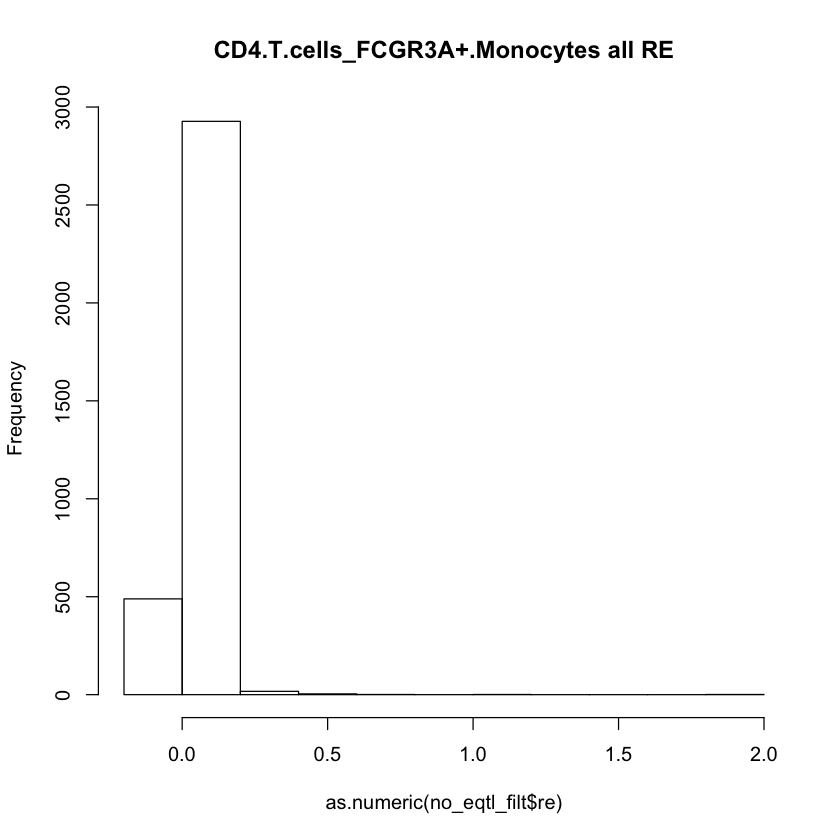

NULL


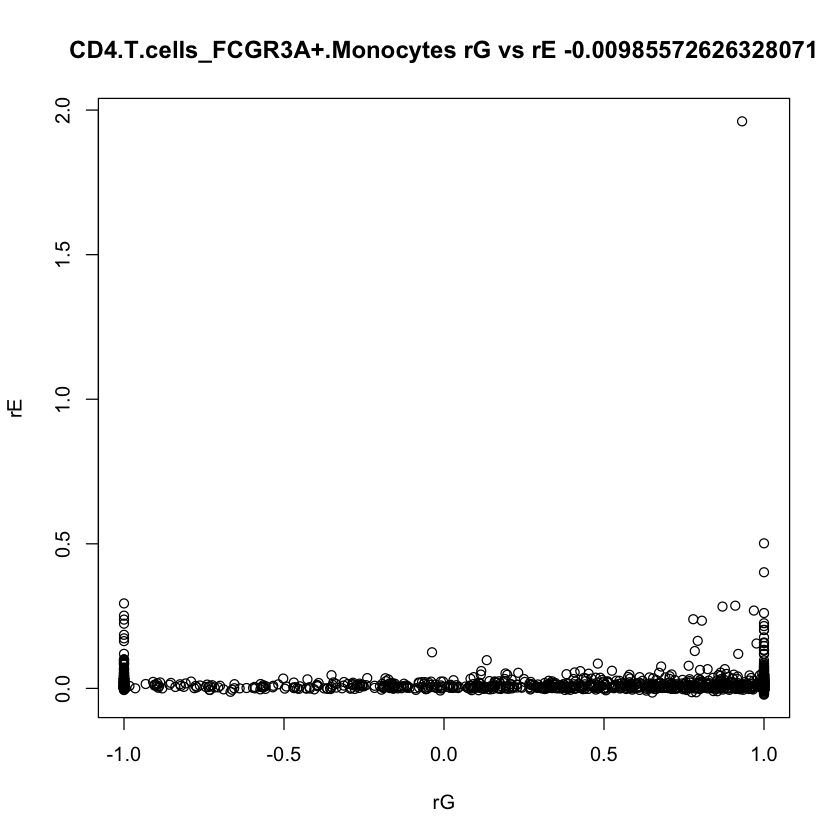

                      cell_pair    gene      sg1      se1      sg2      se2
1 CD4.T.cells_FCGR3A+.Monocytes   ABCC5 0.000107 0.001949 0.000383 0.001751
2 CD4.T.cells_FCGR3A+.Monocytes ABHD14B 0.006108 0.006234 0.003803 0.004545
3 CD4.T.cells_FCGR3A+.Monocytes   ACAD9 0.002083 0.003618 0.002084 0.003093
4 CD4.T.cells_FCGR3A+.Monocytes    ACPP  6.6e-05 0.000258 0.011013 0.007729
5 CD4.T.cells_FCGR3A+.Monocytes  ACVR2B 0.111137 0.121708 0.011944 0.059162
6 CD4.T.cells_FCGR3A+.Monocytes   ADPRH        0 0.000708        0 0.002535
        rg        re         rg_se
1        1  0.001401     10.438285
2        1  0.029282      0.278419
3 0.010241  0.005579      1.137785
4 0.440747 -0.001441      1.412506
5        1  1.056748      0.916453
6       -1  0.001224 153142.539981
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.277122560455607"
[1] "median"   "0.823705"
[1] "var"              "0.73851597205749"
[1] "in 0,1 range" "2267"         "of"           "3424"        
[

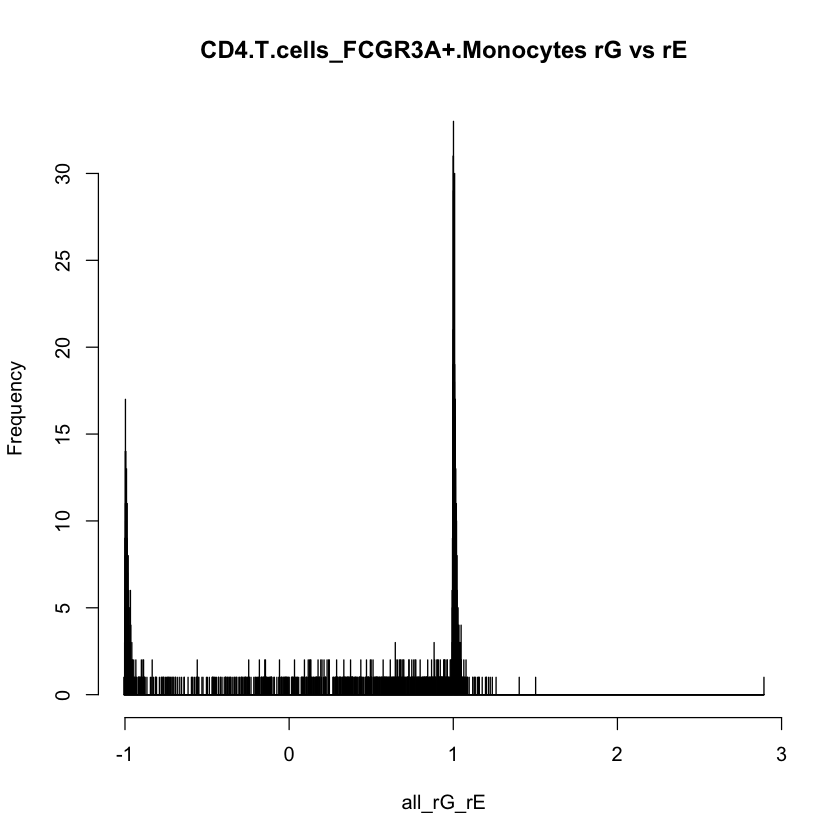

NULL


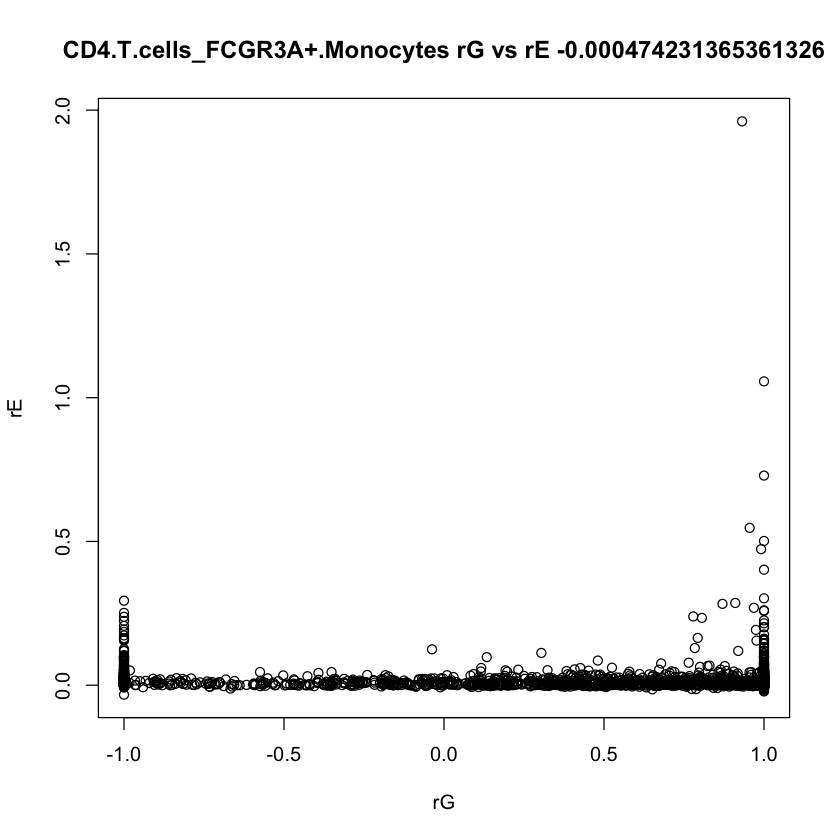

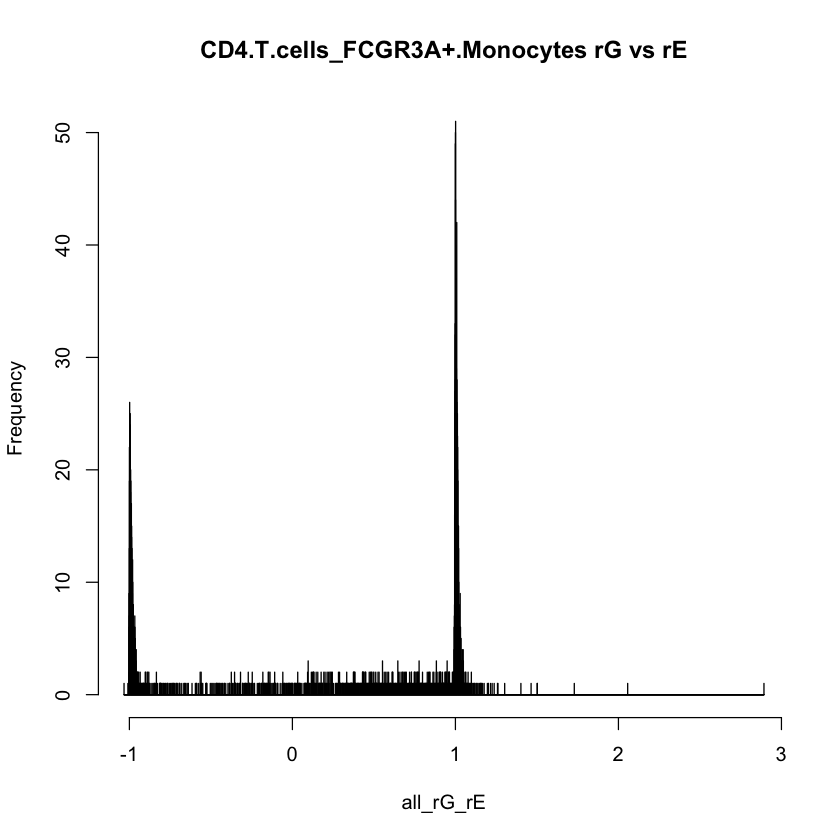

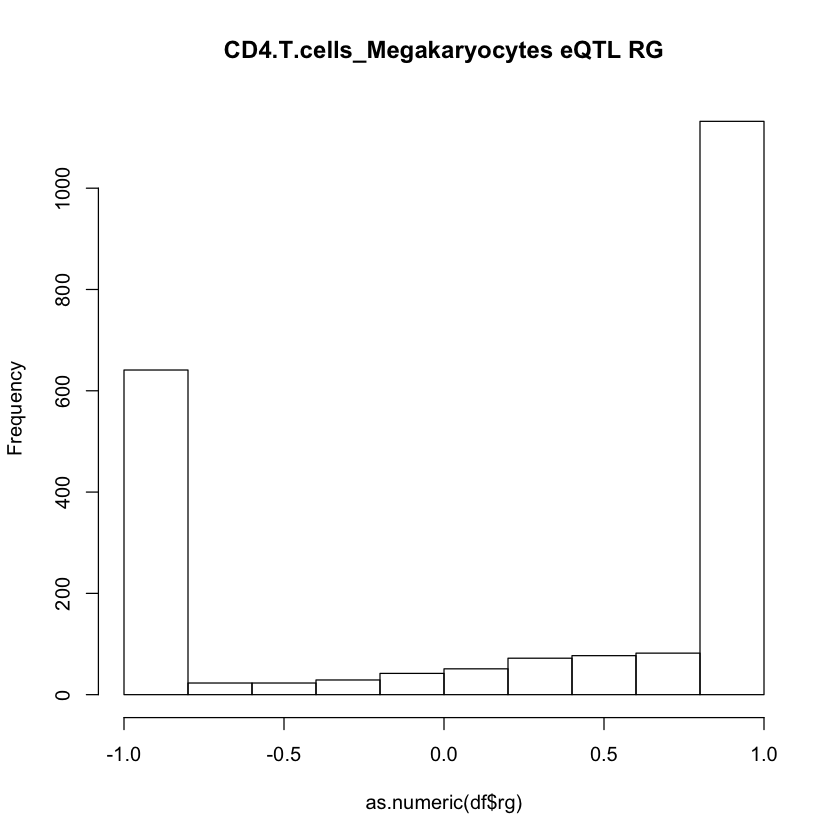

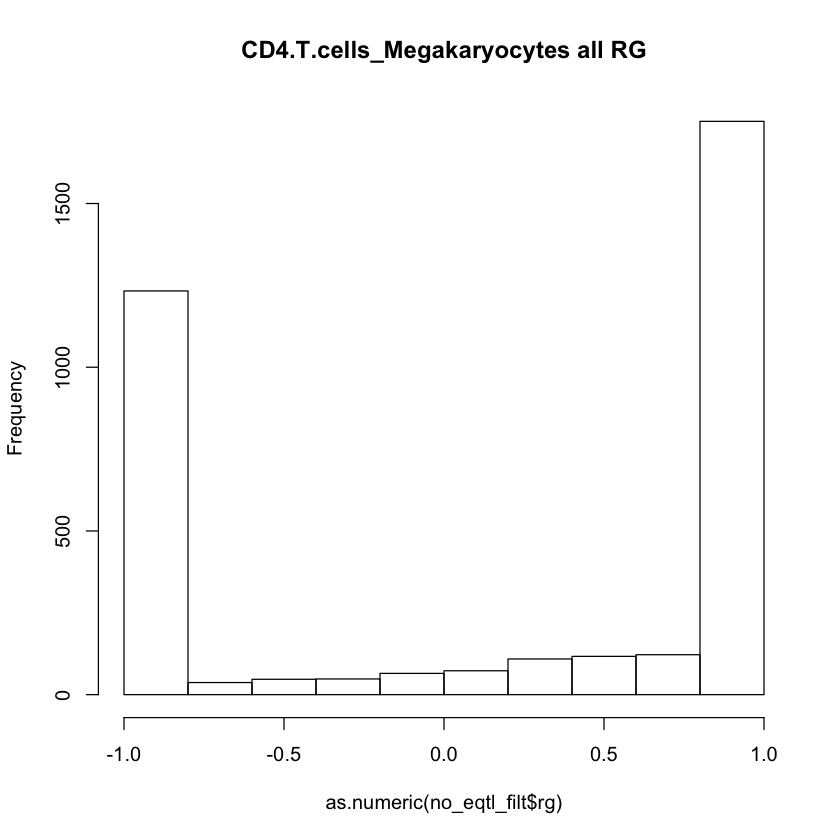

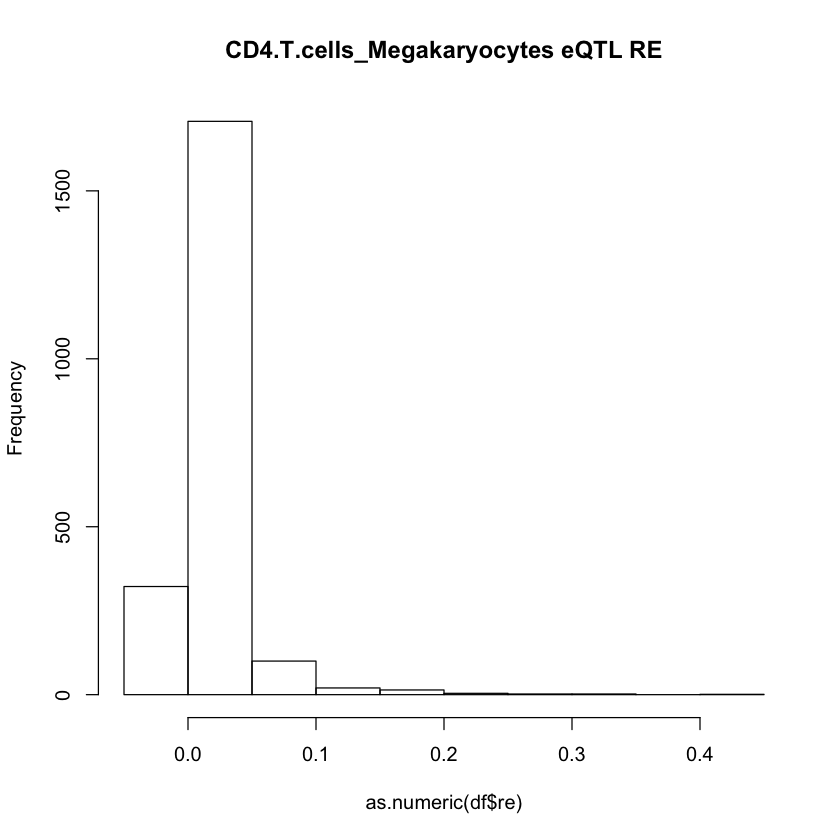

     gene                  cell_pair      sg1      se1      sg2      se2
1    A1BG CD4.T.cells_Megakaryocytes 0.001453 0.003539 0.003456 0.007437
2 A2M-AS1 CD4.T.cells_Megakaryocytes 0.052686 0.026397 0.002922 0.004616
3   AAED1 CD4.T.cells_Megakaryocytes 0.005498 0.006025 0.009673 0.010445
4   AAGAB CD4.T.cells_Megakaryocytes 0.004117 0.003725 0.006836 0.008465
5   AAMDC CD4.T.cells_Megakaryocytes 0.002553 0.002366 0.000207 0.003986
6   AASDH CD4.T.cells_Megakaryocytes        0 0.003315        0 0.007553
        rg       re         rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1        1 0.022675      1.287465               0           1                 1
2        1 0.024437      0.529137               0           1                 0
3        1 0.027575      0.362034               0           0                 0
4 0.352166 0.003596      0.713528               0           0                 0
5       -1 0.012073     10.063557               0           0                 0
6       -

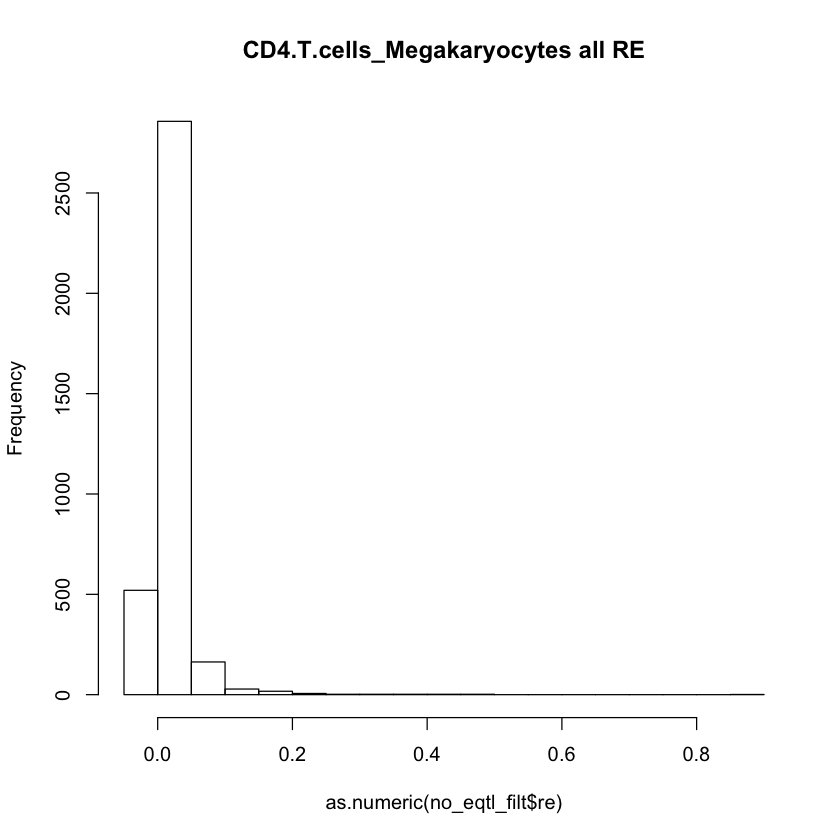

NULL


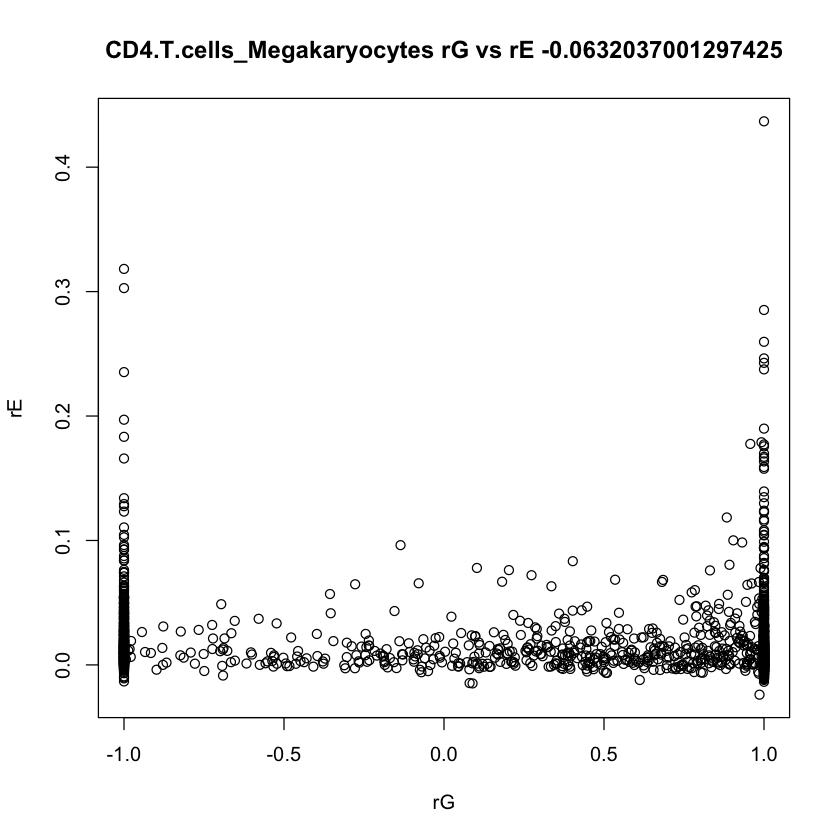

                   cell_pair    gene      sg1      se1      sg2      se2 rg
1 CD4.T.cells_Megakaryocytes   ABCC5        0 0.001889        0 0.005531 -1
2 CD4.T.cells_Megakaryocytes   ABCF3        0 0.001677        0 0.006296 -1
3 CD4.T.cells_Megakaryocytes ABHD14A 0.000283 0.001559  0.00019 0.004901 -1
4 CD4.T.cells_Megakaryocytes ABHD14B    0.005 0.005699 0.001321 0.005868  1
5 CD4.T.cells_Megakaryocytes   ABTB1 0.001014 0.002665 0.000299 0.006607  1
6 CD4.T.cells_Megakaryocytes   ACAA1        0 0.001781        0 0.007123 -1
         re         rg_se
1  0.007016 133017.373459
2 -0.002339 144498.255468
3  0.023627      18.20454
4  0.047568      1.508915
5  0.015033     10.244744
6  0.002709 141256.980219
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.172248988317107"
[1] "median"   "0.728158"
[1] "var"               "0.826634723204598"
[1] "in 0,1 range" "2168"         "of"           "3595"        
[1] "rE info"
[1] "min"       "-0.026525"
[1] "max"      "0.87

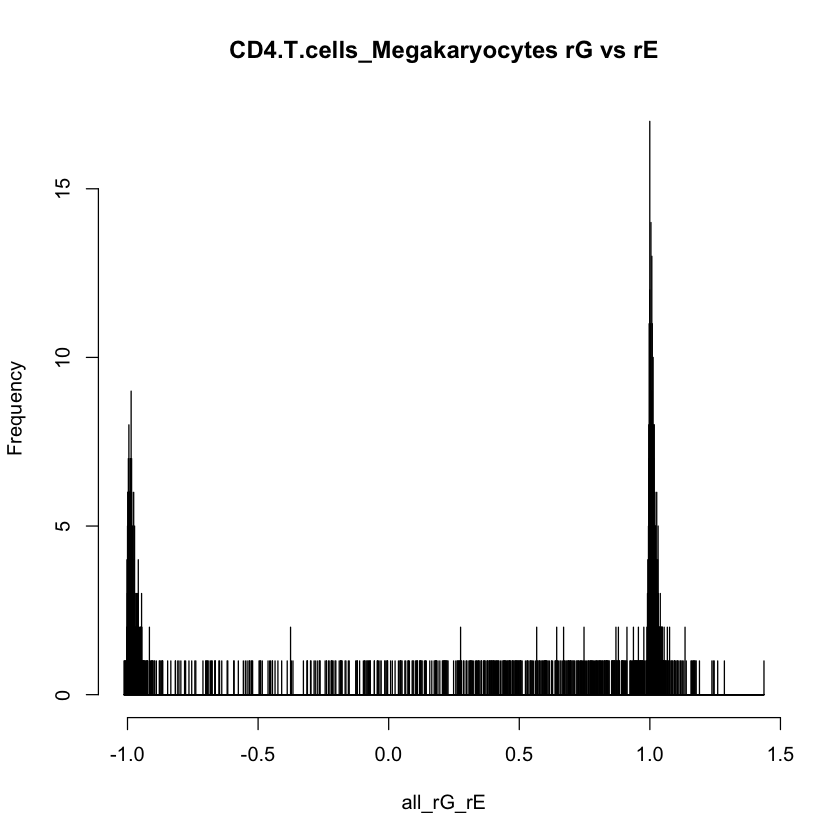

NULL


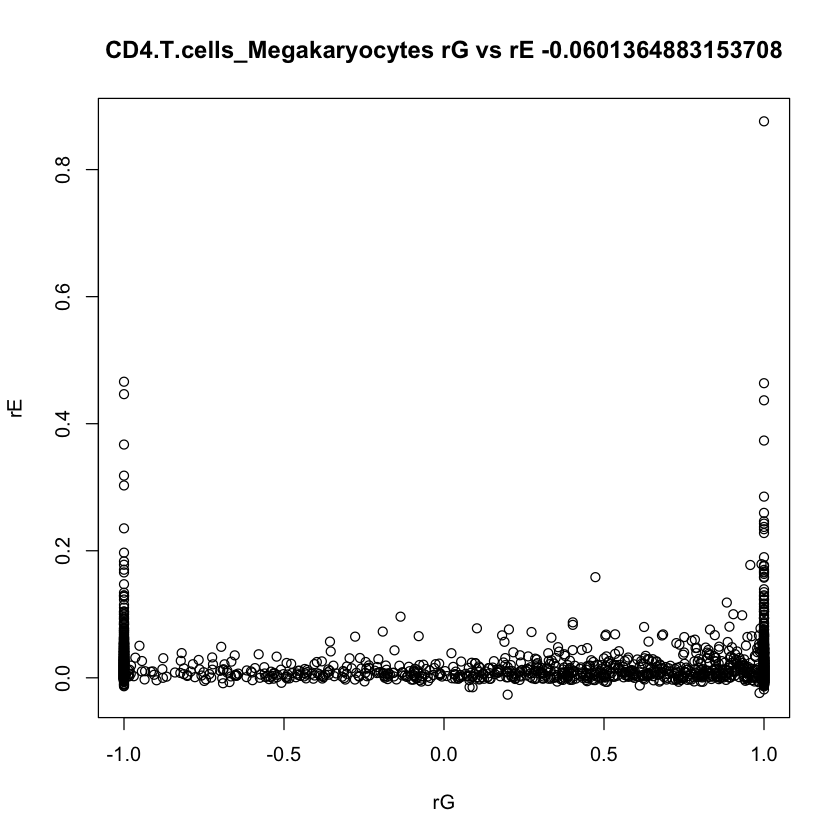

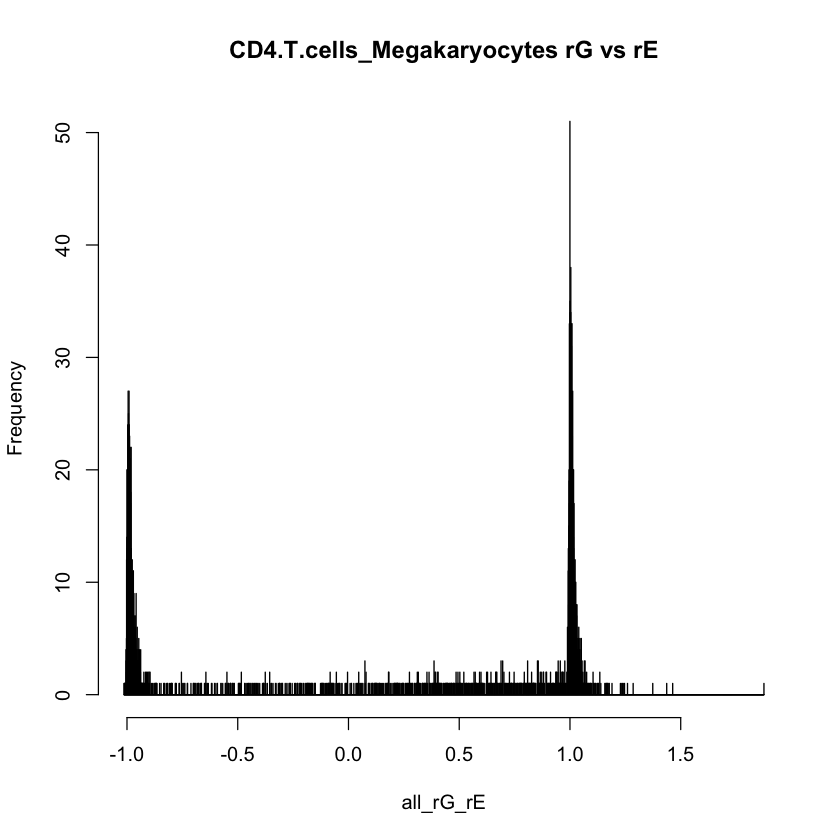

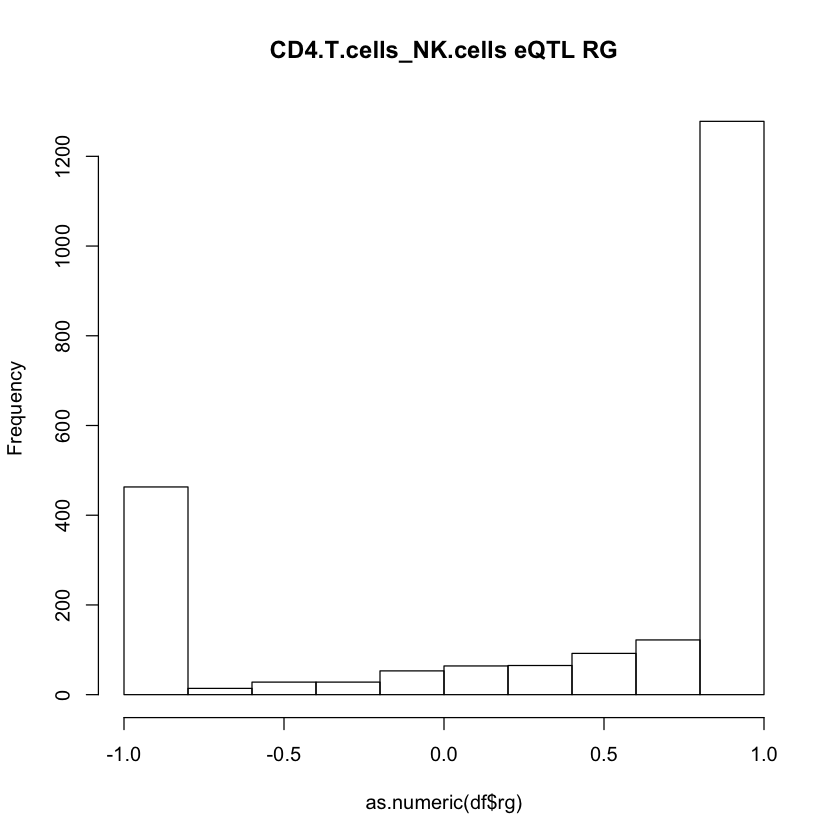

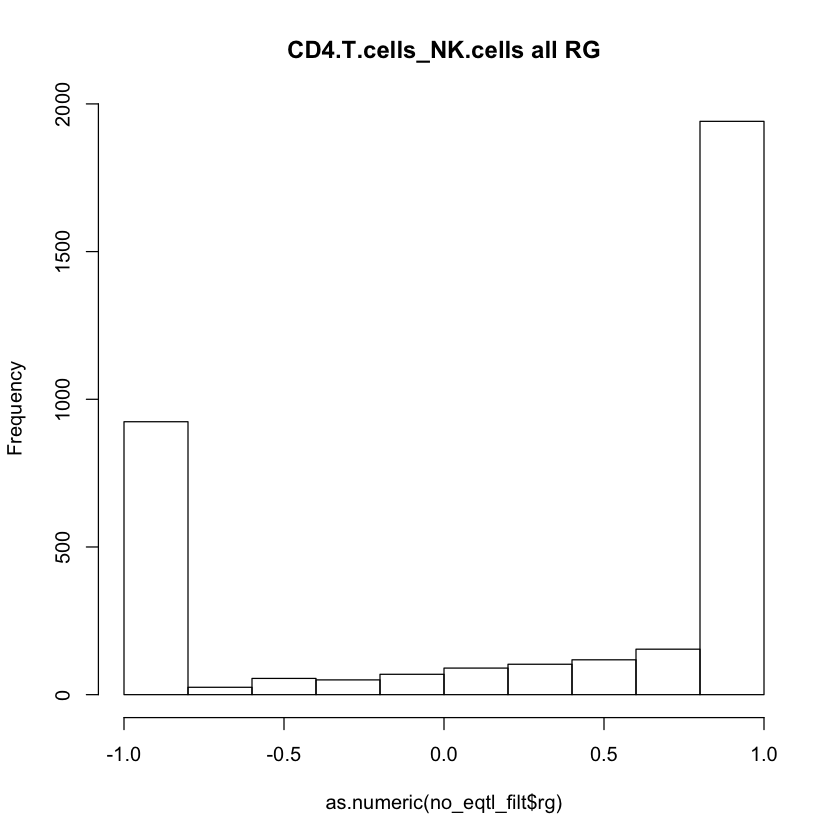

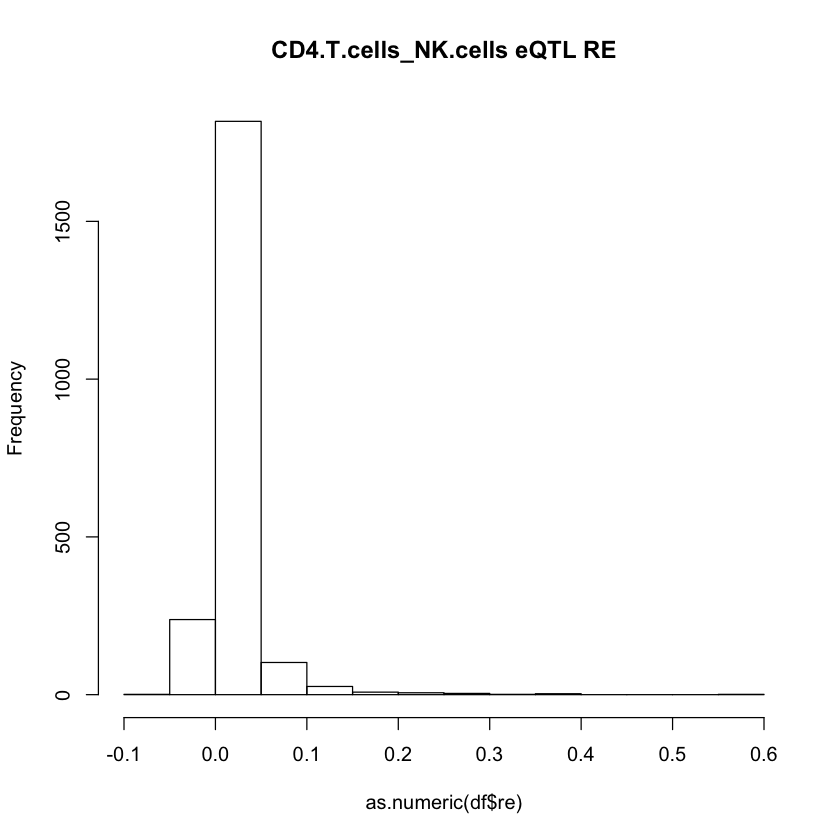

     gene            cell_pair      sg1      se1      sg2      se2        rg
1    A1BG CD4.T.cells_NK.cells 0.001067  0.00337 0.005361 0.008457 -0.076163
2 A2M-AS1 CD4.T.cells_NK.cells 0.036896 0.020907 0.053689   0.0297         1
3   AAGAB CD4.T.cells_NK.cells 0.003308  0.00337 0.002515 0.003427         1
4   AAMDC CD4.T.cells_NK.cells 0.001701  0.00192 0.000676 0.002334        -1
5   ABCA2 CD4.T.cells_NK.cells 0.000855 0.002689 0.007184 0.006234         1
6   ABCA7 CD4.T.cells_NK.cells 0.004266 0.005277  0.00279  0.00568         1
         re    rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.033198 1.708652               0           1                 1
2  0.035906  0.13086               0           1                 0
3  0.004869 0.614709               0           0                 0
4  0.007434 1.934452               0           0                 0
5  0.002345 1.432644               0           0                 0
6 -0.009056 1.406971               0           0           

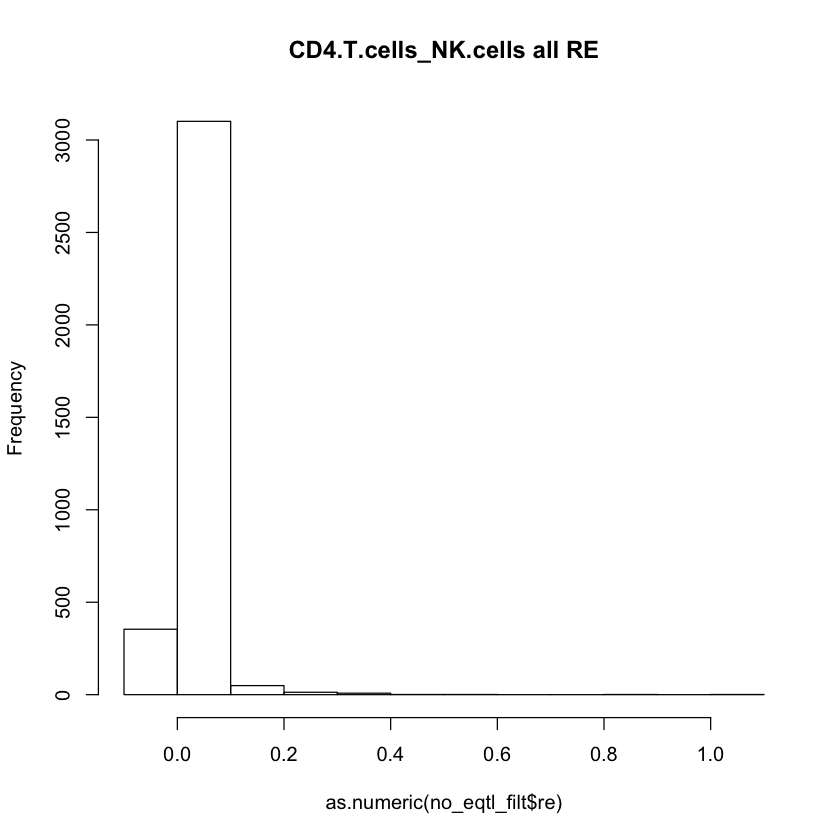

NULL


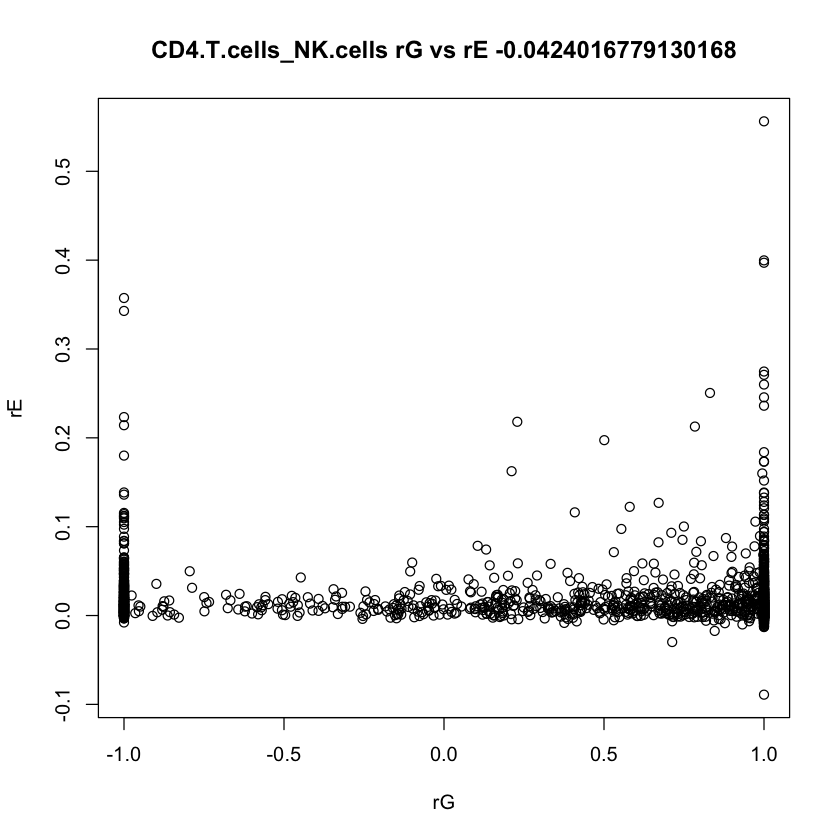

             cell_pair    gene      sg1      se1      sg2      se2       rg
1 CD4.T.cells_NK.cells   ABCC5 0.000569 0.002189 0.001962 0.003431        1
2 CD4.T.cells_NK.cells   ABCF3        0 0.001677        0 0.003285       -1
3 CD4.T.cells_NK.cells ABHD14A 0.000237 0.001527  0.00014  0.00224       -1
4 CD4.T.cells_NK.cells ABHD14B 0.008475 0.007472 0.004936 0.005216        1
5 CD4.T.cells_NK.cells   ABTB1 0.001071 0.002707  0.00155 0.004449 0.589154
6 CD4.T.cells_NK.cells   ACAD9 0.002125  0.00364 0.002174 0.002802 0.033107
        re        rg_se
1  0.00577     1.947308
2 0.005524 106513.12572
3 0.016628    13.462098
4 0.037547      0.17128
5 0.016503      1.51389
6 0.002171     1.049943
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.325537955530217"
[1] "median"   "0.954857"
[1] "var"               "0.735617829062201"
[1] "in 0,1 range" "2397"         "of"           "3508"        
[1] "rE info"
[1] "min"       "-0.089072"
[1] "max"      "1.083969"
[1] "mea

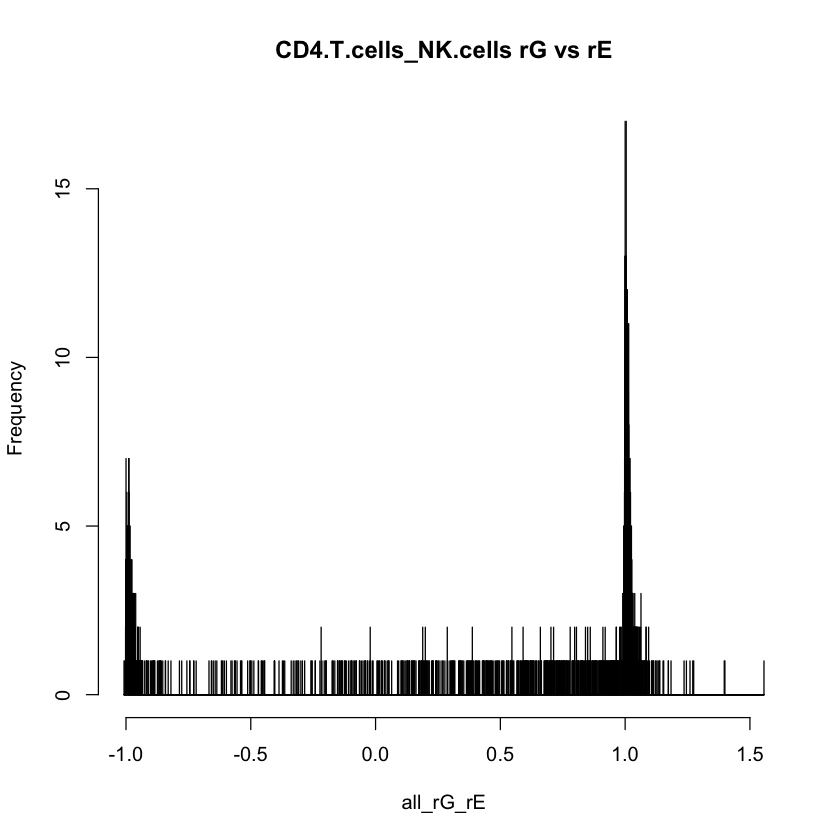

NULL


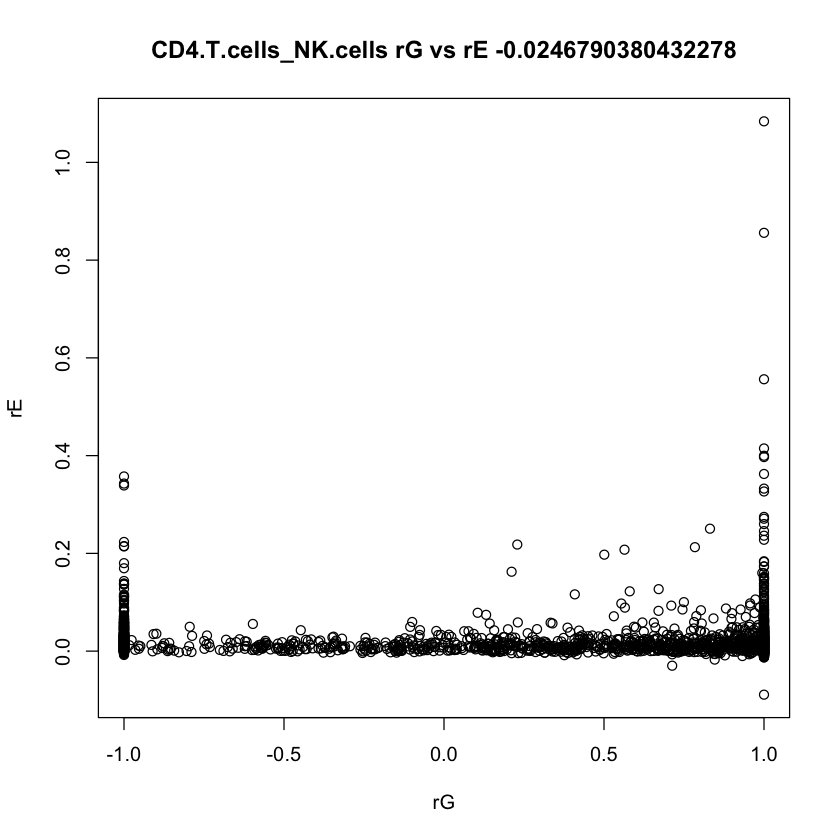

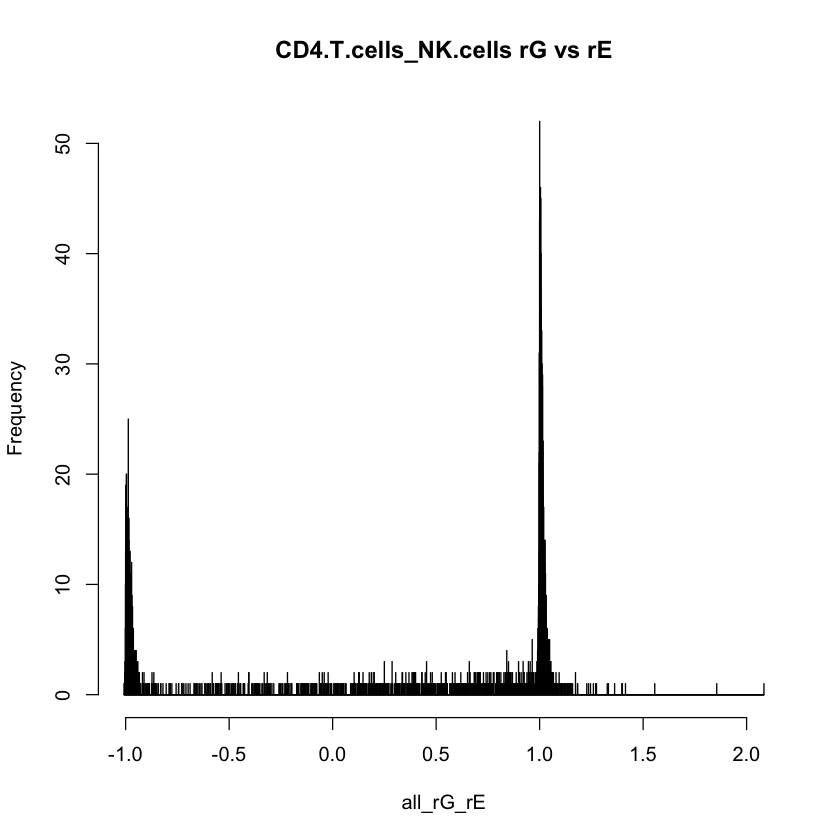

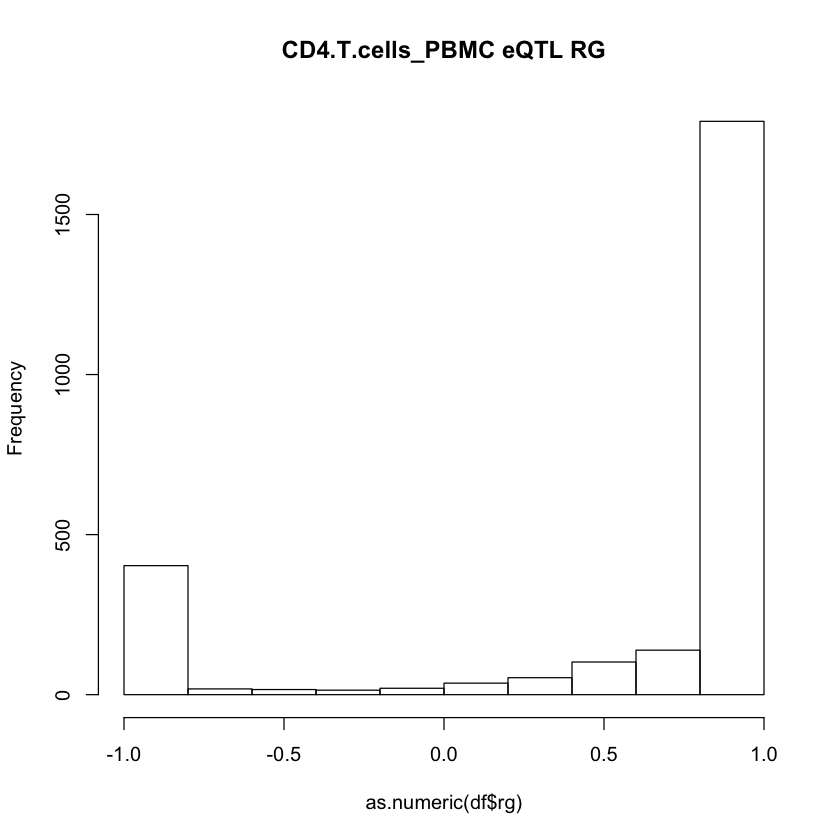

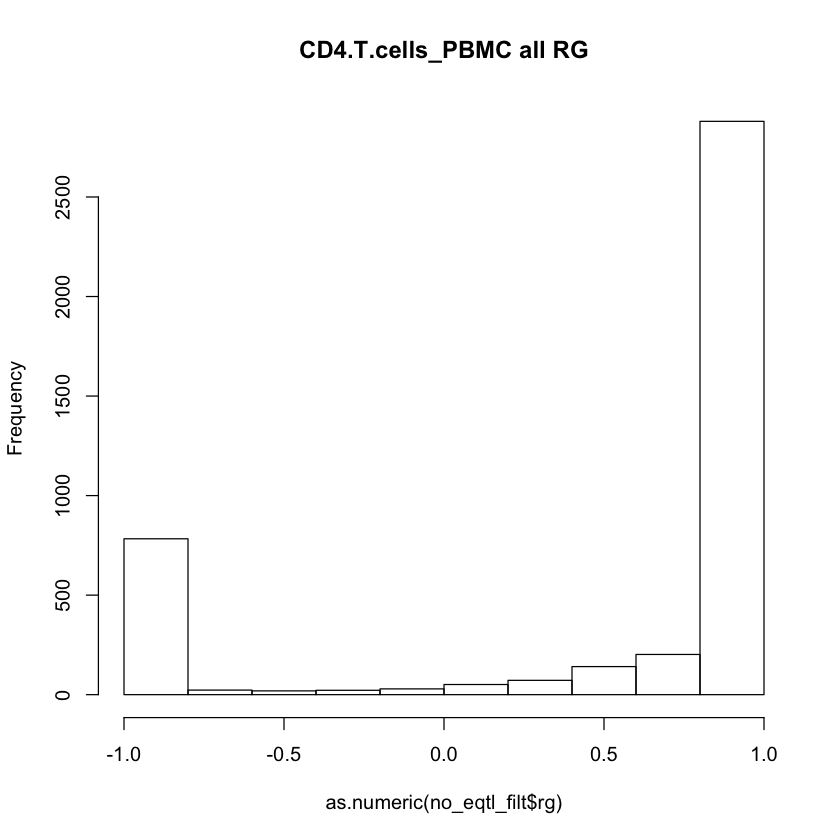

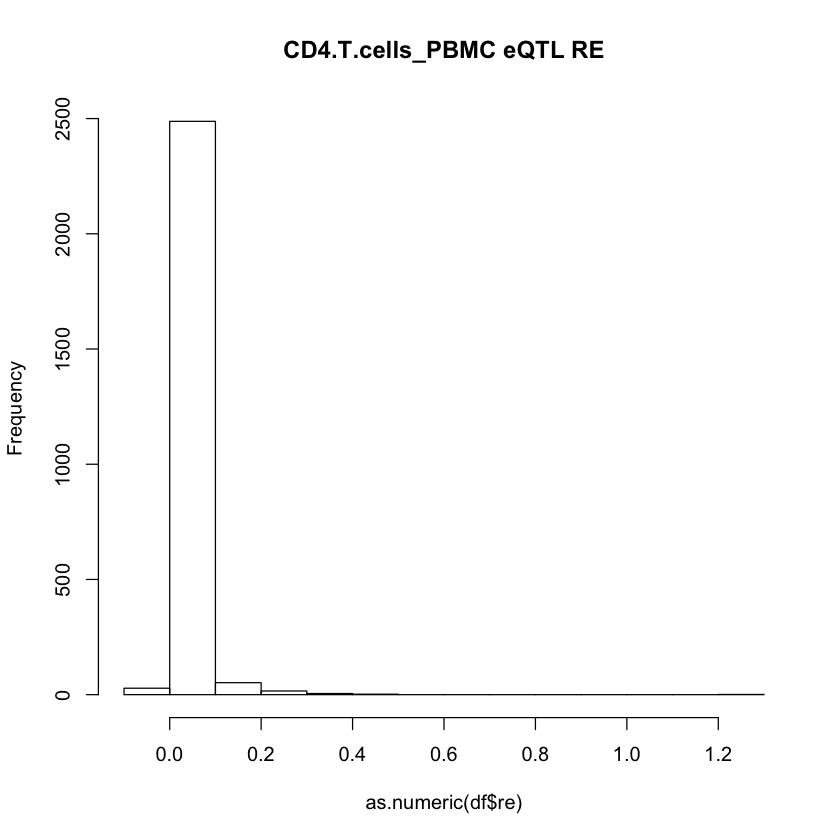

     gene        cell_pair      sg1      se1      sg2      se2       rg
1    A1BG CD4.T.cells_PBMC 0.001248 0.003458  0.00819 0.006289 0.510046
2 A2M-AS1 CD4.T.cells_PBMC 0.050082 0.025669 0.041189 0.024858 0.875449
3   AAED1 CD4.T.cells_PBMC 0.004531 0.005747 0.001592  0.00263 0.976807
4   AAGAB CD4.T.cells_PBMC 0.002681 0.002976 0.006252 0.003321        1
5   AAMDC CD4.T.cells_PBMC 0.003447 0.002733    3e-06 0.000968        1
6    AATF CD4.T.cells_PBMC 0.001857  0.00201 0.000151 0.000622        1
        re      rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.041625   0.737447               0           1                 1
2 0.074994   0.139408               0           1                 0
3 0.033938   0.309901               0           0                 0
4 0.013238   0.225977               0           0                 0
5  0.01518 140.470096               0           0                 0
6 0.008463   1.126159               1           0                 0
  Megakaryocytes CD4

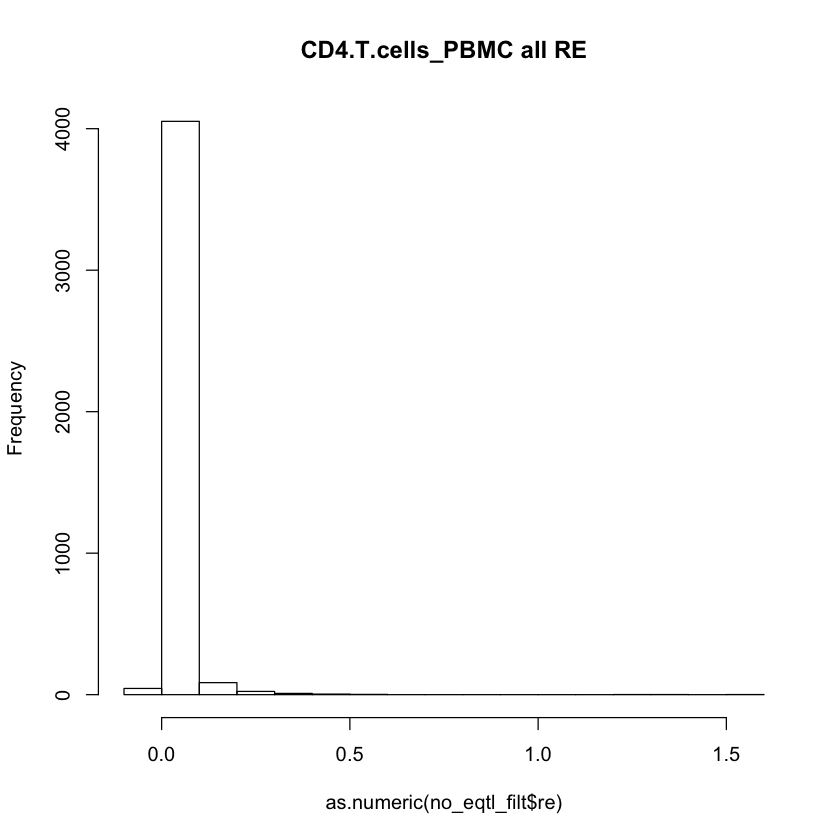

NULL


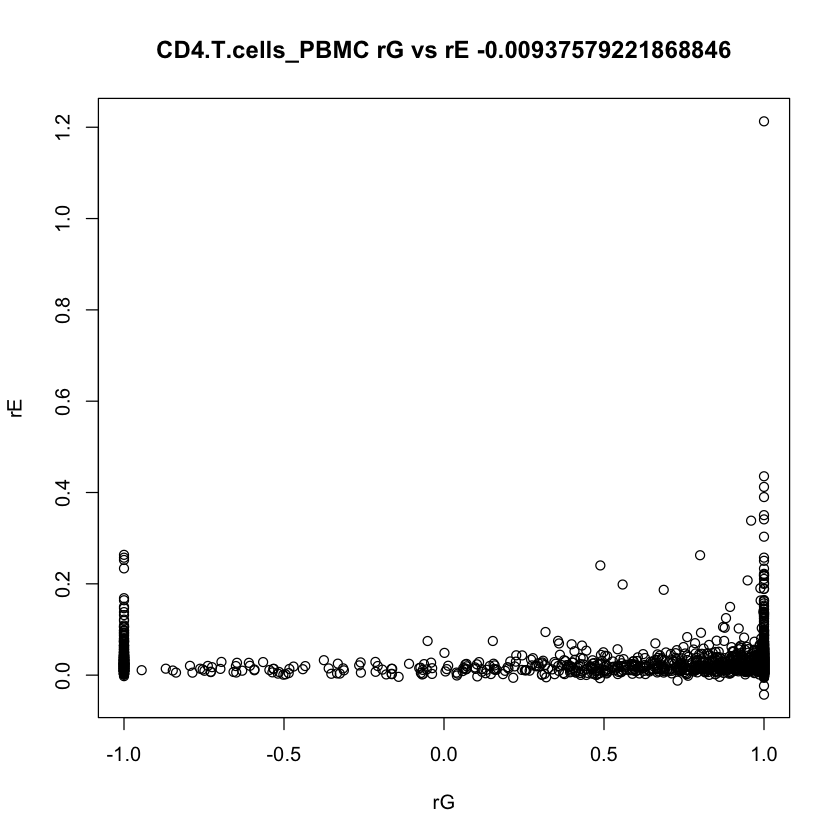

         cell_pair    gene      sg1      se1      sg2      se2       rg
1 CD4.T.cells_PBMC ABHD14A 0.000355 0.001618        0 0.001718        1
2 CD4.T.cells_PBMC ABHD14B 0.008704 0.007575 0.008807  0.00717 0.961353
3 CD4.T.cells_PBMC   ABTB1 0.000943 0.002645 0.003945  0.00314 0.417819
4 CD4.T.cells_PBMC   ACAD9 0.002225  0.00367 0.001374  0.00234 0.956871
5 CD4.T.cells_PBMC   ACPL2 0.004264 0.004054   0.0065 0.005263        1
6 CD4.T.cells_PBMC    ACPP  6.7e-05  0.00026 0.012697  0.01027 0.040195
         re        rg_se
1   0.02825 16593.357235
2  0.057626     0.066728
3  0.015907     0.875334
4  0.021394     0.559381
5  0.020703      0.21968
6 -0.000743     1.274151
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.537631319239905"
[1] "median" "1"     
[1] "var"               "0.600430045082112"
[1] "in 0,1 range" "3338"         "of"           "4210"        
[1] "rE info"
[1] "min"       "-0.042757"
[1] "max"      "1.551751"
[1] "mean"               "0.02984

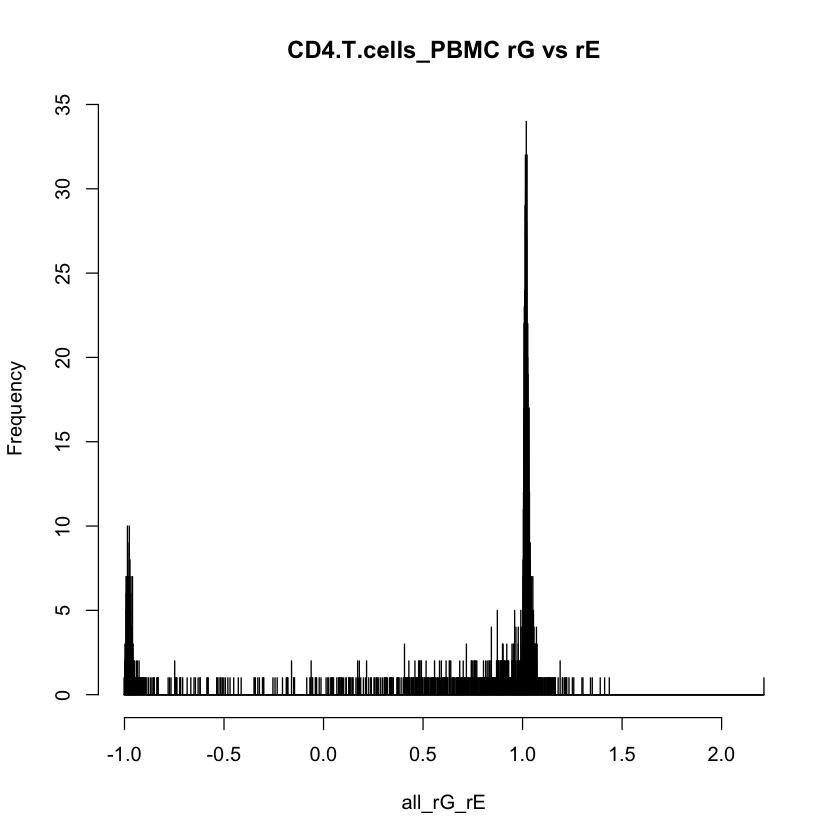

NULL


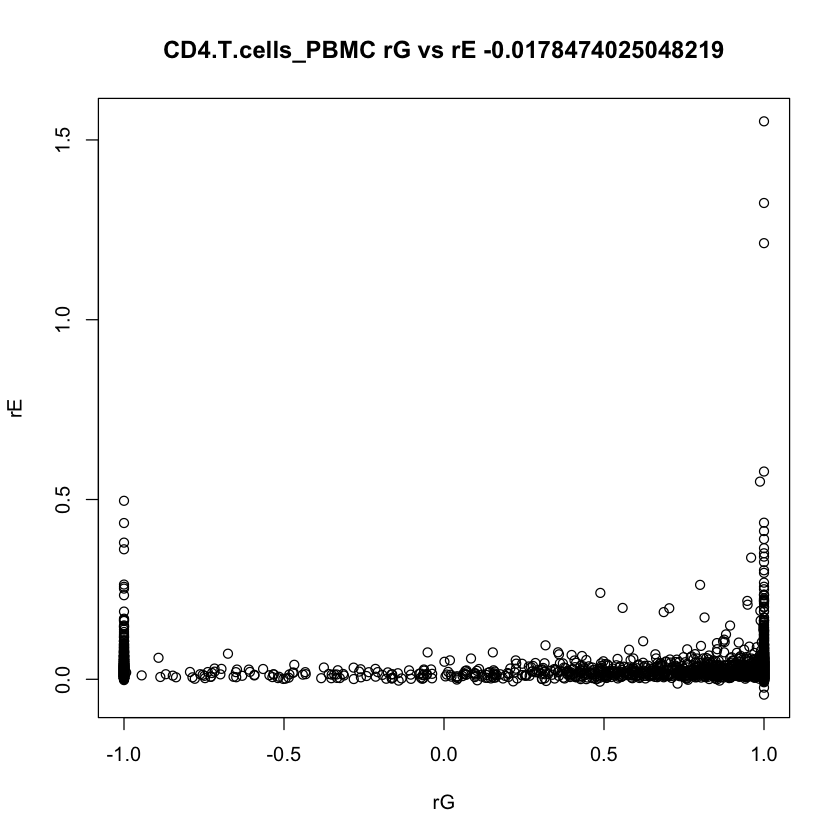

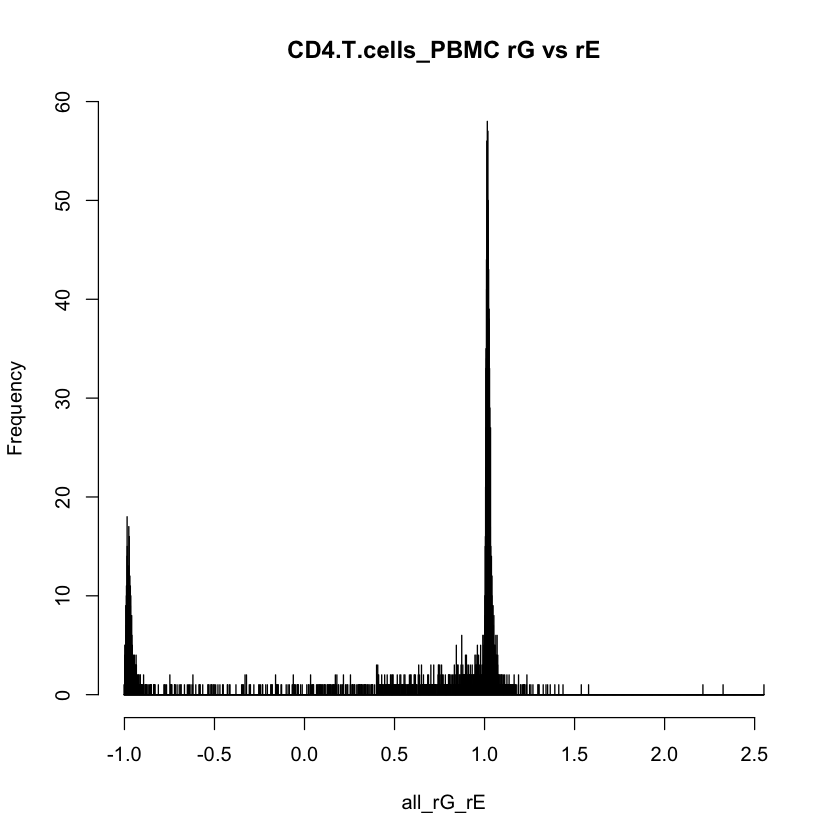

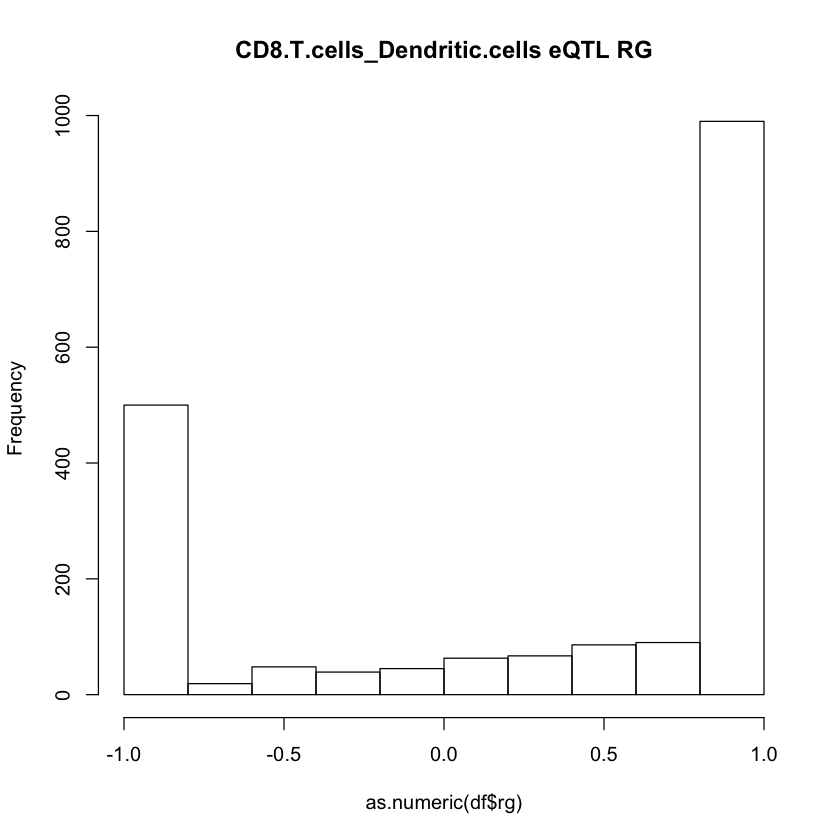

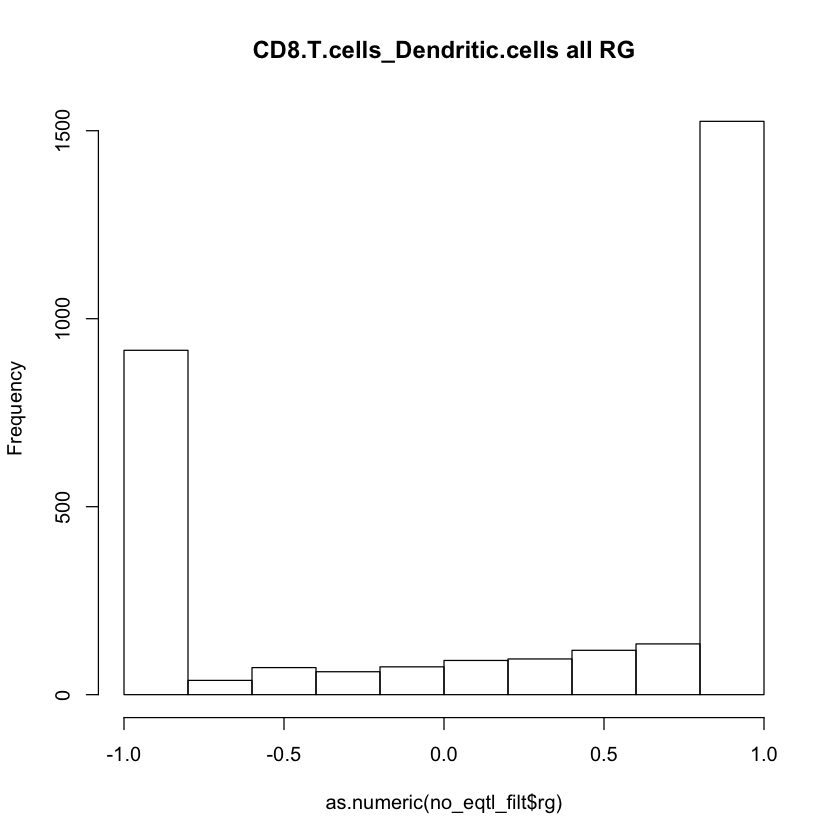

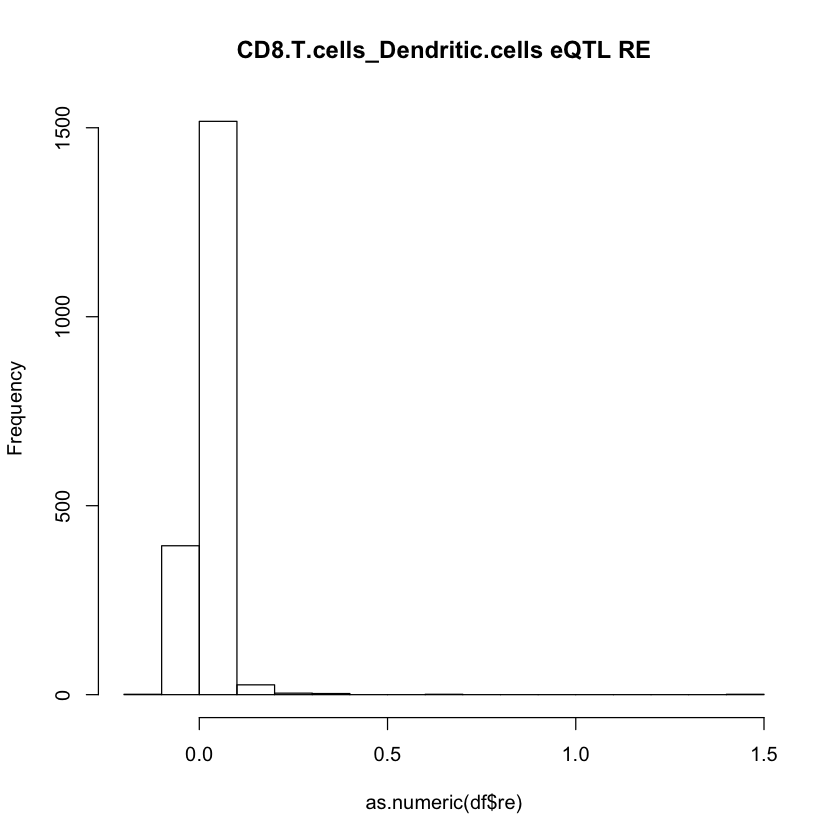

     gene                   cell_pair      sg1      se1      sg2      se2
1 A2M-AS1 CD8.T.cells_Dendritic.cells 0.043194  0.02335 0.004469 0.003205
2    AAAS CD8.T.cells_Dendritic.cells 0.000274  0.00245 0.000192  0.00366
3   AAED1 CD8.T.cells_Dendritic.cells  2.1e-05 0.003779  2.1e-05 0.003625
4   ABCB4 CD8.T.cells_Dendritic.cells        0 0.000156        0 0.001185
5   ABCB8 CD8.T.cells_Dendritic.cells 0.003323 0.004327 0.007285 0.006582
6   ABCF1 CD8.T.cells_Dendritic.cells        0  0.00392        0 0.005227
         rg        re         rg_se Dendritic.cells CD8.T.cells
1 -0.168236  0.010034      0.445837               0           1
2         1 -0.006822     14.725543               0           0
3         1  0.019499    136.010516               0           0
4        -1  0.000679 178301.711717               0           0
5         1 -0.001751      0.689663               0           0
6        -1  0.047407 101272.233447               0           0
  FCGR3A..Monocytes Megakaryocytes

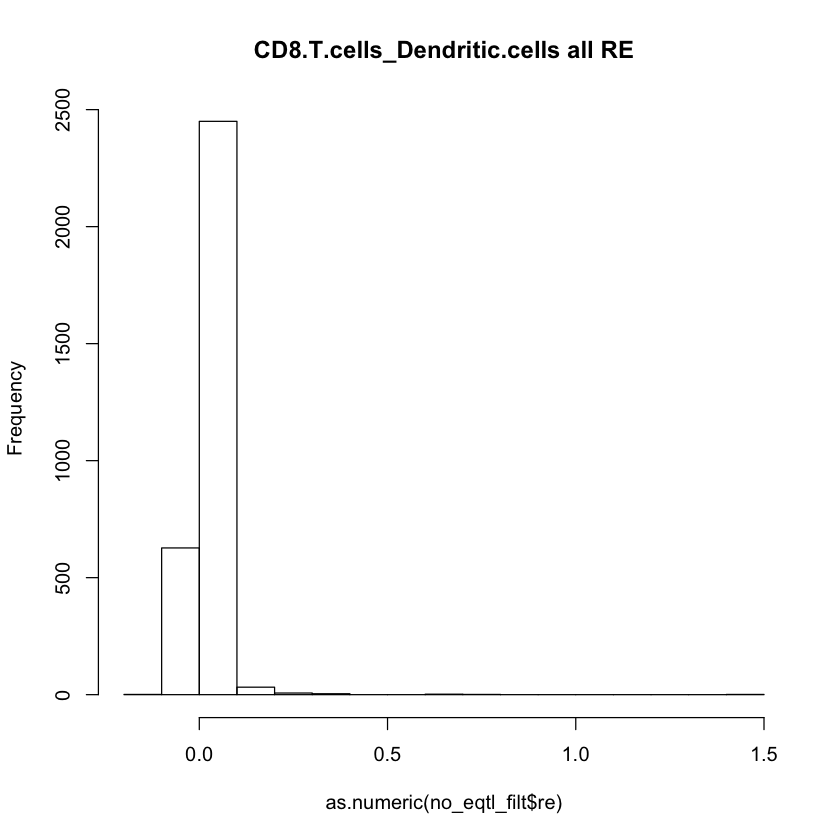

NULL


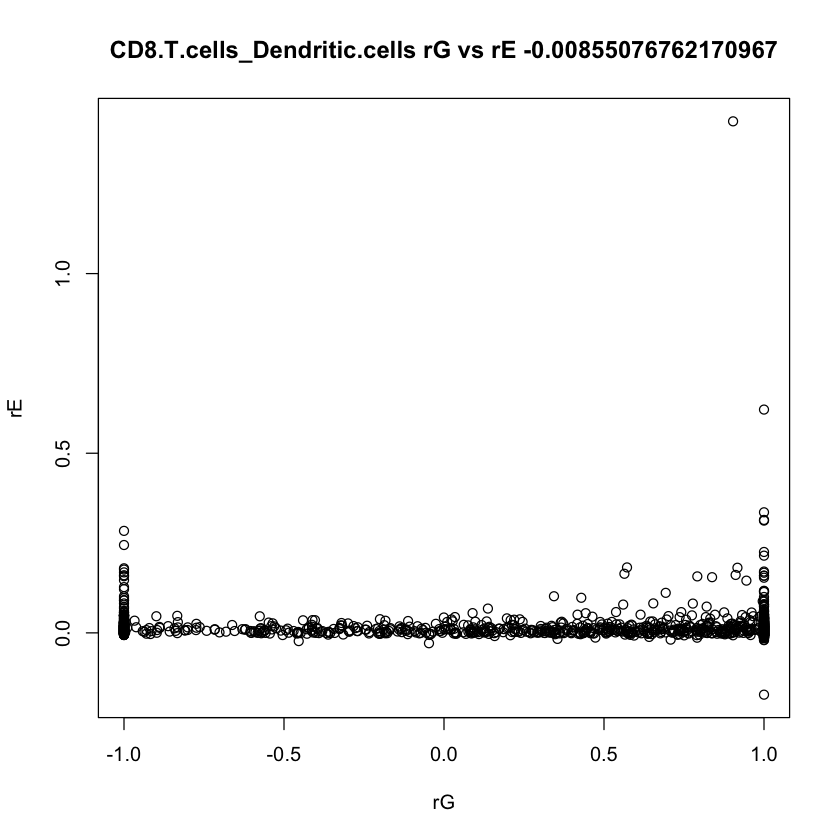

                    cell_pair    gene      sg1      se1      sg2      se2
1 CD8.T.cells_Dendritic.cells   ABCF3 0.000543 0.003401 0.000431 0.004701
2 CD8.T.cells_Dendritic.cells ABHD14B 0.008952 0.007569 0.010104 0.008469
3 CD8.T.cells_Dendritic.cells   ABHD5 0.014741 0.009758 0.002251 0.004047
4 CD8.T.cells_Dendritic.cells   ABHD6        0 0.000883 0.002394 0.003095
5 CD8.T.cells_Dendritic.cells    ACPP  4.2e-05  0.00011 0.004531 0.005283
6 CD8.T.cells_Dendritic.cells   ACTR8 0.008311 0.006834 0.002273 0.004478
        rg        re       rg_se
1       -1  0.018327   10.409485
2        1  0.014588    0.222005
3        1  0.009552    0.696124
4       -1  0.003391 1040.050263
5 0.292646  0.001372    1.190052
6        1 -0.000431    0.982325
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.226472447640595"
[1] "median"    "0.7512655"
[1] "var"               "0.765941026922663"
[1] "in 0,1 range" "1947"         "of"           "3094"        
[1] "rE info"
[1] "min"  

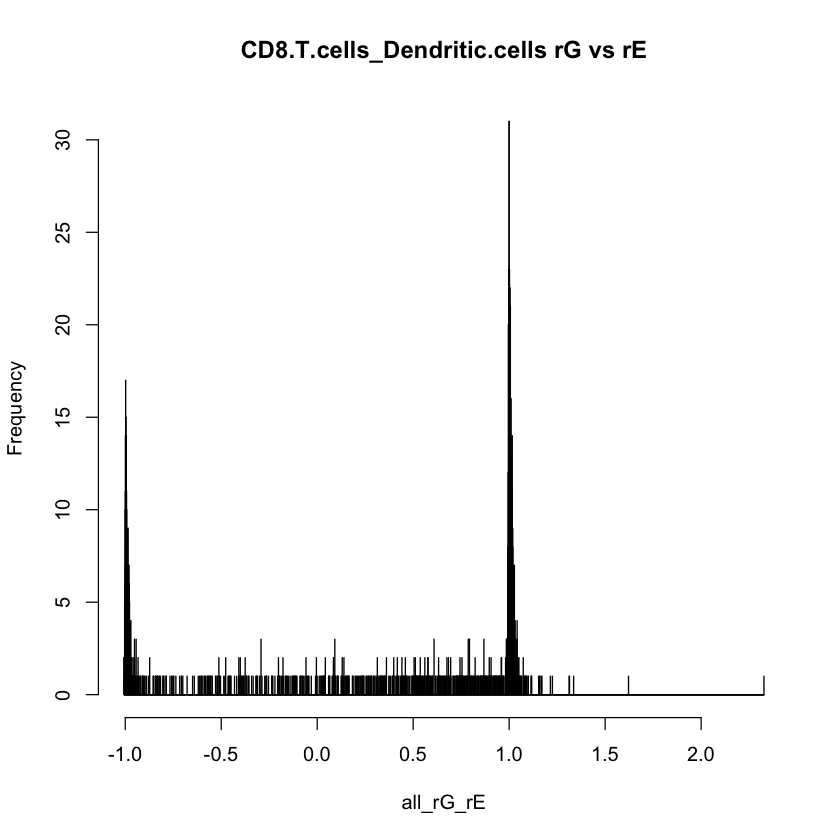

NULL


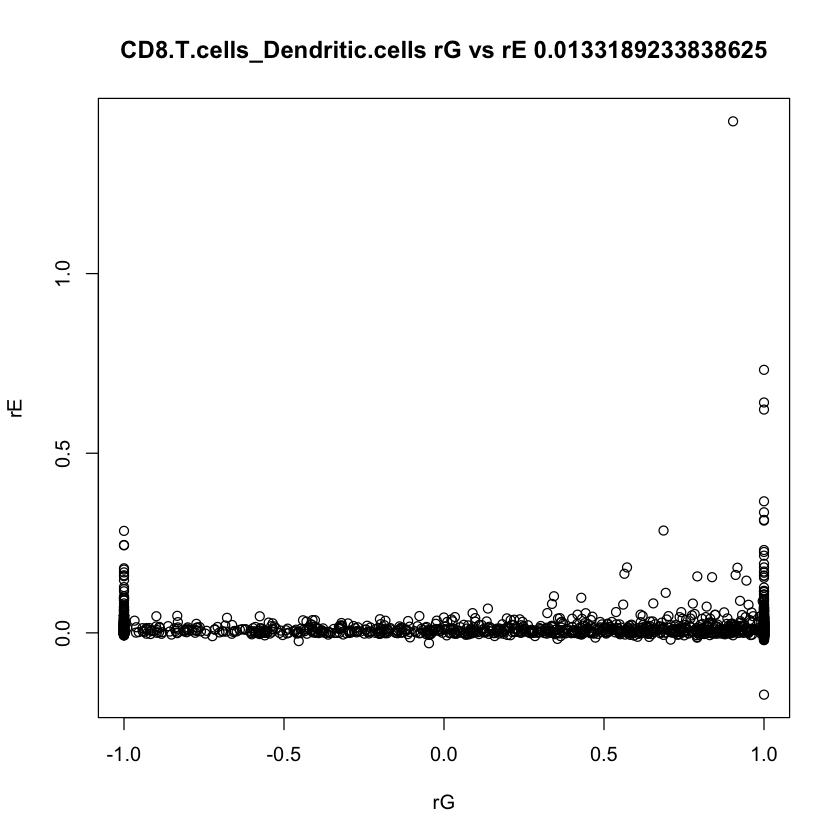

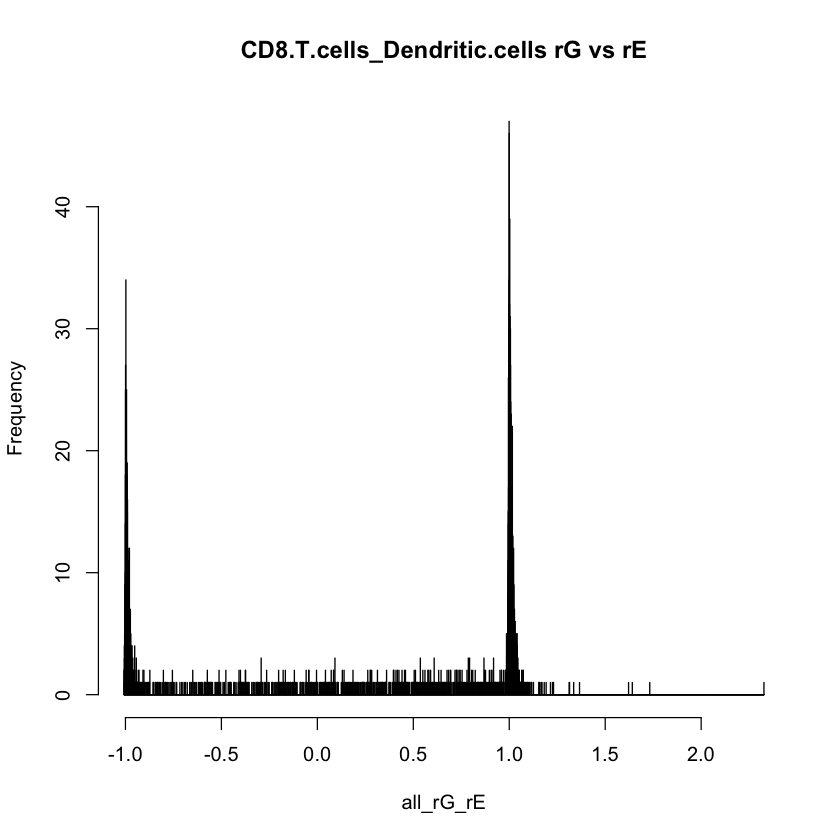

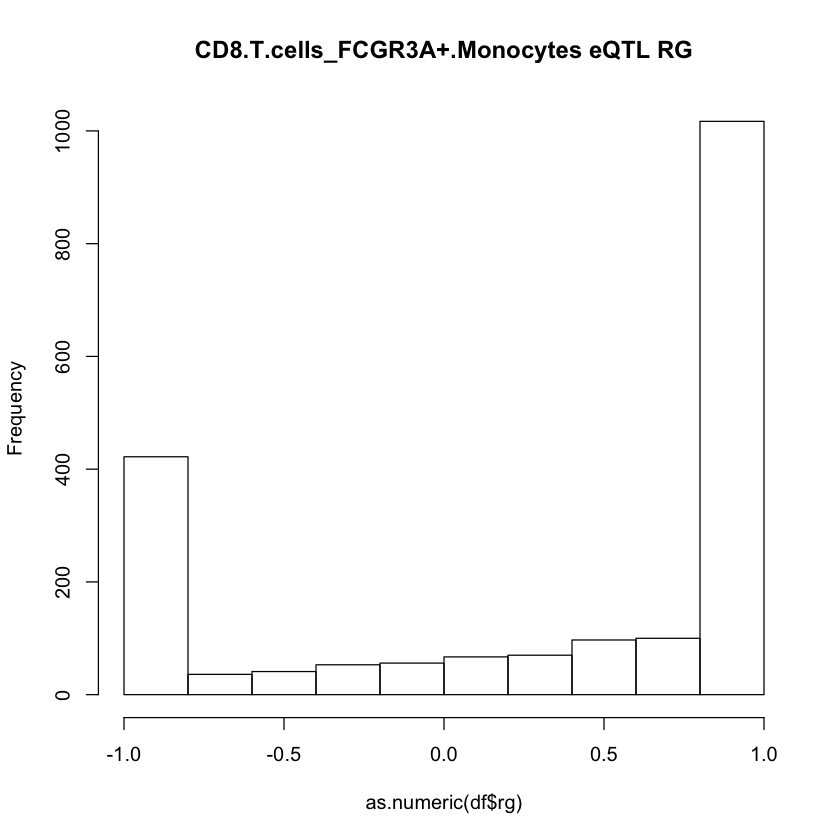

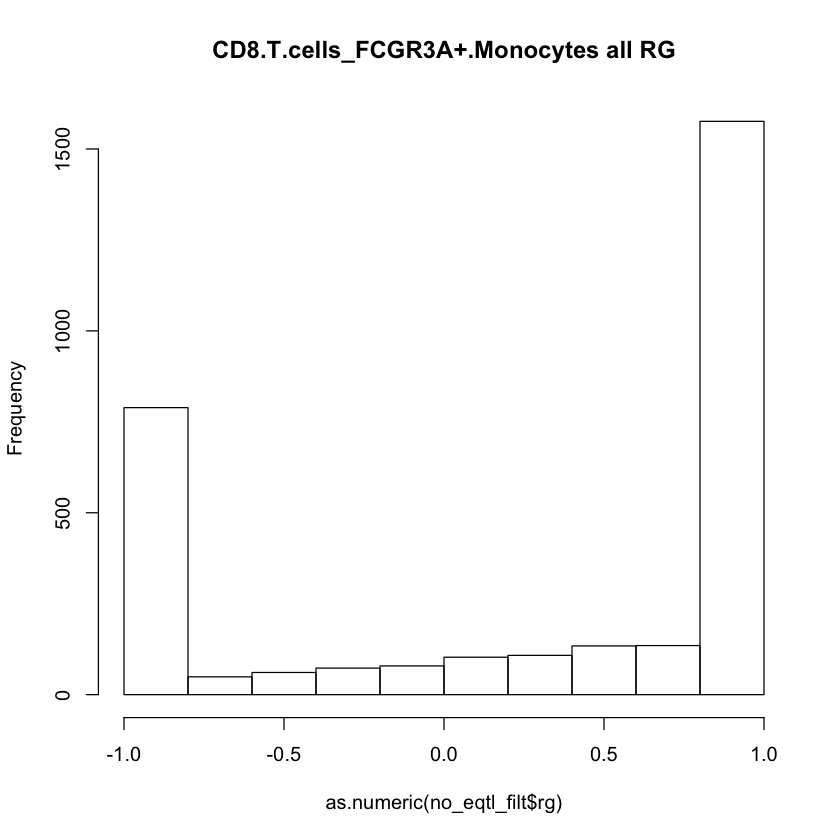

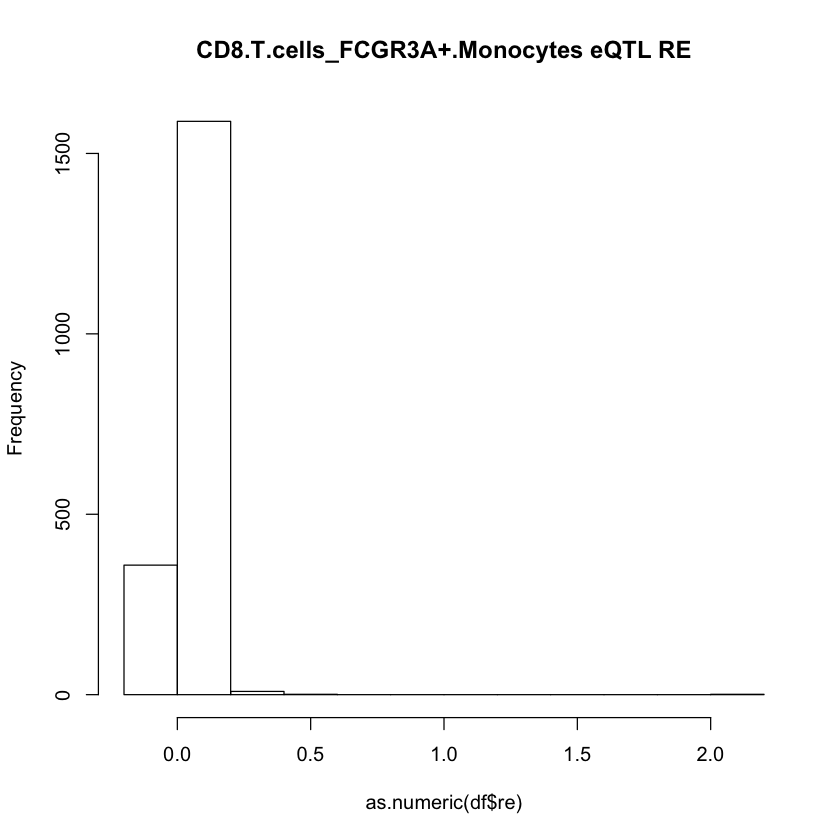

    gene                     cell_pair      sg1      se1      sg2      se2
1  AAGAB CD8.T.cells_FCGR3A+.Monocytes  0.00142 0.003954 0.003375 0.004519
2  ABCA7 CD8.T.cells_FCGR3A+.Monocytes 0.000175  0.00631 0.007635 0.008096
3  ABCB4 CD8.T.cells_FCGR3A+.Monocytes    5e-06  0.00016  1.9e-05 0.000103
4 ABHD11 CD8.T.cells_FCGR3A+.Monocytes 0.001102  0.00362 0.006787 0.005937
5 ABHD12 CD8.T.cells_FCGR3A+.Monocytes 0.001692 0.002574  0.00581 0.005056
6  ABHD2 CD8.T.cells_FCGR3A+.Monocytes 0.001291   0.0037 0.002281 0.003932
        rg        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1        1 -0.011666  1.880311               0           0                 0
2       -1  0.007434 18.595794               0           0                 1
3        1    -1e-04 17.123107               0           0                 0
4 0.347594  0.002677   1.23493               0           0                 1
5       -1  0.008603  0.577968               0           0                 0
6        1  -

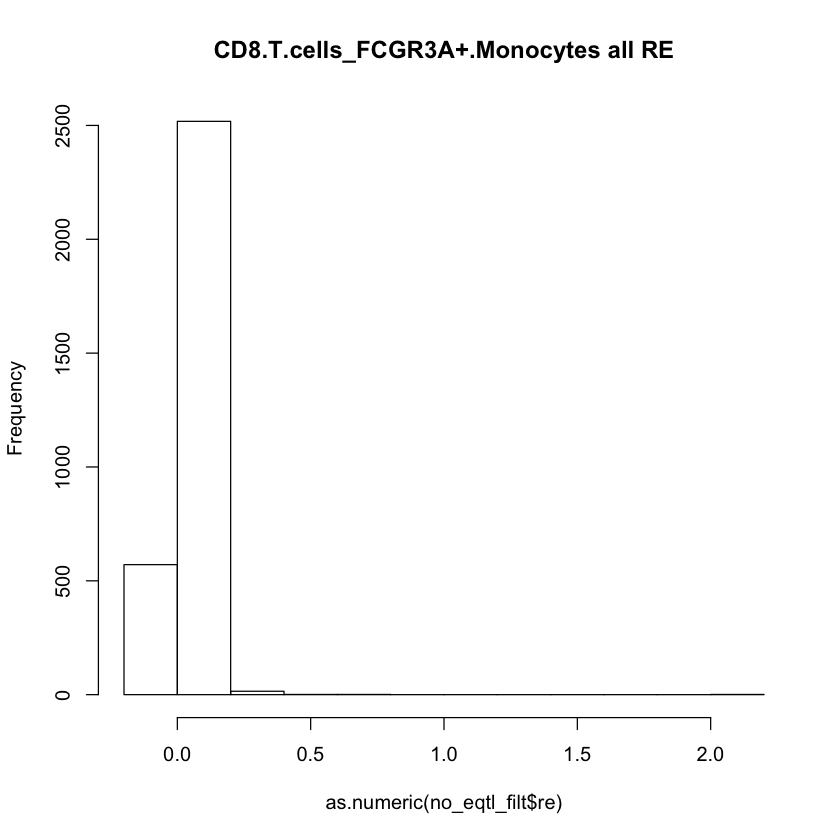

NULL


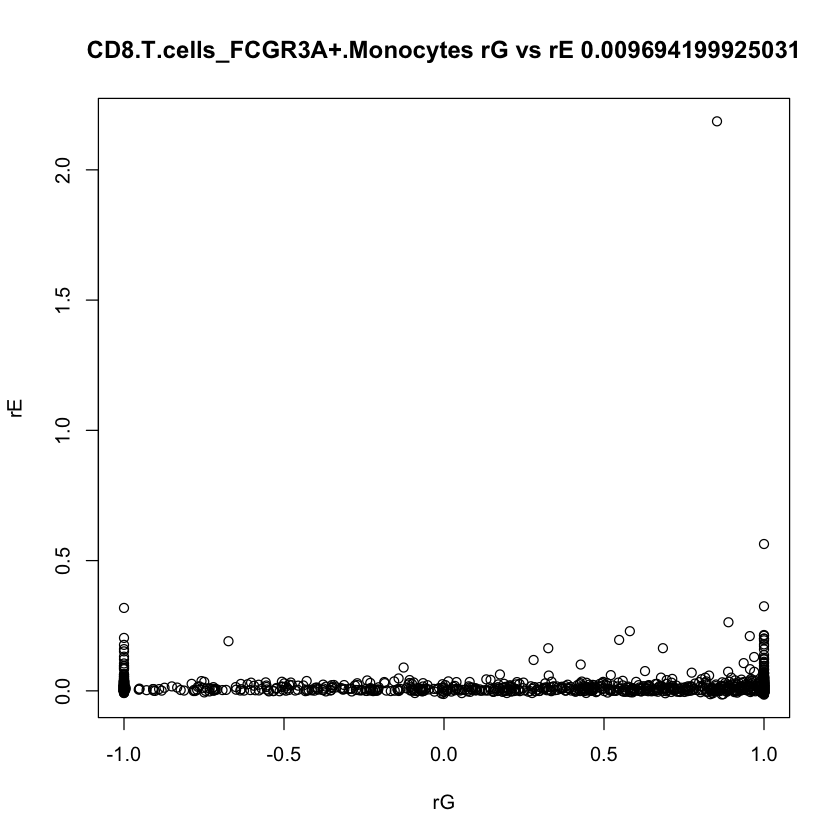

                      cell_pair    gene      sg1      se1      sg2      se2
1 CD8.T.cells_FCGR3A+.Monocytes ABHD14A 0.002819 0.003659        0 0.001259
2 CD8.T.cells_FCGR3A+.Monocytes ABHD14B 0.008889 0.007733 0.004845 0.005047
3 CD8.T.cells_FCGR3A+.Monocytes   ABHD5 0.013487 0.009325 0.001419  0.00467
4 CD8.T.cells_FCGR3A+.Monocytes    ACPP 0.000141  0.00015 0.009311 0.006945
5 CD8.T.cells_FCGR3A+.Monocytes   ANO10 0.002095  0.00366 0.003586 0.003864
6 CD8.T.cells_FCGR3A+.Monocytes ARHGEF3 0.016194 0.010854 0.014126 0.009408
        rg        re       rg_se
1        1  0.003585 1282.875601
2        1    0.0263    0.224635
3        1  0.009038    1.427638
4        1 -0.000584    0.509543
5 0.997076  0.002828    0.885548
6        1  0.021729    0.165104
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.287973676326929"
[1] "median"   "0.839671"
[1] "var"               "0.716605236563042"
[1] "in 0,1 range" "2038"         "of"           "3071"        
[1] "rE info"

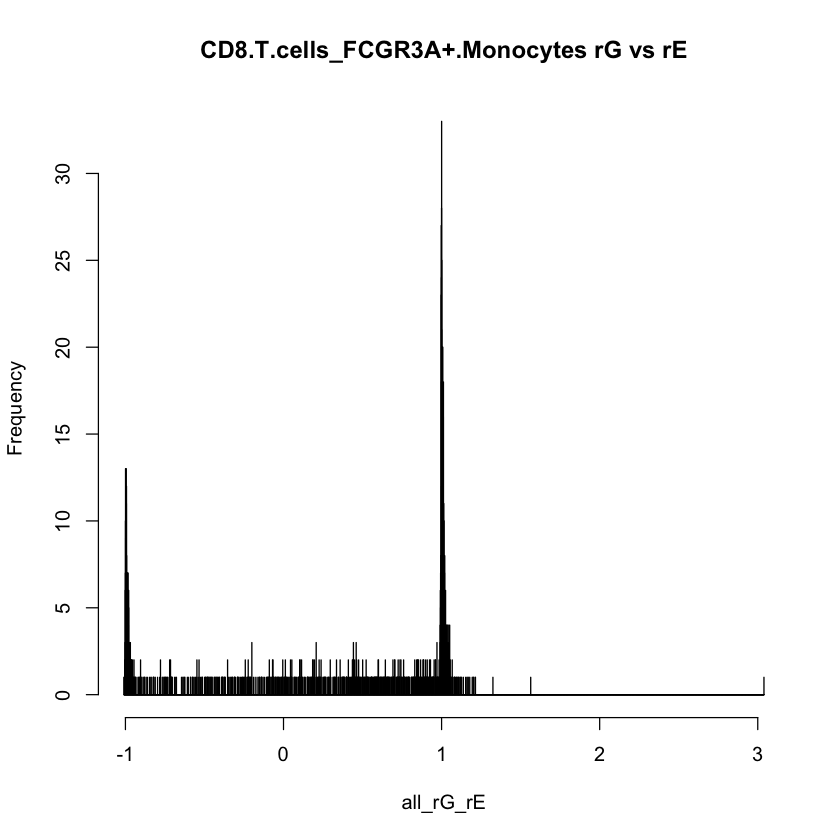

NULL


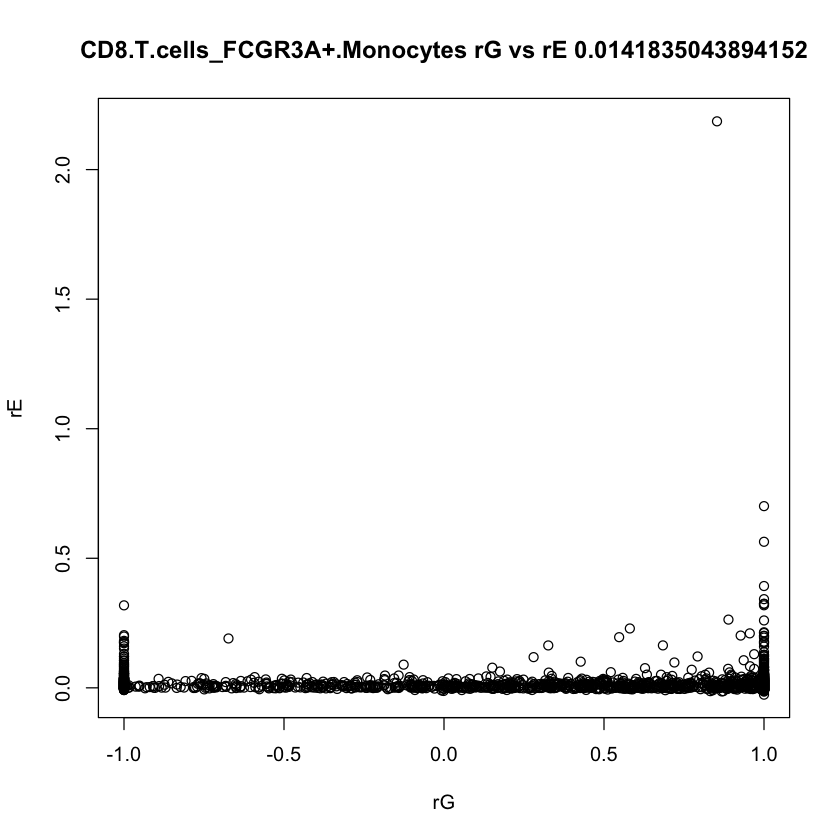

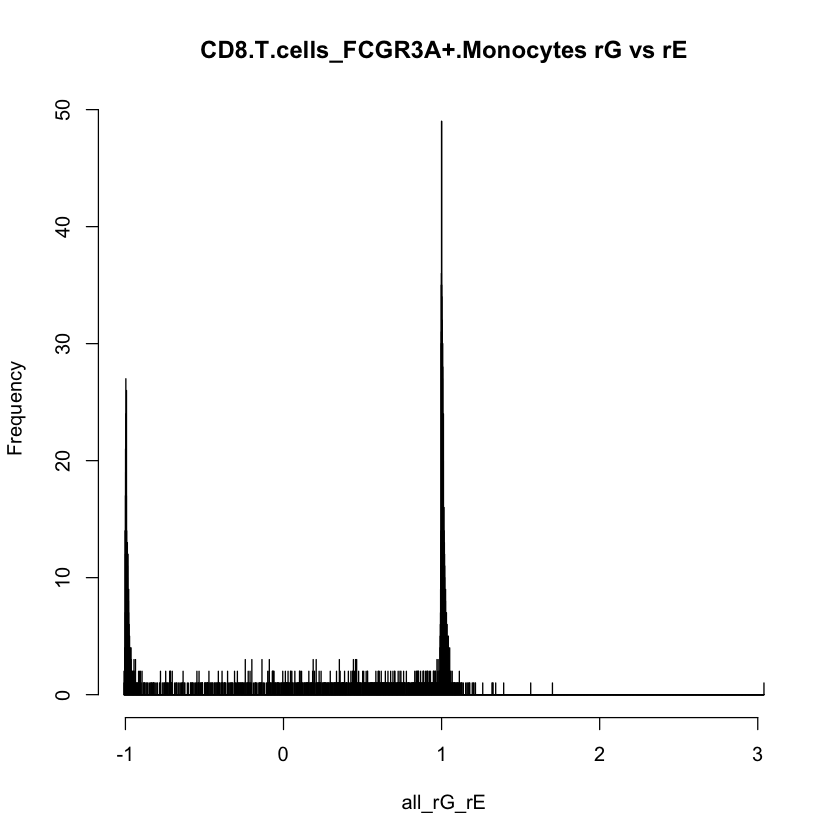

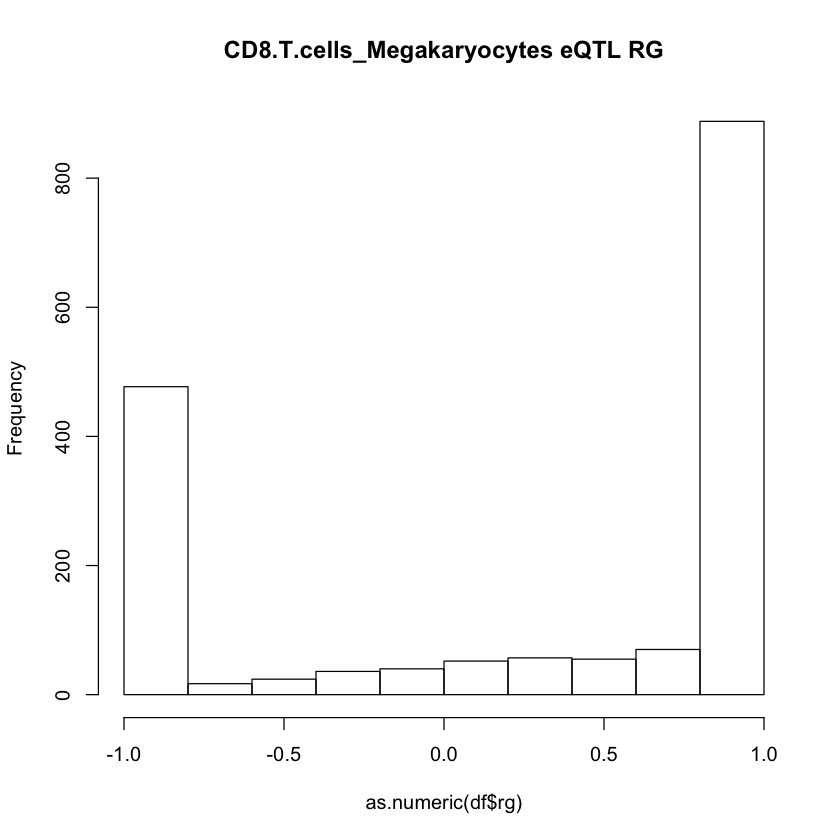

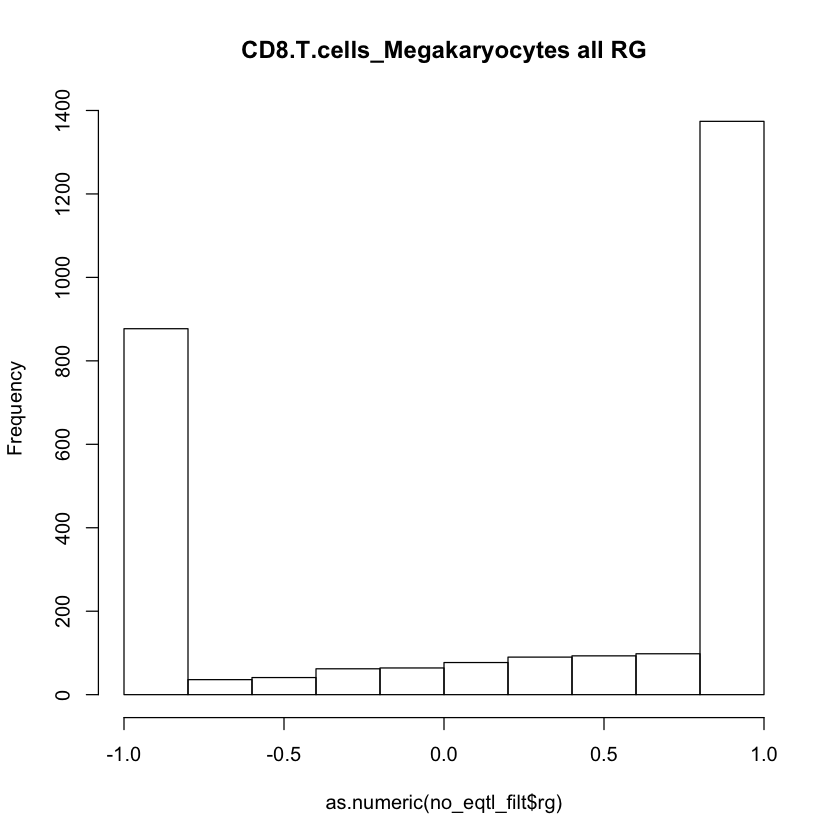

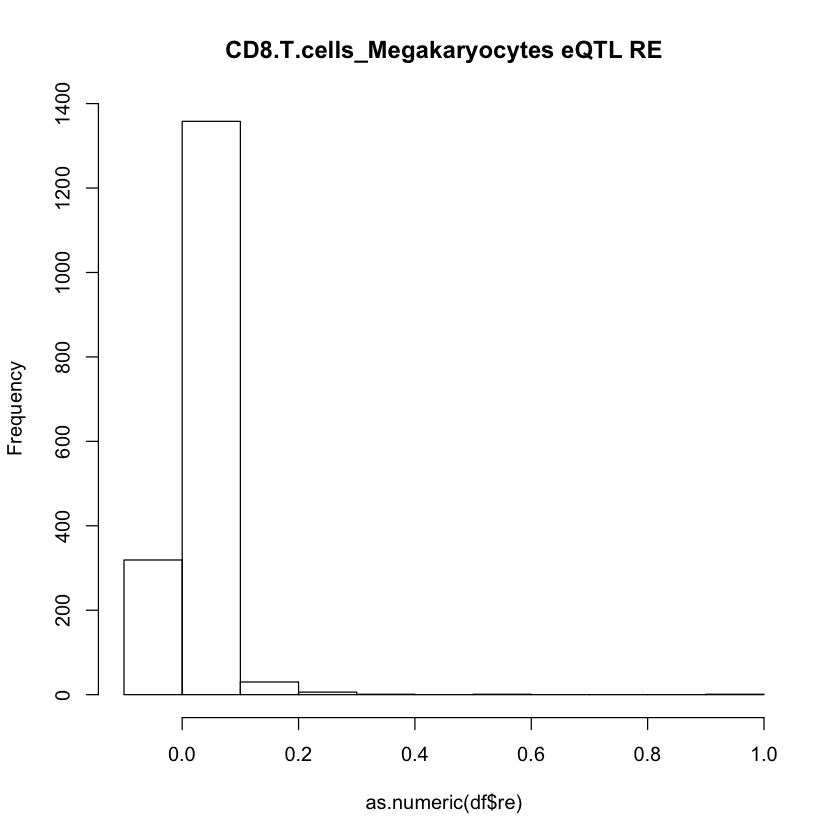

   gene                  cell_pair      sg1      se1      sg2      se2
1 AASDH CD8.T.cells_Megakaryocytes        0 0.003949        0 0.007626
2  AATF CD8.T.cells_Megakaryocytes        0 0.002289        0 0.006444
3 ABCA7 CD8.T.cells_Megakaryocytes 0.002859  0.00748 0.023353 0.017094
4 ABCB4 CD8.T.cells_Megakaryocytes 0.000177 0.000257 0.006277 0.004943
5 ABCB8 CD8.T.cells_Megakaryocytes 0.002765 0.004267 0.006325 0.009404
6 ABCC4 CD8.T.cells_Megakaryocytes 0.004028 0.004104 0.017785 0.014867
         rg        re         rg_se Dendritic.cells CD8.T.cells
1        -1   0.01798 111499.112757               0           0
2         1  0.001512 117666.268594               1           0
3         1 -0.017025      1.444303               0           0
4         1  0.000174      0.571008               0           0
5 -0.011592   0.00153      1.071522               0           0
6         1  -0.01082      0.631965               0           0
  FCGR3A..Monocytes Megakaryocytes CD4.T.cells NK.cells

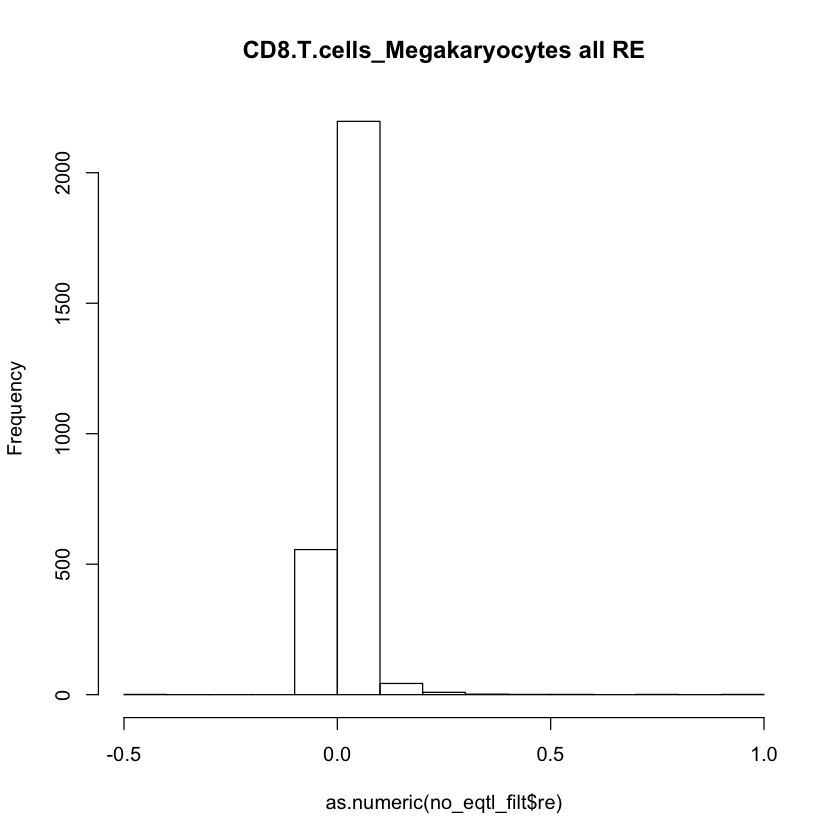

NULL


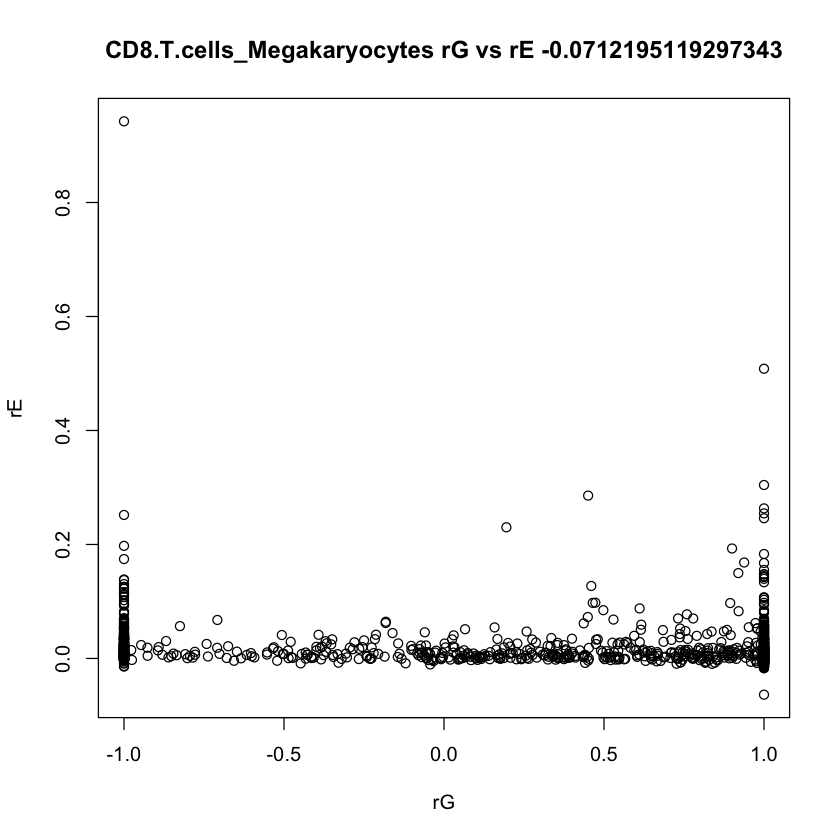

                   cell_pair    gene      sg1      se1      sg2      se2
1 CD8.T.cells_Megakaryocytes   AASDH        0 0.003949        0 0.007626
2 CD8.T.cells_Megakaryocytes   ACSL1  6.9e-05 0.002317  6.7e-05  0.01364
3 CD8.T.cells_Megakaryocytes     AGA 0.007159 0.006037 0.015861 0.010357
4 CD8.T.cells_Megakaryocytes  AGPAT9 0.001509  0.00159 0.004045 0.005823
5 CD8.T.cells_Megakaryocytes   ALPK1        0 0.000644        0 0.002772
6 CD8.T.cells_Megakaryocytes ANKRD50    1e-05 0.000281    1e-05 0.002478
        rg        re         rg_se
1       -1   0.01798 111499.112757
2        1 -0.008545    125.432428
3        1 -0.006387      0.390751
4 0.524904 -0.004619      0.896086
5        1 -0.002979 130453.691603
6        1  0.001499    134.187834
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.203831776071429"
[1] "median"   "0.742161"
[1] "var"               "0.790338197912598"
[1] "in 0,1 range" "1726"         "of"           "2800"        
[1] "rE info"
[1] "m

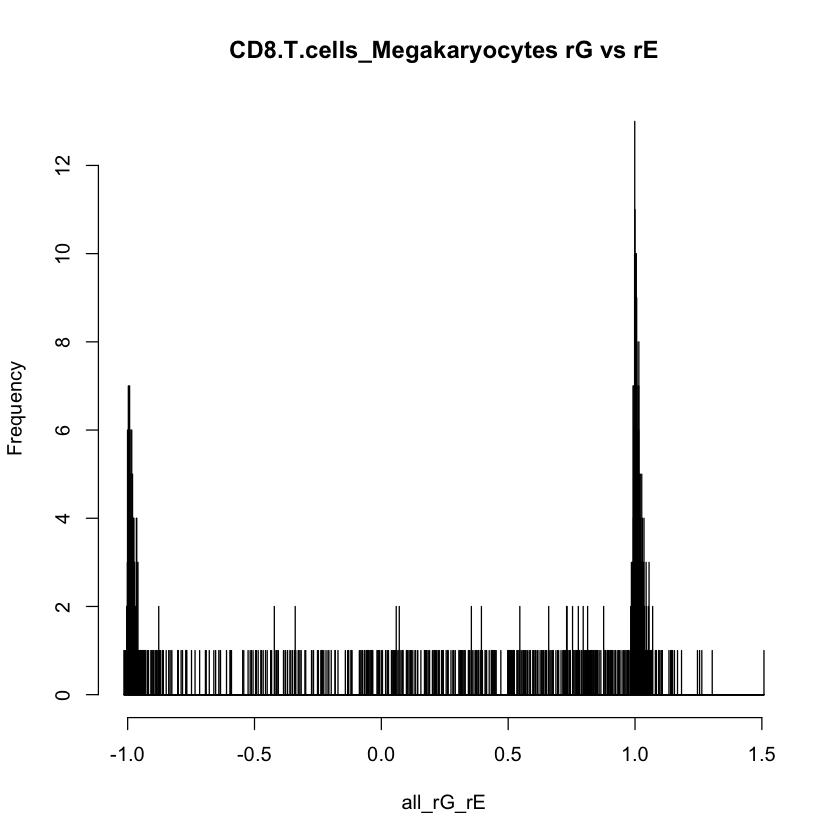

NULL


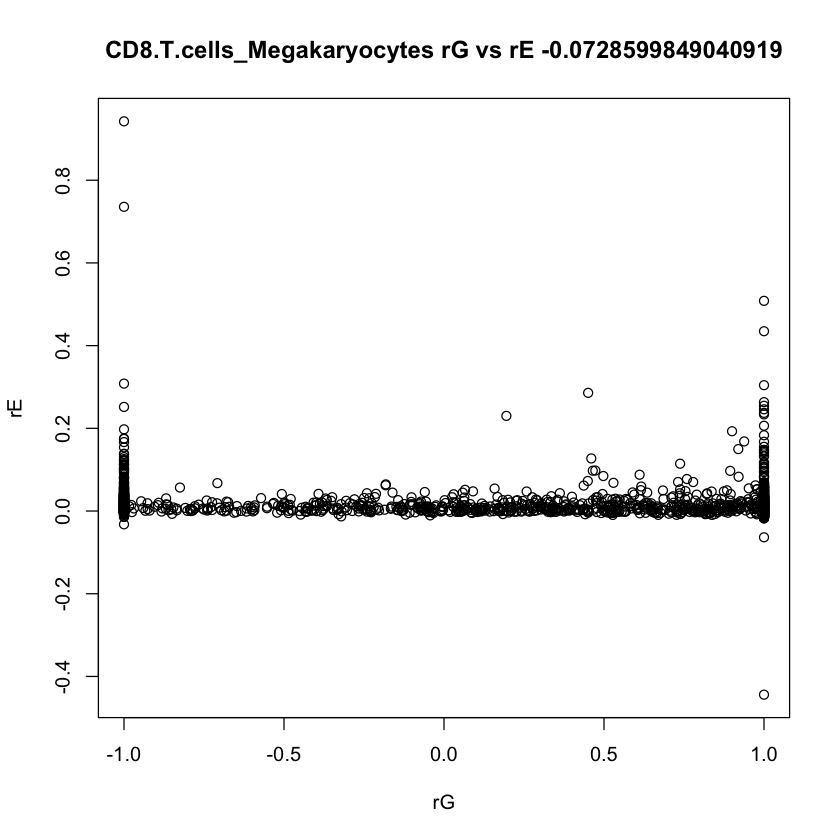

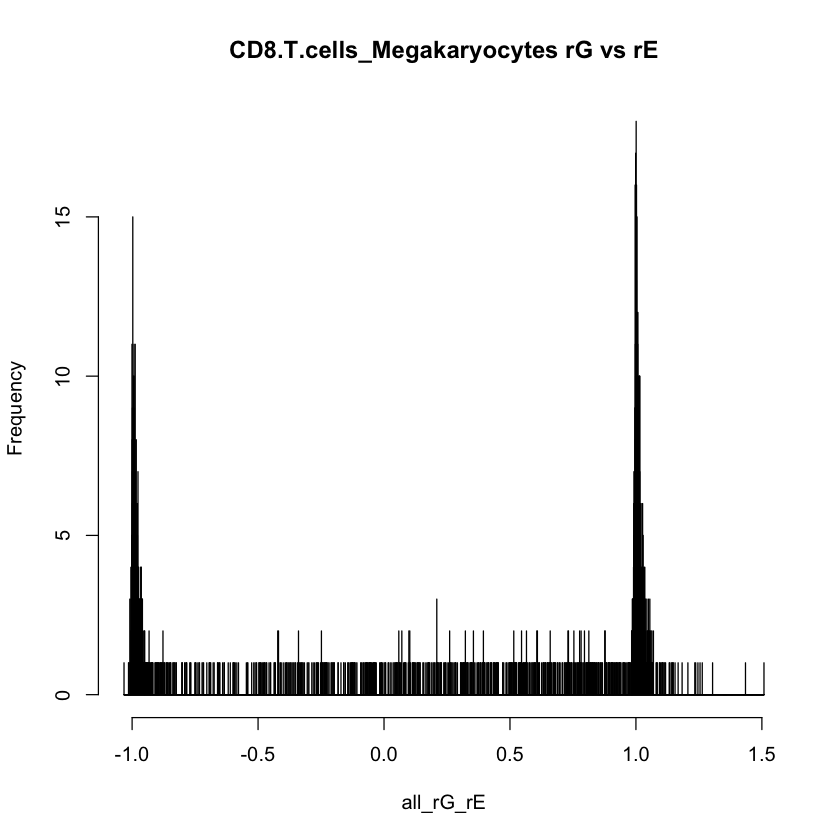

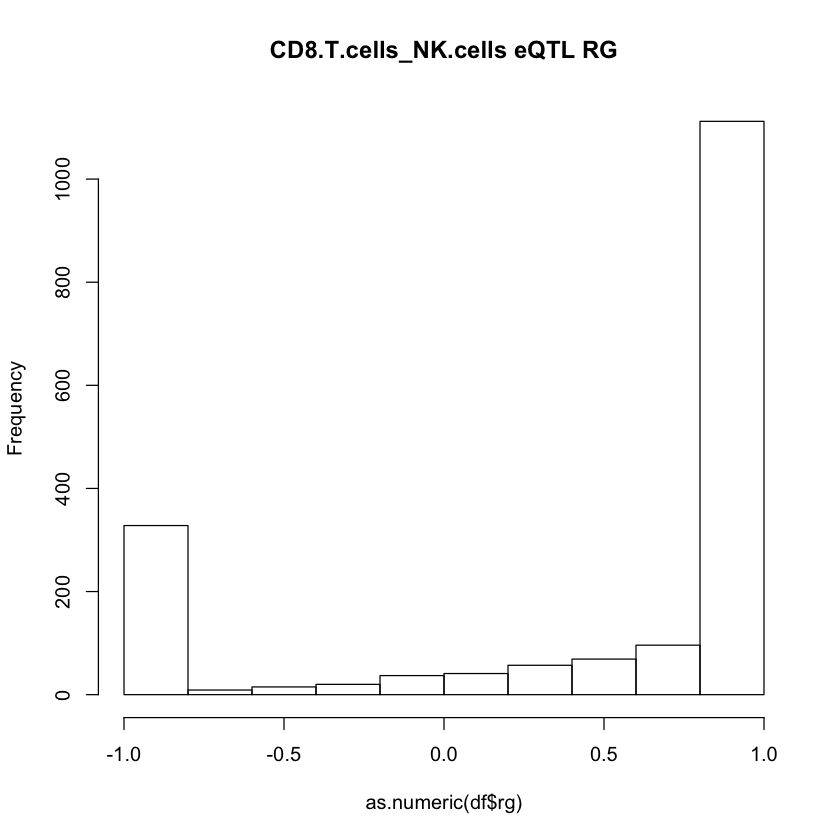

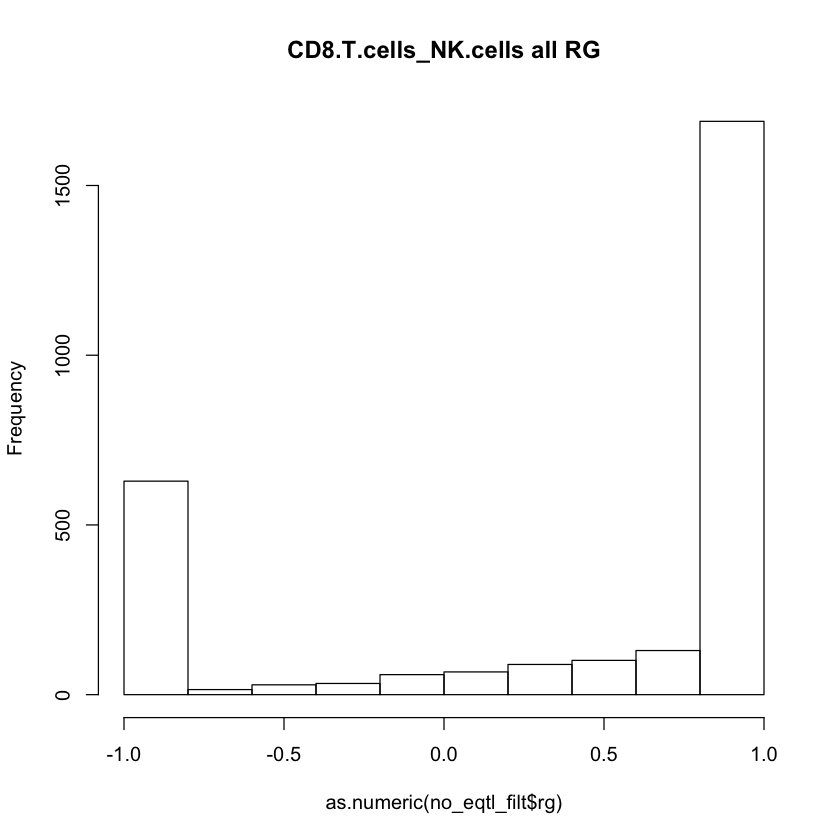

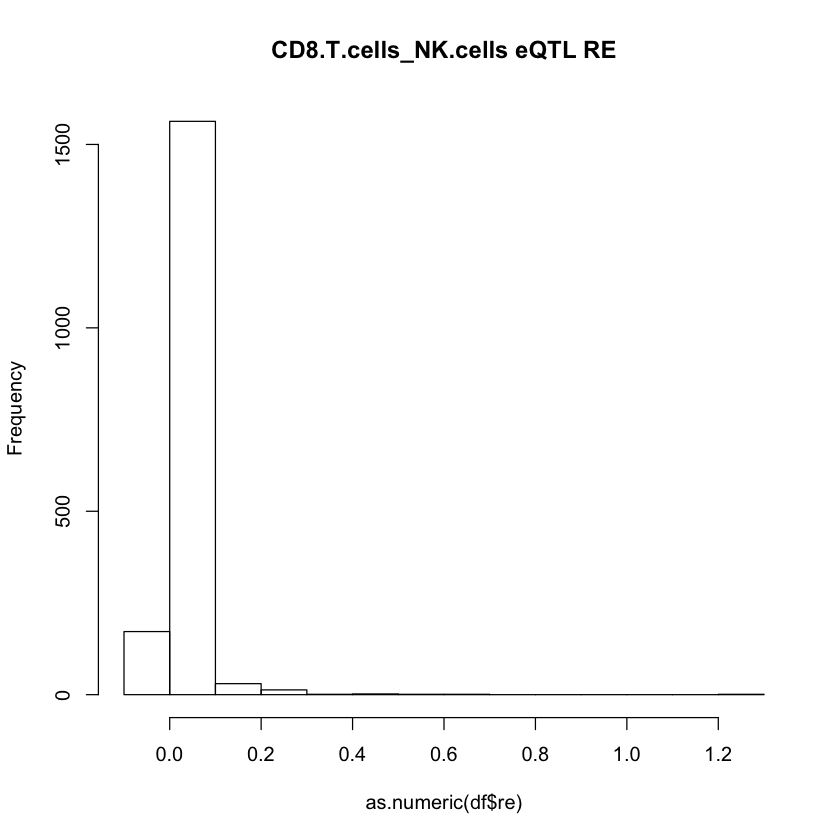

     gene            cell_pair      sg1      se1      sg2      se2       rg
1 A2M-AS1 CD8.T.cells_NK.cells 0.039096 0.022067 0.035634 0.024131        1
2   AAGAB CD8.T.cells_NK.cells 0.001237 0.003901 0.002242 0.003262        1
3   ABCA1 CD8.T.cells_NK.cells 0.000554 0.000849 0.000315 0.000459       -1
4   ABCC4 CD8.T.cells_NK.cells  1.6e-05 0.002564  1.7e-05 0.002107        1
5  ABHD12 CD8.T.cells_NK.cells 0.000109 0.001482  0.00014 0.001482       -1
6 ABHD17A CD8.T.cells_NK.cells 0.019319 0.009481  0.02836 0.012462 0.863353
         re      rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.070934   0.113675               0           1                 0
2  0.000663   1.759497               0           0                 0
3  0.002125   1.248365               0           0                 0
4 -0.000105 142.568776               0           0                 0
5  0.002692  11.599652               0           0                 0
6  0.012167   0.157128               0           0    

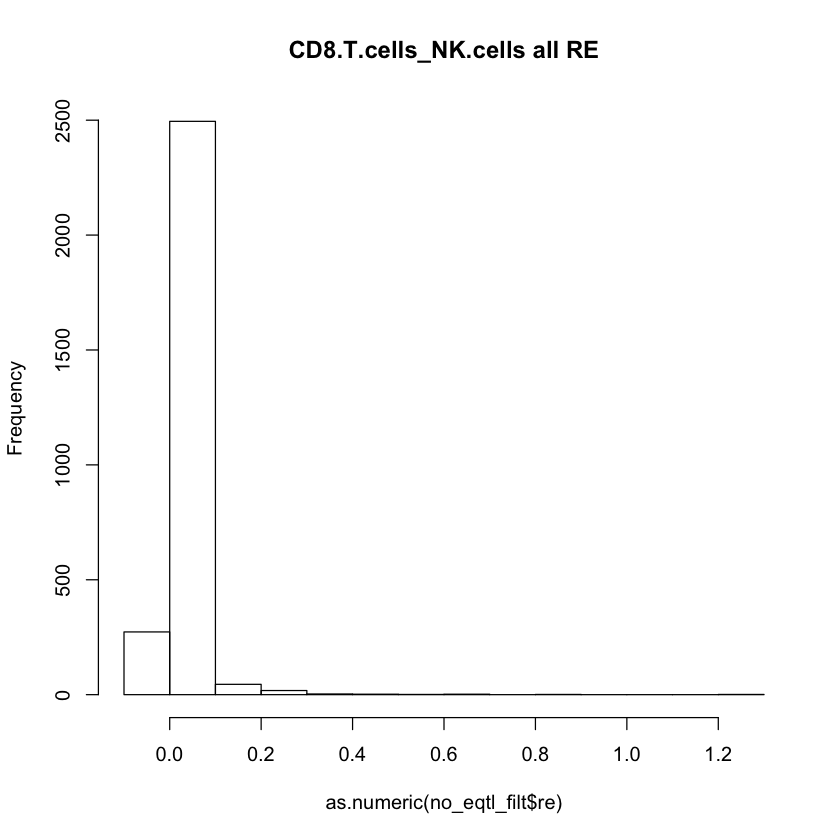

NULL


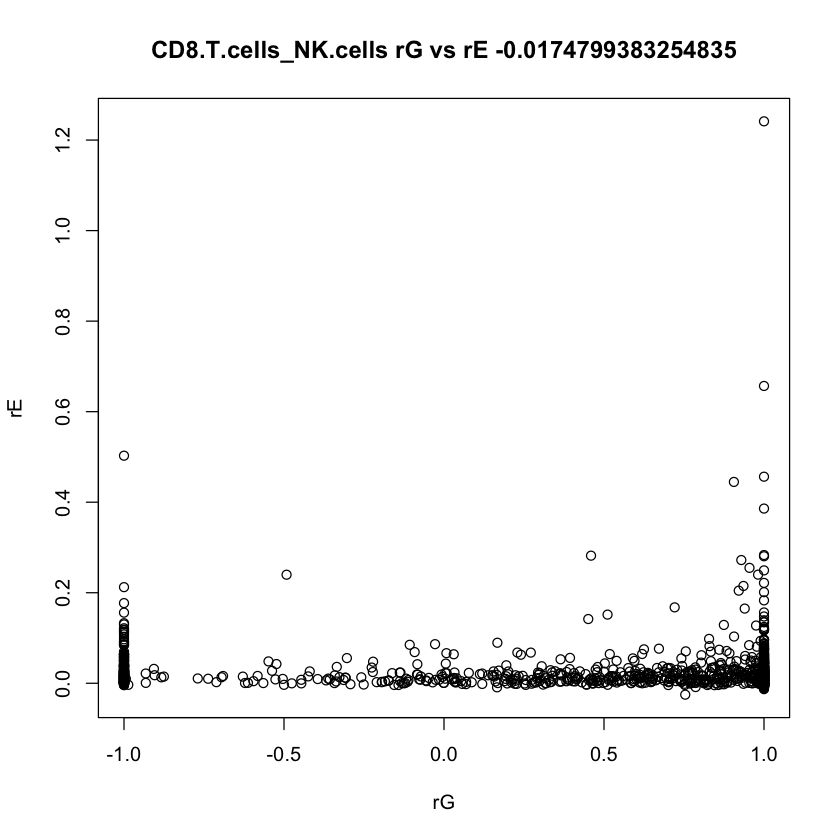

             cell_pair    gene      sg1      se1      sg2      se2       rg
1 CD8.T.cells_NK.cells   ACOX3 0.002864 0.004148 0.000849 0.002773       -1
2 CD8.T.cells_NK.cells   AFAP1 0.007336 0.005664 0.003165 0.002806 0.197418
3 CD8.T.cells_NK.cells  AGPAT9 0.001153 0.001408 0.000537 0.000529       -1
4 CD8.T.cells_NK.cells   AIMP1 0.000832 0.002342  0.00145 0.002711        1
5 CD8.T.cells_NK.cells   ALPK1    4e-06 0.000646    4e-06 0.000677       -1
6 CD8.T.cells_NK.cells ANKRD37 0.000181 0.003781 0.000148 0.004048        1
         re      rg_se
1  0.003568   1.989386
2 -0.000433   0.580716
3    -2e-05   0.628335
4   0.01481   1.174952
5  0.000911 168.386059
6  0.008834  19.371253
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.420985732529266"
[1] "median" "1"     
[1] "var"               "0.666786755857287"
[1] "in 0,1 range" "2069"         "of"           "2819"        
[1] "rE info"
[1] "min"       "-0.025191"
[1] "max"      "1.241394"
[1] "mean"         

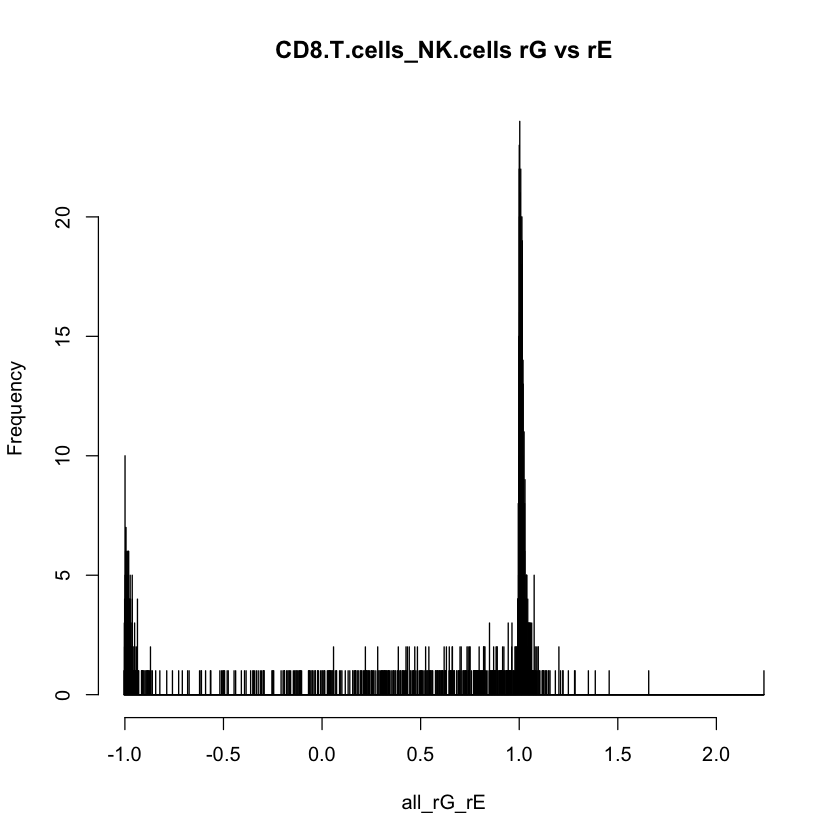

NULL


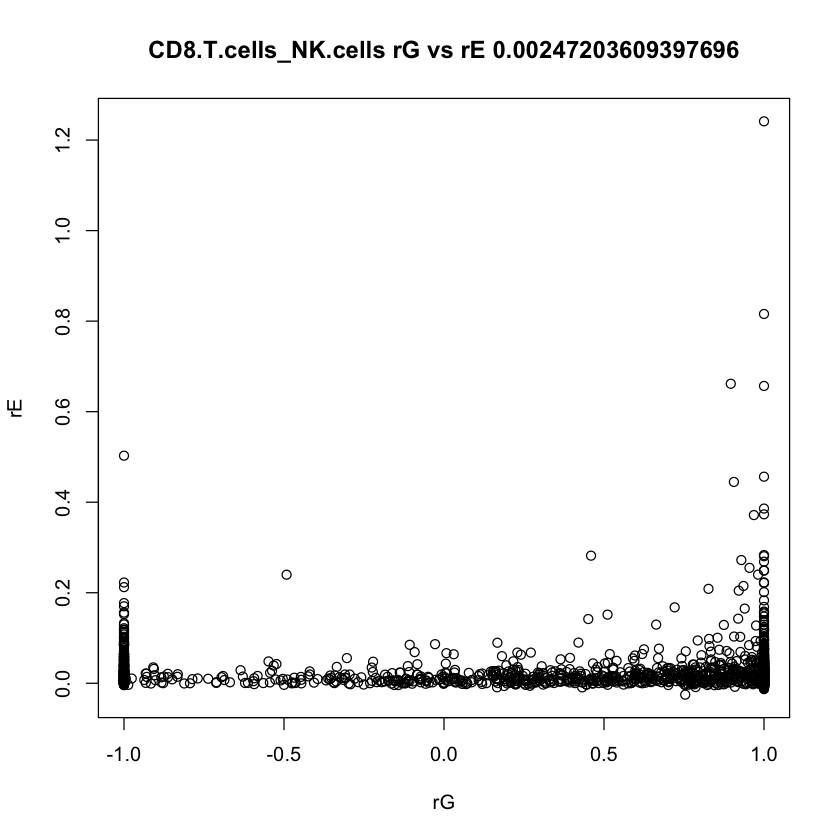

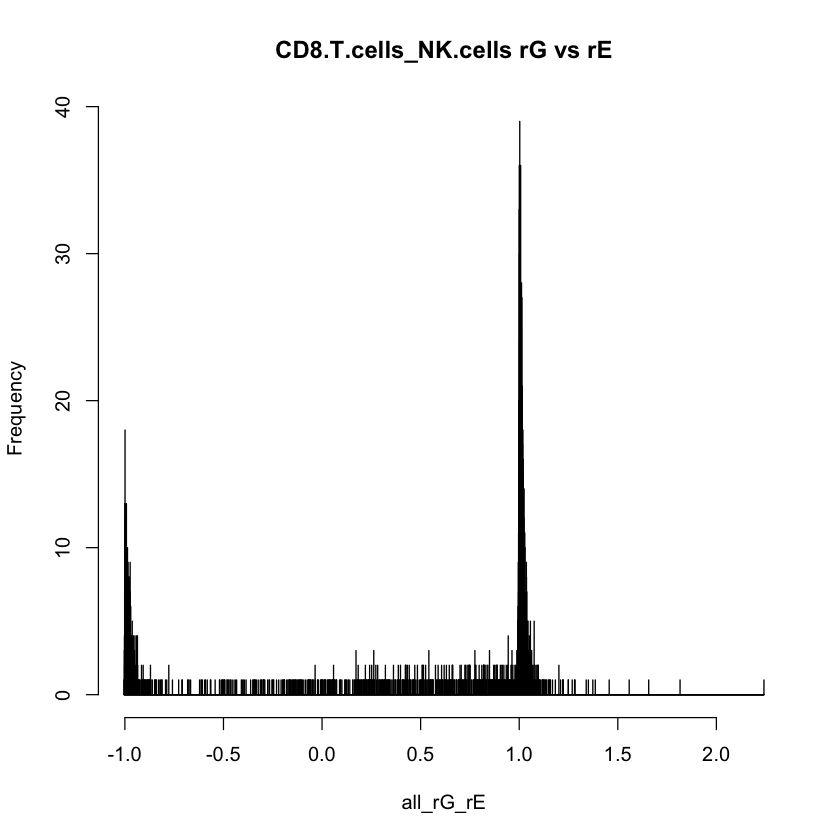

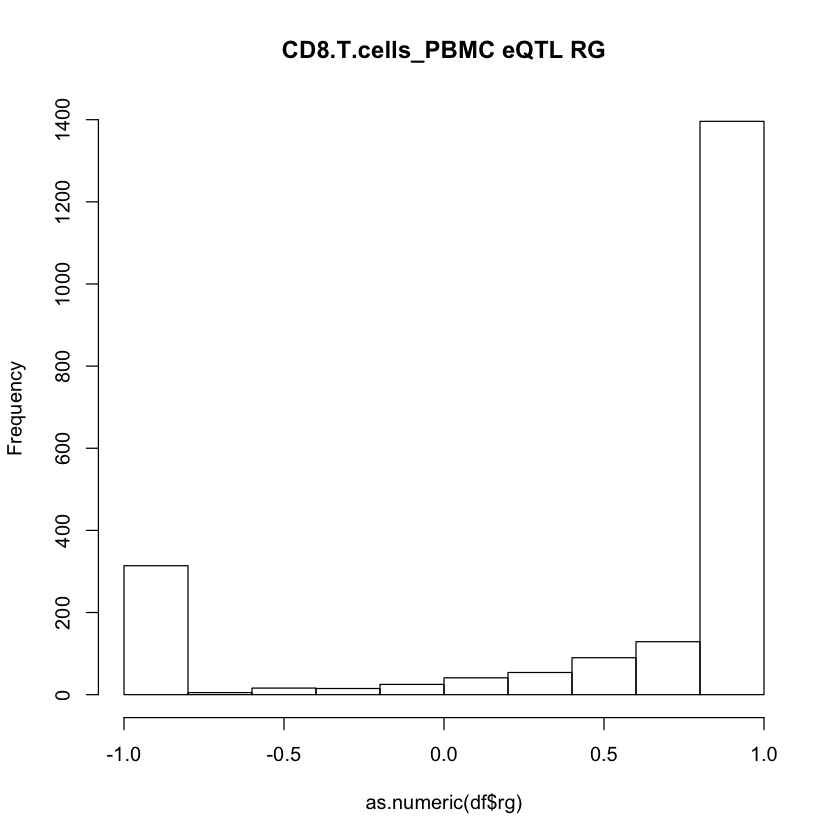

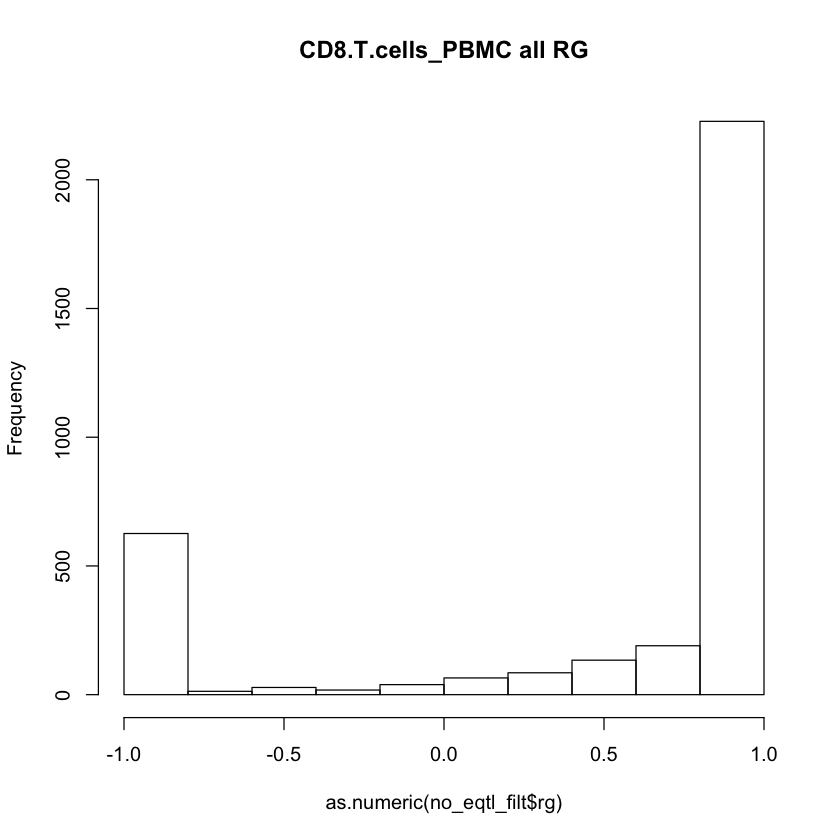

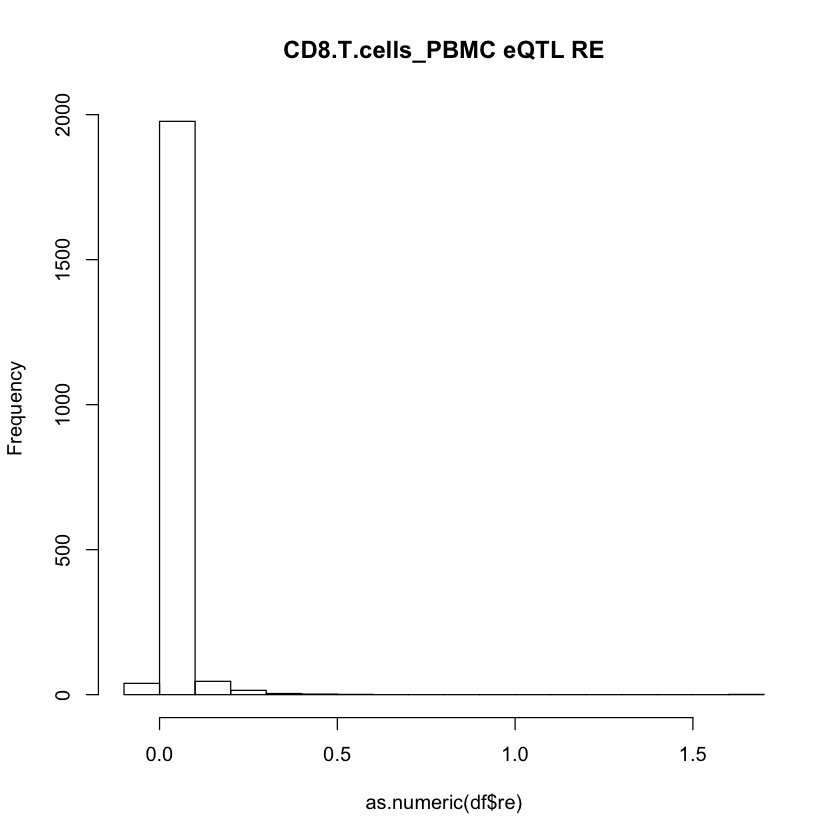

     gene        cell_pair      sg1      se1      sg2      se2       rg
1 A2M-AS1 CD8.T.cells_PBMC 0.040052 0.022545 0.027035 0.019808        1
2   AAGAB CD8.T.cells_PBMC 0.001174  0.00375 0.004812 0.002762        1
3    AATF CD8.T.cells_PBMC 0.000113 0.002346 0.000161 0.000568       -1
4   ABCA7 CD8.T.cells_PBMC 0.000265 0.006343 0.006554 0.004749        1
5   ABCB4 CD8.T.cells_PBMC 0.000221 0.000293 0.004509 0.013161        1
6   ABCB8 CD8.T.cells_PBMC 0.002699 0.004239 0.002851 0.003058 0.365183
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.088613  0.093273               0           1                 0
2  0.01078  1.187493               0           0                 0
3 0.011836 17.161742               1           0                 0
4 0.014823 10.920665               0           0                 1
5 0.005195  1.286156               0           0                 0
6 0.014804  0.781234               0           0                 1
  Megakaryocytes CD4.T.cell

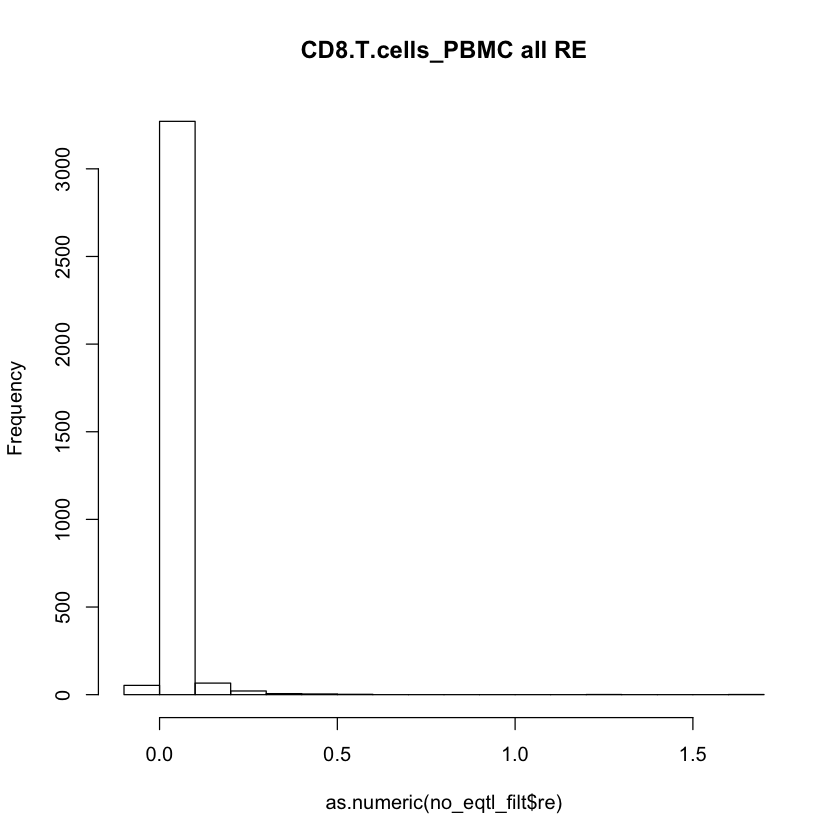

NULL


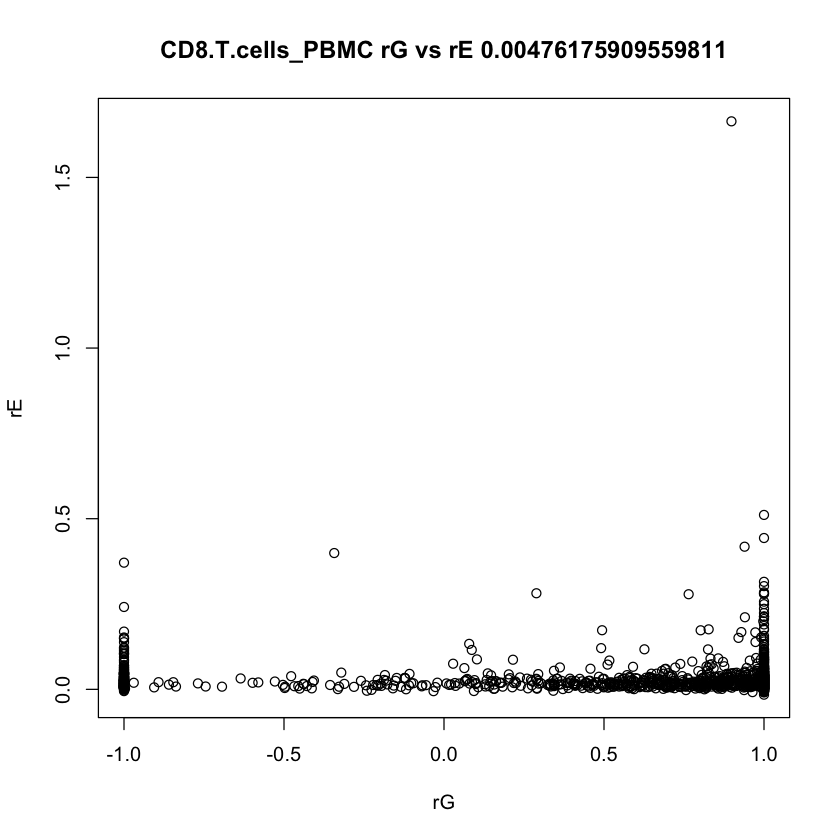

         cell_pair   gene      sg1      se1      sg2      se2        rg
1 CD8.T.cells_PBMC   ADH5 0.004447  0.00469 0.000744 0.001429  0.768031
2 CD8.T.cells_PBMC    AGA 0.005299 0.005776 0.010296 0.004994  0.515429
3 CD8.T.cells_PBMC AGPAT9 0.001255 0.001505 0.002658 0.007361 -0.121477
4 CD8.T.cells_PBMC  AIMP1 0.000753 0.002251 0.001482 0.001292         1
5 CD8.T.cells_PBMC ANTXR2 0.002329 0.004816 0.000502 0.001839         1
6 CD8.T.cells_PBMC ARFIP1 0.007068 0.005894 0.011762 0.005624  0.927032
        re    rg_se
1 0.019296 0.558492
2 0.020004 0.385889
3  0.00213 1.306551
4 0.015205  0.79389
5 0.021483  1.33394
6 0.012267 0.241666
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.518831792768959"
[1] "median" "1"     
[1] "var"               "0.591299373870294"
[1] "in 0,1 range" "2684"         "of"           "3402"        
[1] "rE info"
[1] "min"       "-0.015597"
[1] "max"      "1.664329"
[1] "mean"               "0.0276469329805996"
[1] "median"    "0.018

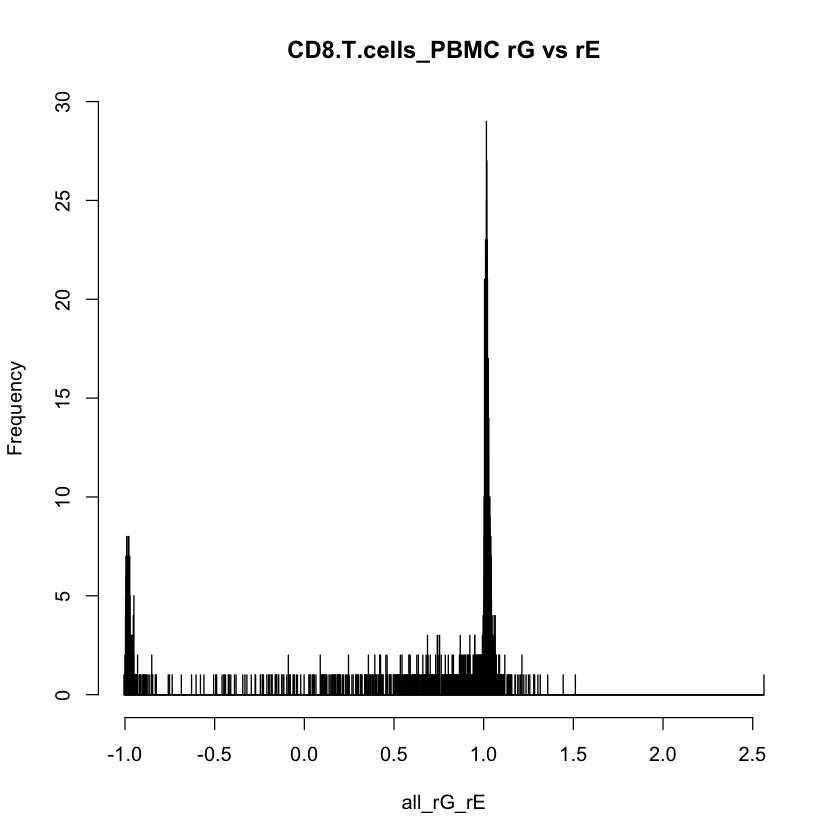

NULL


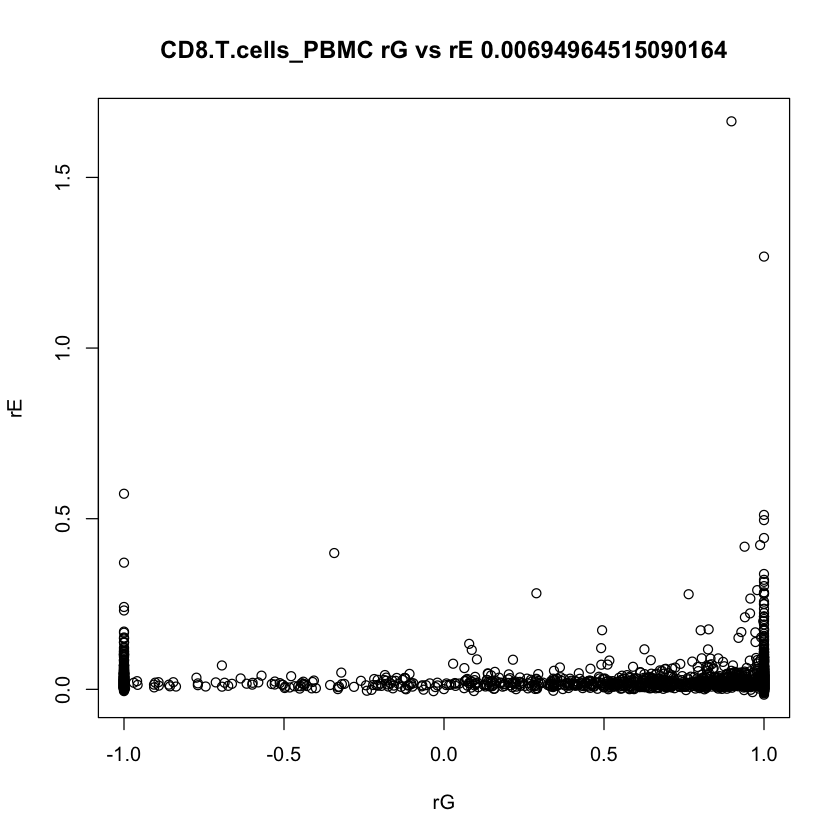

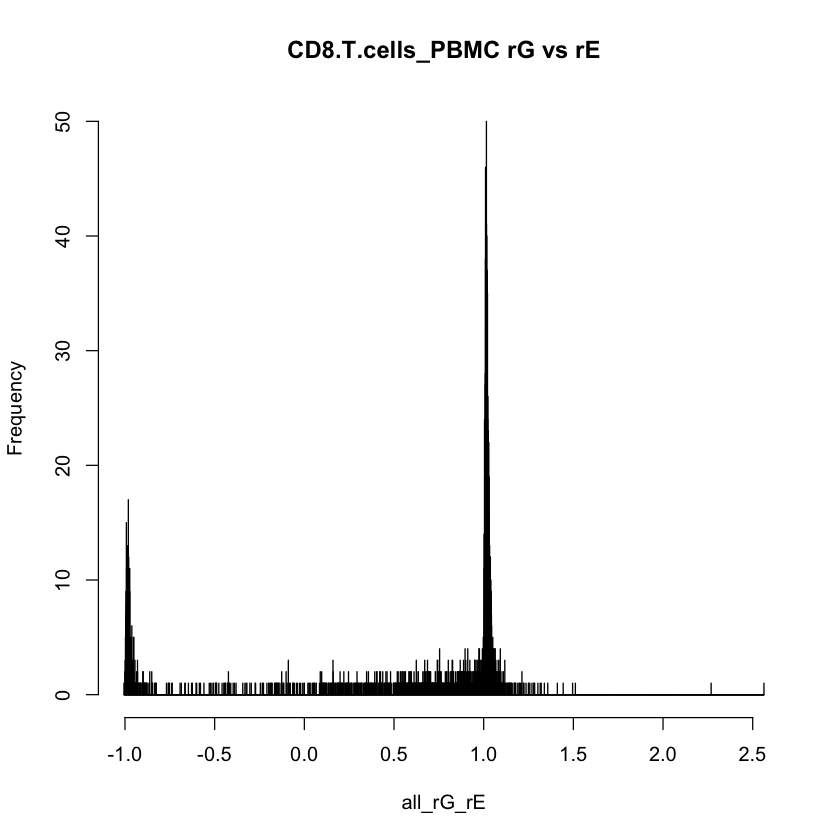

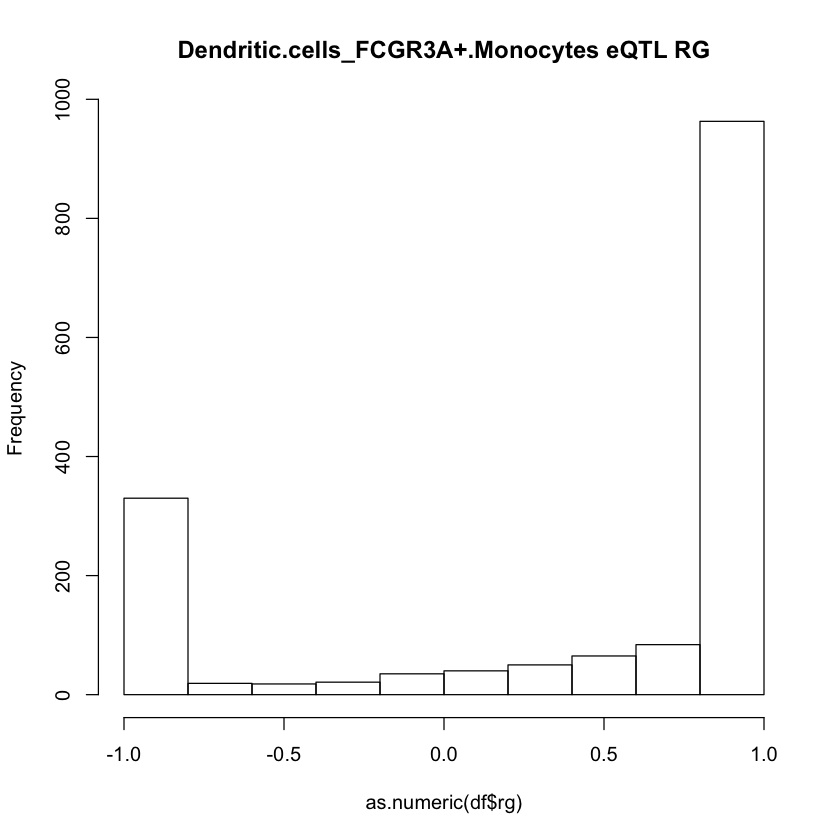

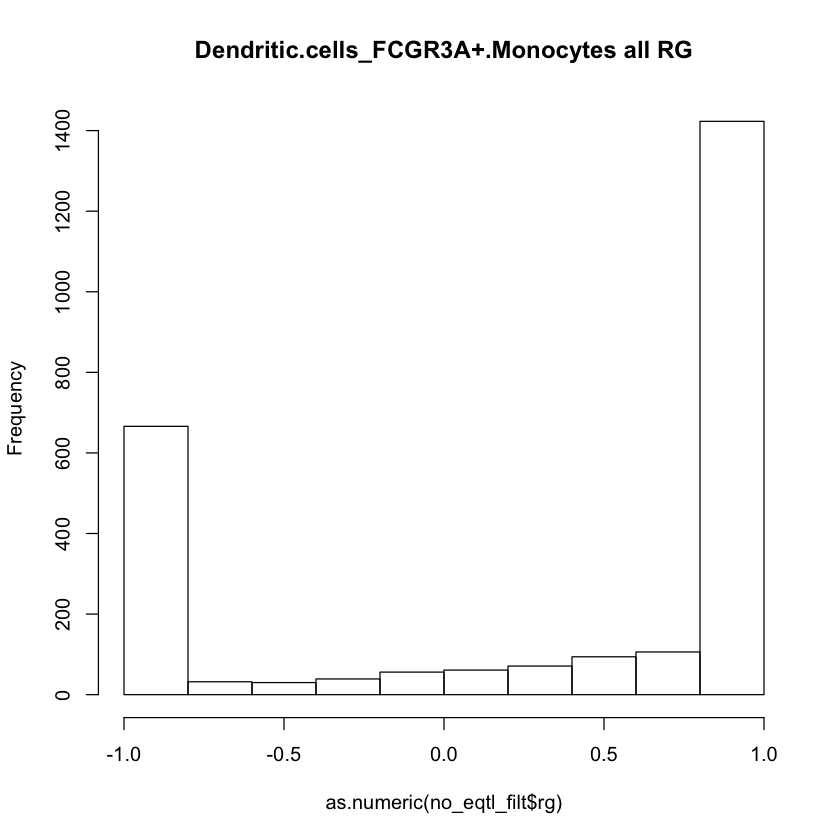

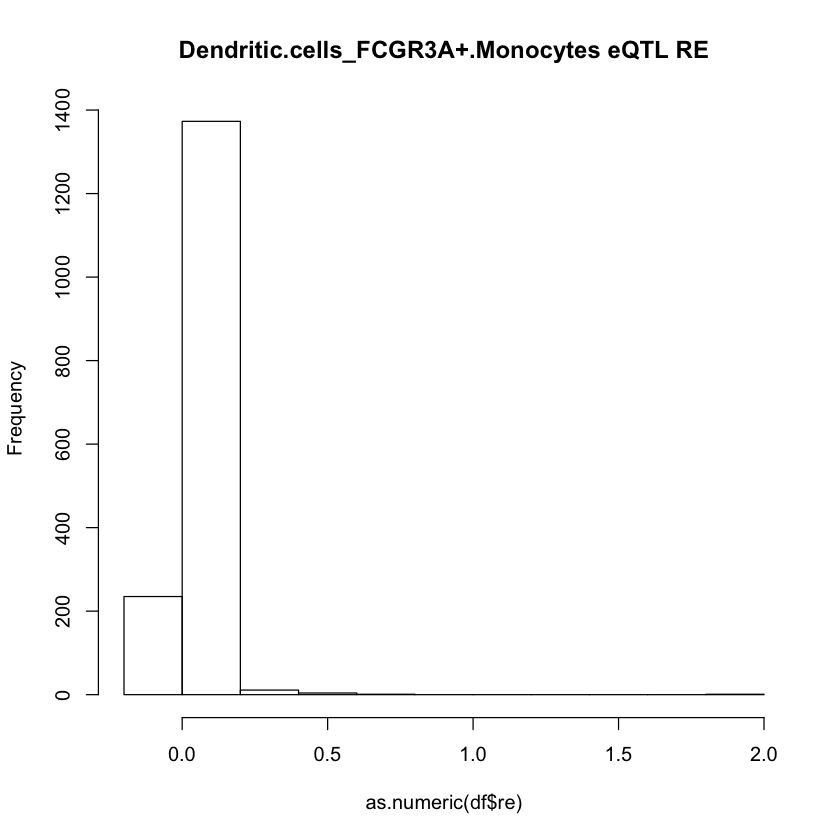

     gene                         cell_pair      sg1      se1      sg2      se2
1    A1BG Dendritic.cells_FCGR3A+.Monocytes 0.014748 0.012121 0.015719 0.012992
2 A2M-AS1 Dendritic.cells_FCGR3A+.Monocytes  0.00416 0.003119        0 0.001229
3    ABAT Dendritic.cells_FCGR3A+.Monocytes        0 0.001529        0 0.003572
4   ABCA7 Dendritic.cells_FCGR3A+.Monocytes 0.002112 0.006065 0.007556 0.007962
5   ABCB8 Dendritic.cells_FCGR3A+.Monocytes 0.006723 0.006589  9.7e-05 0.002439
6  ABHD11 Dendritic.cells_FCGR3A+.Monocytes 0.003741 0.004632 0.007148 0.006064
        rg        re         rg_se Dendritic.cells CD8.T.cells
1 0.750501  0.038792      0.360626               0           1
2        1  0.001531   1431.047472               0           1
3        1   0.00341 116362.430247               0           0
4        1 -0.002648      1.552697               0           0
5       -1  0.000335     12.606117               0           0
6 -0.17519  0.004279      0.731012               0           0

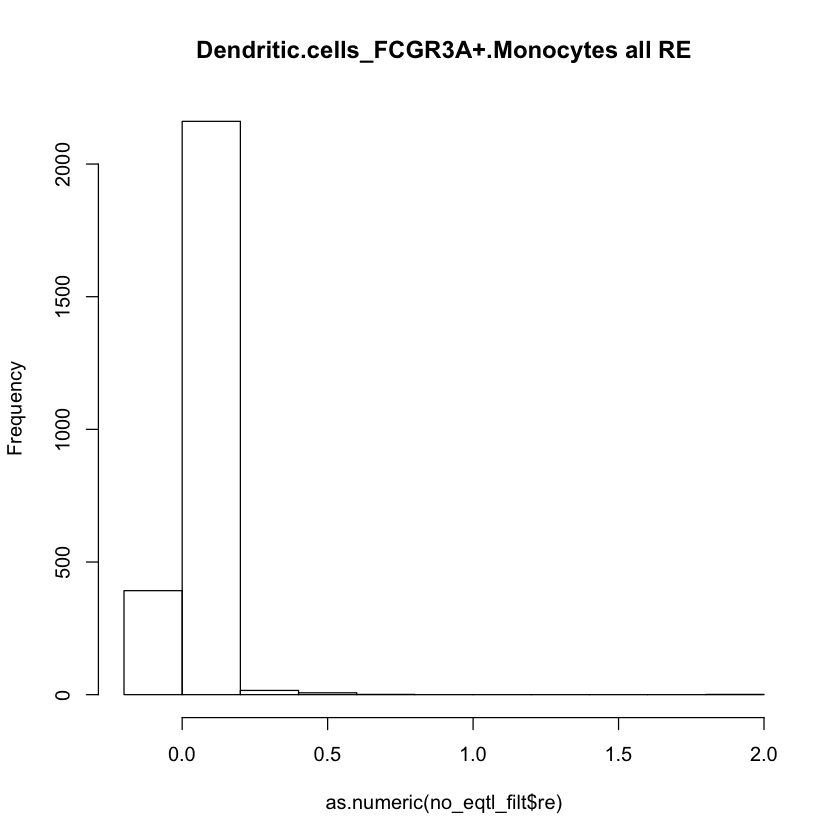

NULL


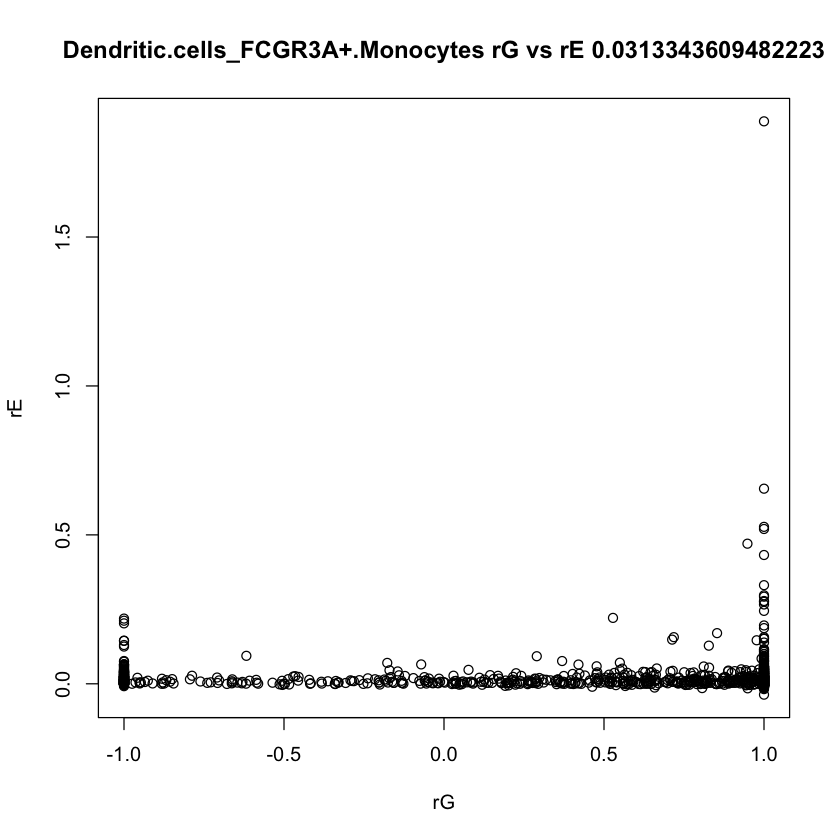

                          cell_pair  gene      sg1      se1      sg2      se2
1 Dendritic.cells_FCGR3A+.Monocytes ABCE1 0.000181 0.003215 0.000155 0.002239
2 Dendritic.cells_FCGR3A+.Monocytes ACSL1    4e-04 0.004059 0.000354 0.010172
3 Dendritic.cells_FCGR3A+.Monocytes  AFF1 0.000156 0.003617 0.000598 0.002702
4 Dendritic.cells_FCGR3A+.Monocytes   AGA 0.018937 0.009594 0.006095  0.00604
5 Dendritic.cells_FCGR3A+.Monocytes AIMP1 0.004404 0.004143 0.008605 0.005139
6 Dendritic.cells_FCGR3A+.Monocytes ALPK1 0.000128 0.002525 0.002529 0.004039
  rg       re     rg_se
1 -1  0.00858 17.331541
2  1 0.021402 15.196064
3 -1  0.02801 15.929636
4  1 0.002908  0.352321
5  1 0.010436  0.228983
6 -1 0.004961 10.487061
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.325263110633307"
[1] "median"    "0.9832575"
[1] "var"              "0.73625566269992"
[1] "in 0,1 range" "1740"         "of"           "2558"        
[1] "rE info"
[1] "min"       "-0.036489"
[1] "max"    "1.8884

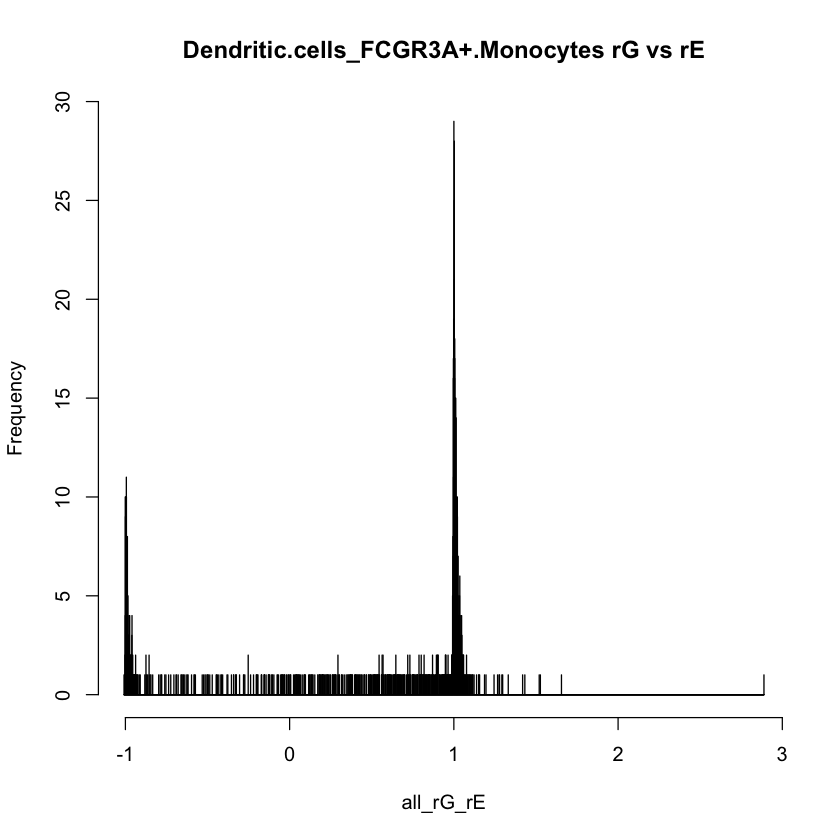

NULL


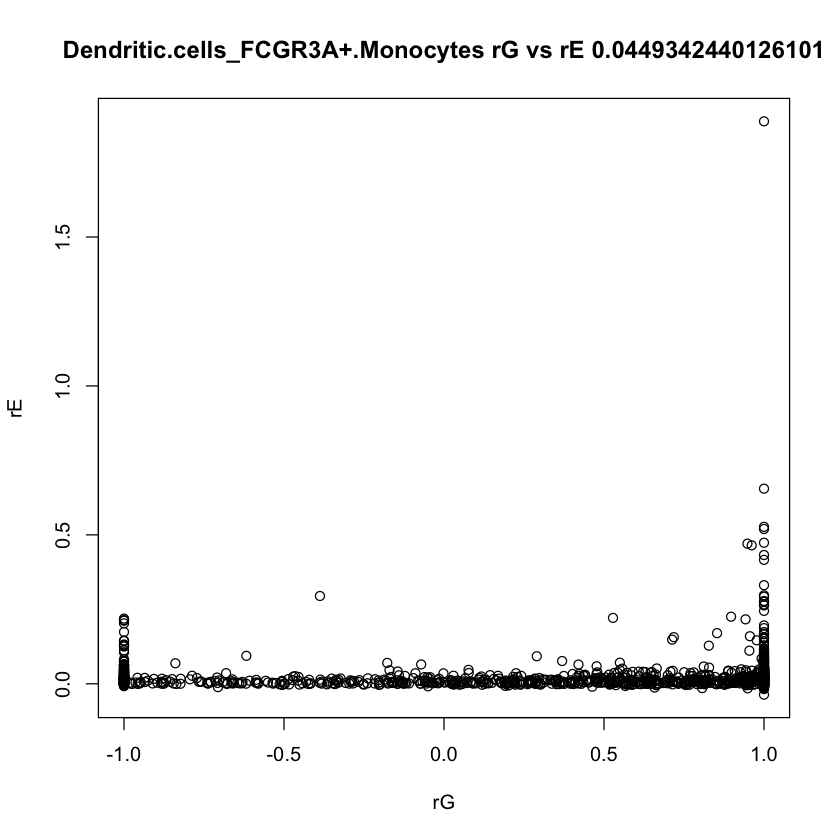

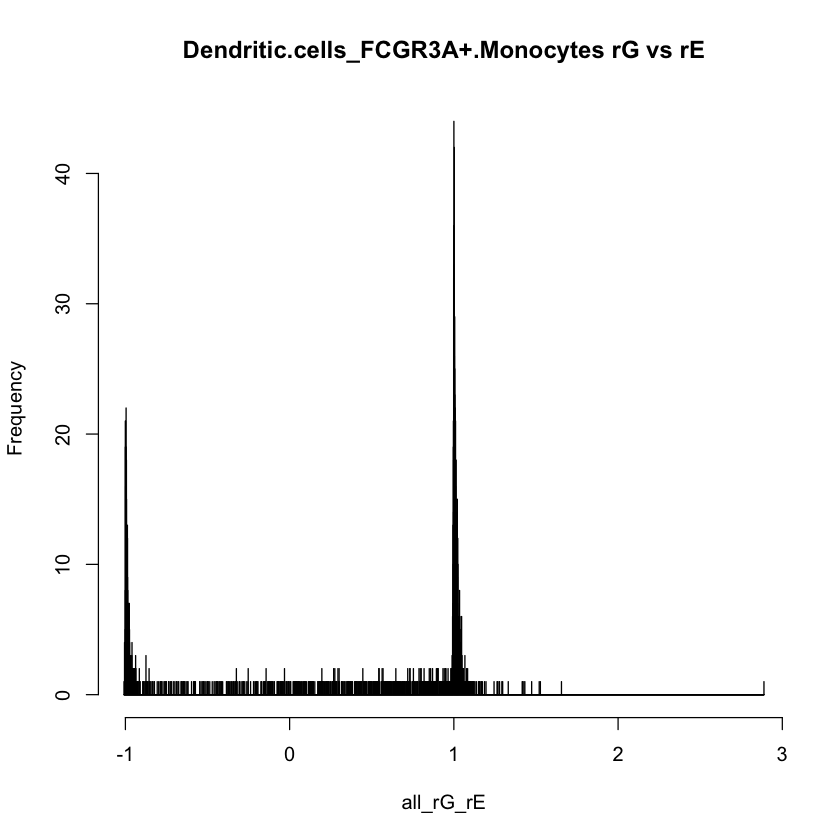

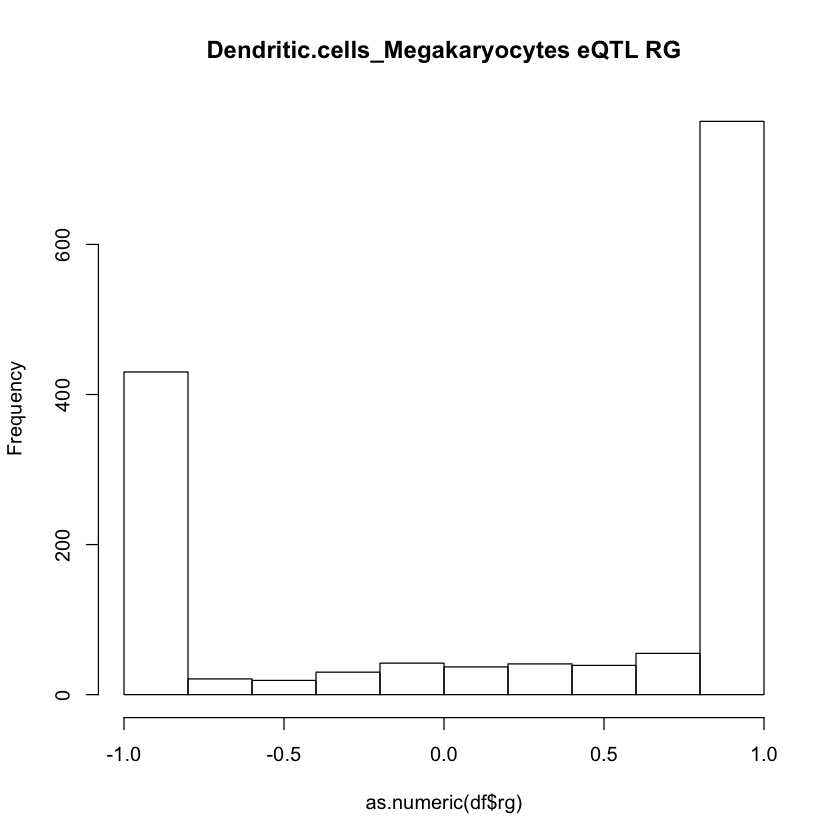

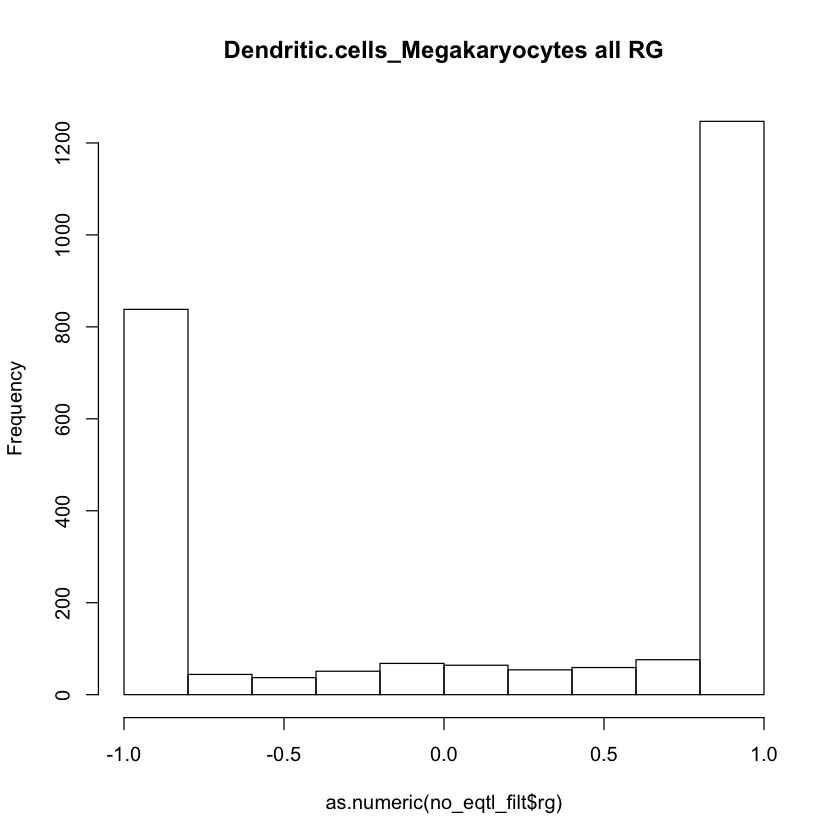

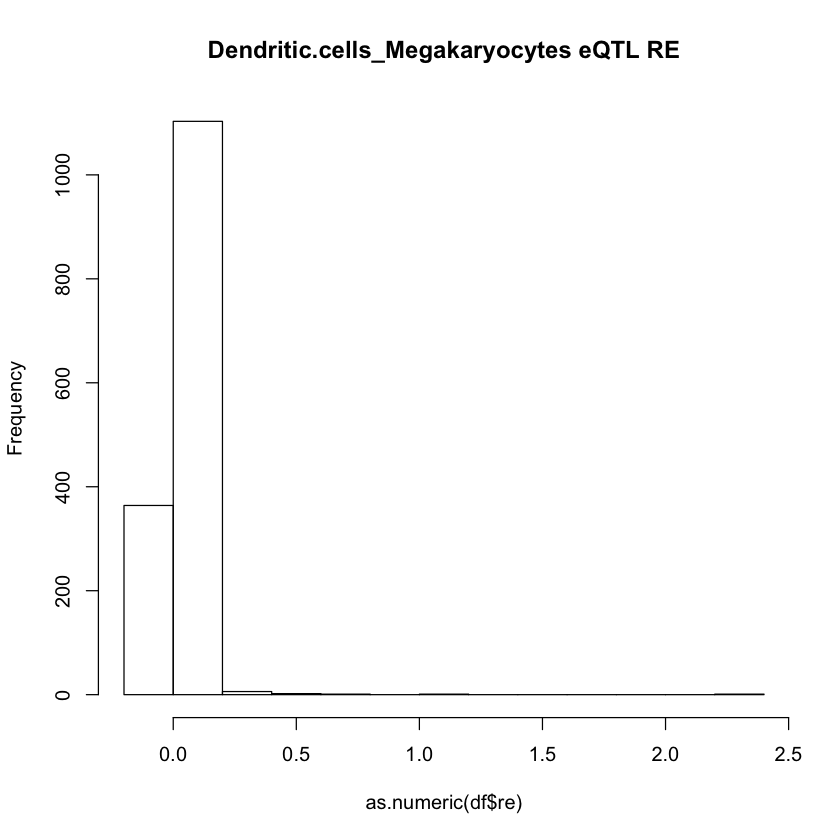

     gene                      cell_pair      sg1      se1      sg2      se2
1    A1BG Dendritic.cells_Megakaryocytes 0.014276  0.01189 0.002896 0.007113
2   ABCA1 Dendritic.cells_Megakaryocytes        0 0.000856        0 0.003064
3   ABCB8 Dendritic.cells_Megakaryocytes  0.00608 0.006216 0.004891  0.00857
4   ABCC4 Dendritic.cells_Megakaryocytes 0.000888 0.003218 0.017011 0.015463
5  ABHD11 Dendritic.cells_Megakaryocytes 0.005276 0.005126 0.006345 0.006344
6 ABHD17A Dendritic.cells_Megakaryocytes        0 0.005033        0 0.007802
         rg        re         rg_se Dendritic.cells CD8.T.cells
1         1  0.010215      1.086121               0           1
2         1 -0.003229 135478.875367               0           0
3         1 -0.008413      1.037442               0           0
4  0.848877 -0.004154      1.770877               0           0
5 -0.790129  0.007968      0.652303               0           0
6        -1  0.011846 102955.261336               0           0
  FCGR3A..Mon

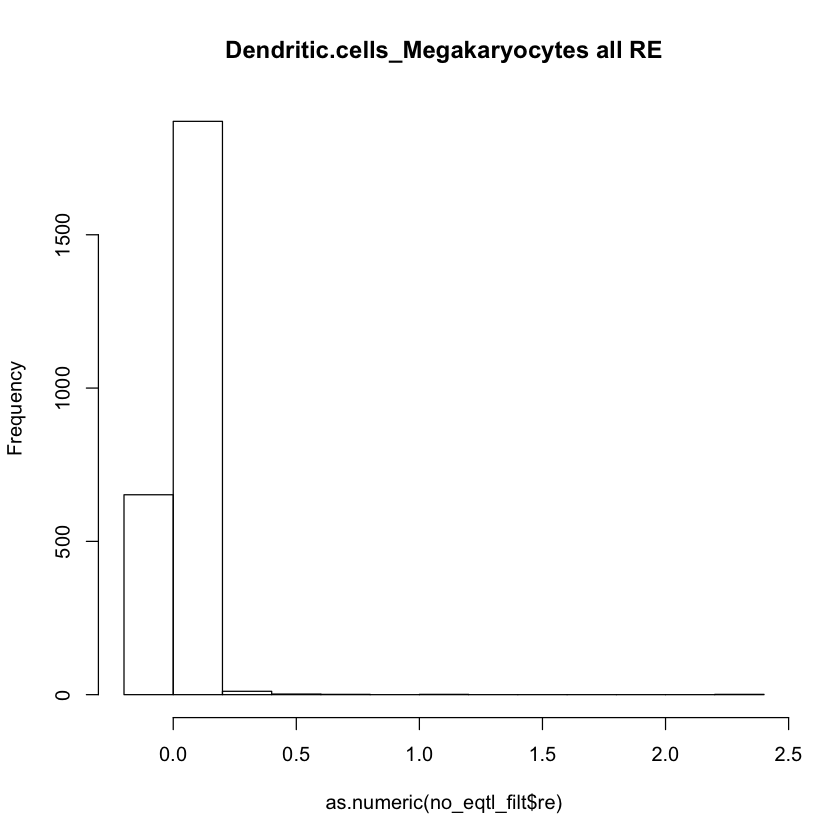

NULL


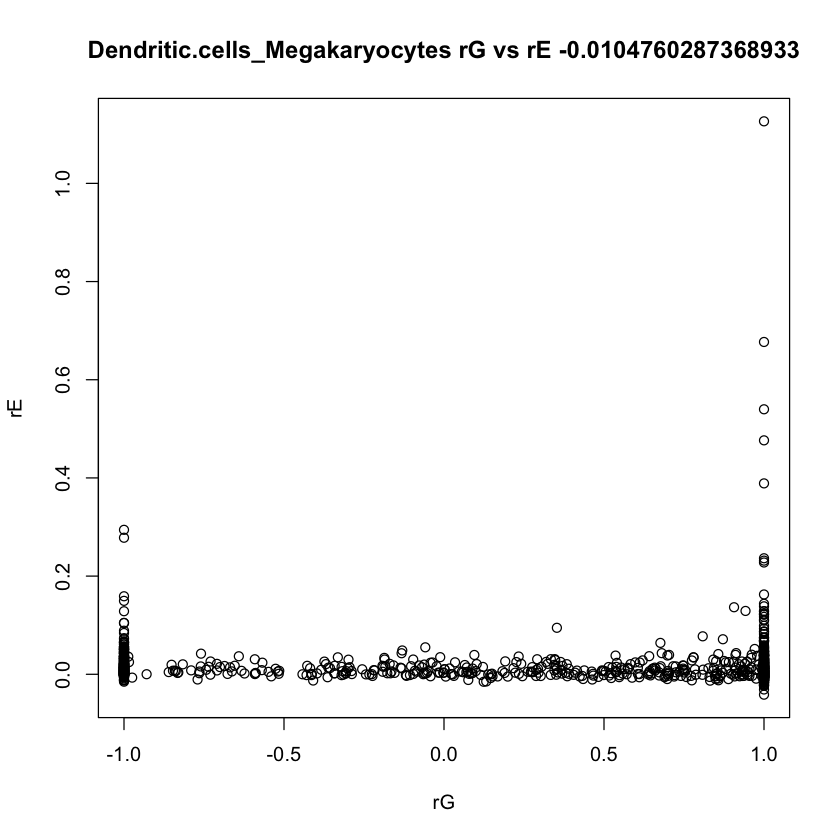

                       cell_pair     gene      sg1      se1      sg2      se2
1 Dendritic.cells_Megakaryocytes    ABCE1 0.001896 0.004263 0.007995 0.008902
2 Dendritic.cells_Megakaryocytes      AGA  0.01992 0.010065 0.018743 0.011681
3 Dendritic.cells_Megakaryocytes   ANAPC4        0 0.003249        0 0.005541
4 Dendritic.cells_Megakaryocytes  ANKRD37 0.001236 0.002989 0.008257 0.007242
5 Dendritic.cells_Megakaryocytes    ARAP2 0.000542 0.004885 0.000426 0.006499
6 Dendritic.cells_Megakaryocytes ARHGAP24 0.031528 0.013088 0.018126 0.013138
         rg        re         rg_se
1         1 -0.012387      1.202287
2  0.295331  0.003222      0.377471
3        -1  0.009696 105588.088489
4 -0.100989  0.001849      1.046827
5        -1  0.039279     15.533905
6         1 -0.003311      0.196244
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.171786591376582"
[1] "median"    "0.7319675"
[1] "var"               "0.821078473143167"
[1] "in 0,1 range" "1495"         "of"  

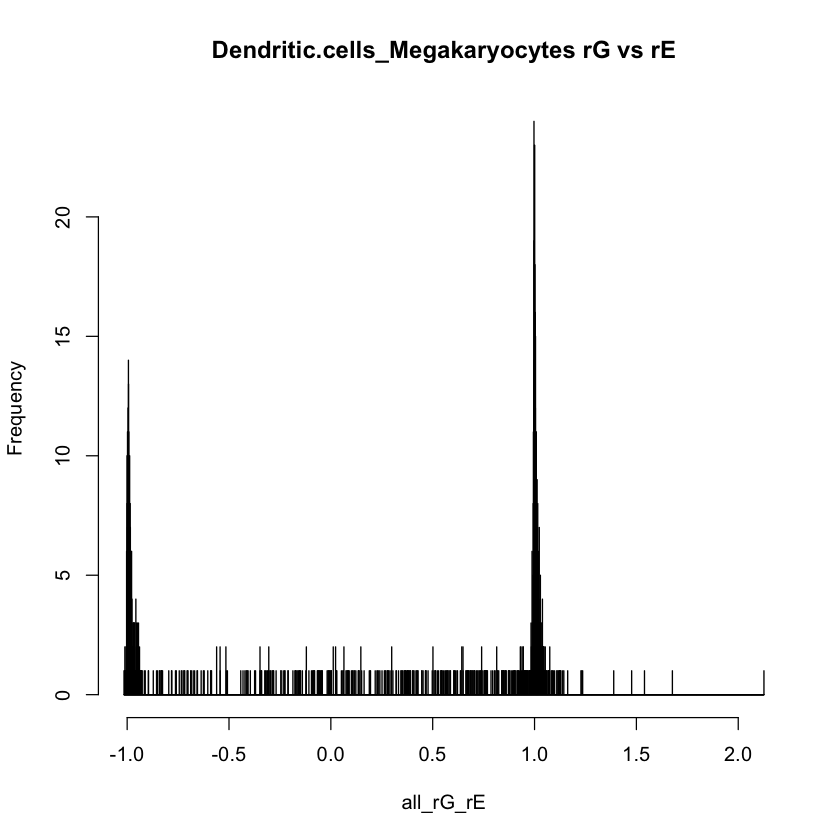

NULL


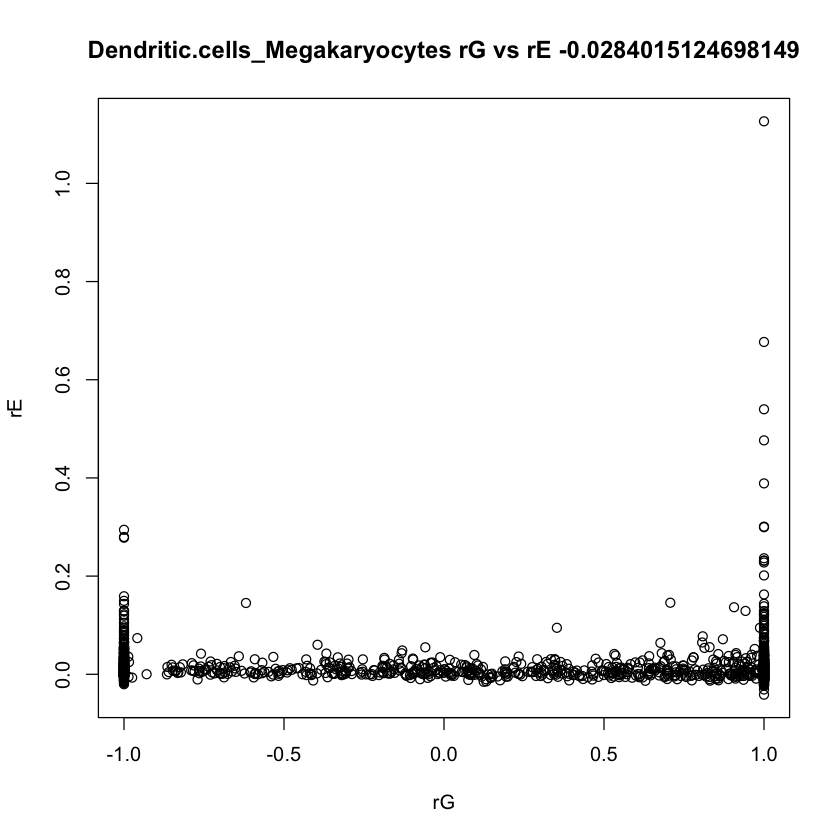

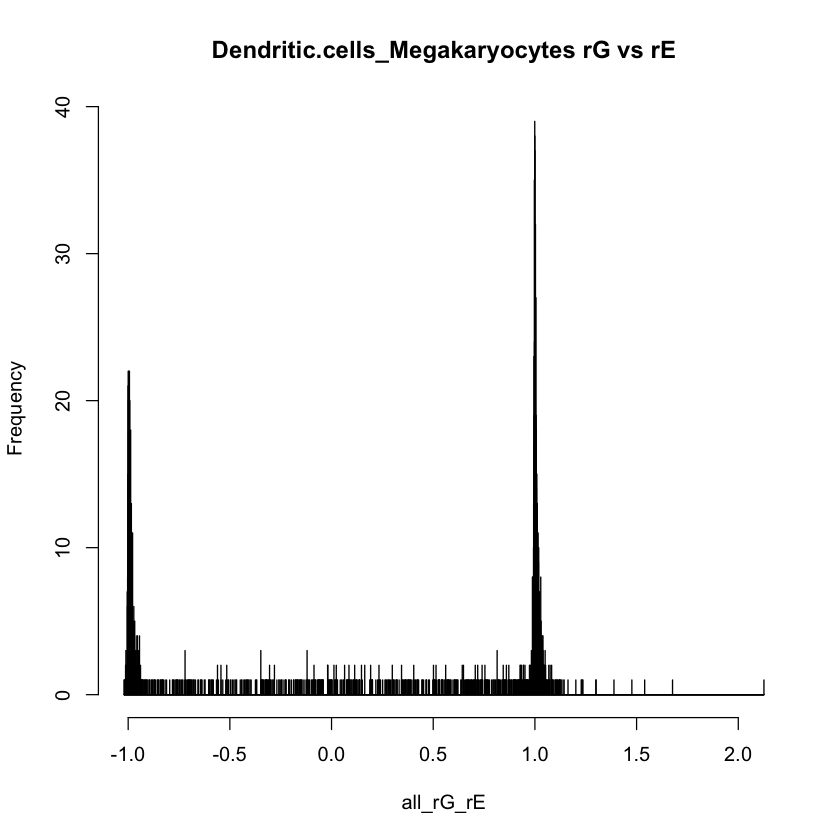

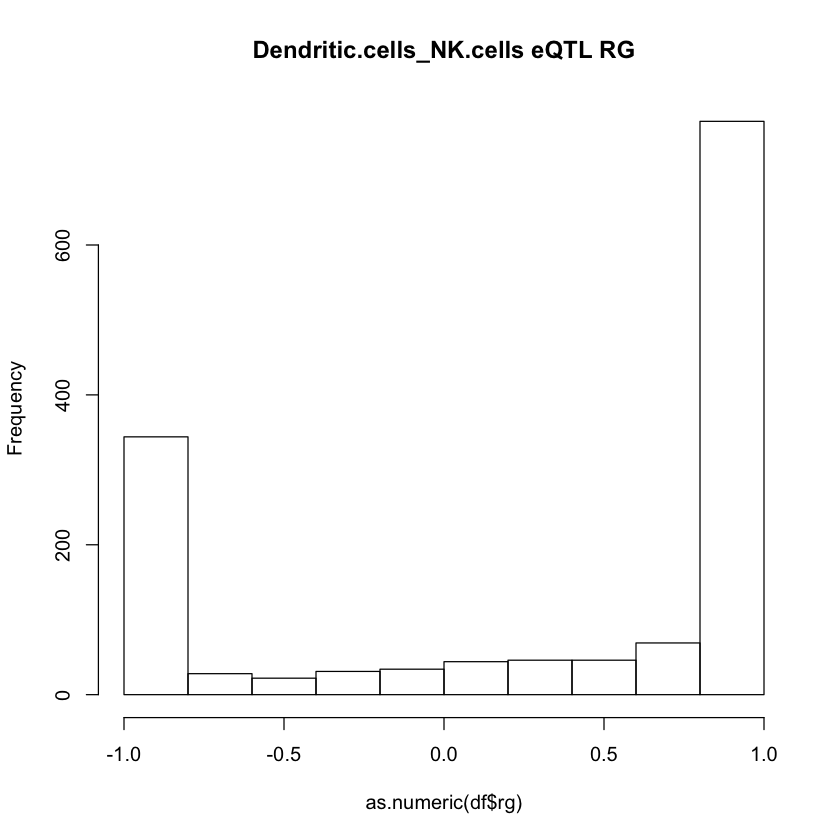

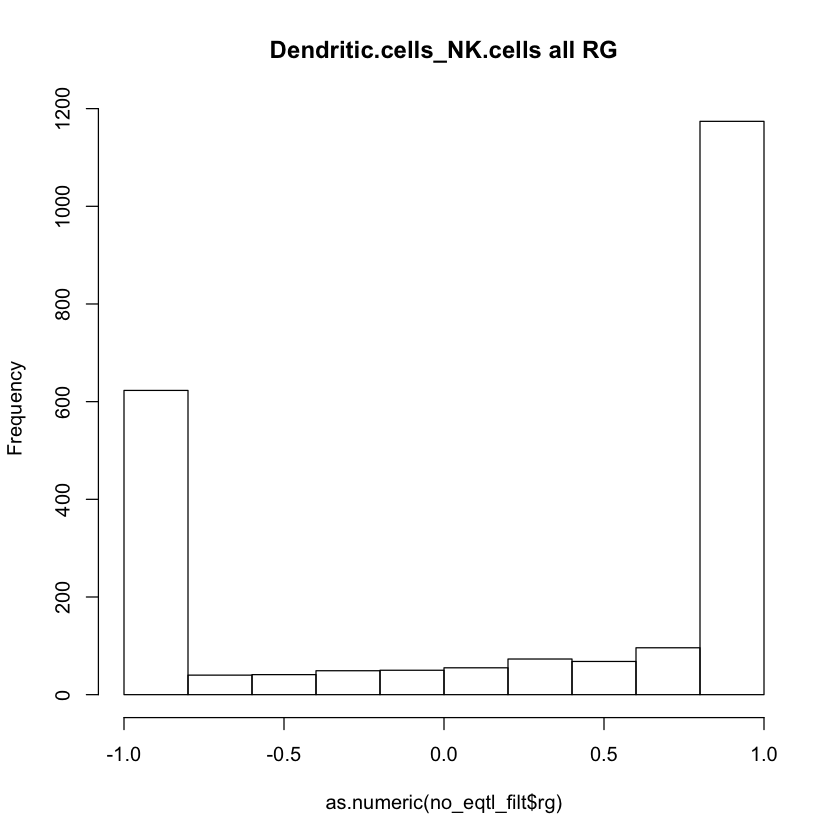

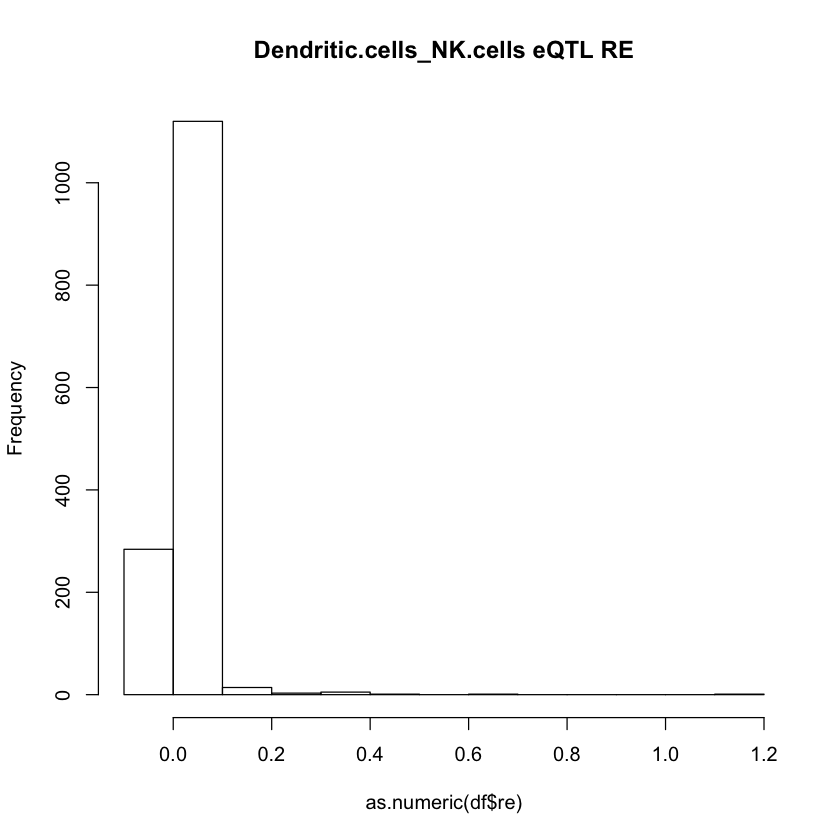

     gene                cell_pair      sg1      se1      sg2      se2       rg
1    A1BG Dendritic.cells_NK.cells 0.018418 0.013553 0.004977 0.008314 0.205794
2 A2M-AS1 Dendritic.cells_NK.cells 0.004025 0.003068 0.046235 0.028594 0.192723
3   AAED1 Dendritic.cells_NK.cells 0.007705 0.007547 0.006084 0.006309        1
4    AATF Dendritic.cells_NK.cells 0.001673  0.00406  0.00013 0.003369        1
5   ABCA2 Dendritic.cells_NK.cells 0.001714 0.002319 0.006408 0.005764        1
6   ABCC3 Dendritic.cells_NK.cells  8.5e-05 0.001514 0.000751  0.00155       -1
         re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  0.029397  0.755915               0           1                 1
2  0.000662  0.477904               0           1                 0
3  0.011786   0.39251               0           0                 0
4  -0.00071 13.763839               1           0                 0
5 -0.003059   0.69432               0           0                 0
6  0.004316 10.209343           

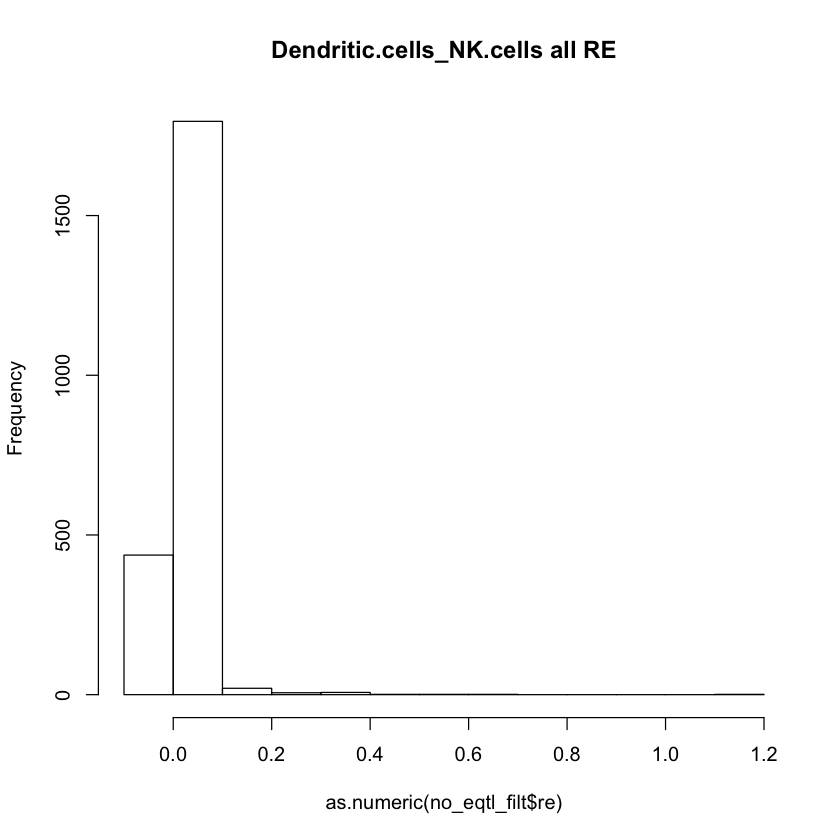

NULL


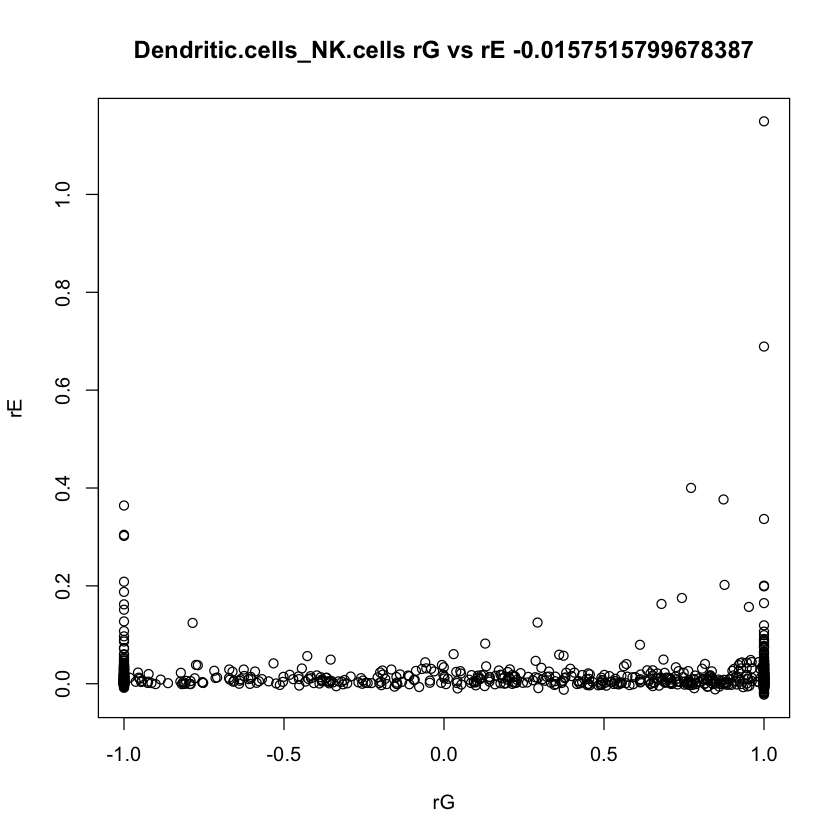

                 cell_pair   gene      sg1      se1      sg2      se2        rg
1 Dendritic.cells_NK.cells   ADH5 0.001237 0.004132  7.9e-05 0.001916        -1
2 Dendritic.cells_NK.cells    AGA 0.019118 0.009889 0.000714 0.004596 -0.336728
3 Dendritic.cells_NK.cells  AIMP1 0.003161   0.0038 0.002075 0.002999         1
4 Dendritic.cells_NK.cells ANTXR2 0.003357 0.005775 0.000103 0.002491         1
5 Dendritic.cells_NK.cells  AP1AR 0.000158  0.00309 0.000736 0.002796 -0.955743
6 Dendritic.cells_NK.cells ARFIP1 0.001739 0.005316 0.005316 0.006214         1
         re     rg_se
1  0.001609 13.302634
2 -0.005123  1.589381
3  0.008186   0.63087
4  0.006327 11.885314
5  0.018326 13.124114
6 -0.002896  1.789578
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"             "0.26833031091314"
[1] "median"   "0.873536"
[1] "var"              "0.75450789663954"
[1] "in 0,1 range" "1453"         "of"           "2245"        
[1] "rE info"
[1] "min"       "-0.022351"
[1] "max"     "1.14938"


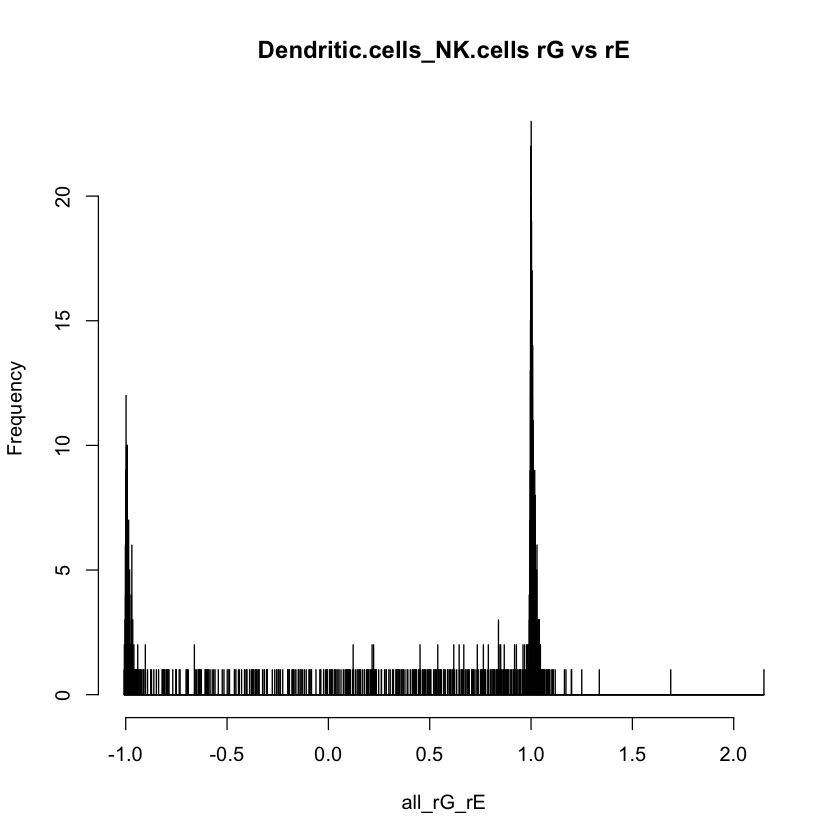

NULL


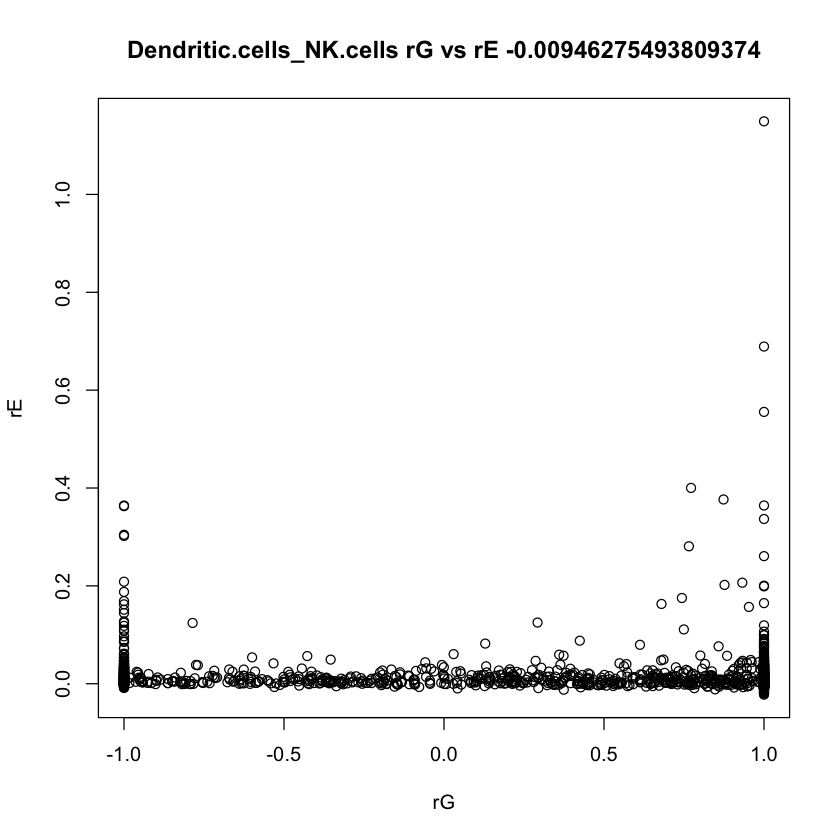

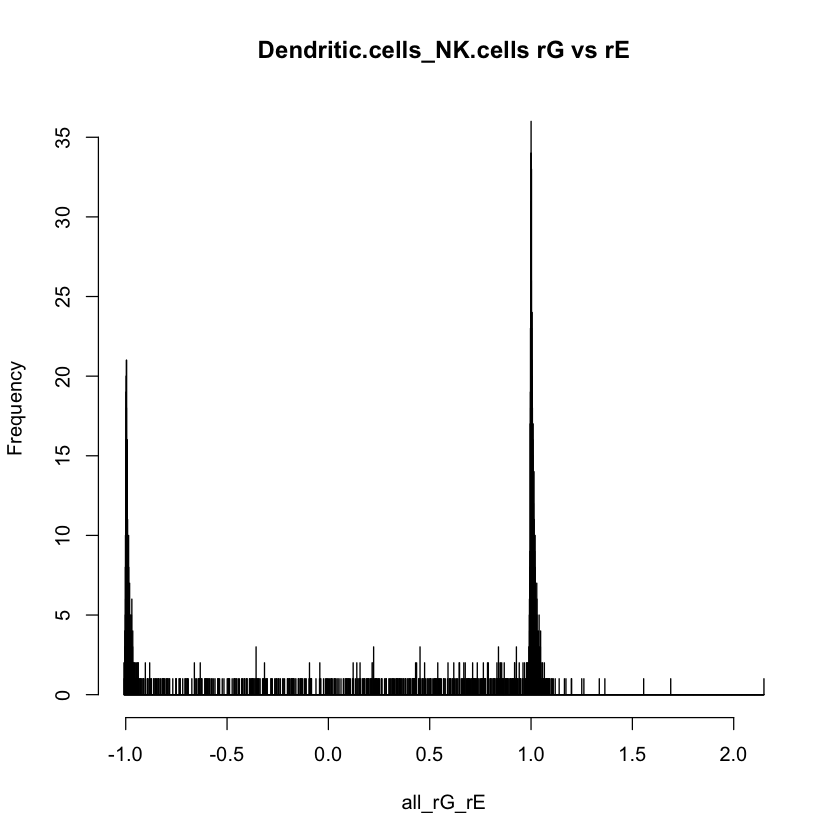

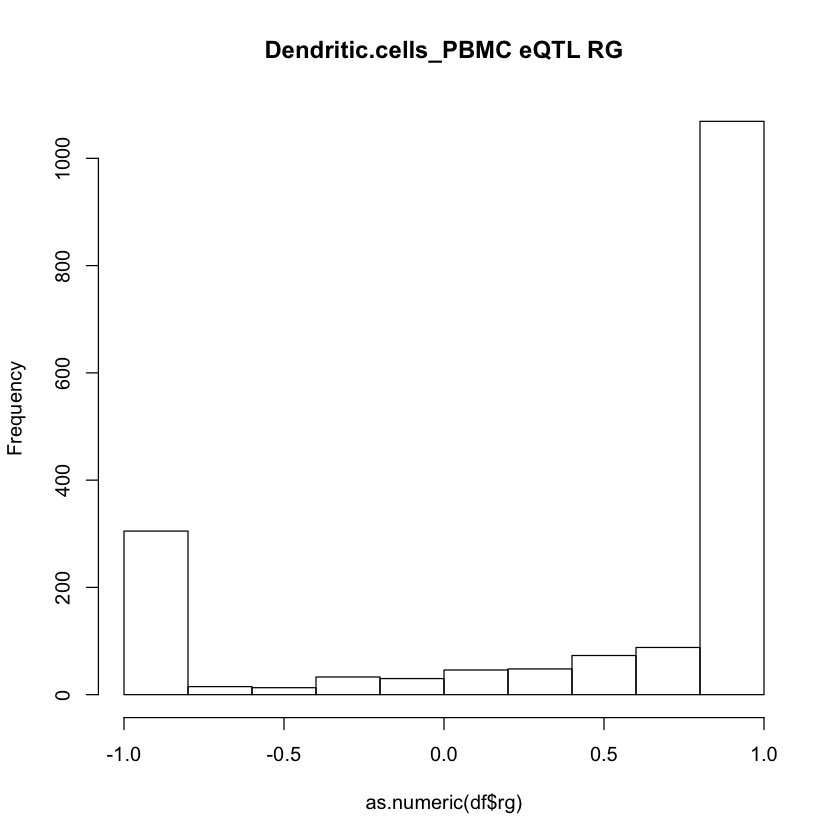

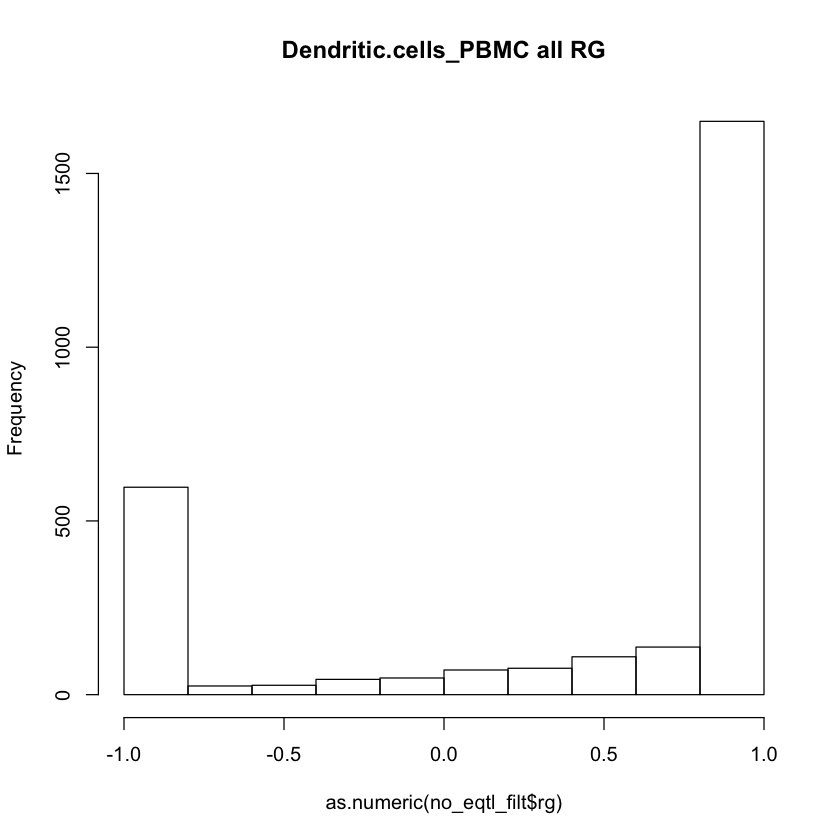

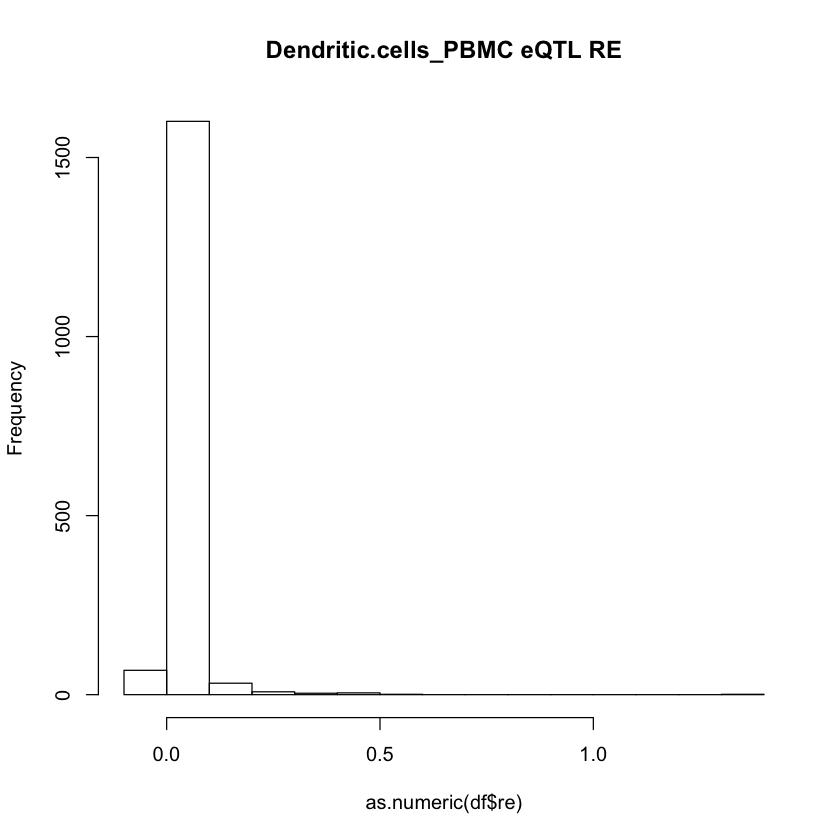

     gene            cell_pair      sg1      se1      sg2      se2       rg
1    A1BG Dendritic.cells_PBMC 0.018353 0.013531 0.008766 0.006659 0.277789
2 A2M-AS1 Dendritic.cells_PBMC 0.004108 0.003102 0.036202 0.023792 0.169532
3   AAED1 Dendritic.cells_PBMC 0.004346 0.005994 0.003504 0.003528        1
4   AASDH Dendritic.cells_PBMC 0.000174 0.004231  7.8e-05 0.001805        1
5    AATF Dendritic.cells_PBMC 0.001182 0.003805 0.000423 0.000753        1
6    ABAT Dendritic.cells_PBMC 0.000451  0.00171 0.011589 0.006795        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.033966  0.479201               0           1                 1
2  0.01486  0.481297               0           1                 0
3 0.013389  0.475467               0           0                 0
4 0.015955 14.361173               0           0                 1
5 0.000507  1.960041               1           0                 0
6 0.006465  1.589568               0           0                 1

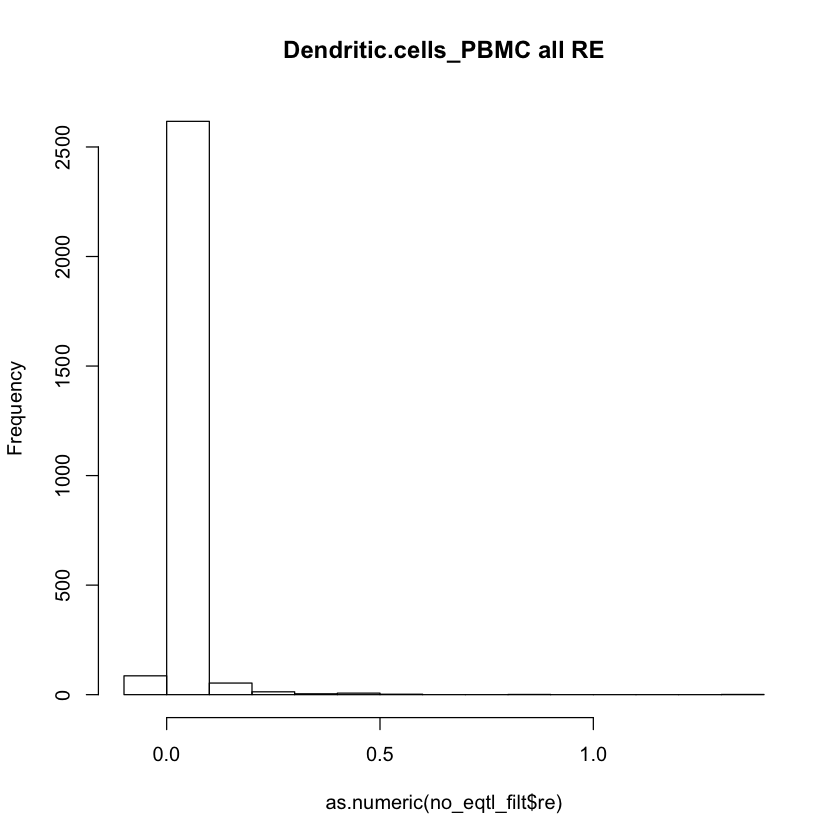

NULL


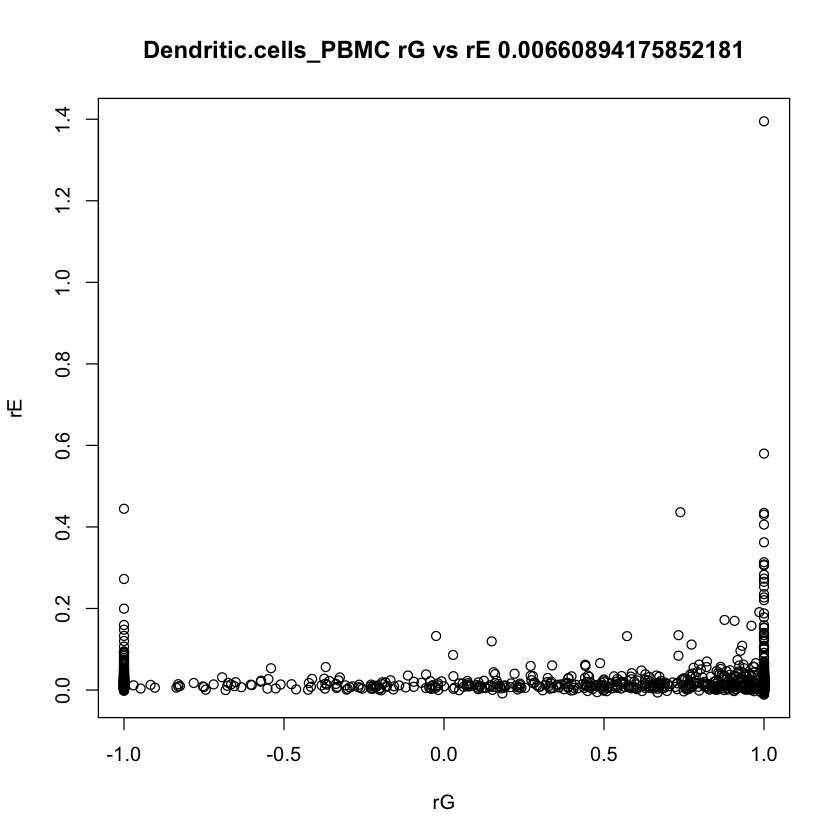

             cell_pair    gene      sg1      se1      sg2      se2       rg
1 Dendritic.cells_PBMC   AASDH 0.000174 0.004231  7.8e-05 0.001805        1
2 Dendritic.cells_PBMC   ACOX3        0 0.002424        0 0.002754       -1
3 Dendritic.cells_PBMC   ACSL1 0.005759 0.006908 0.018003 0.023351        1
4 Dendritic.cells_PBMC     AGA  0.02152 0.010004  0.01132   0.0051 0.848901
5 Dendritic.cells_PBMC   AIMP1 0.004217 0.004154 0.002112 0.001555        1
6 Dendritic.cells_PBMC ANAPC10 0.001765 0.003472 0.000656 0.001318       -1
        re         rg_se
1 0.015955     14.361173
2 0.012926 107381.150215
3 0.034929       0.45393
4 0.002272      0.179568
5 0.008604      0.238451
6 0.007967      1.660443
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.421755488455988"
[1] "median" "1"     
[1] "var"               "0.662174242039976"
[1] "in 0,1 range" "2036"         "of"           "2772"        
[1] "rE info"
[1] "min"       "-0.011357"
[1] "max"      "1.394834"
[1] "

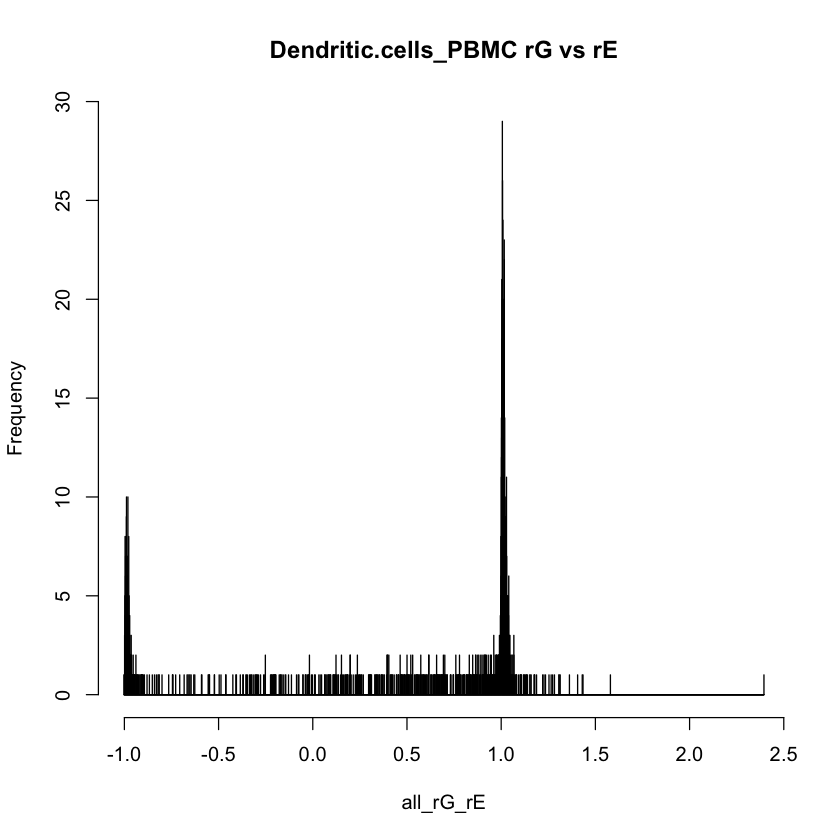

NULL


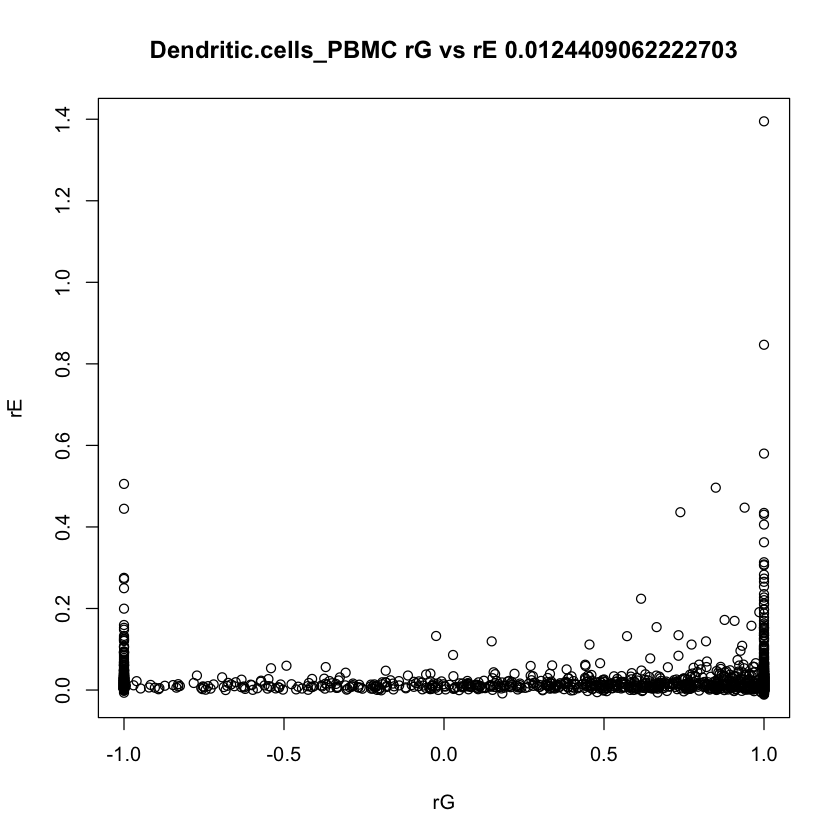

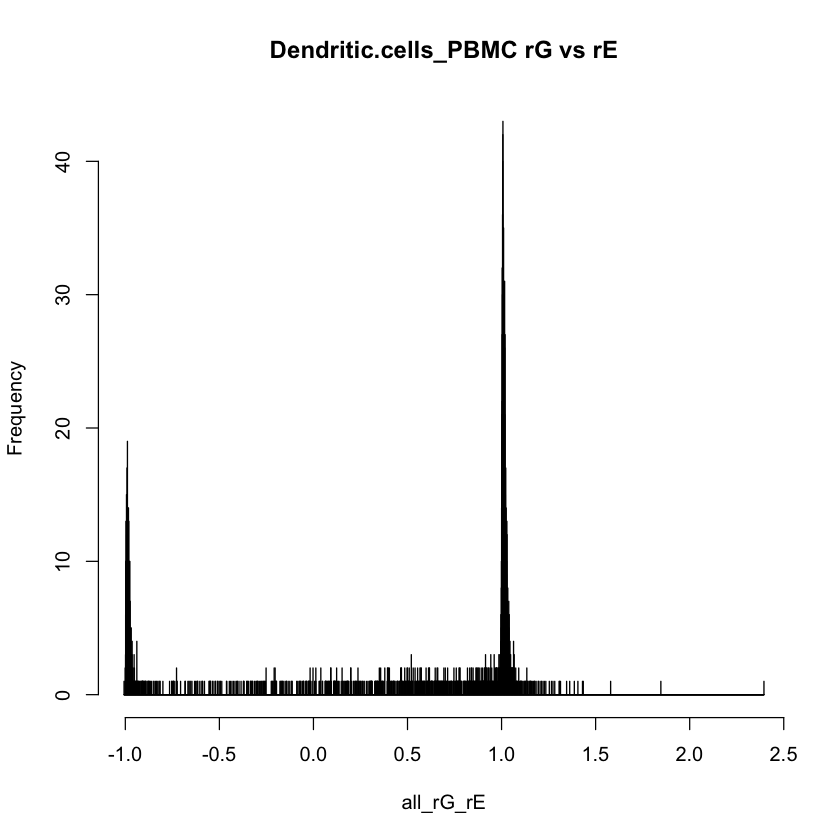

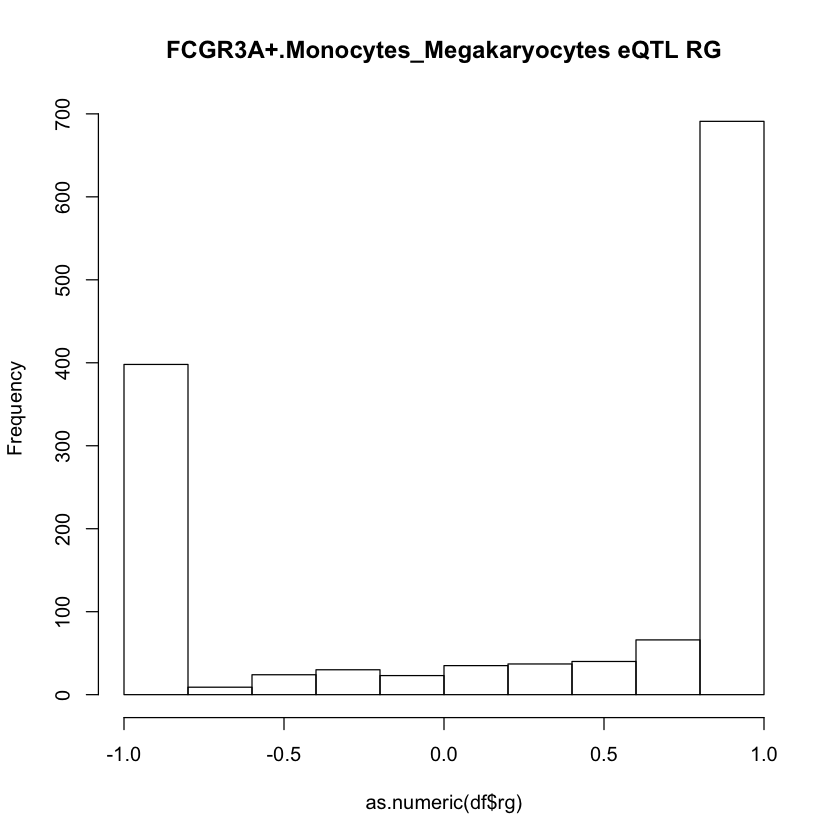

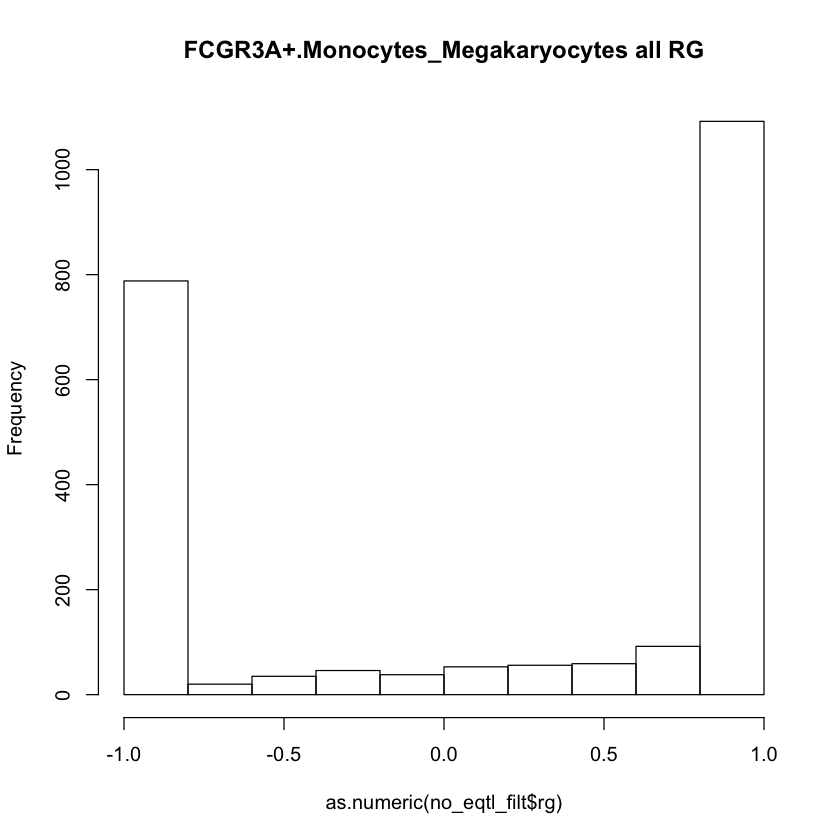

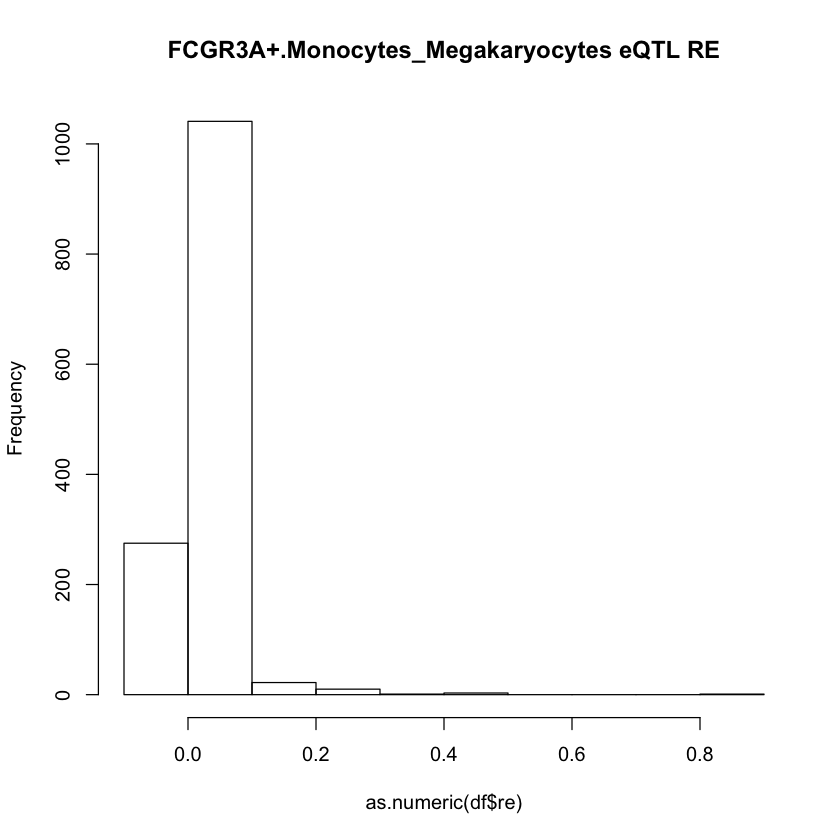

     gene                        cell_pair      sg1      se1      sg2      se2
1 A2M-AS1 FCGR3A+.Monocytes_Megakaryocytes        0 0.001229        0 0.003387
2    AAAS FCGR3A+.Monocytes_Megakaryocytes 0.001259 0.003061 0.000104 0.003655
3   AAED1 FCGR3A+.Monocytes_Megakaryocytes 0.006356 0.006132  0.00948  0.01036
4    ABAT FCGR3A+.Monocytes_Megakaryocytes 0.001333 0.004171 0.012676 0.009344
5   ABCA2 FCGR3A+.Monocytes_Megakaryocytes 0.001516 0.001105 0.005469 0.003804
6   ABCB4 FCGR3A+.Monocytes_Megakaryocytes 0.000189 0.000202 0.001269 0.002508
        rg        re         rg_se Dendritic.cells CD8.T.cells
1       -1  0.003873 108893.821905               0           1
2        1  0.003654     17.545047               0           0
3 0.850752  0.009425      0.503502               0           0
4        1  0.002476      1.487134               0           0
5        1 -0.001992      0.337793               0           0
6        1 -0.000598      0.983977               0           0
  FCGR

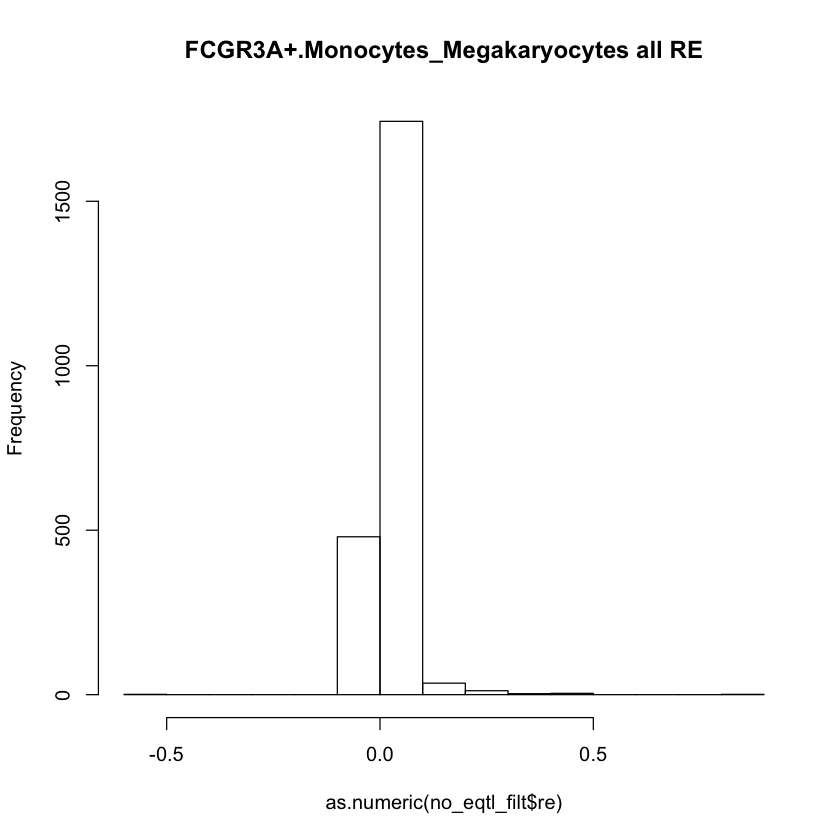

NULL


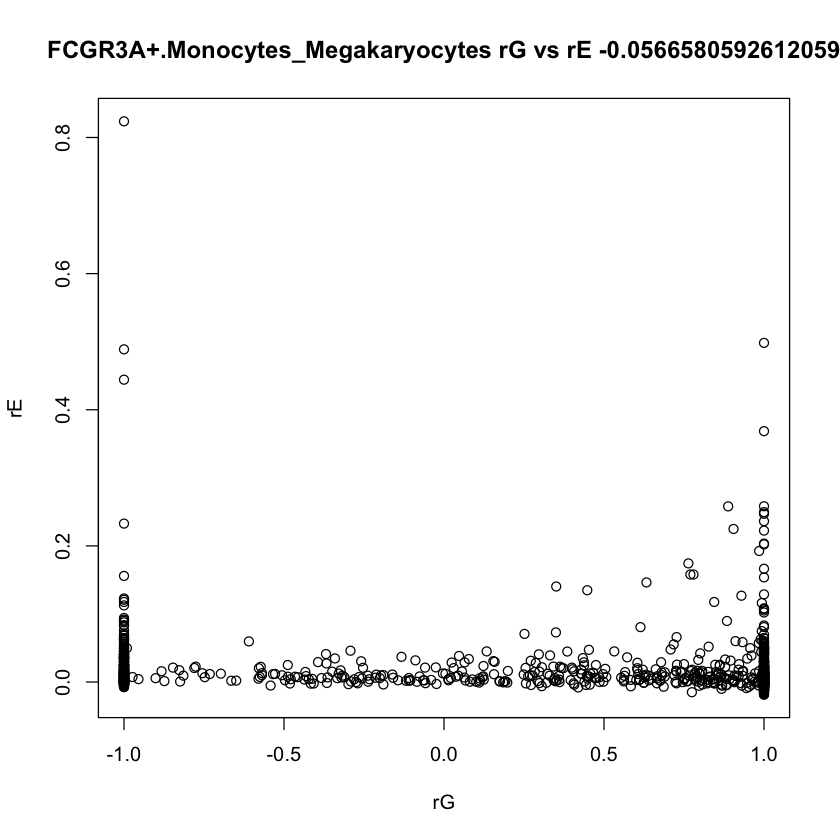

                         cell_pair   gene      sg1      se1      sg2      se2
1 FCGR3A+.Monocytes_Megakaryocytes  ABCE1  8.3e-05  0.00217  0.00906 0.009669
2 FCGR3A+.Monocytes_Megakaryocytes   ADD1  0.00146 0.003501 0.004096 0.007368
3 FCGR3A+.Monocytes_Megakaryocytes    AGA 0.003927  0.00556 0.018437 0.011611
4 FCGR3A+.Monocytes_Megakaryocytes AGPAT9 0.007062 0.006442 0.003527 0.005631
5 FCGR3A+.Monocytes_Megakaryocytes  ALPK1  0.00501 0.005241 0.000936 0.003286
6 FCGR3A+.Monocytes_Megakaryocytes ANAPC4        0 0.003234        0 0.005543
        rg        re         rg_se
1       -1  0.004809     13.194278
2       -1  0.004603      1.644202
3 0.797631  0.013678      0.532339
4  0.44086  0.003474      0.816018
5        1 -0.001247      1.771297
6       -1  0.015244 113838.495894
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.158856673433363"
[1] "median"    "0.6995645"
[1] "var"               "0.828065657984941"
[1] "in 0,1 range" "1345"         "of"         

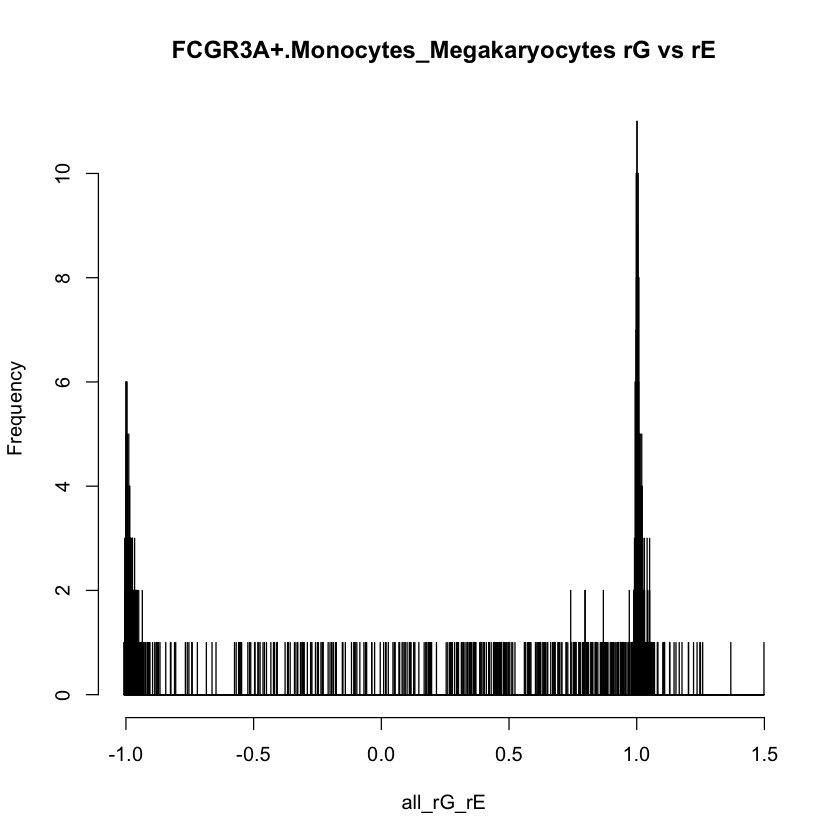

NULL


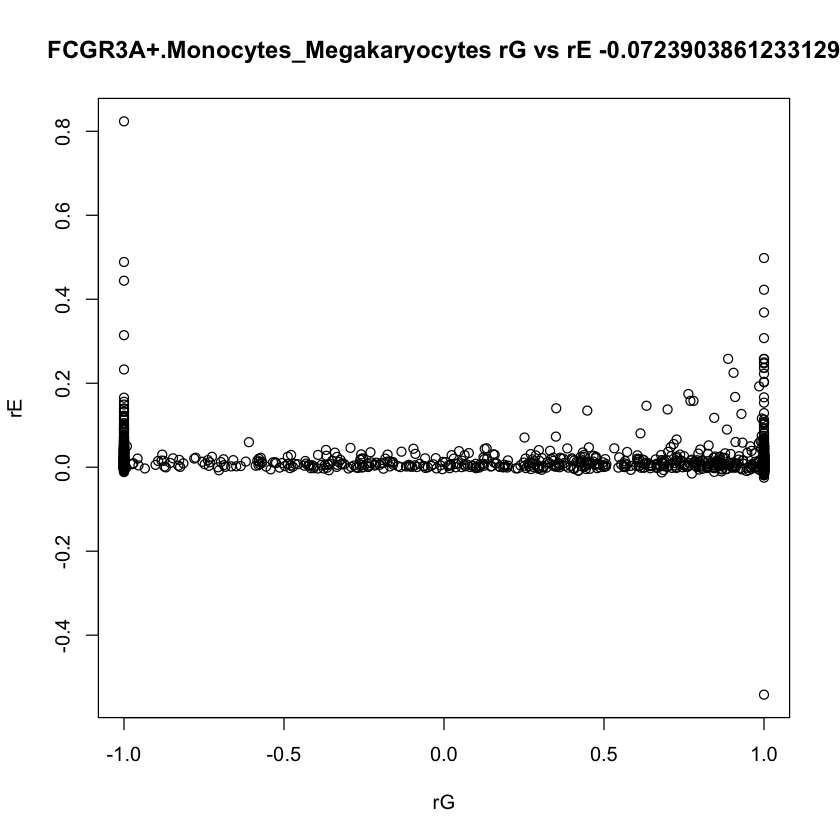

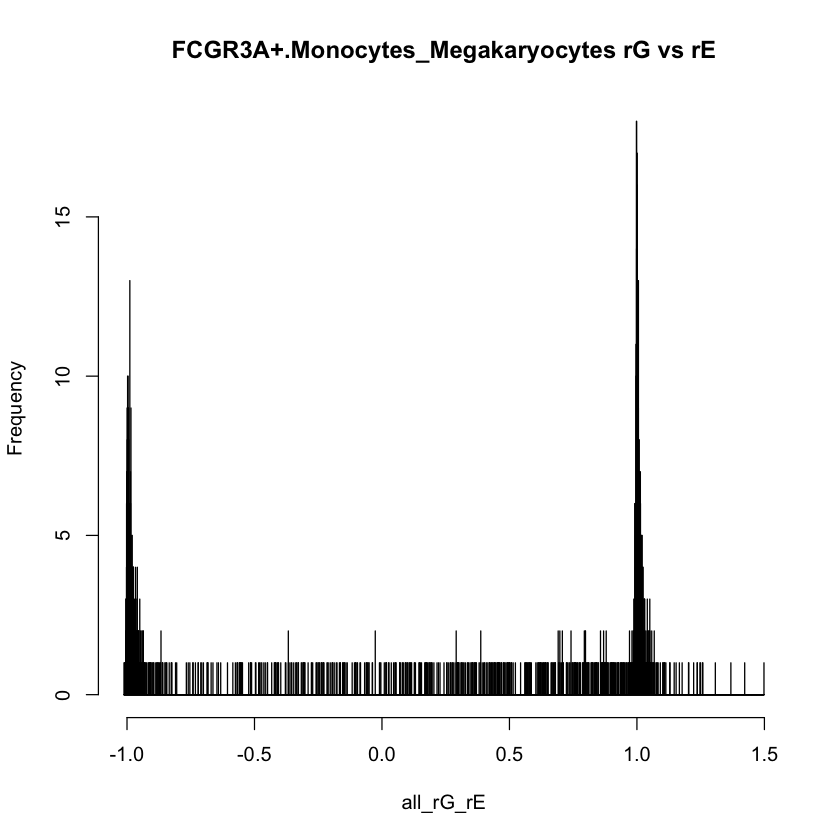

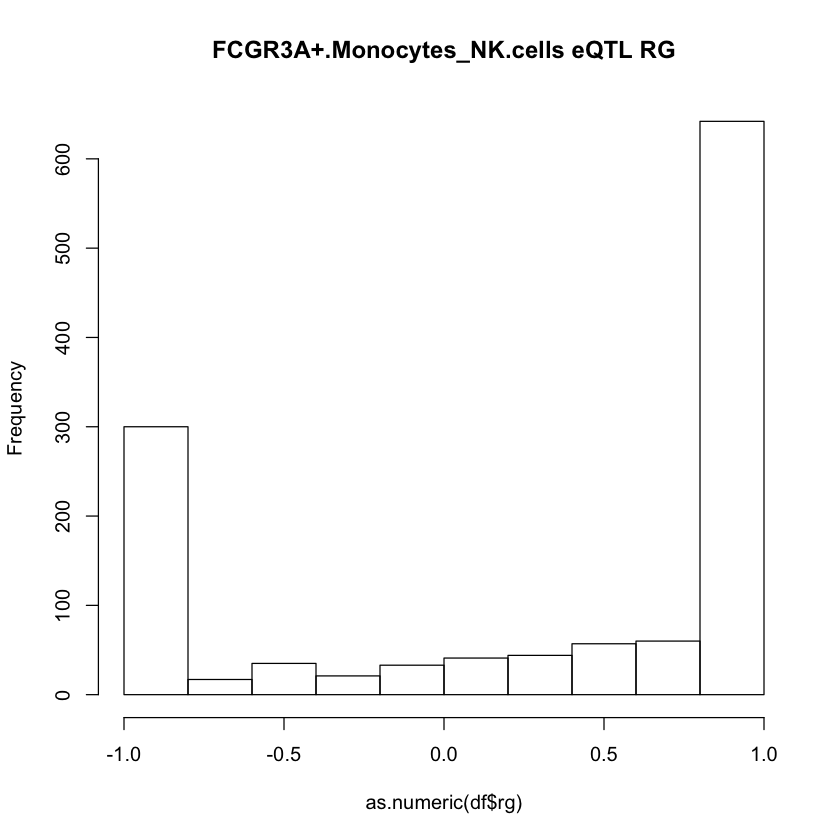

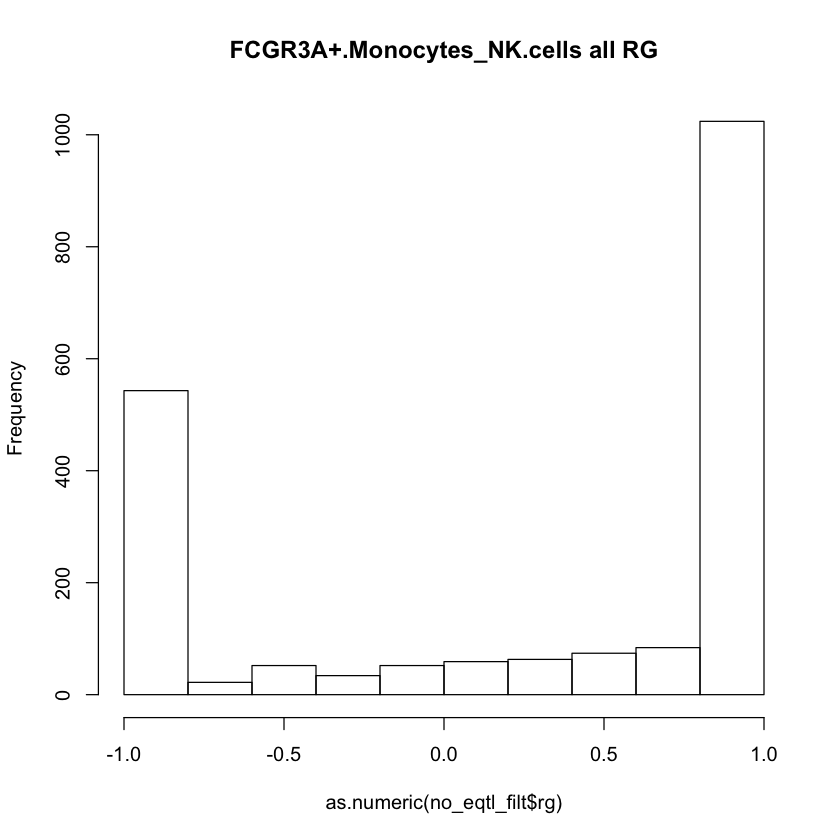

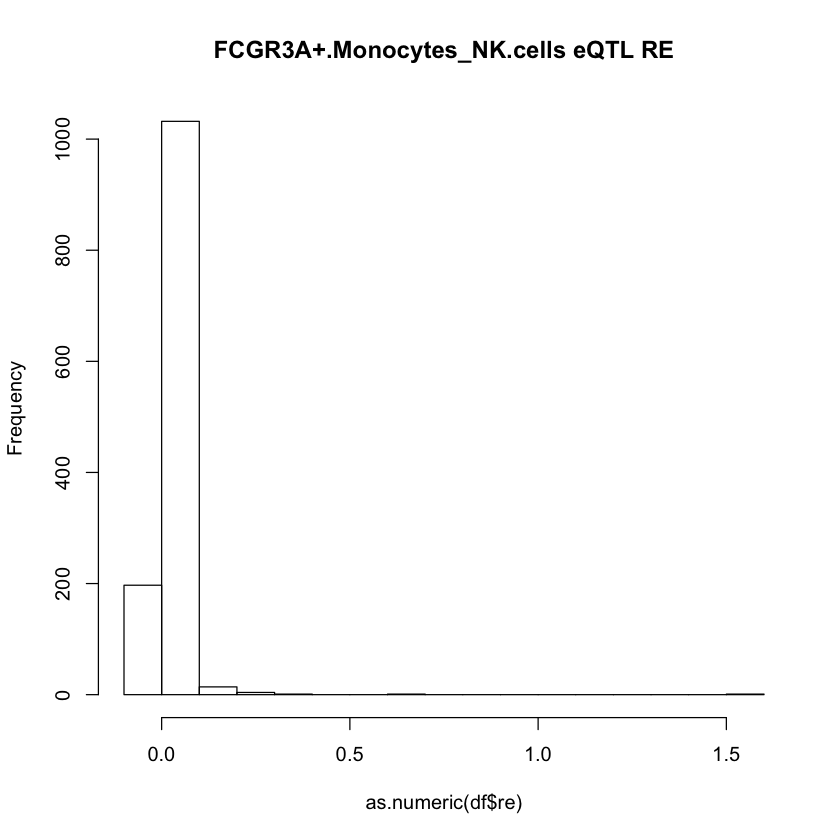

    gene                  cell_pair      sg1      se1      sg2      se2
1   AAAS FCGR3A+.Monocytes_NK.cells 0.001537 0.003209  6.5e-05 0.002193
2  ABCA2 FCGR3A+.Monocytes_NK.cells 0.000592 0.000829 0.005688  0.00571
3  ABCC3 FCGR3A+.Monocytes_NK.cells 0.019358 0.013626 0.002402 0.002155
4 ABHD12 FCGR3A+.Monocytes_NK.cells  0.00631 0.005577 0.000266 0.001617
5 ACAD10 FCGR3A+.Monocytes_NK.cells        0 0.000587        0 0.000467
6 ACADSB FCGR3A+.Monocytes_NK.cells 0.000133 0.001819 0.000196 0.002901
         rg        re        rg_se Dendritic.cells CD8.T.cells
1         1 -0.001834    17.537782               0           0
2 -0.577105  0.001147     0.814951               0           0
3         1  0.001875      0.33564               0           0
4  0.457747  0.001353     1.968649               0           0
5        -1 -0.000995 14134.288799               0           0
6         1  0.000731    13.369209               0           0
  FCGR3A..Monocytes Megakaryocytes CD4.T.cells NK.cells

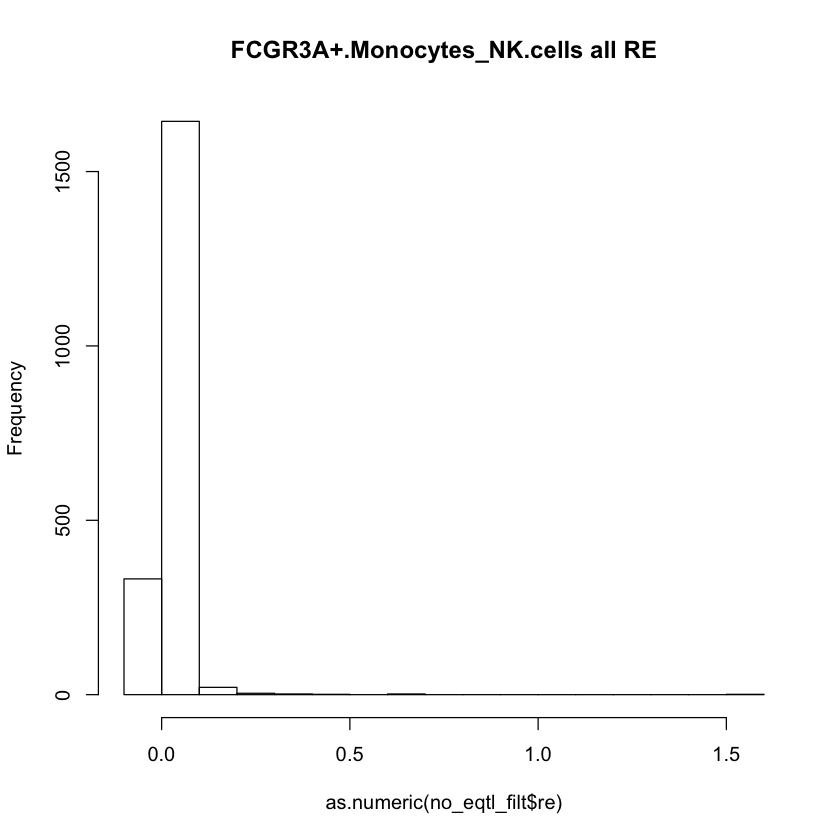

NULL


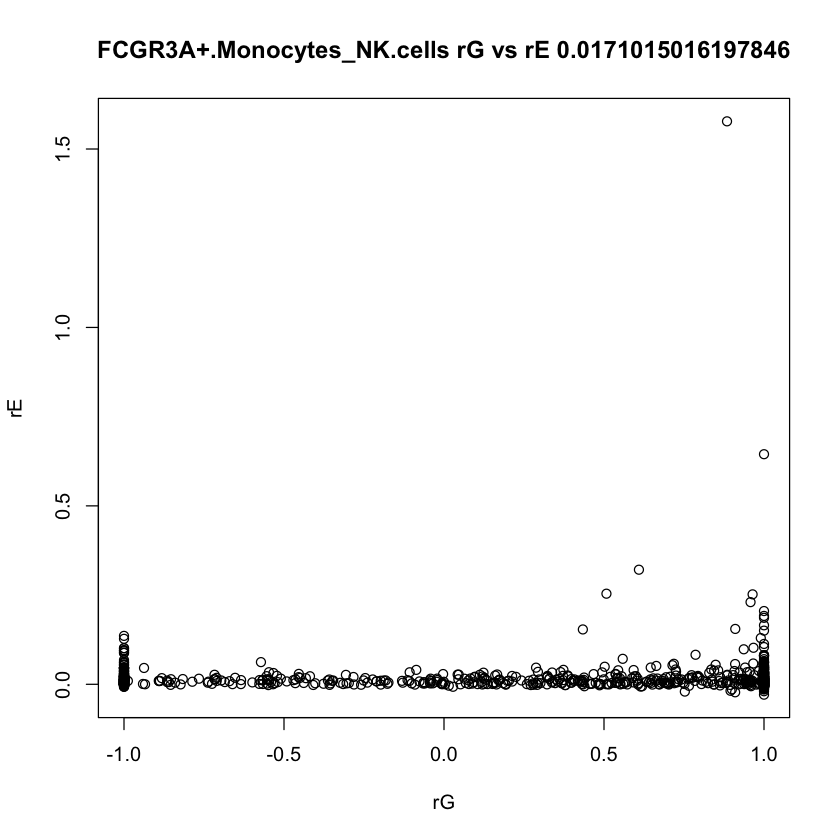

                   cell_pair    gene      sg1      se1      sg2      se2
1 FCGR3A+.Monocytes_NK.cells   ACSL1 0.000358 0.010168 0.000496  0.00291
2 FCGR3A+.Monocytes_NK.cells  AGPAT9 0.007322 0.006549  0.00049 0.000523
3 FCGR3A+.Monocytes_NK.cells   AIMP1 0.007985 0.004893 0.003079 0.003324
4 FCGR3A+.Monocytes_NK.cells   ALPK1 0.003299 0.004429 0.000614 0.001001
5 FCGR3A+.Monocytes_NK.cells ANKRD17 0.004281 0.004363 0.000147 0.004301
6 FCGR3A+.Monocytes_NK.cells ANKRD50 0.001166  0.00366  1.8e-05  0.00034
        rg        re     rg_se
1        1  0.004672 15.679798
2 0.191602  0.000994  0.677683
3        1  0.006665  0.313943
4        1 -0.003783  1.079665
5        1  0.026757  13.26592
6       -1  0.001158 11.090973
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.270859618759455"
[1] "median"   "0.860744"
[1] "var"               "0.744693620177785"
[1] "in 0,1 range" "1290"         "of"           "1983"        
[1] "rE info"
[1] "min"       "-0.029057"
[1] "m

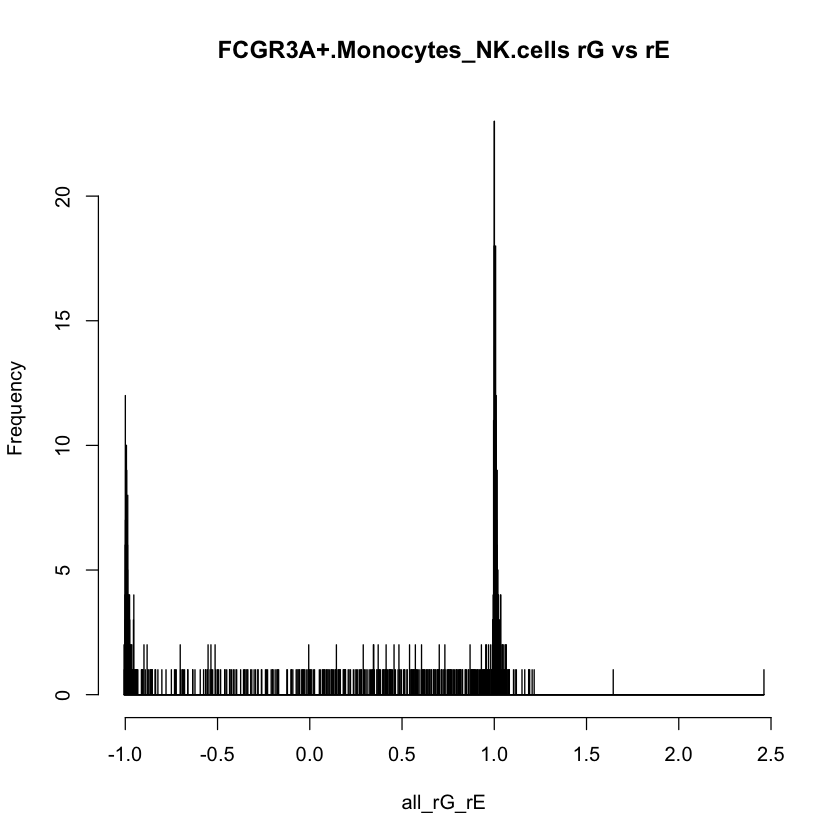

NULL


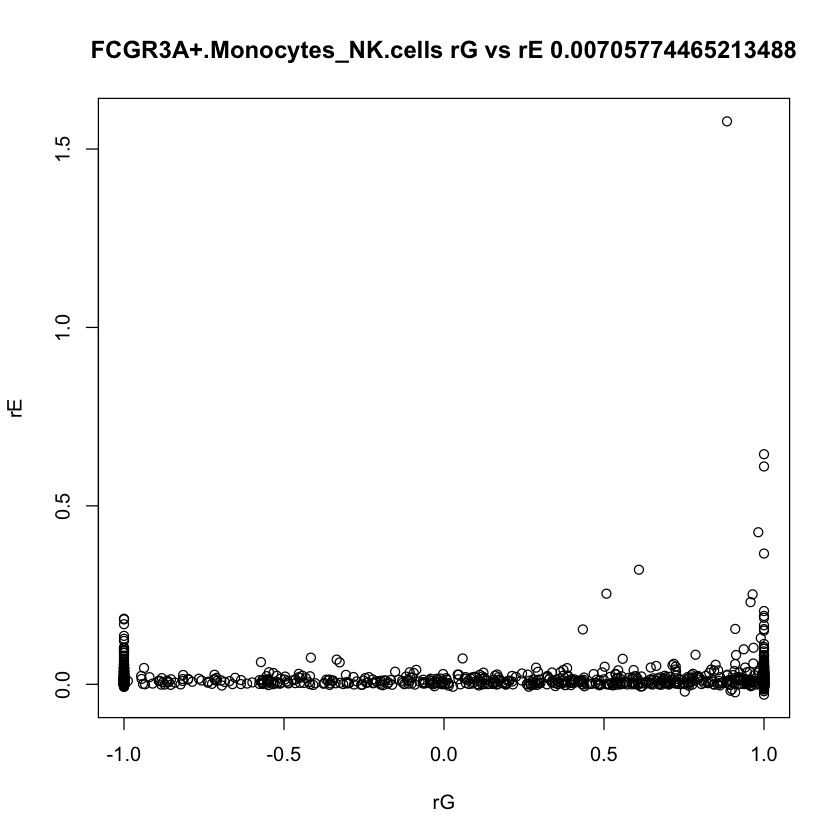

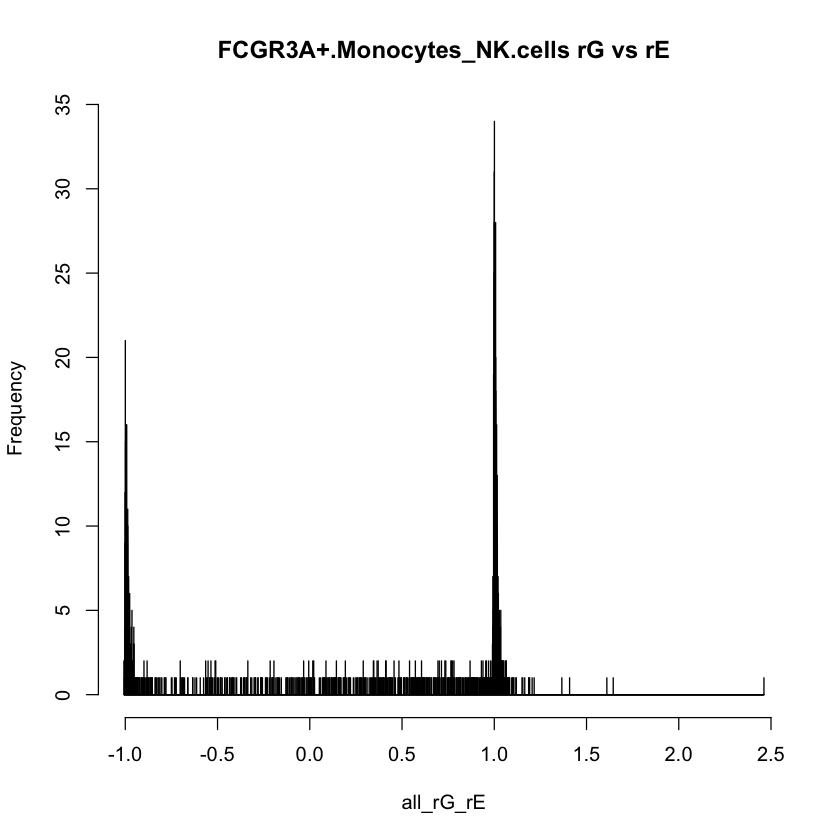

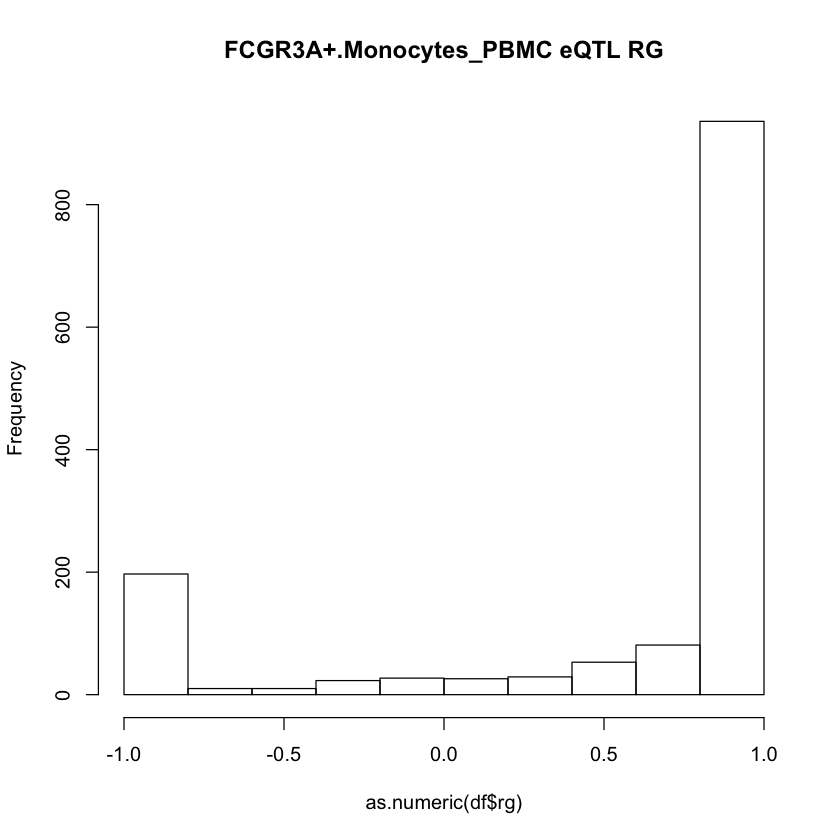

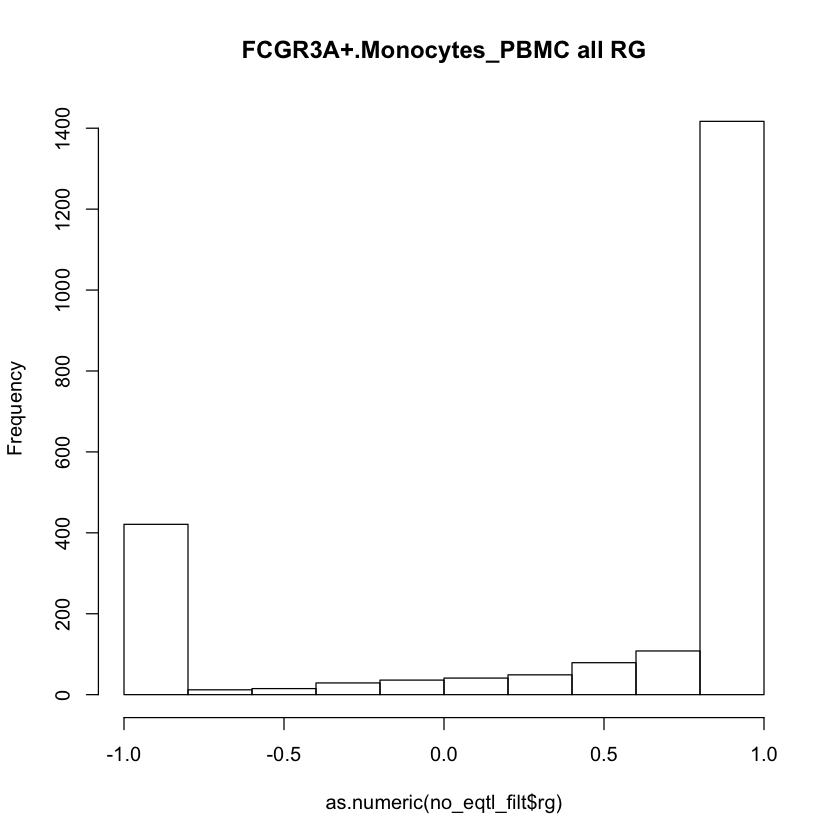

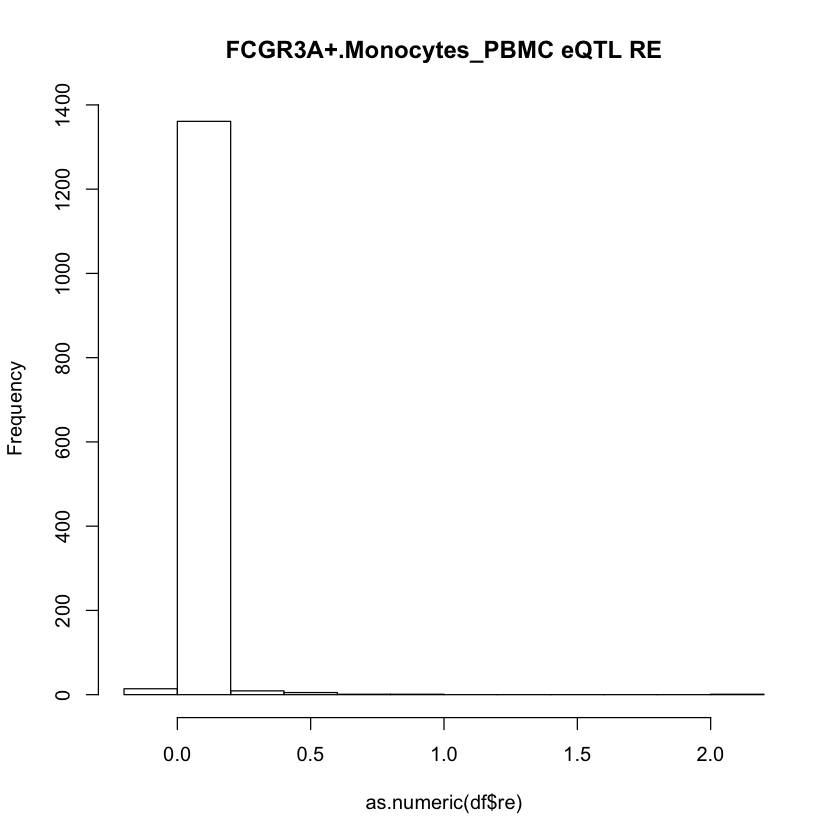

     gene              cell_pair      sg1      se1      sg2      se2       rg
1 A2M-AS1 FCGR3A+.Monocytes_PBMC  4.3e-05 0.001249 0.039084 0.024471       -1
2    AAAS FCGR3A+.Monocytes_PBMC 0.001496  0.00317  3.5e-05  0.00099       -1
3   AAED1 FCGR3A+.Monocytes_PBMC 0.004957 0.005623 0.001514 0.002632 0.249784
4   AAGAB FCGR3A+.Monocytes_PBMC  0.00383 0.004663 0.006017 0.003253        1
5    ABAT FCGR3A+.Monocytes_PBMC 0.002055 0.004439 0.009829  0.00626        1
6   ABCC3 FCGR3A+.Monocytes_PBMC 0.013898 0.012212 0.013507 0.011502        1
        re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.011183 14.693848               0           1                 0
2 0.008889 16.409683               0           0                 1
3 0.026989  0.903924               0           0                 0
4 0.008609  0.366041               0           0                 0
5 0.012363  0.799474               0           0                 1
6 0.051644  0.157143               0           0    

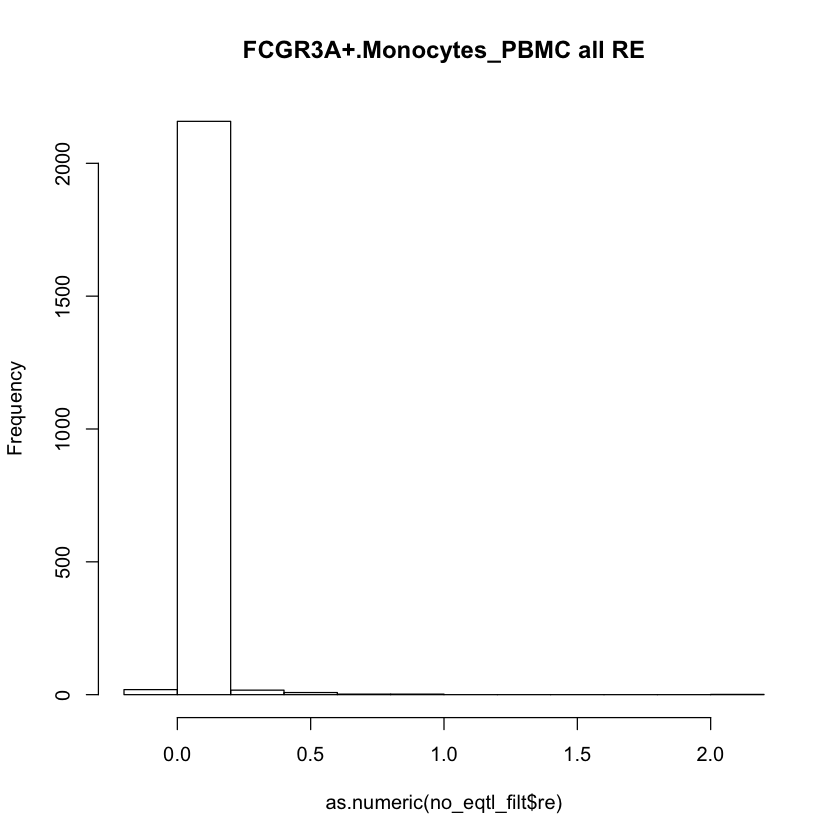

NULL


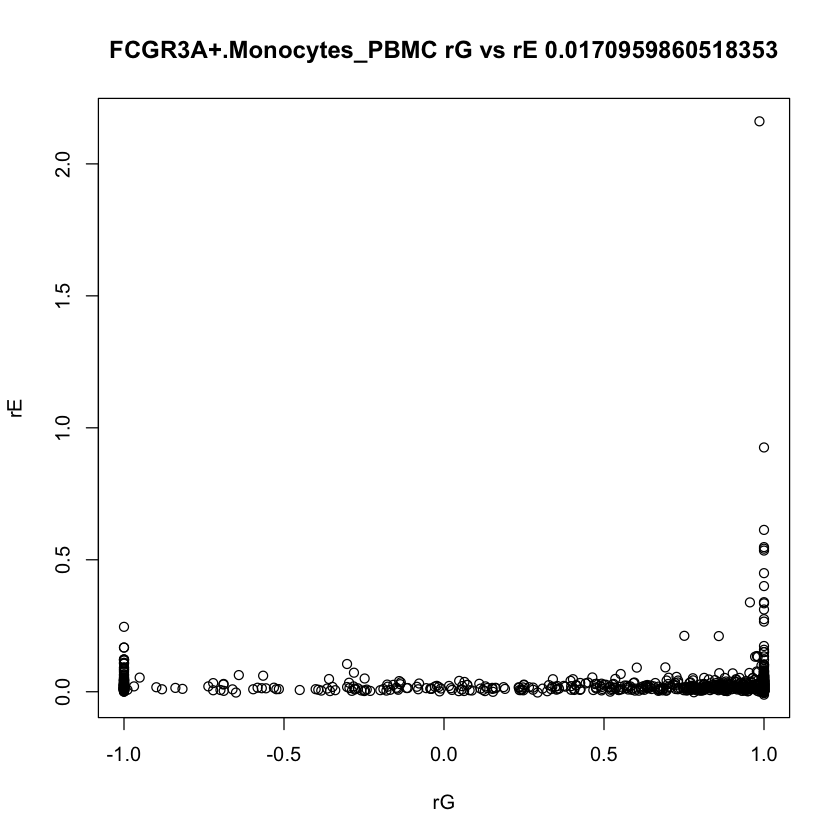

               cell_pair   gene      sg1      se1      sg2      se2       rg
1 FCGR3A+.Monocytes_PBMC   ADD1 0.001489  0.00352 0.000368 0.000853 0.841896
2 FCGR3A+.Monocytes_PBMC   ADH5 0.025424  0.01128 0.000694 0.001279        1
3 FCGR3A+.Monocytes_PBMC    AGA  0.00376 0.005221 0.009144 0.004709        1
4 FCGR3A+.Monocytes_PBMC AGPAT9 0.006932 0.006408 0.003244 0.007551 0.814441
5 FCGR3A+.Monocytes_PBMC  AIMP1 0.008488 0.005131 0.001609 0.001299 0.953065
6 FCGR3A+.Monocytes_PBMC  ALPK1 0.003775 0.004725  0.00203 0.003317        1
        re    rg_se
1 0.010852 1.143988
2 0.012149  0.59353
3 0.024591 0.304082
4 0.037926 0.720572
5 0.009519 0.152876
6 0.020604 0.560477
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.492366982680036"
[1] "median" "1"     
[1] "var"               "0.614116270559823"
[1] "in 0,1 range" "1686"         "of"           "2194"        
[1] "rE info"
[1] "min"       "-0.011082"
[1] "max"      "2.161206"
[1] "mean"               "0.02767

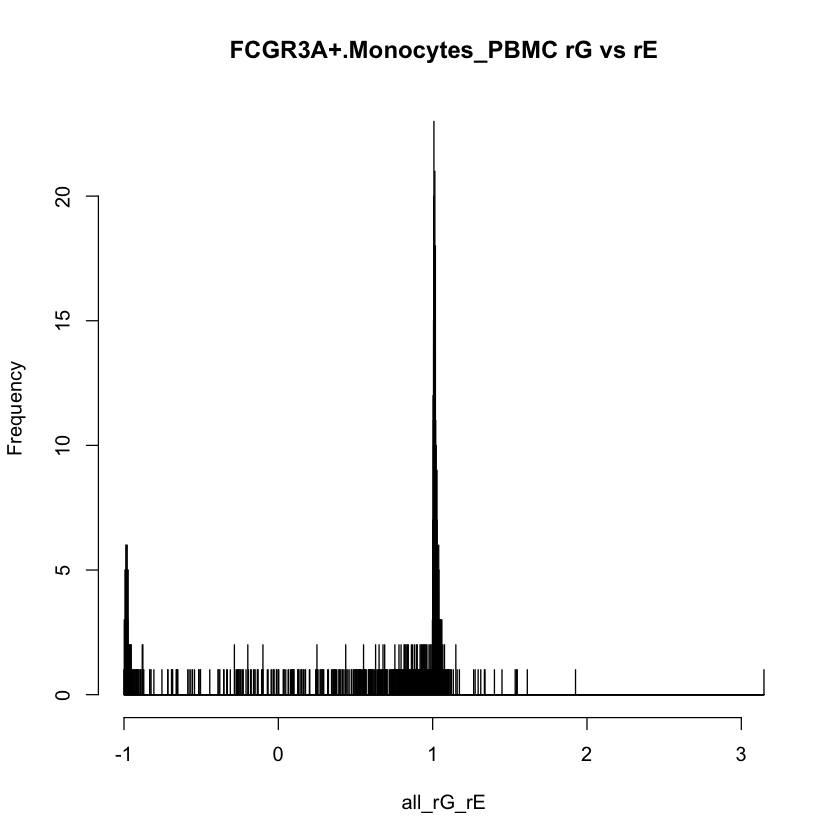

NULL


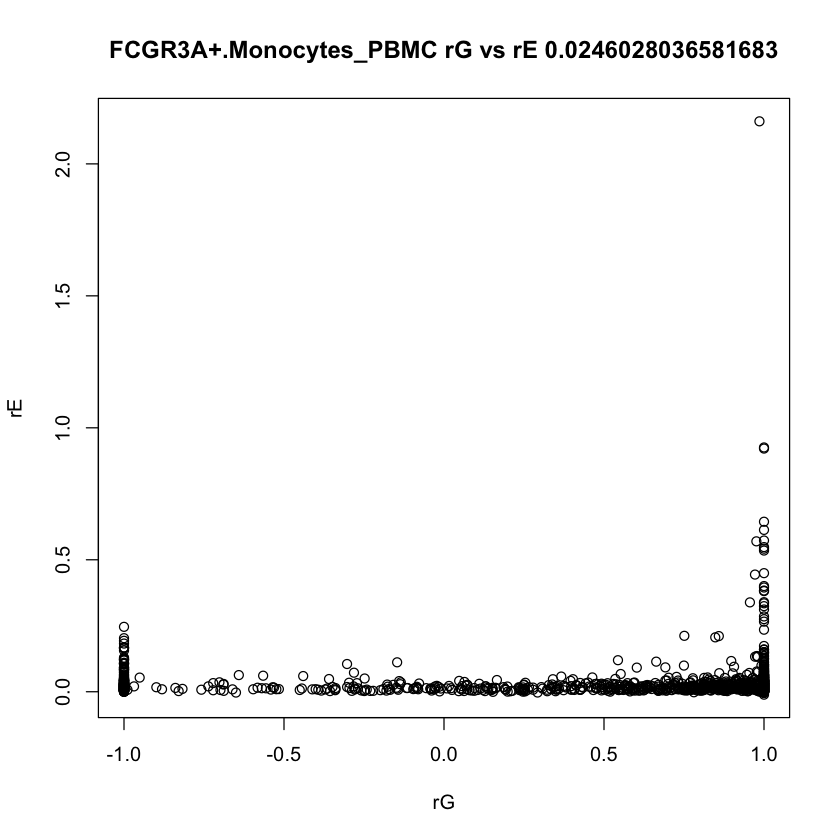

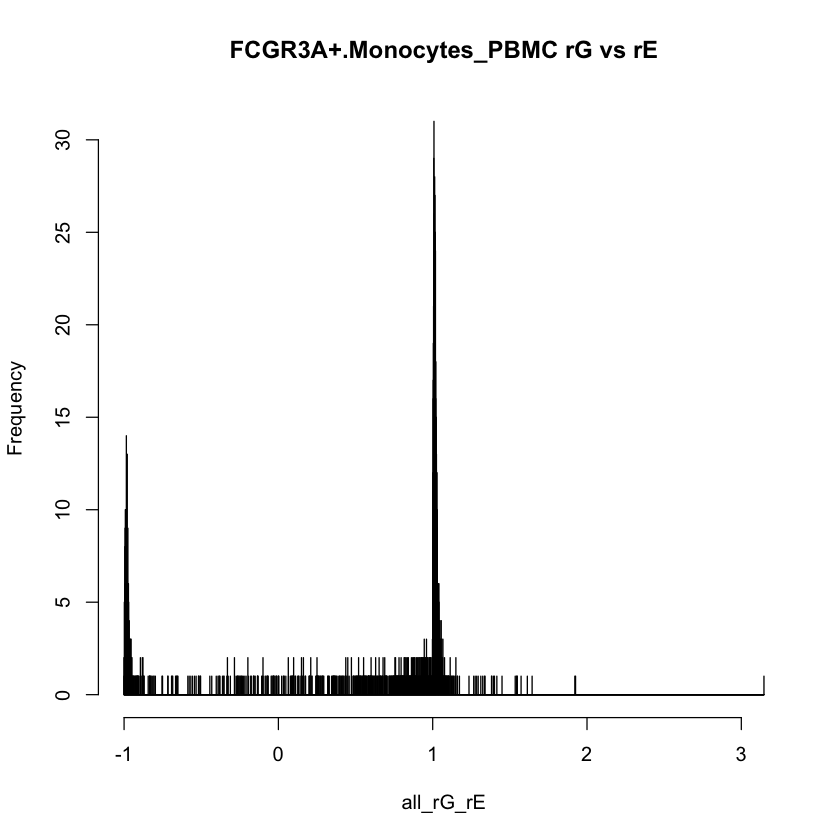

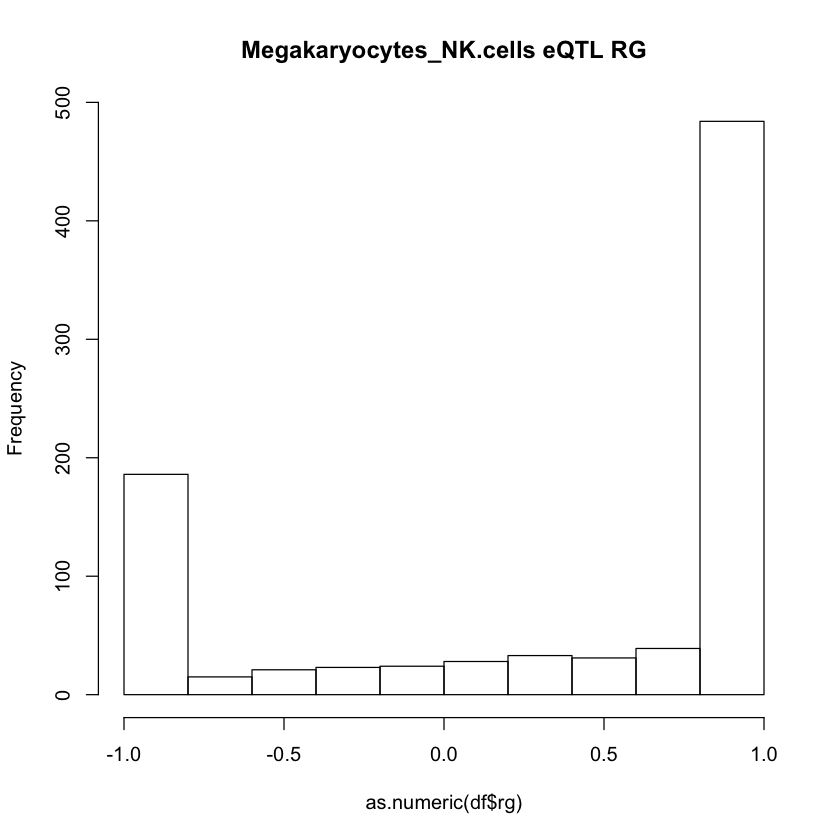

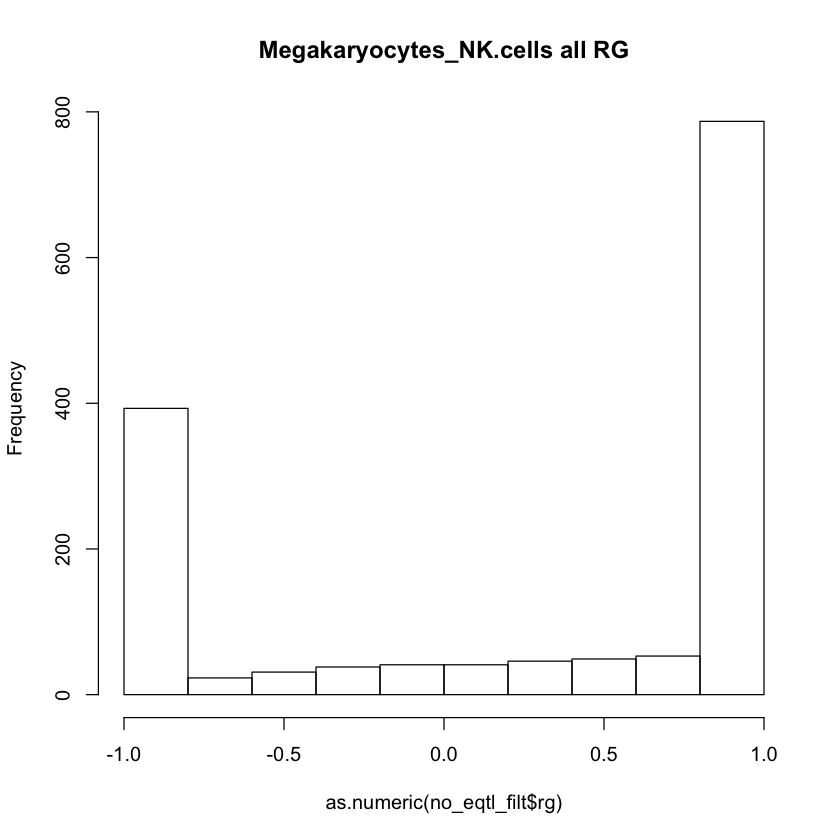

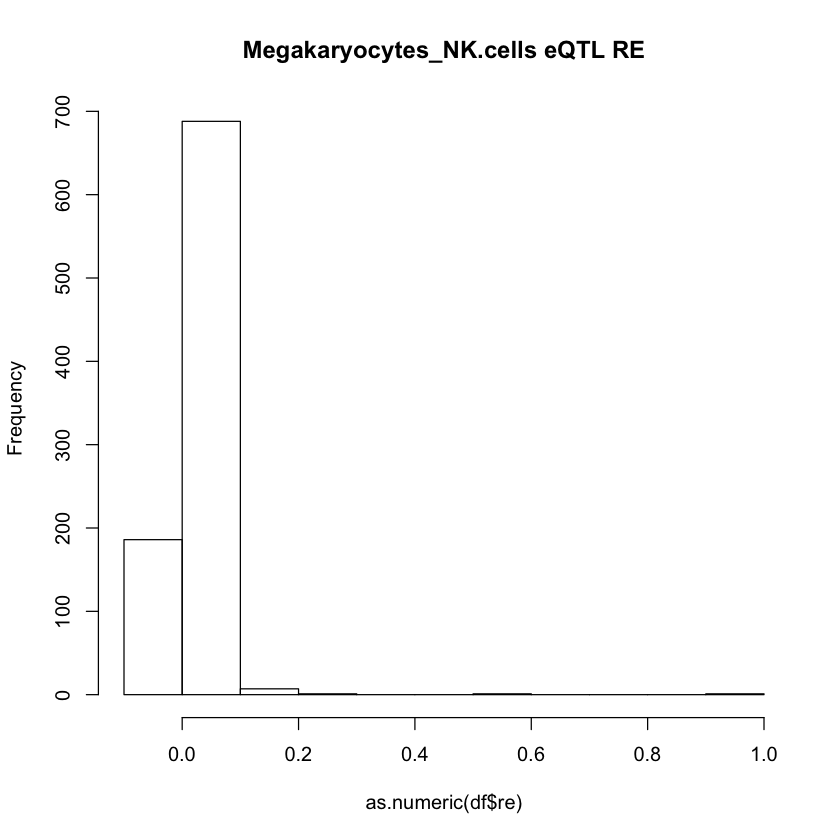

   gene               cell_pair      sg1      se1      sg2      se2        rg
1 AAGAB Megakaryocytes_NK.cells 0.005098 0.007651 0.002736 0.003559  0.800043
2  ABAT Megakaryocytes_NK.cells 0.014302 0.009779  0.00106 0.002653         1
3 ABCA1 Megakaryocytes_NK.cells 0.000107 0.003171 0.000144 0.000311        -1
4 ABCA2 Megakaryocytes_NK.cells  0.00473 0.003736 0.005674 0.005503 -0.779262
5 ABCC4 Megakaryocytes_NK.cells 0.016204 0.015277 0.000652 0.002485  0.916143
6 ABHD2 Megakaryocytes_NK.cells 0.000479 0.005328 0.000324 0.005579         1
         re     rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1  -0.00267  0.970966               0           0                 0
2 -0.008599  1.384475               0           0                 1
3  0.001521 15.957261               0           0                 0
4  0.006956  0.577471               0           0                 0
5  0.003032  1.783721               0           0                 0
6  0.002652 13.154656               0         

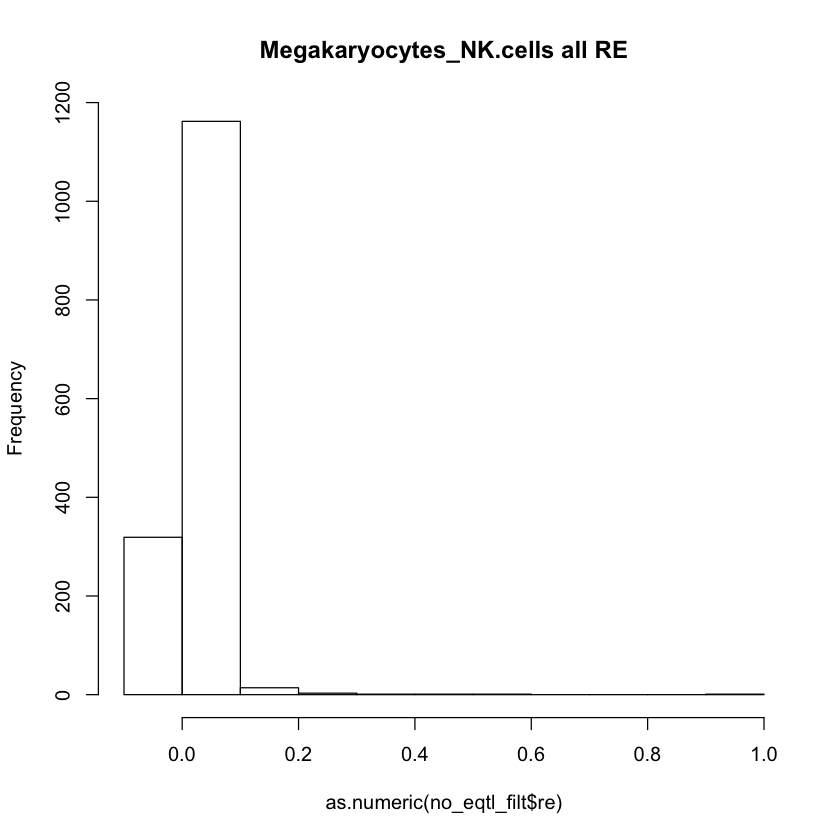

NULL


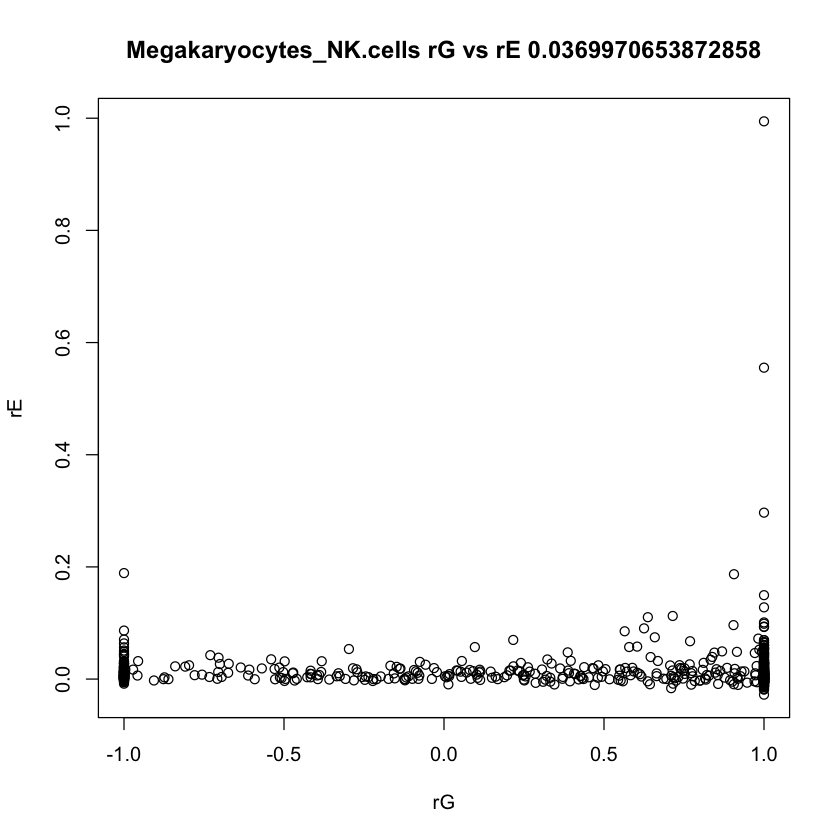

                cell_pair    gene      sg1      se1      sg2      se2        rg
1 Megakaryocytes_NK.cells    ADD1 0.007019  0.00877 0.000677 0.002333         1
2 Megakaryocytes_NK.cells   AFAP1 0.000277 0.007114 0.000323 0.001178         1
3 Megakaryocytes_NK.cells     AGA 0.013146  0.00998 0.001456 0.004919         1
4 Megakaryocytes_NK.cells  AGPAT9 0.003288 0.005537 0.000454 0.000508 -0.364414
5 Megakaryocytes_NK.cells  ANAPC4 0.000266 0.005784 0.003587 0.005154        -1
6 Megakaryocytes_NK.cells ANKRD37 0.008331 0.007118  0.00222 0.004816         1
         re     rg_se
1  0.009242  1.619119
2  0.002387 13.294101
3  0.000308   1.61061
4 -0.000893  0.942271
5  0.005792 11.424495
6  0.000216  1.094792
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"             "0.28172499463807"
[1] "median"    "0.9132475"
[1] "var"               "0.741379066981926"
[1] "in 0,1 range" "970"          "of"           "1492"        
[1] "rE info"
[1] "min"       "-0.035644"
[1] "max"      "0.99

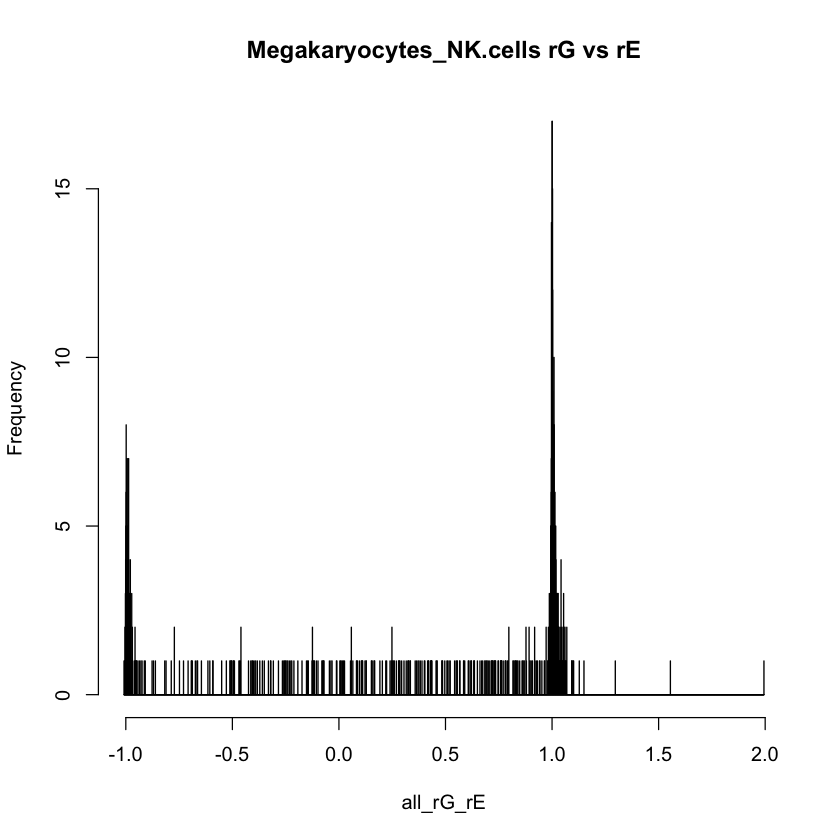

NULL


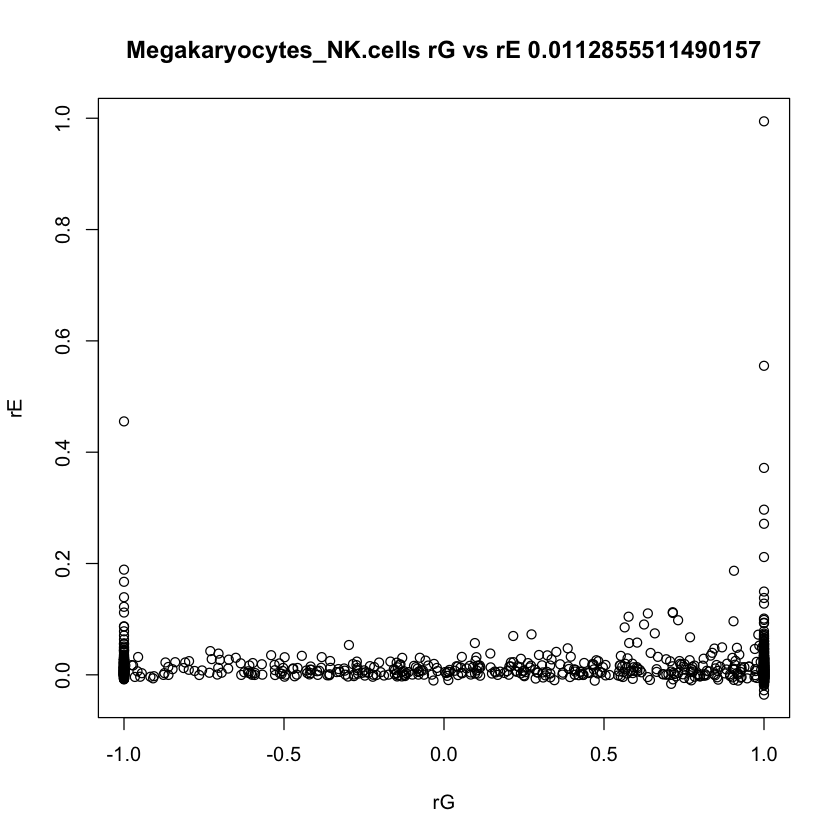

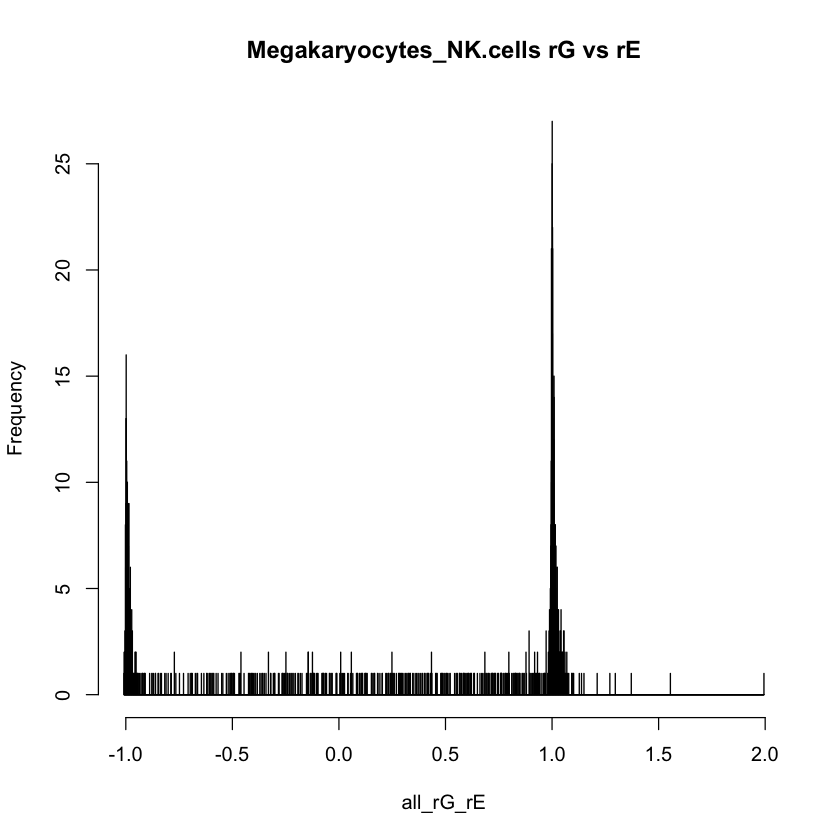

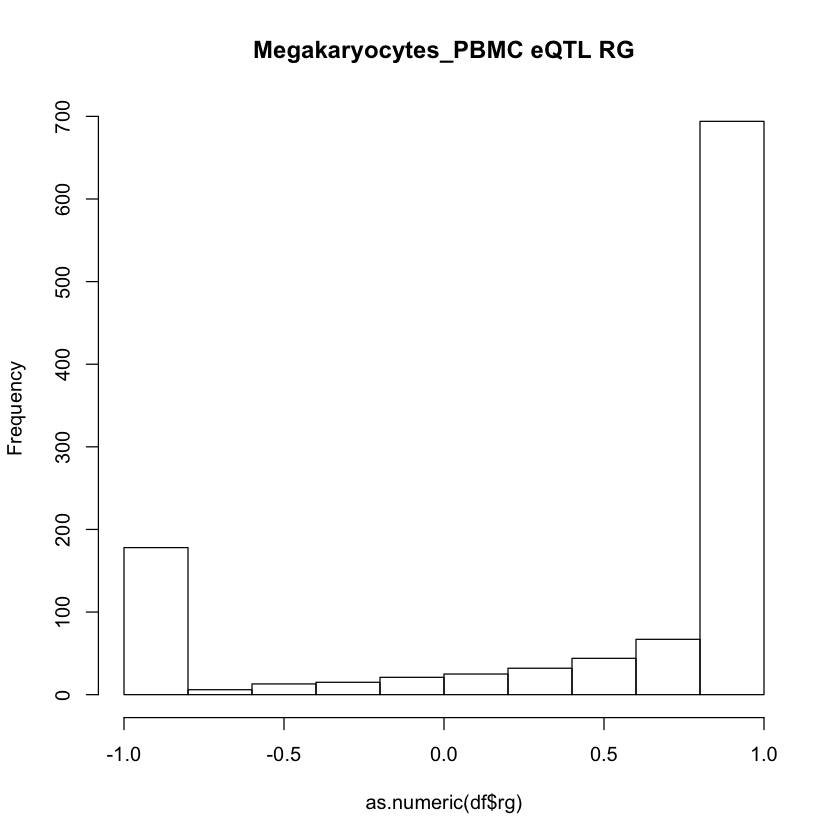

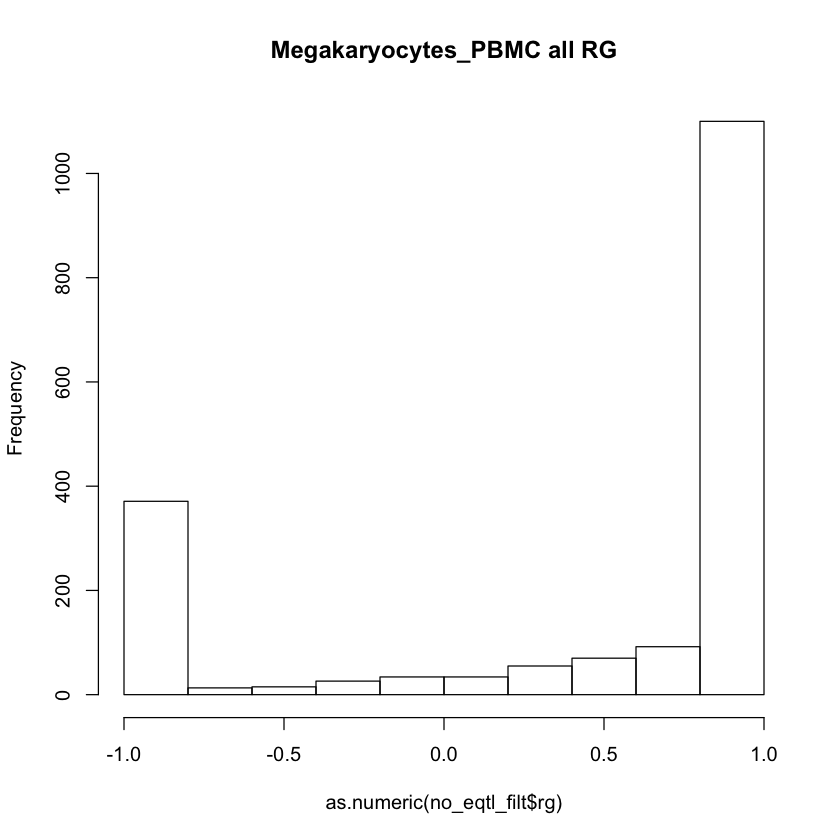

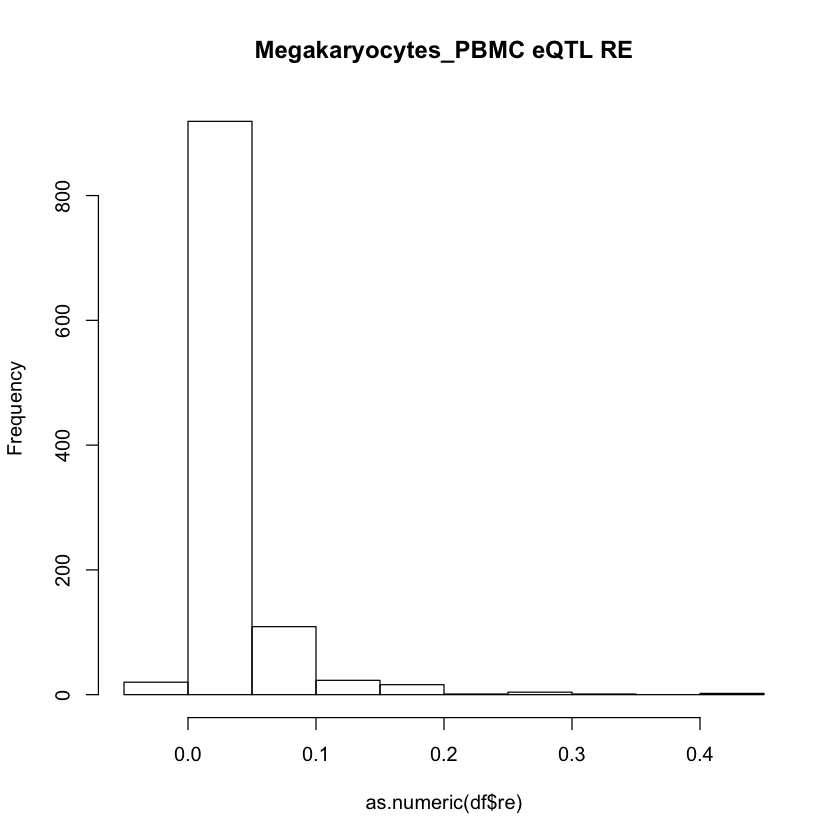

    gene           cell_pair      sg1      se1      sg2      se2       rg
1  AAED1 Megakaryocytes_PBMC 0.008126 0.010061 0.001778  0.00277 0.558239
2  AAGAB Megakaryocytes_PBMC 0.007877 0.008891 0.006693 0.003457 0.103543
3   ABAT Megakaryocytes_PBMC 0.015007 0.010212  0.01155 0.006825 0.451333
4  ABCA1 Megakaryocytes_PBMC        0 0.003102        0 0.007857       -1
5  ABCC4 Megakaryocytes_PBMC 0.016706 0.014913 0.006946  0.00574        1
6 ABHD13 Megakaryocytes_PBMC 0.000295 0.007825 0.001597 0.001731        1
        re         rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes
1 0.026995      0.736368               0           0                 0
2 0.006478      0.541887               0           0                 0
3 0.005757      0.397759               0           0                 1
4  0.04544 139094.284751               0           0                 0
5 0.023038      0.303287               0           0                 0
6 0.019921     11.332048               0           0    

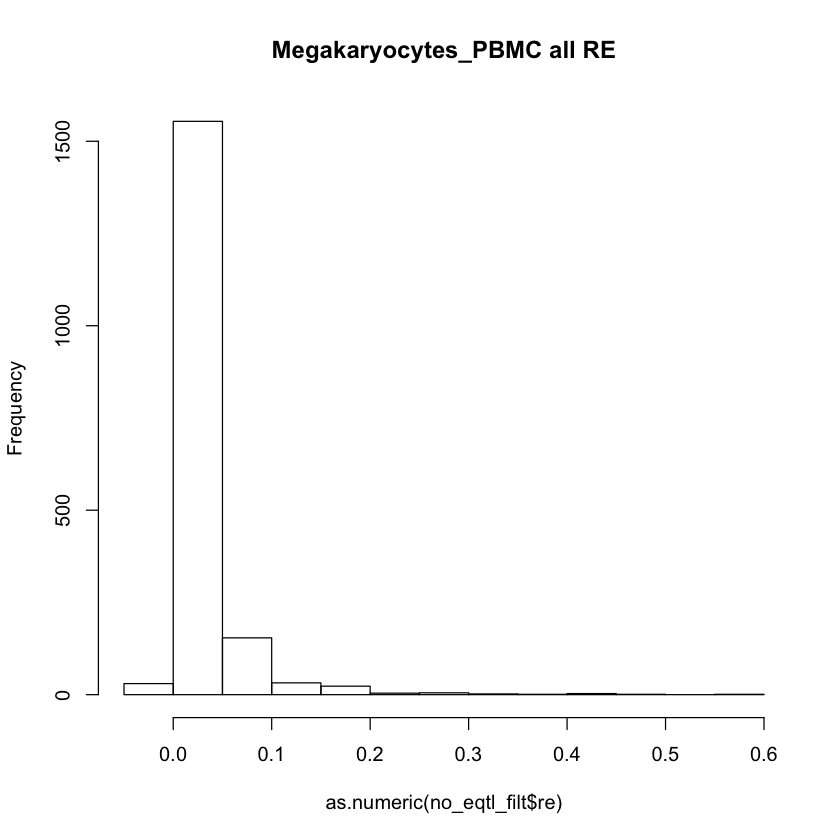

NULL


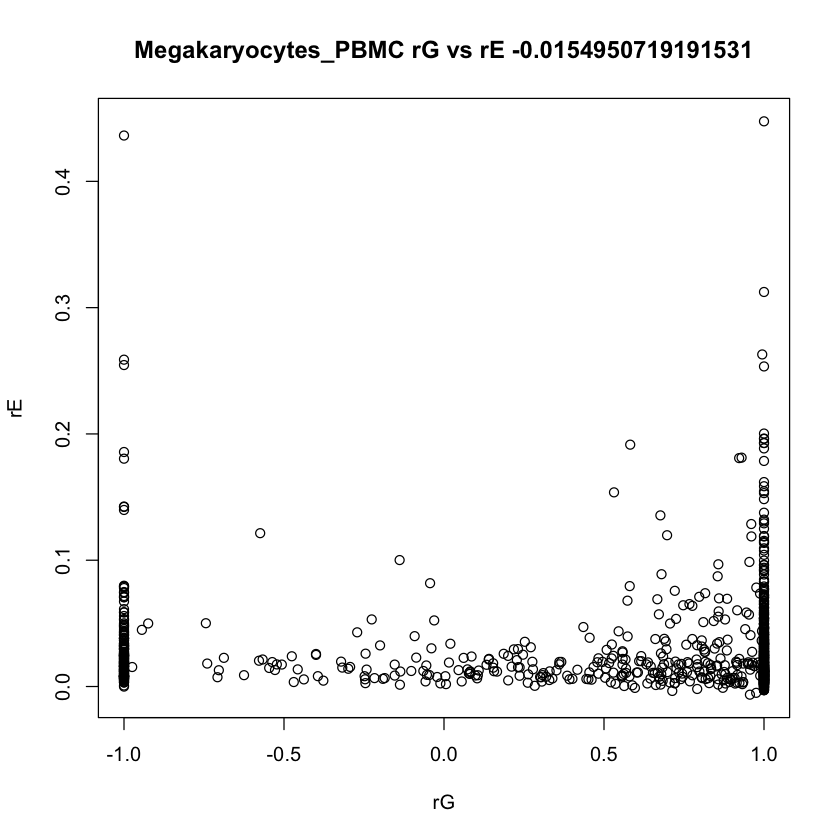

            cell_pair   gene      sg1      se1      sg2      se2        rg
1 Megakaryocytes_PBMC  ABCE1 0.010167 0.010134 0.000442 0.000982         1
2 Megakaryocytes_PBMC   ADD1 0.004782 0.007756 0.000302 0.000819 -0.293351
3 Megakaryocytes_PBMC   ADH5 0.000212 0.003971 0.000675 0.001291        -1
4 Megakaryocytes_PBMC    AGA 0.018674 0.011433 0.010764 0.005132  0.674492
5 Megakaryocytes_PBMC AGPAT9 0.003729 0.005722 0.003599 0.007738         1
6 Megakaryocytes_PBMC  AIMP1    2e-06  0.00377 0.001603 0.001337         1
        re       rg_se
1 0.007877    0.850456
2 0.015503    1.755623
3 0.014448    11.17822
4 0.005738     0.27763
5 0.037915    0.779834
6 0.014716 1045.845762
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"              "0.447528475400774"
[1] "median" "1"     
[1] "var"               "0.644876629723211"
[1] "in 0,1 range" "1350"         "of"           "1809"        
[1] "rE info"
[1] "min"       "-0.006456"
[1] "max"      "0.577255"
[1] "mean"               "

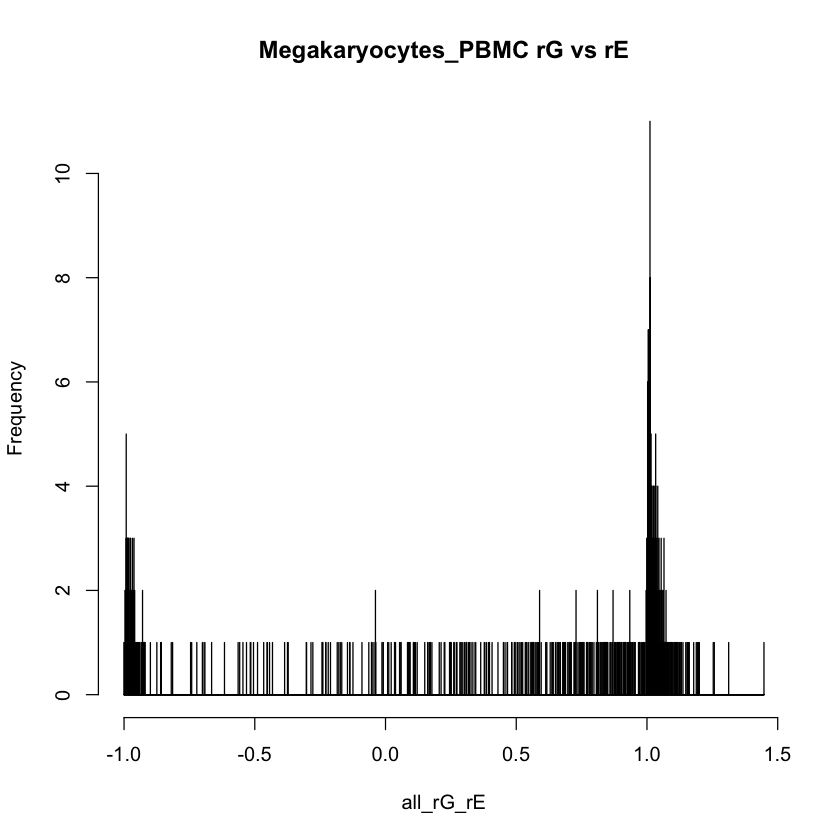

NULL


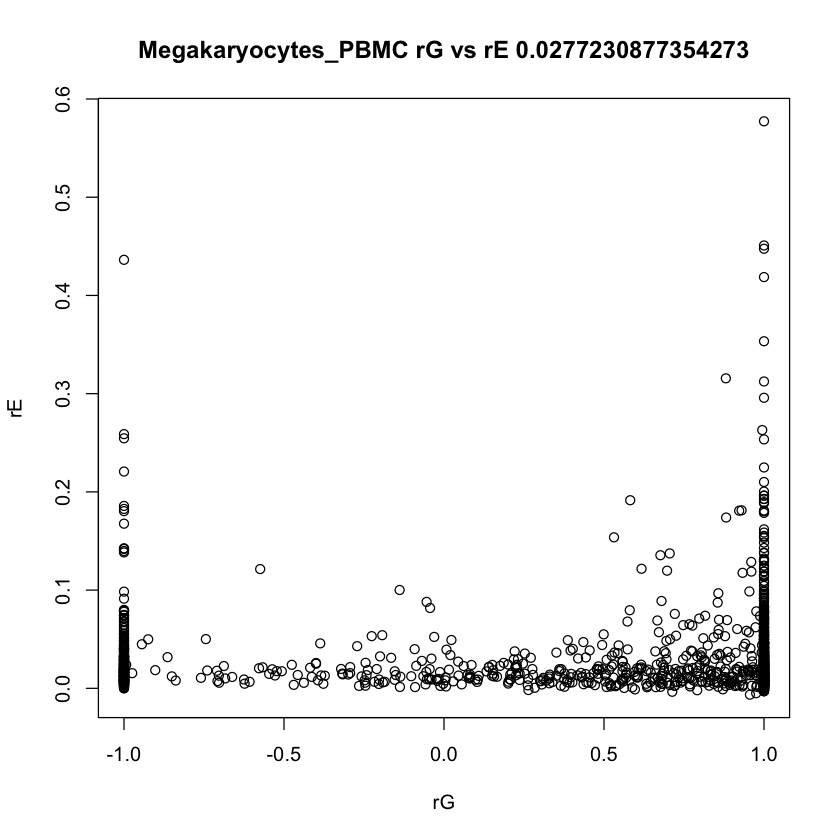

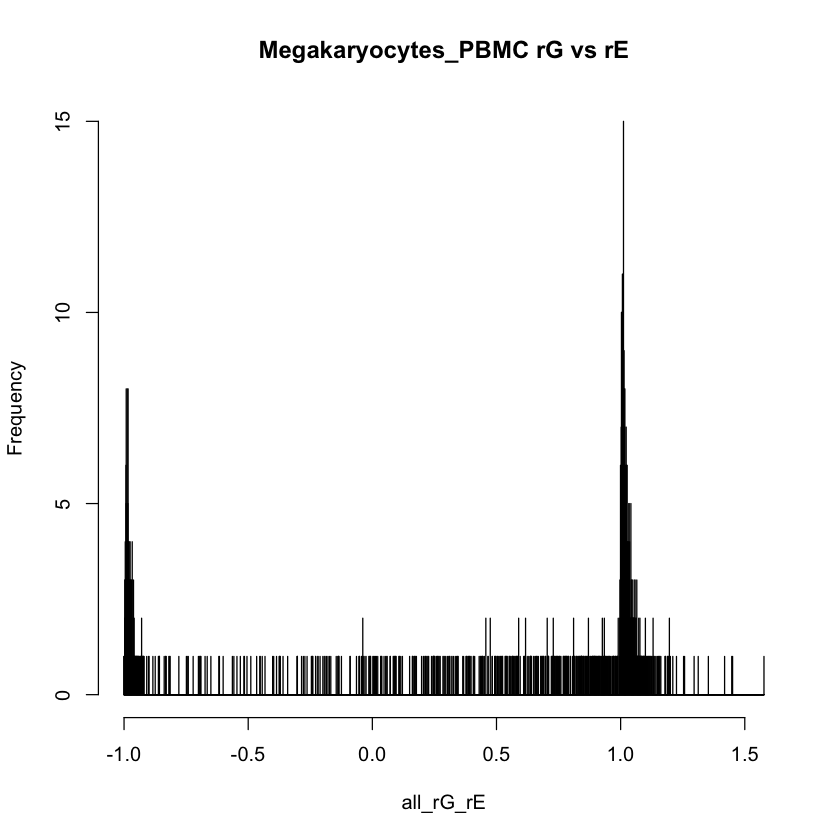

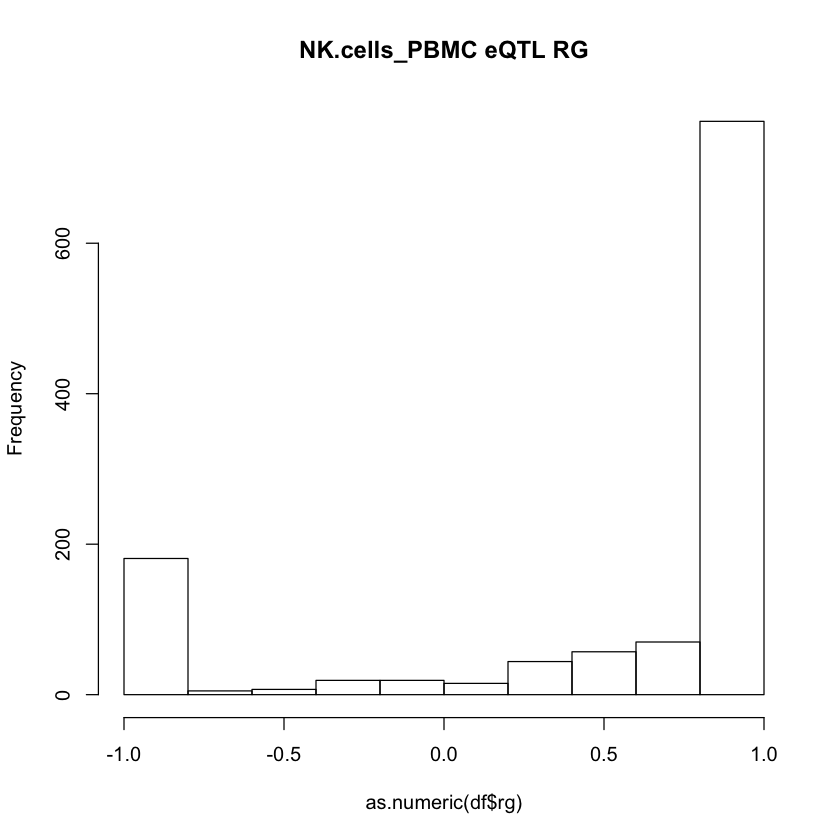

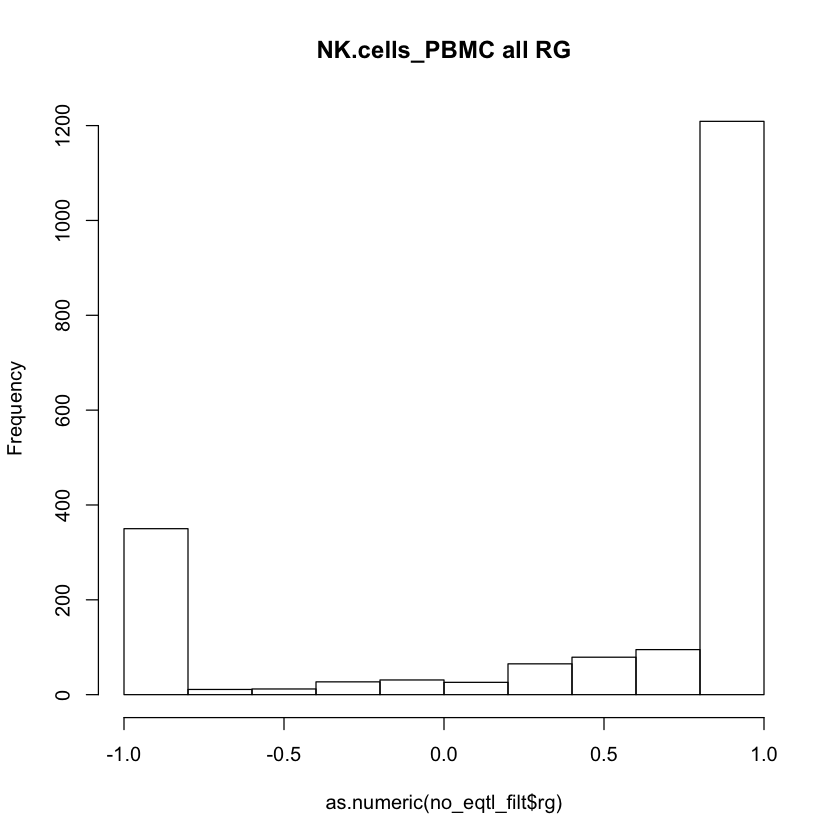

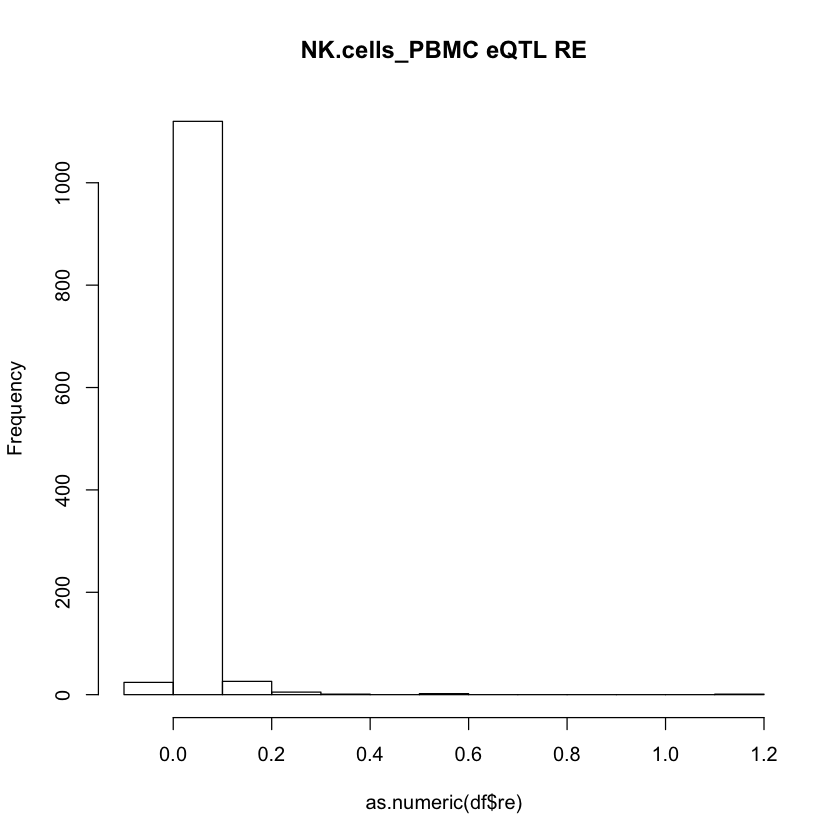

   gene     cell_pair      sg1      se1      sg2      se2       rg       re
1 AAGAB NK.cells_PBMC 0.002452 0.003271 0.005999 0.003222        1 0.004303
2  ABAT NK.cells_PBMC  0.00078 0.002545 0.009921 0.006218        1 0.004081
3 ABCA1 NK.cells_PBMC 0.000197  0.00042  3.2e-05 0.008026        1  0.00718
4 ABCA2 NK.cells_PBMC 0.005951 0.005817  0.00205 0.004149        1  0.01756
5 ABCC3 NK.cells_PBMC 0.001259 0.001858 0.011774 0.011142 0.387592 0.006977
6   ABR NK.cells_PBMC 0.011942 0.008429 0.008222 0.005305 0.876667 0.009175
       rg_se Dendritic.cells CD8.T.cells FCGR3A..Monocytes Megakaryocytes
1   0.463386               0           0                 0              0
2   1.447032               0           0                 1              0
3 119.509128               0           0                 0              0
4   0.670441               0           0                 0              0
5   0.768072               0           0                 1              0
6   0.279307            

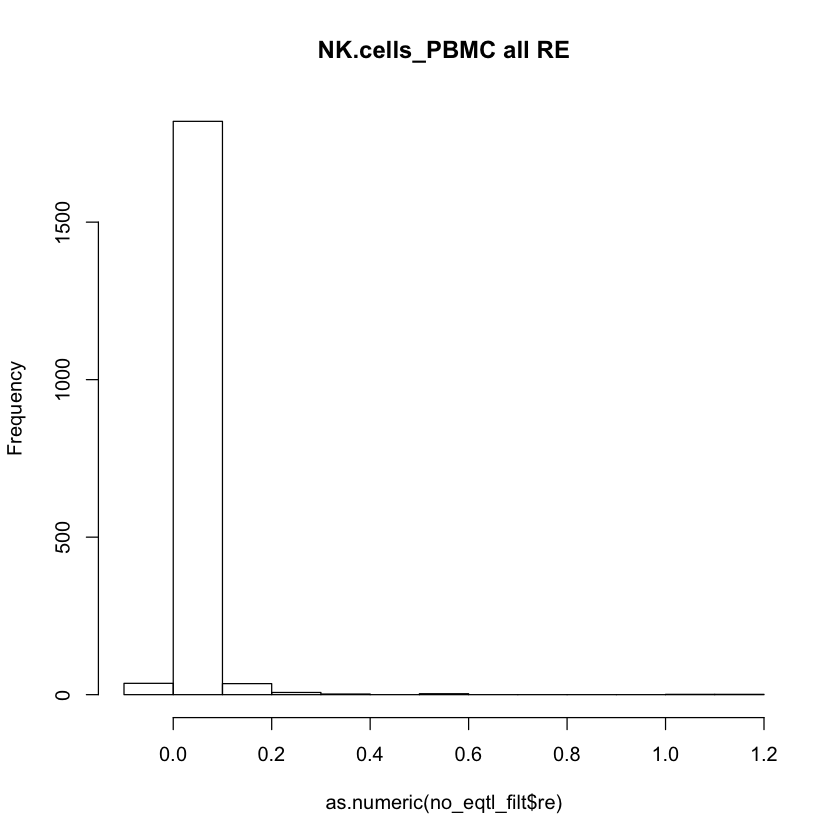

NULL


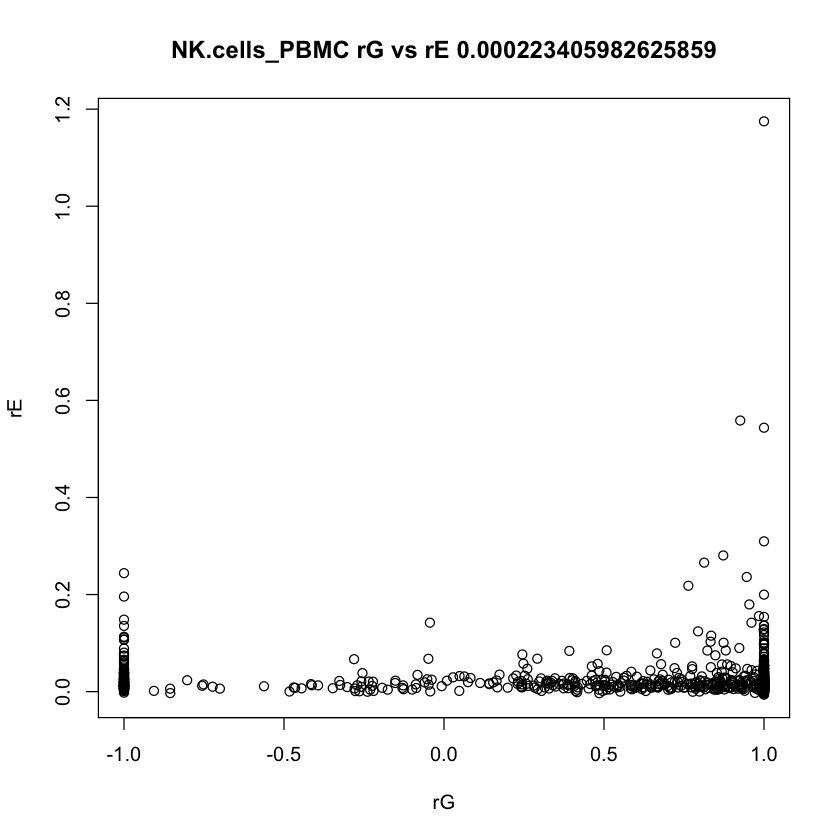

      cell_pair   gene      sg1      se1      sg2      se2       rg        re
1 NK.cells_PBMC  ACOX3        0 0.002308        0 0.002826       -1  0.015426
2 NK.cells_PBMC  ACSL1 0.001683 0.003636 0.015014 0.022203 0.998647 -0.004103
3 NK.cells_PBMC    AGA 0.001549 0.004853 0.009303 0.004776        1  0.013377
4 NK.cells_PBMC  AIMP1 0.001599 0.002721  0.00153 0.001325        1  0.012496
5 NK.cells_PBMC  ALPK1 0.000427 0.000919 0.000981 0.002757        1  0.002016
6 NK.cells_PBMC ANAPC4 0.007424 0.006826 0.001133 0.001953        1  0.010947
          rg_se
1 117688.842398
2      1.240777
3      1.204795
4      0.412598
5      1.764889
6      0.583151
[1] "rG info"
[1] "min" "-1" 
[1] "max" "1"  
[1] "mean"             "0.49971113878628"
[1] "median" "1"     
[1] "var"               "0.596559804749206"
[1] "in 0,1 range" "1468"         "of"           "1895"        
[1] "rE info"
[1] "min"       "-0.008445"
[1] "max"      "1.174905"
[1] "mean"              "0.024323873878628"
[1] "median"

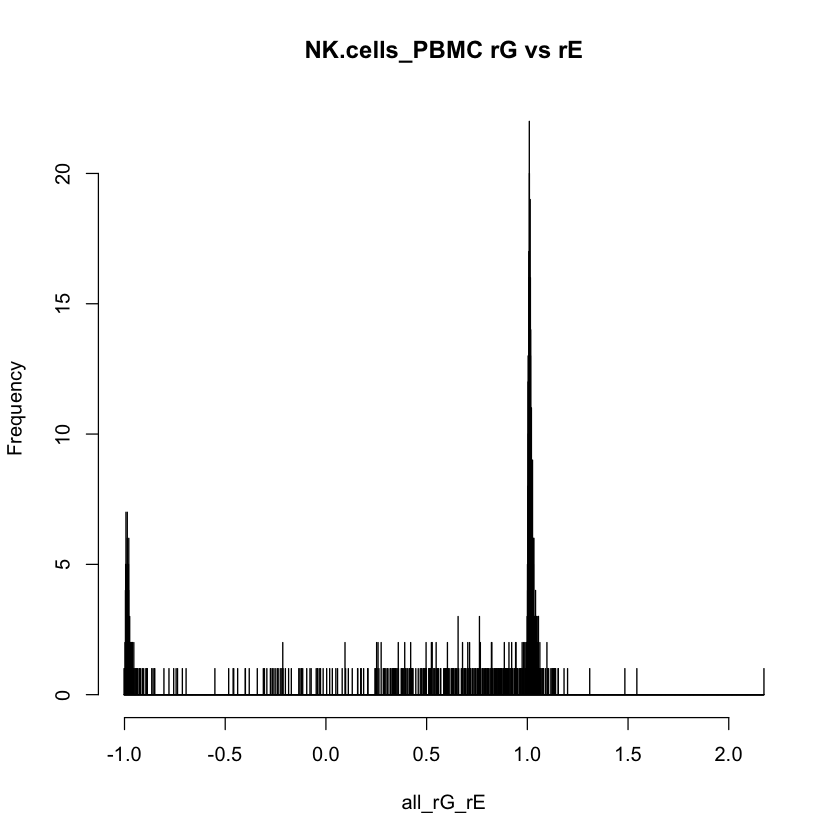

NULL


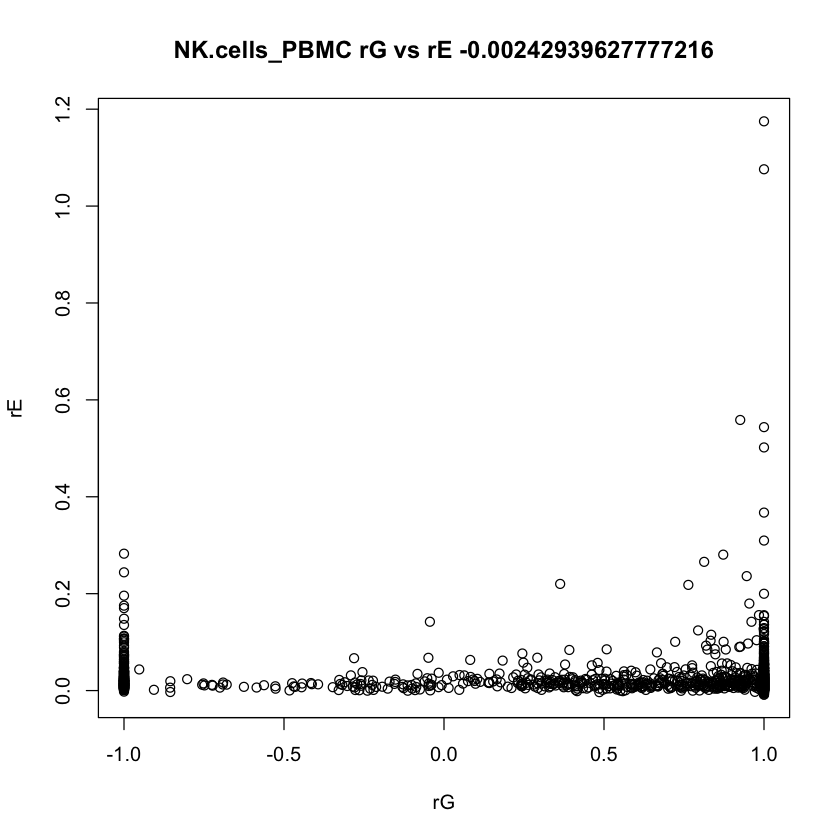

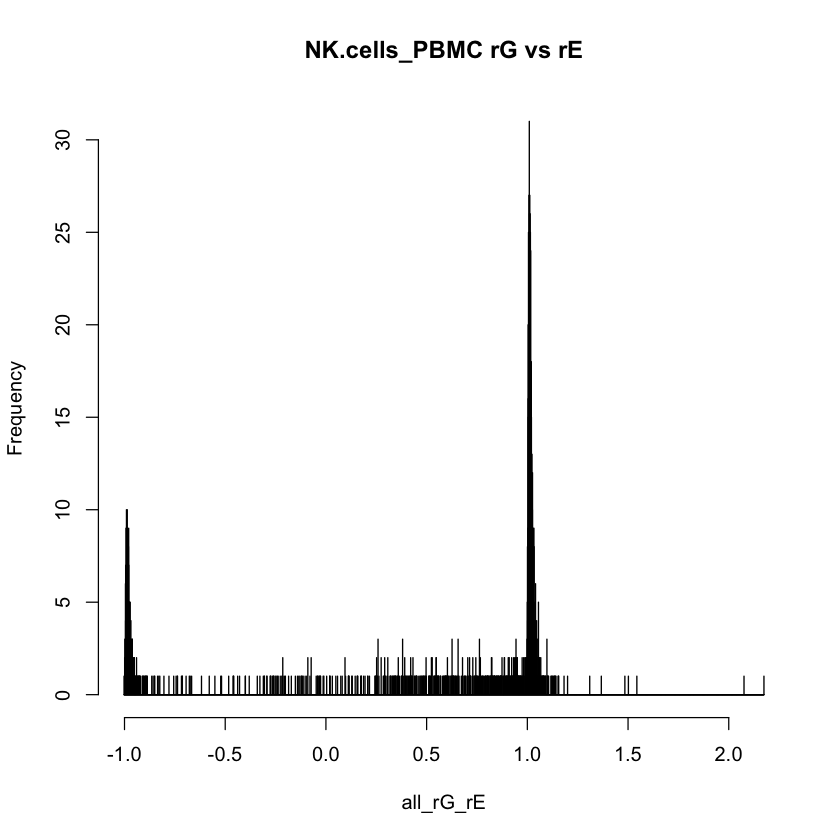

In [13]:
final=c()
all_final=c()
nofilt_eqtl_final=c()
nofilt_eqtl_all_final=c()
se=2

for(cell in pairs){
    outdf=cell_type_filter(gcta_std,cell)
    df_eqtls=merge_eqtl_annots(outdf,filtered_eqtls)
    df=filter_std_err_rg(df_eqtls,se)
    no_eqtl_filt=filter_std_err_rg(outdf,se)
    
    hist(as.numeric(df$rg),main=paste(cell,"eQTL RG"))
    hist(as.numeric(no_eqtl_filt$rg),main=paste(cell,"all RG"))
    hist(as.numeric(df$re),main=paste(cell,"eQTL RE"))
    hist(as.numeric(no_eqtl_filt$re),main=paste(cell,"all RE"))
    
    all_final=rbind(all_final,as.data.frame(df))
    nofilt_eqtl_all_final=rbind(nofilt_eqtl_all_final,as.data.frame(no_eqtl_filt))
    gcta_outs=as.data.frame(plot_cell_cell_scatter_hist(df,se,cell))
    all_gcta_outs=as.data.frame(plot_cell_cell_scatter_hist(no_eqtl_filt,se,cell))

    final=rbind(final,gcta_outs)
    nofilt_eqtl_final=rbind(nofilt_eqtl_final,all_gcta_outs)
    
    #if(exists("final")==FALSE){
    #    print('in')
    #    final=as.data.frame(gcta_outs)
    #}
    #else{
    #    final=rbind(final,gcta_outs)
    #}
}



In [14]:
rg_inverse_var<-function(df){
    raw=as.numeric(df$rg)
    print(head(raw))
    print(min((raw)))
    print(max((raw)))
    print(mean((raw)))
    print('w')
    #weighted=(as.numeric(df$rg)/sqrt(as.numeric(df$rg_se)))
    weighted=(as.numeric(df$rg)/var(as.numeric(df$rg)))
    print(head(weighted))
    print(min(weighted))
    print(max(weighted))
    print(mean(weighted))
    #print(c('avg',mean(as.numeric(df$rg))/var(as.numeric(df$rg))))
    print(c('avg2',mean(as.numeric(df$rg))/sqrt(as.numeric(df$rg_se))))
    #print(head(as.numeric(df$rg)/var(as.numeric(df$rg))))
    #print(head(as.numeric(df$rg)/(as.numeric(df$rg_se))))
}
#print('filtered')
#rg_inverse_var(df)
for(p in pairs){
    print(p)
    outdf=cell_type_filter(gcta_std,p)
    rg_inverse_var(outdf)
}



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
head(final)
head(all_final)
dim(final)
dim(all_final)

head(nofilt_eqtl_final)
head(nofilt_eqtl_all_final)
dim(nofilt_eqtl_final)
dim(nofilt_eqtl_all_final)

cell,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.411585362048894,0.610182900738897,0.016908299185099,0.00214383351745199,0.428493661233993
B.cells_CD4.T.cells,0.462819400243803,0.603548513538475,0.0190122950020317,0.00108139222404952,0.481831695245835
B.cells_CD8.T.cells,0.440160008746356,0.624870084440659,0.0196225922532278,0.00132769978948409,0.459782600999584
B.cells_Dendritic.cells,0.349553757281553,0.69173032416997,0.0167850374479889,0.00200744979046529,0.366338794729542
B.cells_FCGR3A+.Monocytes,0.339826090716405,0.677605368193126,0.0158044857990674,0.00151127642441784,0.355630576515473
B.cells_Megakaryocytes,0.314281305680793,0.7375067423897,0.0179325130748422,0.00168458673110245,0.332213818755636


gene,cell_pair,sg1,se1,sg2,se2,rg,re,rg_se,Dendritic.cells,CD8.T.cells,FCGR3A..Monocytes,Megakaryocytes,CD4.T.cells,NK.cells,B.cells,CD14..Monocytes
A1BG,B.cells_CD14+.Monocytes,0.01517,0.009632,0.028167,0.016146,0.75935,0.041462,0.212675,0,1,1,0,0,0,1,1
AAED1,B.cells_CD14+.Monocytes,0.007936,0.010167,0.001736,0.002607,0.786901,0.034356,0.520903,0,0,0,0,1,0,0,0
AAGAB,B.cells_CD14+.Monocytes,0.003933,0.004815,0.012858,0.006287,0.773954,0.002871,0.476399,0,0,0,0,0,0,0,1
AASDH,B.cells_CD14+.Monocytes,0.000191,0.004039,0.002972,0.003821,-1,0.016548,12.084689,0,0,1,0,0,0,0,1
ABAT,B.cells_CD14+.Monocytes,0.010254,0.007361,0.0072,0.006157,0.92917,0.005954,0.382239,0,0,1,0,0,0,0,1
ABCA1,B.cells_CD14+.Monocytes,0.013921,0.011571,0.002287,0.0099,1,0.028655,1.78687,0,0,0,0,0,0,1,0


[1] 36  6

[1] 75418    17

cell,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.356160905939394,0.67808661161935,0.0171740766060606,0.00240332068450868,0.373334982545455
B.cells_CD4.T.cells,0.420126084173387,0.653295803336755,0.0199677192540323,0.00184385062110795,0.440093803427419
B.cells_CD8.T.cells,0.376275606578607,0.679270453802946,0.0203091455581456,0.00194419760678451,0.396584752136752
B.cells_Dendritic.cells,0.305501136363636,0.735063500347253,0.01634368351214,0.00197150101367529,0.321844819875776
B.cells_FCGR3A+.Monocytes,0.289982002105817,0.732479342225217,0.015755006317452,0.00207240713514372,0.305737008423269
B.cells_Megakaryocytes,0.25106483934338,0.775119816540684,0.0177488694833154,0.00225363240167906,0.268813708826695


cell_pair,gene,sg1,se1,sg2,se2,rg,re,rg_se
B.cells_CD14+.Monocytes,ABCB10,0.002957,0.003849,7e-06,0.002582,-1,0.008166,182.491092
B.cells_CD14+.Monocytes,ACBD3,0.006643,0.010566,0.015793,0.008542,0.114694,0.044673,0.655568
B.cells_CD14+.Monocytes,ADAM15,0.000972,0.002715,0.005964,0.004883,-0.338779,0.005994,1.167679
B.cells_CD14+.Monocytes,ADAMTSL4,0.00091,0.001027,0.001875,0.002663,-1,-0.001432,0.588608
B.cells_CD14+.Monocytes,ADAR,0.018578,0.013146,0.009543,0.007731,0.865046,0.057786,0.164612
B.cells_CD14+.Monocytes,AGO3,0.001438,0.002894,0.000983,0.001575,1,0.00554,0.860126


[1] 36  6

[1] 121976      9

In [16]:
plot_heatmap<-function(df_outs){
    rG=as.data.frame(cbind(df_outs$cell, as.numeric(df_outs$avg_rG)))
    rE=as.data.frame(cbind(df_outs$cell, as.numeric(df_outs$avg_rE)))
    #print(head(rG))
    #print(head(rE))
    
    colnames(rG)=c('cell_pair','rg')
    colnames(rE)=c('cell_pair','re')
    
    mat_rG=matrix(0,9,9)
    mat_rE=matrix(0,9,9)
    cells =(unique(unlist(strsplit(as.character(rG$cell_pair),"_",fixed=TRUE))))
    rownames(mat_rG)=cells
    colnames(mat_rG)=cells
    rownames(mat_rE)=cells
    colnames(mat_rE)=cells
    
    for(c in cells){
        mat_rG[c,c]=1
        mat_rE[c,c]=1
    }
    
    iter=1
    for(p in pairs){
        val_rg=(rG$rg[iter])
        val_rE=(rE$re[iter])
        
        name=(unlist(strsplit(as.character(p),"_",fixed=TRUE)))
        r=(name[1])
        c=(name[2])

        mat_rG[r,c]=as.numeric(val_rg)
        mat_rG[c,r]=as.numeric(val_rg)
        mat_rE[r,c]=as.numeric(val_rE)
        mat_rE[c,r]=as.numeric(val_rE)
        
        iter=iter+1
    }
    
    #drop PBMCs and Megakaryocytes
    mat1_rG=mat_rG[,-9]
    mat2_rG=mat1_rG[-9,]
    mat1_rG=mat2_rG[,-7]
    mat2_rG=mat1_rG[-7,]
    
    mat1_rE=mat_rE[,-9]
    mat2_rE=mat1_rE[-9,]
    mat1_rE=mat2_rE[,-7]
    mat2_rE=mat1_rE[-7,]
    
    #uncomment for all cells
    #mat2_rG=mat_rG
    #mat2_rE=mat_rE
    
    #print(mat2_rG)
    #print(mat2_rE)
    diag(mat2_rG)=NA
    o=pheatmap(mat2_rG,breaks=seq(0, 1, by = 0.02), cluster_col = T, cluster_row = T)
    print(o)
    o=pheatmap(mat2_rG, cluster_col = T, cluster_row = T)
    print(o)
    save_pheatmap_pdf(o,"/Users/marygordon/Documents/YeLab/scMPRA/Writeups/figures/GCTA_rG.pdf")
    dat <- mat2_rG
    row.order <- hclust(dist(mat2_rG))$order
    col.order <- hclust(dist(t(mat2_rG)))$order
    row.order2 <- hclust(dist(mat2_rE))$order
    col.order2 <- hclust(dist(t(mat2_rE)))$order
   
    #cluster mat
    rname=c()
    for(i in row.order){
        #print(i)
        rname=c(rname,(rownames(mat2_rE)[i]))
    }
    #cluster by rG
    mat2_rG=mat2_rG[row.order, col.order]
    
    rownames(mat2_rG)=rname
    colnames(mat2_rG)=rname
    
    #order based on rG order
    mat2_rE=mat2_rE[row.order, col.order]
    rownames(mat2_rE)=rname
    colnames(mat2_rE)=rname

    
    mat2_rG[lower.tri(mat2_rG)] = mat2_rE[lower.tri(mat2_rE)]
    rownames(mat2_rG)=rname
    colnames(mat2_rG)=rname
    #rownames(mat2_rG)=rownames(mat2_rG)[row.order]
    #colnames(mat2_rG)=colnames(mat2_rG)[row.order]
    diag(mat2_rG)=NA
    #print('lower tri')
    #print(lower.tri(mat2_rE))
    #print('final')
    #print(mat2_rG)
    
    #p=pheatmap(mat2,breaks=seq(.9, 1, by = 0.005))
    #p=pheatmap(mat2,breaks=seq(.85, 1, by = 0.01))
    #p=pheatmap(mat2,breaks=seq(-0.2, 0.2, by = 0.005))
    #p=pheatmap(mat2_rG,breaks=seq(0, 1, by = 0.01))
    #p=pheatmap(mat2_rG,breaks=seq(-0.2, 1, by = 0.02), cluster_col = F, cluster_row = F)
    p=pheatmap(mat2_rG, cluster_col = F, cluster_row = F)
    print(p)
    save_pheatmap_pdf(p,"/Users/marygordon/Documents/YeLab/scMPRA/Writeups/figures/GCTA_rG_rE.pdf")

}

In [17]:
save_pheatmap_pdf <- function(x, filename, width=7, height=7) {
   stopifnot(!missing(x))
   stopifnot(!missing(filename))
   pdf(filename, width=width, height=height)
   grid::grid.newpage()
   grid::grid.draw(x$gtable)
   dev.off()
}

                                cell            avg_rG            var_rG
1            B.cells_CD14+.Monocytes 0.411585362048894 0.610182900738897
2                B.cells_CD4.T.cells 0.462819400243803 0.603548513538475
3                B.cells_CD8.T.cells 0.440160008746356 0.624870084440659
4            B.cells_Dendritic.cells 0.349553757281553  0.69173032416997
5          B.cells_FCGR3A+.Monocytes 0.339826090716405 0.677605368193126
6             B.cells_Megakaryocytes 0.314281305680793   0.7375067423897
7                   B.cells_NK.cells 0.383812168881269 0.652298460138497
8                       B.cells_PBMC 0.540247584570808 0.537388114355578
9        CD14+.Monocytes_CD4.T.cells 0.387284521047046 0.634932316704681
10       CD14+.Monocytes_CD8.T.cells 0.340199254552076 0.668053470848901
11   CD14+.Monocytes_Dendritic.cells 0.385074313953488 0.684730134287369
12 CD14+.Monocytes_FCGR3A+.Monocytes 0.511789047459893 0.597092234243137
13    CD14+.Monocytes_Megakaryocytes 0.272154841603

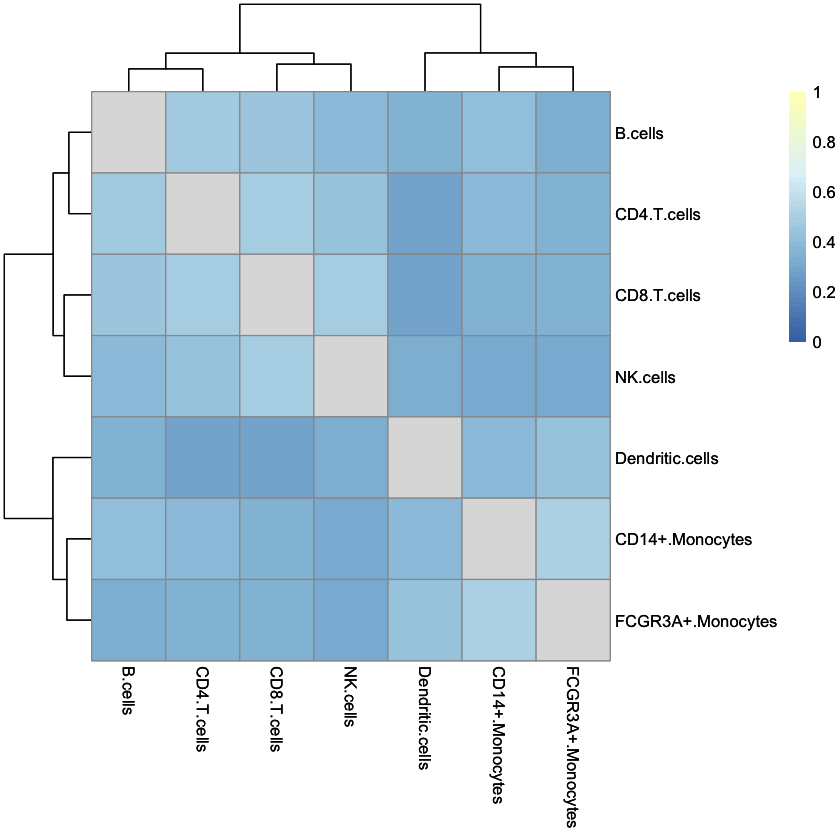

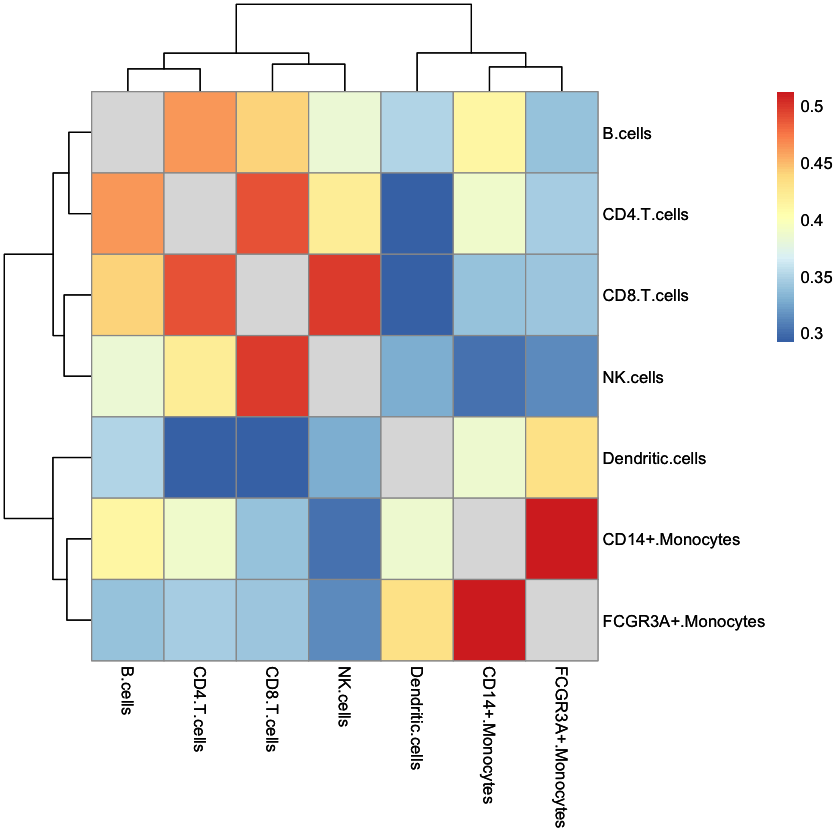

pdf 
  2

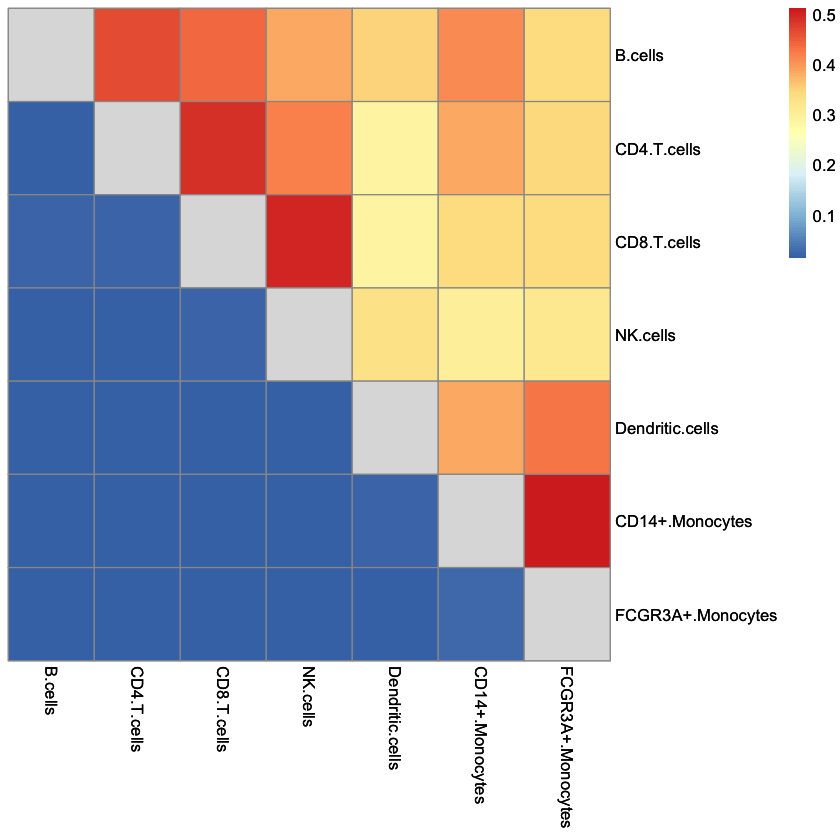

In [18]:
print(final)
plot_heatmap(final)

In [19]:

#plot_heatmap(nofilt_eqtl_final)

In [22]:
head(final)
final2 <- final[,-1]
rownames(final2) <- final[,1]
head(final2)
nofilt_eqtl_final2 <- nofilt_eqtl_final[,-1]
rownames(nofilt_eqtl_final2) <- nofilt_eqtl_final[,1]
write.table(final2,"GCTA.std.avg.h2.txt",col.names=TRUE,quote = FALSE,sep='\t')


head(nofilt_eqtl_final2)
final3=data.matrix(final2, rownames.force = NA)
nofilt_eqtl_final3=data.matrix(nofilt_eqtl_final2, rownames.force = NA)

difouts=as.data.frame(final3-nofilt_eqtl_final3)
difouts$cell=rownames(difouts)
print(difouts)
#plot_heatmap(difouts)

cell,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.411585362048894,0.610182900738897,0.016908299185099,0.00214383351745199,0.428493661233993
B.cells_CD4.T.cells,0.462819400243803,0.603548513538475,0.0190122950020317,0.00108139222404952,0.481831695245835
B.cells_CD8.T.cells,0.440160008746356,0.624870084440659,0.0196225922532278,0.00132769978948409,0.459782600999584
B.cells_Dendritic.cells,0.349553757281553,0.69173032416997,0.0167850374479889,0.00200744979046529,0.366338794729542
B.cells_FCGR3A+.Monocytes,0.339826090716405,0.677605368193126,0.0158044857990674,0.00151127642441784,0.355630576515473
B.cells_Megakaryocytes,0.314281305680793,0.7375067423897,0.0179325130748422,0.00168458673110245,0.332213818755636


,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.411585362048894,0.610182900738897,0.016908299185099,0.00214383351745199,0.428493661233993
B.cells_CD4.T.cells,0.462819400243803,0.603548513538475,0.0190122950020317,0.00108139222404952,0.481831695245835
B.cells_CD8.T.cells,0.440160008746356,0.624870084440659,0.0196225922532278,0.00132769978948409,0.459782600999584
B.cells_Dendritic.cells,0.349553757281553,0.69173032416997,0.0167850374479889,0.00200744979046529,0.366338794729542
B.cells_FCGR3A+.Monocytes,0.339826090716405,0.677605368193126,0.0158044857990674,0.00151127642441784,0.355630576515473
B.cells_Megakaryocytes,0.314281305680793,0.7375067423897,0.0179325130748422,0.00168458673110245,0.332213818755636


,avg_rG,var_rG,avg_rE,var_rE,V6
B.cells_CD14+.Monocytes,0.356160905939394,0.67808661161935,0.0171740766060606,0.00240332068450868,0.373334982545455
B.cells_CD4.T.cells,0.420126084173387,0.653295803336755,0.0199677192540323,0.00184385062110795,0.440093803427419
B.cells_CD8.T.cells,0.376275606578607,0.679270453802946,0.0203091455581456,0.00194419760678451,0.396584752136752
B.cells_Dendritic.cells,0.305501136363636,0.735063500347253,0.01634368351214,0.00197150101367529,0.321844819875776
B.cells_FCGR3A+.Monocytes,0.289982002105817,0.732479342225217,0.015755006317452,0.00207240713514372,0.305737008423269
B.cells_Megakaryocytes,0.25106483934338,0.775119816540684,0.0177488694833154,0.00225363240167906,0.268813708826695


                                      avg_rG      var_rG        avg_rE
B.cells_CD14+.Monocytes           0.05542446 -0.06790371 -2.657774e-04
B.cells_CD4.T.cells               0.04269332 -0.04974729 -9.554243e-04
B.cells_CD8.T.cells               0.06388440 -0.05440037 -6.865533e-04
B.cells_Dendritic.cells           0.04405262 -0.04333318  4.413539e-04
B.cells_FCGR3A+.Monocytes         0.04984409 -0.05487397  4.947948e-05
B.cells_Megakaryocytes            0.06321647 -0.03761307  1.836436e-04
B.cells_NK.cells                  0.05503323 -0.05520580 -9.406927e-04
B.cells_PBMC                      0.04877438 -0.06815039 -8.470639e-04
CD14+.Monocytes_CD4.T.cells       0.05130654 -0.06491488 -9.574795e-04
CD14+.Monocytes_CD8.T.cells       0.07486765 -0.07236337 -3.769799e-04
CD14+.Monocytes_Dendritic.cells   0.08682539 -0.07919436  3.396809e-04
CD14+.Monocytes_FCGR3A+.Monocytes 0.08080796 -0.08131829  6.808488e-04
CD14+.Monocytes_Megakaryocytes    0.09418988 -0.06811912  1.287178e-03
CD14+.

In [21]:
##write all outs to csv
head(all_final)
write.table(all_final,"GCTA.std.eqtl.genes.h2.txt",col.names=TRUE,quote = FALSE,sep='\t')

head(nofilt_eqtl_all_final)
write.table(nofilt_eqtl_all_final,"GCTA.std.all.genes.h2.txt",col.names=TRUE,quote = FALSE,sep='\t')

gene,cell_pair,sg1,se1,sg2,se2,rg,re,rg_se,Dendritic.cells,CD8.T.cells,FCGR3A..Monocytes,Megakaryocytes,CD4.T.cells,NK.cells,B.cells,CD14..Monocytes
A1BG,B.cells_CD14+.Monocytes,0.01517,0.009632,0.028167,0.016146,0.75935,0.041462,0.212675,0,1,1,0,0,0,1,1
AAED1,B.cells_CD14+.Monocytes,0.007936,0.010167,0.001736,0.002607,0.786901,0.034356,0.520903,0,0,0,0,1,0,0,0
AAGAB,B.cells_CD14+.Monocytes,0.003933,0.004815,0.012858,0.006287,0.773954,0.002871,0.476399,0,0,0,0,0,0,0,1
AASDH,B.cells_CD14+.Monocytes,0.000191,0.004039,0.002972,0.003821,-1,0.016548,12.084689,0,0,1,0,0,0,0,1
ABAT,B.cells_CD14+.Monocytes,0.010254,0.007361,0.0072,0.006157,0.92917,0.005954,0.382239,0,0,1,0,0,0,0,1
ABCA1,B.cells_CD14+.Monocytes,0.013921,0.011571,0.002287,0.0099,1,0.028655,1.78687,0,0,0,0,0,0,1,0


cell_pair,gene,sg1,se1,sg2,se2,rg,re,rg_se
B.cells_CD14+.Monocytes,ABCB10,0.002957,0.003849,7e-06,0.002582,-1,0.008166,182.491092
B.cells_CD14+.Monocytes,ACBD3,0.006643,0.010566,0.015793,0.008542,0.114694,0.044673,0.655568
B.cells_CD14+.Monocytes,ADAM15,0.000972,0.002715,0.005964,0.004883,-0.338779,0.005994,1.167679
B.cells_CD14+.Monocytes,ADAMTSL4,0.00091,0.001027,0.001875,0.002663,-1,-0.001432,0.588608
B.cells_CD14+.Monocytes,ADAR,0.018578,0.013146,0.009543,0.007731,0.865046,0.057786,0.164612
B.cells_CD14+.Monocytes,AGO3,0.001438,0.002894,0.000983,0.001575,1,0.00554,0.860126
